In [6]:
# 导入相关的库
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
# from pandas_profiling import ProfileReport
import missingno as msno
from tqdm import tqdm
from time import time
import lightgbm as lgb
%matplotlib inline

ModuleNotFoundError: No module named 'missingno'

In [5]:
#导入训练集
train_datas = pd.read_csv('train.csv',parse_dates=[2],low_memory=False) #第2列解析为日期
train_datas.head().append(train_datas.tail())

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday
0,1,5,2015-07-31,5263,555,1,1,0,1
1,2,5,2015-07-31,6064,625,1,1,0,1
2,3,5,2015-07-31,8314,821,1,1,0,1
3,4,5,2015-07-31,13995,1498,1,1,0,1
4,5,5,2015-07-31,4822,559,1,1,0,1
1017204,1111,2,2013-01-01,0,0,0,0,a,1
1017205,1112,2,2013-01-01,0,0,0,0,a,1
1017206,1113,2,2013-01-01,0,0,0,0,a,1
1017207,1114,2,2013-01-01,0,0,0,0,a,1
1017208,1115,2,2013-01-01,0,0,0,0,a,1


In [2]:
#导入测试集
test_datas = pd.read_csv('test.csv',parse_dates=[3])
test_datas.head().append(test_datas.tail())

,Id,Store,DayOfWeek,Date,Open,Promo,StateHoliday,SchoolHoliday
0,1,1,4,2015-09-17,1.0,1,0,0
1,2,3,4,2015-09-17,1.0,1,0,0
2,3,7,4,2015-09-17,1.0,1,0,0
3,4,8,4,2015-09-17,1.0,1,0,0
4,5,9,4,2015-09-17,1.0,1,0,0
41083,41084,1111,6,2015-08-01,1.0,0,0,0
41084,41085,1112,6,2015-08-01,1.0,0,0,0
41085,41086,1113,6,2015-08-01,1.0,0,0,0
41086,41087,1114,6,2015-08-01,1.0,0,0,0
41087,41088,1115,6,2015-08-01,1.0,0,0,1


In [5]:
#导入store集
store_datas = pd.read_csv('store.csv')
store_datas.head().append(store_datas.tail())

,Store,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
1,2,a,a,570.0,11.0,2007.0,1,13.0,2010.0,"Jan,Apr,Jul,Oct"
2,3,a,a,14130.0,12.0,2006.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct"
3,4,c,c,620.0,9.0,2009.0,0,NaN,NaN,NaN
4,5,a,a,29910.0,4.0,2015.0,0,NaN,NaN,NaN
1110,1111,a,a,1900.0,6.0,2014.0,1,31.0,2013.0,"Jan,Apr,Jul,Oct"
1111,1112,c,c,1880.0,4.0,2006.0,0,NaN,NaN,NaN
1112,1113,a,c,9260.0,NaN,NaN,0,NaN,NaN,NaN
1113,1114,a,c,870.0,NaN,NaN,0,NaN,NaN,NaN
1114,1115,d,c,5350.0,NaN,NaN,1,22.0,2012.0,"Mar,Jun,Sept,Dec"


In [6]:
#初步观察并了解数据集
ProfileReport(train_datas)

In [7]:
ProfileReport(test_datas)

In [8]:
ProfileReport(store_datas)

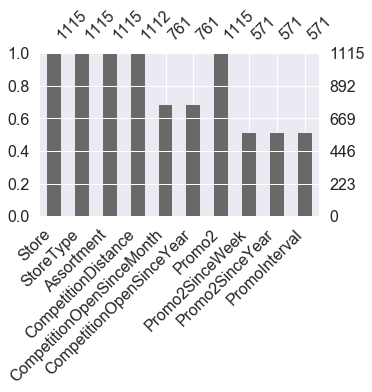

In [13]:
#观察训练集的缺失值情况
# msno.bar(train_datas,figsize=(5,3))
#观察测试集的缺失值情况
# msno.bar(test_datas,figsize=(5,3))
#观察store集的缺失值情况
msno.bar(store_datas,figsize=(5,3))

从图中可以看出，训练集没有缺失值，测试集‘open’有11个缺失值；store集中6个特征存在缺失值。

In [14]:
#观察测试集中的缺失值
test_datas[test_datas.isnull().values==True]

,Id,Store,DayOfWeek,Date,Open,Promo,StateHoliday,SchoolHoliday
479,480,622,4,2015-09-17,NaN,1,0,0
1335,1336,622,3,2015-09-16,NaN,1,0,0
2191,2192,622,2,2015-09-15,NaN,1,0,0
3047,3048,622,1,2015-09-14,NaN,1,0,0
4759,4760,622,6,2015-09-12,NaN,0,0,0
5615,5616,622,5,2015-09-11,NaN,0,0,0
6471,6472,622,4,2015-09-10,NaN,0,0,0
7327,7328,622,3,2015-09-09,NaN,0,0,0
8183,8184,622,2,2015-09-08,NaN,0,0,0
9039,9040,622,1,2015-09-07,NaN,0,0,0


In [15]:
#测试集缺失值填充
test_datas = test_datas.fillna(1)  # 缺失数据都来自于622店铺，从周1到周6而且没有假期，所以应该是正常营业的
print(test_datas.isnull().sum())

Id               0
Store            0
DayOfWeek        0
Date             0
Open             0
Promo            0
StateHoliday     0
SchoolHoliday    0
dtype: int64


In [18]:
#观察商店中的缺失值
store_datas[store_datas.isnull().values==True]

,Store,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
3,4,c,c,620.0,9.0,2009.0,0,NaN,NaN,NaN
3,4,c,c,620.0,9.0,2009.0,0,NaN,NaN,NaN
3,4,c,c,620.0,9.0,2009.0,0,NaN,NaN,NaN
4,5,a,a,29910.0,4.0,2015.0,0,NaN,NaN,NaN
4,5,a,a,29910.0,4.0,2015.0,0,NaN,NaN,NaN
4,5,a,a,29910.0,4.0,2015.0,0,NaN,NaN,NaN
5,6,a,a,310.0,12.0,2013.0,0,NaN,NaN,NaN


In [19]:
#store缺失值填充
store_datas['CompetitionDistance'] = store_datas['CompetitionDistance'].fillna(store_datas['CompetitionDistance'].mean())
# 竞争对手开的年月缺失，有可能是数据缺失用均值/中值/上下值填充，或者没开，用0填充
store_datas['CompetitionOpenSinceMonth'] = store_datas['CompetitionOpenSinceMonth'].fillna(method='pad')
# store_datas['CompetitionOpenSinceMonth'] = store_datas['CompetitionOpenSinceMonth'].fillna(0)
store_datas['CompetitionOpenSinceYear'] = store_datas['CompetitionOpenSinceYear'].fillna(method='pad')
# store_datas['CompetitionOpenSinceYear'] = store_datas['CompetitionOpenSinceYear'].fillna(0)
store_datas = store_datas.fillna(0)  # Promo2中 1:571  0：544  不连续促销时，Promo2Since,,,都为0
store_datas.isnull().sum()

Store                        0
StoreType                    0
Assortment                   0
CompetitionDistance          0
CompetitionOpenSinceMonth    0
CompetitionOpenSinceYear     0
Promo2                       0
Promo2SinceWeek              0
Promo2SinceYear              0
PromoInterval                0
dtype: int64

In [20]:
#把train_datas、test_datas和store_datas合并，构成新的训练集和测试集
train_data = pd.merge(train_datas, store_datas, on='Store')
test_data = pd.merge(test_datas, store_datas, on='Store')
train_data.head().append(train_data.tail())

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
0,1,5,2015-07-31,5263,555,1,1,0,1,c,a,1270.0,9.0,2008.0,0,0.0,0.0,0
1,1,4,2015-07-30,5020,546,1,1,0,1,c,a,1270.0,9.0,2008.0,0,0.0,0.0,0
2,1,3,2015-07-29,4782,523,1,1,0,1,c,a,1270.0,9.0,2008.0,0,0.0,0.0,0
3,1,2,2015-07-28,5011,560,1,1,0,1,c,a,1270.0,9.0,2008.0,0,0.0,0.0,0
4,1,1,2015-07-27,6102,612,1,1,0,1,c,a,1270.0,9.0,2008.0,0,0.0,0.0,0
1017204,1115,6,2013-01-05,4771,339,1,0,0,1,d,c,5350.0,4.0,2006.0,1,22.0,2012.0,"Mar,Jun,Sept,Dec"
1017205,1115,5,2013-01-04,4540,326,1,0,0,1,d,c,5350.0,4.0,2006.0,1,22.0,2012.0,"Mar,Jun,Sept,Dec"
1017206,1115,4,2013-01-03,4297,300,1,0,0,1,d,c,5350.0,4.0,2006.0,1,22.0,2012.0,"Mar,Jun,Sept,Dec"
1017207,1115,3,2013-01-02,3697,305,1,0,0,1,d,c,5350.0,4.0,2006.0,1,22.0,2012.0,"Mar,Jun,Sept,Dec"
1017208,1115,2,2013-01-01,0,0,0,0,a,1,d,c,5350.0,4.0,2006.0,1,22.0,2012.0,"Mar,Jun,Sept,Dec"


In [21]:
#留出最近的6周数据作为验证集
train_data = train_data.sort_values(['Date'],ascending = False)
valid_data = train_data[:6*7*1115]
train_data = train_data[6*7*1115:]
train_data.sort_values(by='Store', inplace=True)
valid_data.sort_values(by='Store', inplace=True)

In [22]:
#因为销售额为0的记录不计入评分，所以只采用店铺为开，且销售额大于0的数据进行训练
valid_data = valid_data[(valid_data["Open"] != 0)&(valid_data["Sales"] > 0)]
train_data = train_data[(train_data["Open"] != 0)&(train_data["Sales"] > 0)]

In [81]:
#特征处理与转化，定义特征处理函数

def features_create(data):
    #将存在其他字符表示分类的特征转化为数字
    mappings = {'0':0, 'a':1, 'b':2, 'c':3, 'd':4}
    data.StoreType.replace(mappings, inplace=True)
    data.Assortment.replace(mappings, inplace=True)
    data.StateHoliday.replace(mappings, inplace=True)
    
    #将时间特征进行拆分和转化，并加入'WeekOfYear'特征
    data['Year'] = data.Date.dt.year
    data['Month'] = data.Date.dt.month
    data['Day'] = data.Date.dt.day
    data['DayOfWeek'] = data.Date.dt.dayofweek
    data['WeekOfYear'] = data.Date.dt.weekofyear
    
    #新增'CompetitionOpen'和'PromoOpen'特征,计算某天某店铺的竞争对手已营业时间和店铺促销已开展时间，用月为单位表示
    data['CompetitionOpen'] = 12 * (data.Year - data.CompetitionOpenSinceYear) + (data.Month - data.CompetitionOpenSinceMonth)
    data['PromoOpen'] = 12 * (data.Year - data.Promo2SinceYear) + (data.WeekOfYear - data.Promo2SinceWeek) / 4.0
    data['CompetitionOpen'] = data.CompetitionOpen.apply(lambda x: x if x > 0 else 0)
    data['PromoOpen'] = data.PromoOpen.apply(lambda x: x if x > 0 else 0)
    data['PromoOpen'][data['Promo2']==0] = 0
    
    # 'PromoInterval'表示重新启动连续销售的月份
    #将'PromoInterval'特征转化为'IsPromoMonth'特征,表示某天某店铺是否处于促销月，1表示是，0表示否
    month2str = {1:'Jan', 2:'Feb', 3:'Mar', 4:'Apr', 5:'May', 6:'Jun', 7:'Jul', 8:'Aug', 9:'Sept', 10:'Oct', 11:'Nov', 12:'Dec'}
    data['monthStr'] = data.Month.map(month2str)
    data.loc[data.PromoInterval == 0, 'PromoInterval'] = ''
    data['IsPromoMonth'] = 0
    for ProMonth in data.PromoInterval.unique():
        if ProMonth != '':
            for month in ProMonth.split(','):
                data.loc[(data.monthStr == month) & (data.PromoInterval == ProMonth) & (data.PromoOpen != 0), 'IsPromoMonth'] = 1
    return data

In [82]:
#对训练集、验证集、测试集数据进行特征转化
features_create(train_data)
features_create(valid_data)
features_create(test_data)
print('Feature engineering finished')

G:\AIAIAI\lib\site-packages\ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


Feature engineering finished


In [83]:
#删掉训练集和验证集中不需要的特征
train_data.drop(['Date','Customers','Open','PromoInterval','monthStr'],axis=1,inplace =True)
valid_data.drop(['Date','Customers','Open','PromoInterval','monthStr'],axis=1,inplace =True)

#删掉测试集中对应的特征与训练集保持一致
x_test = test_data.drop(['Id','Date','Open','PromoInterval','monthStr'],axis = 1)

In [84]:
#拆分特征与标签，并将标签取对数处理
x_train = train_data.drop(['Sales'],axis=1 )
y_train = train_data.Sales
x_valid = valid_data.drop(['Sales'],axis=1 )
y_valid = valid_data.Sales

In [85]:
#定义评价函数rmspe

def rmspe(y, yhat):
    return np.sqrt(np.mean((yhat/y-1) ** 2))
def rmspe_lg(yhat, y):
    return "rmspe", rmspe(y,yhat), False

In [86]:
#设置模型参数

clf = lgb.LGBMRegressor(
    boosting_type="gbdt",
    num_leaves=31,
    reg_alpha=0,
    reg_lambda=0,
    max_depth=-1,
    n_estimators=6000,
    objective='regression',
    subsample=0.8,            # 在不进行重采样的情况下随机选择部分数据
    colsample_bytree=0.8,     # 每次迭代中随机选择部分特征
    subsample_freq=1,         # bagging 的频率, 0 意味着禁用 bagging. k 意味着每 k 次迭代执行bagging（subsample）
    learning_rate=0.1,
    random_state=49
    )

In [87]:
#训练模型
start = time()
clf.fit(x_train, y_train,eval_set=[(x_train, y_train),(x_valid, y_valid)], eval_metric=rmspe_lg, early_stopping_rounds=500,
        categorical_feature=['Store','DayOfWeek','Promo','StateHoliday','SchoolHoliday','StoreType','Assortment',
                             'CompetitionOpenSinceMonth','CompetitionOpenSinceYear','Promo2','Promo2SinceWeek','Promo2SinceYear','Year',
                             'Month','Day','WeekOfYear','IsPromoMonth'])
end = time()

G:\AIAIAI\lib\site-packages\lightgbm\basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is ['Assortment', 'CompetitionOpenSinceMonth', 'CompetitionOpenSinceYear', 'Day', 'DayOfWeek', 'IsPromoMonth', 'Month', 'Promo', 'Promo2', 'Promo2SinceWeek', 'Promo2SinceYear', 'SchoolHoliday', 'StateHoliday', 'Store', 'StoreType', 'WeekOfYear', 'Year']
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))
G:\AIAIAI\lib\site-packages\lightgbm\basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is ['Assortment', 'CompetitionOpenSinceMonth', 'CompetitionOpenSinceYear', 'Day', 'DayOfWeek', 'IsPromoMonth', 'Month', 'Promo', 'Promo2', 'Promo2SinceWeek', 'Promo2SinceYear', 'SchoolHoliday', 'StateHoliday', 'Store', 'StoreType', 'WeekOfYear', 'Year']
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))


[1]	training's l2: 8.39579e+06	training's rmspe: 0.401086	valid_1's l2: 8.11732e+06	valid_1's rmspe: 0.395165
Training until validation scores don't improve for 500 rounds.
[2]	training's l2: 7.38727e+06	training's rmspe: 0.368417	valid_1's l2: 7.13865e+06	valid_1's rmspe: 0.363477
[3]	training's l2: 6.55542e+06	training's rmspe: 0.343786	valid_1's l2: 6.32204e+06	valid_1's rmspe: 0.339513
[4]	training's l2: 5.84665e+06	training's rmspe: 0.323509	valid_1's l2: 5.63501e+06	valid_1's rmspe: 0.319622
[5]	training's l2: 5.29031e+06	training's rmspe: 0.30779	valid_1's l2: 5.08472e+06	valid_1's rmspe: 0.303863
[6]	training's l2: 5.0602e+06	training's rmspe: 0.300444	valid_1's l2: 4.84016e+06	valid_1's rmspe: 0.296058
[7]	training's l2: 4.62857e+06	training's rmspe: 0.288136	valid_1's l2: 4.40789e+06	valid_1's rmspe: 0.283404
[8]	training's l2: 4.25053e+06	training's rmspe: 0.277238	valid_1's l2: 4.05181e+06	valid_1's rmspe: 0.273273
[9]	training's l2: 3.92178e+06	training's rmspe: 0.267914	v

[151]	training's l2: 738830	training's rmspe: 0.125021	valid_1's l2: 1.00797e+06	valid_1's rmspe: 0.142355
[152]	training's l2: 737710	training's rmspe: 0.124913	valid_1's l2: 1.00706e+06	valid_1's rmspe: 0.142272
[153]	training's l2: 736470	training's rmspe: 0.124824	valid_1's l2: 1.00599e+06	valid_1's rmspe: 0.142167
[154]	training's l2: 735521	training's rmspe: 0.124775	valid_1's l2: 1.00535e+06	valid_1's rmspe: 0.142109
[155]	training's l2: 734715	training's rmspe: 0.124722	valid_1's l2: 1.00502e+06	valid_1's rmspe: 0.142074
[156]	training's l2: 733849	training's rmspe: 0.124685	valid_1's l2: 1.00452e+06	valid_1's rmspe: 0.142047
[157]	training's l2: 732664	training's rmspe: 0.124533	valid_1's l2: 1.00301e+06	valid_1's rmspe: 0.141924
[158]	training's l2: 731430	training's rmspe: 0.124458	valid_1's l2: 1.00209e+06	valid_1's rmspe: 0.141859
[159]	training's l2: 730582	training's rmspe: 0.12438	valid_1's l2: 1.001e+06	valid_1's rmspe: 0.141758
[160]	training's l2: 728226	training's r

[310]	training's l2: 605262	training's rmspe: 0.115452	valid_1's l2: 894848	valid_1's rmspe: 0.133755
[311]	training's l2: 604746	training's rmspe: 0.11538	valid_1's l2: 894711	valid_1's rmspe: 0.133746
[312]	training's l2: 603166	training's rmspe: 0.115179	valid_1's l2: 893278	valid_1's rmspe: 0.133598
[313]	training's l2: 602764	training's rmspe: 0.115134	valid_1's l2: 893024	valid_1's rmspe: 0.133578
[314]	training's l2: 602483	training's rmspe: 0.115111	valid_1's l2: 892876	valid_1's rmspe: 0.133573
[315]	training's l2: 602048	training's rmspe: 0.115095	valid_1's l2: 892825	valid_1's rmspe: 0.13357
[316]	training's l2: 601640	training's rmspe: 0.115065	valid_1's l2: 892864	valid_1's rmspe: 0.133568
[317]	training's l2: 601134	training's rmspe: 0.115014	valid_1's l2: 892386	valid_1's rmspe: 0.133518
[318]	training's l2: 600506	training's rmspe: 0.114955	valid_1's l2: 891864	valid_1's rmspe: 0.133388
[319]	training's l2: 600182	training's rmspe: 0.114934	valid_1's l2: 891792	valid_1'

[470]	training's l2: 537295	training's rmspe: 0.109265	valid_1's l2: 847329	valid_1's rmspe: 0.130394
[471]	training's l2: 536986	training's rmspe: 0.109239	valid_1's l2: 847253	valid_1's rmspe: 0.130391
[472]	training's l2: 536734	training's rmspe: 0.10921	valid_1's l2: 846829	valid_1's rmspe: 0.130367
[473]	training's l2: 536544	training's rmspe: 0.109193	valid_1's l2: 846799	valid_1's rmspe: 0.130357
[474]	training's l2: 536014	training's rmspe: 0.109165	valid_1's l2: 845270	valid_1's rmspe: 0.130285
[475]	training's l2: 535630	training's rmspe: 0.109148	valid_1's l2: 845107	valid_1's rmspe: 0.13029
[476]	training's l2: 534945	training's rmspe: 0.109106	valid_1's l2: 844548	valid_1's rmspe: 0.130265
[477]	training's l2: 534726	training's rmspe: 0.109086	valid_1's l2: 844334	valid_1's rmspe: 0.130237
[478]	training's l2: 534538	training's rmspe: 0.109077	valid_1's l2: 844205	valid_1's rmspe: 0.13024
[479]	training's l2: 534243	training's rmspe: 0.109056	valid_1's l2: 844177	valid_1's

[630]	training's l2: 493111	training's rmspe: 0.10531	valid_1's l2: 820969	valid_1's rmspe: 0.128822
[631]	training's l2: 492893	training's rmspe: 0.105283	valid_1's l2: 820634	valid_1's rmspe: 0.128781
[632]	training's l2: 492679	training's rmspe: 0.105265	valid_1's l2: 820481	valid_1's rmspe: 0.128774
[633]	training's l2: 492492	training's rmspe: 0.105245	valid_1's l2: 820517	valid_1's rmspe: 0.128785
[634]	training's l2: 492310	training's rmspe: 0.105227	valid_1's l2: 820472	valid_1's rmspe: 0.128782
[635]	training's l2: 492122	training's rmspe: 0.105206	valid_1's l2: 820480	valid_1's rmspe: 0.128783
[636]	training's l2: 491953	training's rmspe: 0.105179	valid_1's l2: 820652	valid_1's rmspe: 0.12879
[637]	training's l2: 491809	training's rmspe: 0.105163	valid_1's l2: 820573	valid_1's rmspe: 0.128788
[638]	training's l2: 491658	training's rmspe: 0.105149	valid_1's l2: 820533	valid_1's rmspe: 0.128784
[639]	training's l2: 491474	training's rmspe: 0.105131	valid_1's l2: 820518	valid_1'

[790]	training's l2: 460698	training's rmspe: 0.102115	valid_1's l2: 805138	valid_1's rmspe: 0.127569
[791]	training's l2: 460538	training's rmspe: 0.102107	valid_1's l2: 804952	valid_1's rmspe: 0.12756
[792]	training's l2: 460392	training's rmspe: 0.102092	valid_1's l2: 804903	valid_1's rmspe: 0.127555
[793]	training's l2: 460230	training's rmspe: 0.102082	valid_1's l2: 804691	valid_1's rmspe: 0.127541
[794]	training's l2: 460038	training's rmspe: 0.102046	valid_1's l2: 804591	valid_1's rmspe: 0.127521
[795]	training's l2: 459902	training's rmspe: 0.102031	valid_1's l2: 804539	valid_1's rmspe: 0.127523
[796]	training's l2: 459791	training's rmspe: 0.102022	valid_1's l2: 804551	valid_1's rmspe: 0.127526
[797]	training's l2: 459554	training's rmspe: 0.102006	valid_1's l2: 804564	valid_1's rmspe: 0.127528
[798]	training's l2: 459424	training's rmspe: 0.101988	valid_1's l2: 804586	valid_1's rmspe: 0.127532
[799]	training's l2: 459304	training's rmspe: 0.10198	valid_1's l2: 804496	valid_1'

[950]	training's l2: 435831	training's rmspe: 0.0997567	valid_1's l2: 791931	valid_1's rmspe: 0.126586
[951]	training's l2: 435702	training's rmspe: 0.0997425	valid_1's l2: 791807	valid_1's rmspe: 0.126581
[952]	training's l2: 435567	training's rmspe: 0.0997274	valid_1's l2: 791811	valid_1's rmspe: 0.126578
[953]	training's l2: 435485	training's rmspe: 0.099716	valid_1's l2: 791780	valid_1's rmspe: 0.126579
[954]	training's l2: 435384	training's rmspe: 0.0997061	valid_1's l2: 791656	valid_1's rmspe: 0.126574
[955]	training's l2: 435254	training's rmspe: 0.0996893	valid_1's l2: 791412	valid_1's rmspe: 0.126528
[956]	training's l2: 435138	training's rmspe: 0.0996789	valid_1's l2: 791365	valid_1's rmspe: 0.126525
[957]	training's l2: 435014	training's rmspe: 0.0996689	valid_1's l2: 791393	valid_1's rmspe: 0.126529
[958]	training's l2: 434880	training's rmspe: 0.0996582	valid_1's l2: 791613	valid_1's rmspe: 0.126569
[959]	training's l2: 434778	training's rmspe: 0.0996411	valid_1's l2: 7915

[1107]	training's l2: 416623	training's rmspe: 0.0978651	valid_1's l2: 780473	valid_1's rmspe: 0.125631
[1108]	training's l2: 416504	training's rmspe: 0.0978497	valid_1's l2: 780518	valid_1's rmspe: 0.125624
[1109]	training's l2: 416407	training's rmspe: 0.0978488	valid_1's l2: 780447	valid_1's rmspe: 0.125615
[1110]	training's l2: 416285	training's rmspe: 0.097841	valid_1's l2: 780371	valid_1's rmspe: 0.125612
[1111]	training's l2: 416198	training's rmspe: 0.0978339	valid_1's l2: 780289	valid_1's rmspe: 0.12561
[1112]	training's l2: 416117	training's rmspe: 0.0978289	valid_1's l2: 780296	valid_1's rmspe: 0.125611
[1113]	training's l2: 415873	training's rmspe: 0.0977994	valid_1's l2: 780038	valid_1's rmspe: 0.125574
[1114]	training's l2: 415681	training's rmspe: 0.0977816	valid_1's l2: 780020	valid_1's rmspe: 0.125572
[1115]	training's l2: 415561	training's rmspe: 0.0977719	valid_1's l2: 779992	valid_1's rmspe: 0.125575
[1116]	training's l2: 415410	training's rmspe: 0.0977569	valid_1's

[1186]	training's l2: 406944	training's rmspe: 0.0968597	valid_1's l2: 777846	valid_1's rmspe: 0.125431
[1187]	training's l2: 406798	training's rmspe: 0.0968334	valid_1's l2: 777668	valid_1's rmspe: 0.125411
[1188]	training's l2: 406713	training's rmspe: 0.0968279	valid_1's l2: 777601	valid_1's rmspe: 0.125404
[1189]	training's l2: 406497	training's rmspe: 0.0967853	valid_1's l2: 777520	valid_1's rmspe: 0.125401
[1190]	training's l2: 406346	training's rmspe: 0.0967646	valid_1's l2: 777412	valid_1's rmspe: 0.125385
[1191]	training's l2: 406264	training's rmspe: 0.0967558	valid_1's l2: 777256	valid_1's rmspe: 0.12538
[1192]	training's l2: 406156	training's rmspe: 0.0967456	valid_1's l2: 777218	valid_1's rmspe: 0.125373
[1193]	training's l2: 406009	training's rmspe: 0.0967332	valid_1's l2: 777300	valid_1's rmspe: 0.12538
[1194]	training's l2: 405927	training's rmspe: 0.0967271	valid_1's l2: 777143	valid_1's rmspe: 0.125383
[1195]	training's l2: 405783	training's rmspe: 0.0967063	valid_1's

[1342]	training's l2: 389902	training's rmspe: 0.094975	valid_1's l2: 770330	valid_1's rmspe: 0.124713
[1343]	training's l2: 389816	training's rmspe: 0.094959	valid_1's l2: 770380	valid_1's rmspe: 0.12472
[1344]	training's l2: 389714	training's rmspe: 0.0949489	valid_1's l2: 770337	valid_1's rmspe: 0.124721
[1345]	training's l2: 389623	training's rmspe: 0.0949373	valid_1's l2: 770226	valid_1's rmspe: 0.124714
[1346]	training's l2: 389562	training's rmspe: 0.0949331	valid_1's l2: 770205	valid_1's rmspe: 0.12471
[1347]	training's l2: 389487	training's rmspe: 0.0949211	valid_1's l2: 770124	valid_1's rmspe: 0.124706
[1348]	training's l2: 389401	training's rmspe: 0.0949169	valid_1's l2: 770125	valid_1's rmspe: 0.124708
[1349]	training's l2: 389332	training's rmspe: 0.0949111	valid_1's l2: 770095	valid_1's rmspe: 0.124704
[1350]	training's l2: 389256	training's rmspe: 0.0949009	valid_1's l2: 770024	valid_1's rmspe: 0.124695
[1351]	training's l2: 389181	training's rmspe: 0.0948894	valid_1's l

[1498]	training's l2: 375385	training's rmspe: 0.0934187	valid_1's l2: 763432	valid_1's rmspe: 0.124265
[1499]	training's l2: 375323	training's rmspe: 0.0934125	valid_1's l2: 763421	valid_1's rmspe: 0.124259
[1500]	training's l2: 375234	training's rmspe: 0.0934045	valid_1's l2: 763406	valid_1's rmspe: 0.12426
[1501]	training's l2: 375153	training's rmspe: 0.0934062	valid_1's l2: 763472	valid_1's rmspe: 0.124262
[1502]	training's l2: 375081	training's rmspe: 0.0933979	valid_1's l2: 763399	valid_1's rmspe: 0.124256
[1503]	training's l2: 375014	training's rmspe: 0.0933922	valid_1's l2: 763410	valid_1's rmspe: 0.124253
[1504]	training's l2: 374913	training's rmspe: 0.0933867	valid_1's l2: 763406	valid_1's rmspe: 0.124252
[1505]	training's l2: 374847	training's rmspe: 0.0933801	valid_1's l2: 763356	valid_1's rmspe: 0.12424
[1506]	training's l2: 374785	training's rmspe: 0.0933712	valid_1's l2: 763197	valid_1's rmspe: 0.124226
[1507]	training's l2: 374711	training's rmspe: 0.0933649	valid_1's

[1654]	training's l2: 363365	training's rmspe: 0.0920738	valid_1's l2: 759938	valid_1's rmspe: 0.12396
[1655]	training's l2: 363277	training's rmspe: 0.092068	valid_1's l2: 760012	valid_1's rmspe: 0.123969
[1656]	training's l2: 363199	training's rmspe: 0.0920569	valid_1's l2: 759934	valid_1's rmspe: 0.123958
[1657]	training's l2: 363140	training's rmspe: 0.0920499	valid_1's l2: 759952	valid_1's rmspe: 0.123957
[1658]	training's l2: 363078	training's rmspe: 0.092047	valid_1's l2: 759979	valid_1's rmspe: 0.123964
[1659]	training's l2: 363021	training's rmspe: 0.0920432	valid_1's l2: 760041	valid_1's rmspe: 0.123964
[1660]	training's l2: 362959	training's rmspe: 0.0920355	valid_1's l2: 760030	valid_1's rmspe: 0.123964
[1661]	training's l2: 362838	training's rmspe: 0.0920245	valid_1's l2: 759997	valid_1's rmspe: 0.123956
[1662]	training's l2: 362759	training's rmspe: 0.0920186	valid_1's l2: 760022	valid_1's rmspe: 0.123952
[1663]	training's l2: 362687	training's rmspe: 0.0920114	valid_1's 

[1810]	training's l2: 352102	training's rmspe: 0.0908815	valid_1's l2: 757285	valid_1's rmspe: 0.123629
[1811]	training's l2: 352050	training's rmspe: 0.0908748	valid_1's l2: 757280	valid_1's rmspe: 0.123629
[1812]	training's l2: 352009	training's rmspe: 0.0908696	valid_1's l2: 757373	valid_1's rmspe: 0.123633
[1813]	training's l2: 351947	training's rmspe: 0.0908611	valid_1's l2: 757257	valid_1's rmspe: 0.123615
[1814]	training's l2: 351873	training's rmspe: 0.0908551	valid_1's l2: 757222	valid_1's rmspe: 0.123615
[1815]	training's l2: 351821	training's rmspe: 0.0908523	valid_1's l2: 757218	valid_1's rmspe: 0.123616
[1816]	training's l2: 351765	training's rmspe: 0.0908487	valid_1's l2: 757188	valid_1's rmspe: 0.123616
[1817]	training's l2: 351707	training's rmspe: 0.0908395	valid_1's l2: 757179	valid_1's rmspe: 0.123605
[1818]	training's l2: 351650	training's rmspe: 0.0908349	valid_1's l2: 757114	valid_1's rmspe: 0.123598
[1819]	training's l2: 351585	training's rmspe: 0.0908295	valid_1

[1967]	training's l2: 341928	training's rmspe: 0.089854	valid_1's l2: 753894	valid_1's rmspe: 0.123273
[1968]	training's l2: 341876	training's rmspe: 0.0898534	valid_1's l2: 753914	valid_1's rmspe: 0.123279
[1969]	training's l2: 341802	training's rmspe: 0.0898453	valid_1's l2: 753956	valid_1's rmspe: 0.123285
[1970]	training's l2: 341756	training's rmspe: 0.0898431	valid_1's l2: 753911	valid_1's rmspe: 0.123285
[1971]	training's l2: 341683	training's rmspe: 0.0898304	valid_1's l2: 753818	valid_1's rmspe: 0.123293
[1972]	training's l2: 341641	training's rmspe: 0.0898284	valid_1's l2: 753811	valid_1's rmspe: 0.123289
[1973]	training's l2: 341579	training's rmspe: 0.0898234	valid_1's l2: 753789	valid_1's rmspe: 0.12329
[1974]	training's l2: 341512	training's rmspe: 0.08981	valid_1's l2: 753703	valid_1's rmspe: 0.123284
[1975]	training's l2: 341444	training's rmspe: 0.0898142	valid_1's l2: 753647	valid_1's rmspe: 0.123277
[1976]	training's l2: 341378	training's rmspe: 0.0898066	valid_1's l

[2124]	training's l2: 332634	training's rmspe: 0.0887589	valid_1's l2: 750135	valid_1's rmspe: 0.122857
[2125]	training's l2: 332571	training's rmspe: 0.0887513	valid_1's l2: 750069	valid_1's rmspe: 0.12285
[2126]	training's l2: 332522	training's rmspe: 0.0887457	valid_1's l2: 750046	valid_1's rmspe: 0.12285
[2127]	training's l2: 332480	training's rmspe: 0.0887433	valid_1's l2: 749901	valid_1's rmspe: 0.122852
[2128]	training's l2: 332437	training's rmspe: 0.0887382	valid_1's l2: 749857	valid_1's rmspe: 0.122847
[2129]	training's l2: 332389	training's rmspe: 0.0887333	valid_1's l2: 749716	valid_1's rmspe: 0.122833
[2130]	training's l2: 332348	training's rmspe: 0.0887283	valid_1's l2: 749778	valid_1's rmspe: 0.122835
[2131]	training's l2: 332282	training's rmspe: 0.0887206	valid_1's l2: 749741	valid_1's rmspe: 0.122836
[2132]	training's l2: 332235	training's rmspe: 0.0887159	valid_1's l2: 749678	valid_1's rmspe: 0.122824
[2133]	training's l2: 332187	training's rmspe: 0.0887097	valid_1's

[2280]	training's l2: 324868	training's rmspe: 0.0878979	valid_1's l2: 747852	valid_1's rmspe: 0.122687
[2281]	training's l2: 324822	training's rmspe: 0.087889	valid_1's l2: 747868	valid_1's rmspe: 0.122689
[2282]	training's l2: 324764	training's rmspe: 0.0878799	valid_1's l2: 747883	valid_1's rmspe: 0.122686
[2283]	training's l2: 324722	training's rmspe: 0.0878739	valid_1's l2: 747904	valid_1's rmspe: 0.122689
[2284]	training's l2: 324655	training's rmspe: 0.0878637	valid_1's l2: 747917	valid_1's rmspe: 0.12269
[2285]	training's l2: 324609	training's rmspe: 0.0878631	valid_1's l2: 747873	valid_1's rmspe: 0.122681
[2286]	training's l2: 324544	training's rmspe: 0.0878585	valid_1's l2: 747795	valid_1's rmspe: 0.122672
[2287]	training's l2: 324505	training's rmspe: 0.0878552	valid_1's l2: 747806	valid_1's rmspe: 0.122675
[2288]	training's l2: 324445	training's rmspe: 0.0878439	valid_1's l2: 747952	valid_1's rmspe: 0.122689
[2289]	training's l2: 324378	training's rmspe: 0.0878329	valid_1's

[2437]	training's l2: 317273	training's rmspe: 0.0869724	valid_1's l2: 745752	valid_1's rmspe: 0.122575
[2438]	training's l2: 317228	training's rmspe: 0.086969	valid_1's l2: 745676	valid_1's rmspe: 0.12257
[2439]	training's l2: 317197	training's rmspe: 0.0869654	valid_1's l2: 745662	valid_1's rmspe: 0.122566
[2440]	training's l2: 317111	training's rmspe: 0.0869561	valid_1's l2: 745622	valid_1's rmspe: 0.122566
[2441]	training's l2: 317075	training's rmspe: 0.0869506	valid_1's l2: 745646	valid_1's rmspe: 0.122565
[2442]	training's l2: 317044	training's rmspe: 0.0869322	valid_1's l2: 745644	valid_1's rmspe: 0.122557
[2443]	training's l2: 316974	training's rmspe: 0.0869222	valid_1's l2: 745588	valid_1's rmspe: 0.122547
[2444]	training's l2: 316929	training's rmspe: 0.0869213	valid_1's l2: 745615	valid_1's rmspe: 0.122548
[2445]	training's l2: 316873	training's rmspe: 0.0869156	valid_1's l2: 745562	valid_1's rmspe: 0.122544
[2446]	training's l2: 316823	training's rmspe: 0.0869081	valid_1's

[2593]	training's l2: 310499	training's rmspe: 0.0861886	valid_1's l2: 743939	valid_1's rmspe: 0.122459
[2594]	training's l2: 310448	training's rmspe: 0.0861847	valid_1's l2: 743973	valid_1's rmspe: 0.122467
[2595]	training's l2: 310405	training's rmspe: 0.086181	valid_1's l2: 743864	valid_1's rmspe: 0.122464
[2596]	training's l2: 310367	training's rmspe: 0.086179	valid_1's l2: 743856	valid_1's rmspe: 0.122468
[2597]	training's l2: 310311	training's rmspe: 0.0861707	valid_1's l2: 743806	valid_1's rmspe: 0.122463
[2598]	training's l2: 310270	training's rmspe: 0.0861663	valid_1's l2: 743829	valid_1's rmspe: 0.122463
[2599]	training's l2: 310222	training's rmspe: 0.0861426	valid_1's l2: 743765	valid_1's rmspe: 0.12246
[2600]	training's l2: 310190	training's rmspe: 0.0861353	valid_1's l2: 743712	valid_1's rmspe: 0.122455
[2601]	training's l2: 310150	training's rmspe: 0.0861301	valid_1's l2: 743674	valid_1's rmspe: 0.122449
[2602]	training's l2: 310108	training's rmspe: 0.0861249	valid_1's 

[2749]	training's l2: 303883	training's rmspe: 0.0853969	valid_1's l2: 743666	valid_1's rmspe: 0.122412
[2750]	training's l2: 303837	training's rmspe: 0.0853978	valid_1's l2: 743687	valid_1's rmspe: 0.12241
[2751]	training's l2: 303796	training's rmspe: 0.0853925	valid_1's l2: 743661	valid_1's rmspe: 0.122408
[2752]	training's l2: 303756	training's rmspe: 0.0853859	valid_1's l2: 743661	valid_1's rmspe: 0.122403
[2753]	training's l2: 303718	training's rmspe: 0.0853804	valid_1's l2: 743663	valid_1's rmspe: 0.122406
[2754]	training's l2: 303663	training's rmspe: 0.0853698	valid_1's l2: 743692	valid_1's rmspe: 0.122416
[2755]	training's l2: 303614	training's rmspe: 0.0853662	valid_1's l2: 743711	valid_1's rmspe: 0.122417
[2756]	training's l2: 303567	training's rmspe: 0.0853566	valid_1's l2: 743712	valid_1's rmspe: 0.122415
[2757]	training's l2: 303529	training's rmspe: 0.0853503	valid_1's l2: 743680	valid_1's rmspe: 0.122408
[2758]	training's l2: 303490	training's rmspe: 0.0853441	valid_1'

[2905]	training's l2: 297854	training's rmspe: 0.0846327	valid_1's l2: 742531	valid_1's rmspe: 0.12231
[2906]	training's l2: 297827	training's rmspe: 0.0846291	valid_1's l2: 742493	valid_1's rmspe: 0.122319
[2907]	training's l2: 297790	training's rmspe: 0.0846258	valid_1's l2: 742522	valid_1's rmspe: 0.12232
[2908]	training's l2: 297762	training's rmspe: 0.0846249	valid_1's l2: 742457	valid_1's rmspe: 0.122313
[2909]	training's l2: 297706	training's rmspe: 0.0846194	valid_1's l2: 742484	valid_1's rmspe: 0.122312
[2910]	training's l2: 297664	training's rmspe: 0.0846137	valid_1's l2: 742438	valid_1's rmspe: 0.122317
[2911]	training's l2: 297621	training's rmspe: 0.0846088	valid_1's l2: 742408	valid_1's rmspe: 0.122317
[2912]	training's l2: 297566	training's rmspe: 0.0845987	valid_1's l2: 742380	valid_1's rmspe: 0.122315
[2913]	training's l2: 297540	training's rmspe: 0.0845939	valid_1's l2: 742359	valid_1's rmspe: 0.122312
[2914]	training's l2: 297506	training's rmspe: 0.0845859	valid_1's

[3062]	training's l2: 292221	training's rmspe: 0.0839431	valid_1's l2: 741714	valid_1's rmspe: 0.122286
[3063]	training's l2: 292187	training's rmspe: 0.0839374	valid_1's l2: 741705	valid_1's rmspe: 0.122286
[3064]	training's l2: 292143	training's rmspe: 0.083933	valid_1's l2: 741661	valid_1's rmspe: 0.122283
[3065]	training's l2: 292109	training's rmspe: 0.0839291	valid_1's l2: 741664	valid_1's rmspe: 0.122282
[3066]	training's l2: 292061	training's rmspe: 0.0839234	valid_1's l2: 741659	valid_1's rmspe: 0.122279
[3067]	training's l2: 292035	training's rmspe: 0.0839229	valid_1's l2: 741682	valid_1's rmspe: 0.122284
[3068]	training's l2: 292007	training's rmspe: 0.083924	valid_1's l2: 741626	valid_1's rmspe: 0.122285
[3069]	training's l2: 291962	training's rmspe: 0.083921	valid_1's l2: 741657	valid_1's rmspe: 0.122292
[3070]	training's l2: 291928	training's rmspe: 0.0839161	valid_1's l2: 741638	valid_1's rmspe: 0.122288
[3071]	training's l2: 291897	training's rmspe: 0.0839109	valid_1's 

[3218]	training's l2: 286770	training's rmspe: 0.0832714	valid_1's l2: 740648	valid_1's rmspe: 0.122261
[3219]	training's l2: 286734	training's rmspe: 0.0832654	valid_1's l2: 740621	valid_1's rmspe: 0.122258
[3220]	training's l2: 286705	training's rmspe: 0.0832619	valid_1's l2: 740586	valid_1's rmspe: 0.122257
[3221]	training's l2: 286670	training's rmspe: 0.0832562	valid_1's l2: 740553	valid_1's rmspe: 0.122253
[3222]	training's l2: 286633	training's rmspe: 0.083248	valid_1's l2: 740517	valid_1's rmspe: 0.122254
[3223]	training's l2: 286602	training's rmspe: 0.0832455	valid_1's l2: 740471	valid_1's rmspe: 0.122248
[3224]	training's l2: 286573	training's rmspe: 0.0832404	valid_1's l2: 740501	valid_1's rmspe: 0.122252
[3225]	training's l2: 286539	training's rmspe: 0.0832368	valid_1's l2: 740489	valid_1's rmspe: 0.122249
[3226]	training's l2: 286515	training's rmspe: 0.0832344	valid_1's l2: 740735	valid_1's rmspe: 0.122269
[3227]	training's l2: 286487	training's rmspe: 0.0832337	valid_1'

[3374]	training's l2: 281735	training's rmspe: 0.0826512	valid_1's l2: 738766	valid_1's rmspe: 0.122106
[3375]	training's l2: 281719	training's rmspe: 0.0826486	valid_1's l2: 738742	valid_1's rmspe: 0.122108
[3376]	training's l2: 281691	training's rmspe: 0.0826427	valid_1's l2: 738681	valid_1's rmspe: 0.12209
[3377]	training's l2: 281659	training's rmspe: 0.08264	valid_1's l2: 738819	valid_1's rmspe: 0.12209
[3378]	training's l2: 281641	training's rmspe: 0.082639	valid_1's l2: 738805	valid_1's rmspe: 0.122088
[3379]	training's l2: 281614	training's rmspe: 0.082636	valid_1's l2: 738783	valid_1's rmspe: 0.122088
[3380]	training's l2: 281578	training's rmspe: 0.0826337	valid_1's l2: 738815	valid_1's rmspe: 0.122089
[3381]	training's l2: 281548	training's rmspe: 0.0826276	valid_1's l2: 738840	valid_1's rmspe: 0.122088
[3382]	training's l2: 281519	training's rmspe: 0.0826247	valid_1's l2: 738835	valid_1's rmspe: 0.122087
[3383]	training's l2: 281487	training's rmspe: 0.082622	valid_1's l2: 

[3530]	training's l2: 277163	training's rmspe: 0.0820958	valid_1's l2: 738509	valid_1's rmspe: 0.122027
[3531]	training's l2: 277124	training's rmspe: 0.0820933	valid_1's l2: 738419	valid_1's rmspe: 0.122025
[3532]	training's l2: 277097	training's rmspe: 0.0820869	valid_1's l2: 738503	valid_1's rmspe: 0.122031
[3533]	training's l2: 277076	training's rmspe: 0.0820844	valid_1's l2: 738703	valid_1's rmspe: 0.122041
[3534]	training's l2: 277055	training's rmspe: 0.0820813	valid_1's l2: 738712	valid_1's rmspe: 0.12204
[3535]	training's l2: 277028	training's rmspe: 0.0820795	valid_1's l2: 738675	valid_1's rmspe: 0.122039
[3536]	training's l2: 276999	training's rmspe: 0.0820762	valid_1's l2: 738669	valid_1's rmspe: 0.122036
[3537]	training's l2: 276960	training's rmspe: 0.0820691	valid_1's l2: 738710	valid_1's rmspe: 0.122044
[3538]	training's l2: 276931	training's rmspe: 0.0820743	valid_1's l2: 738797	valid_1's rmspe: 0.122048
[3539]	training's l2: 276907	training's rmspe: 0.0820746	valid_1'

[3687]	training's l2: 272569	training's rmspe: 0.0814955	valid_1's l2: 738177	valid_1's rmspe: 0.122011
[3688]	training's l2: 272540	training's rmspe: 0.0814909	valid_1's l2: 738074	valid_1's rmspe: 0.122002
[3689]	training's l2: 272501	training's rmspe: 0.0814878	valid_1's l2: 738065	valid_1's rmspe: 0.122006
[3690]	training's l2: 272468	training's rmspe: 0.0814821	valid_1's l2: 737988	valid_1's rmspe: 0.122
[3691]	training's l2: 272439	training's rmspe: 0.0814828	valid_1's l2: 737928	valid_1's rmspe: 0.121995
[3692]	training's l2: 272413	training's rmspe: 0.0814827	valid_1's l2: 737868	valid_1's rmspe: 0.121988
[3693]	training's l2: 272386	training's rmspe: 0.0814746	valid_1's l2: 737841	valid_1's rmspe: 0.121985
[3694]	training's l2: 272357	training's rmspe: 0.0814705	valid_1's l2: 737810	valid_1's rmspe: 0.12198
[3695]	training's l2: 272336	training's rmspe: 0.0814679	valid_1's l2: 737848	valid_1's rmspe: 0.121973
[3696]	training's l2: 272311	training's rmspe: 0.0814639	valid_1's l

[3843]	training's l2: 268185	training's rmspe: 0.0809042	valid_1's l2: 737263	valid_1's rmspe: 0.121945
[3844]	training's l2: 268146	training's rmspe: 0.0809046	valid_1's l2: 737245	valid_1's rmspe: 0.121942
[3845]	training's l2: 268123	training's rmspe: 0.0809011	valid_1's l2: 737255	valid_1's rmspe: 0.121947
[3846]	training's l2: 268093	training's rmspe: 0.0808994	valid_1's l2: 737266	valid_1's rmspe: 0.121951
[3847]	training's l2: 268064	training's rmspe: 0.0808966	valid_1's l2: 737267	valid_1's rmspe: 0.12195
[3848]	training's l2: 268035	training's rmspe: 0.080887	valid_1's l2: 737275	valid_1's rmspe: 0.121952
[3849]	training's l2: 268011	training's rmspe: 0.0808827	valid_1's l2: 737267	valid_1's rmspe: 0.12195
[3850]	training's l2: 267990	training's rmspe: 0.0808797	valid_1's l2: 737274	valid_1's rmspe: 0.121948
[3851]	training's l2: 267977	training's rmspe: 0.0808775	valid_1's l2: 737277	valid_1's rmspe: 0.12195
[3852]	training's l2: 267954	training's rmspe: 0.0808746	valid_1's l

[4000]	training's l2: 264063	training's rmspe: 0.0803601	valid_1's l2: 737701	valid_1's rmspe: 0.121917
[4001]	training's l2: 264038	training's rmspe: 0.0803574	valid_1's l2: 737677	valid_1's rmspe: 0.121915
[4002]	training's l2: 264015	training's rmspe: 0.0803538	valid_1's l2: 737687	valid_1's rmspe: 0.121914
[4003]	training's l2: 263989	training's rmspe: 0.0803508	valid_1's l2: 737667	valid_1's rmspe: 0.121909
[4004]	training's l2: 263957	training's rmspe: 0.0803462	valid_1's l2: 737652	valid_1's rmspe: 0.121914
[4005]	training's l2: 263936	training's rmspe: 0.0803417	valid_1's l2: 737632	valid_1's rmspe: 0.121909
[4006]	training's l2: 263911	training's rmspe: 0.0803381	valid_1's l2: 737623	valid_1's rmspe: 0.121907
[4007]	training's l2: 263889	training's rmspe: 0.0803391	valid_1's l2: 737654	valid_1's rmspe: 0.121906
[4008]	training's l2: 263867	training's rmspe: 0.0803362	valid_1's l2: 737687	valid_1's rmspe: 0.121907
[4009]	training's l2: 263838	training's rmspe: 0.0803328	valid_1

[4156]	training's l2: 260212	training's rmspe: 0.0798489	valid_1's l2: 737024	valid_1's rmspe: 0.121885
[4157]	training's l2: 260194	training's rmspe: 0.0798462	valid_1's l2: 737018	valid_1's rmspe: 0.12188
[4158]	training's l2: 260162	training's rmspe: 0.0798423	valid_1's l2: 736999	valid_1's rmspe: 0.121881
[4159]	training's l2: 260140	training's rmspe: 0.0798398	valid_1's l2: 736974	valid_1's rmspe: 0.121877
[4160]	training's l2: 260121	training's rmspe: 0.0798387	valid_1's l2: 736933	valid_1's rmspe: 0.121869
[4161]	training's l2: 260103	training's rmspe: 0.07983	valid_1's l2: 736902	valid_1's rmspe: 0.121866
[4162]	training's l2: 260083	training's rmspe: 0.0798277	valid_1's l2: 736886	valid_1's rmspe: 0.121864
[4163]	training's l2: 260051	training's rmspe: 0.0798247	valid_1's l2: 736913	valid_1's rmspe: 0.121864
[4164]	training's l2: 260026	training's rmspe: 0.0798211	valid_1's l2: 736877	valid_1's rmspe: 0.121858
[4165]	training's l2: 260004	training's rmspe: 0.0798202	valid_1's 

[4312]	training's l2: 256553	training's rmspe: 0.0793444	valid_1's l2: 736953	valid_1's rmspe: 0.121861
[4313]	training's l2: 256532	training's rmspe: 0.0793406	valid_1's l2: 736944	valid_1's rmspe: 0.121854
[4314]	training's l2: 256514	training's rmspe: 0.0793379	valid_1's l2: 736984	valid_1's rmspe: 0.121854
[4315]	training's l2: 256488	training's rmspe: 0.0793324	valid_1's l2: 736971	valid_1's rmspe: 0.121855
[4316]	training's l2: 256460	training's rmspe: 0.0793291	valid_1's l2: 736991	valid_1's rmspe: 0.121857
[4317]	training's l2: 256435	training's rmspe: 0.0793252	valid_1's l2: 736937	valid_1's rmspe: 0.121855
[4318]	training's l2: 256407	training's rmspe: 0.0793226	valid_1's l2: 736944	valid_1's rmspe: 0.121855
[4319]	training's l2: 256384	training's rmspe: 0.0793222	valid_1's l2: 736901	valid_1's rmspe: 0.121849
[4320]	training's l2: 256370	training's rmspe: 0.0793212	valid_1's l2: 736921	valid_1's rmspe: 0.121846
[4321]	training's l2: 256339	training's rmspe: 0.0793162	valid_1

[4468]	training's l2: 253020	training's rmspe: 0.0788789	valid_1's l2: 736634	valid_1's rmspe: 0.12177
[4469]	training's l2: 253000	training's rmspe: 0.0788803	valid_1's l2: 736637	valid_1's rmspe: 0.121774
[4470]	training's l2: 252976	training's rmspe: 0.0788759	valid_1's l2: 736641	valid_1's rmspe: 0.121773
[4471]	training's l2: 252957	training's rmspe: 0.0788749	valid_1's l2: 736637	valid_1's rmspe: 0.121775
[4472]	training's l2: 252931	training's rmspe: 0.0788714	valid_1's l2: 736655	valid_1's rmspe: 0.121777
[4473]	training's l2: 252887	training's rmspe: 0.0788683	valid_1's l2: 736673	valid_1's rmspe: 0.121771
[4474]	training's l2: 252802	training's rmspe: 0.0788511	valid_1's l2: 736264	valid_1's rmspe: 0.12174
[4475]	training's l2: 252775	training's rmspe: 0.0788427	valid_1's l2: 736001	valid_1's rmspe: 0.12172
[4476]	training's l2: 252757	training's rmspe: 0.0788396	valid_1's l2: 736030	valid_1's rmspe: 0.121725
[4477]	training's l2: 252719	training's rmspe: 0.0788346	valid_1's 

[4624]	training's l2: 249612	training's rmspe: 0.0783965	valid_1's l2: 735698	valid_1's rmspe: 0.121683
[4625]	training's l2: 249594	training's rmspe: 0.078392	valid_1's l2: 735705	valid_1's rmspe: 0.121687
[4626]	training's l2: 249573	training's rmspe: 0.0783849	valid_1's l2: 735720	valid_1's rmspe: 0.121689
[4627]	training's l2: 249559	training's rmspe: 0.0783809	valid_1's l2: 735735	valid_1's rmspe: 0.121691
[4628]	training's l2: 249538	training's rmspe: 0.0783791	valid_1's l2: 735759	valid_1's rmspe: 0.121693
[4629]	training's l2: 249520	training's rmspe: 0.0783767	valid_1's l2: 735721	valid_1's rmspe: 0.121696
[4630]	training's l2: 249496	training's rmspe: 0.0783742	valid_1's l2: 735745	valid_1's rmspe: 0.121697
[4631]	training's l2: 249474	training's rmspe: 0.0783723	valid_1's l2: 735737	valid_1's rmspe: 0.121693
[4632]	training's l2: 249452	training's rmspe: 0.0783678	valid_1's l2: 735736	valid_1's rmspe: 0.121695
[4633]	training's l2: 249429	training's rmspe: 0.0783637	valid_1'

[4780]	training's l2: 246470	training's rmspe: 0.077991	valid_1's l2: 735804	valid_1's rmspe: 0.121702
[4781]	training's l2: 246445	training's rmspe: 0.0779899	valid_1's l2: 735860	valid_1's rmspe: 0.12171
[4782]	training's l2: 246425	training's rmspe: 0.0779842	valid_1's l2: 735913	valid_1's rmspe: 0.121711
[4783]	training's l2: 246406	training's rmspe: 0.0779833	valid_1's l2: 735924	valid_1's rmspe: 0.121709
[4784]	training's l2: 246386	training's rmspe: 0.0779797	valid_1's l2: 735913	valid_1's rmspe: 0.12171
[4785]	training's l2: 246370	training's rmspe: 0.0779772	valid_1's l2: 735925	valid_1's rmspe: 0.121712
[4786]	training's l2: 246322	training's rmspe: 0.0779682	valid_1's l2: 735854	valid_1's rmspe: 0.121703
[4787]	training's l2: 246307	training's rmspe: 0.0779648	valid_1's l2: 735884	valid_1's rmspe: 0.121705
[4788]	training's l2: 246285	training's rmspe: 0.0779633	valid_1's l2: 735859	valid_1's rmspe: 0.121701
[4789]	training's l2: 246271	training's rmspe: 0.0779598	valid_1's 

[4936]	training's l2: 243352	training's rmspe: 0.0775334	valid_1's l2: 735979	valid_1's rmspe: 0.121721
[4937]	training's l2: 243333	training's rmspe: 0.07753	valid_1's l2: 735979	valid_1's rmspe: 0.121719
[4938]	training's l2: 243315	training's rmspe: 0.0775281	valid_1's l2: 735968	valid_1's rmspe: 0.121713
[4939]	training's l2: 243301	training's rmspe: 0.0775254	valid_1's l2: 735951	valid_1's rmspe: 0.12171
[4940]	training's l2: 243275	training's rmspe: 0.0775246	valid_1's l2: 735877	valid_1's rmspe: 0.1217
[4941]	training's l2: 243265	training's rmspe: 0.0775219	valid_1's l2: 735897	valid_1's rmspe: 0.12172
[4942]	training's l2: 243246	training's rmspe: 0.0775154	valid_1's l2: 735889	valid_1's rmspe: 0.121722
[4943]	training's l2: 243229	training's rmspe: 0.0775088	valid_1's l2: 735896	valid_1's rmspe: 0.121723
[4944]	training's l2: 243200	training's rmspe: 0.0775043	valid_1's l2: 735883	valid_1's rmspe: 0.12172
[4945]	training's l2: 243178	training's rmspe: 0.0775004	valid_1's l2: 

[5093]	training's l2: 240311	training's rmspe: 0.0771196	valid_1's l2: 736276	valid_1's rmspe: 0.121772
[5094]	training's l2: 240294	training's rmspe: 0.0771179	valid_1's l2: 736284	valid_1's rmspe: 0.121777
[5095]	training's l2: 240278	training's rmspe: 0.077116	valid_1's l2: 736315	valid_1's rmspe: 0.121797
[5096]	training's l2: 240254	training's rmspe: 0.077115	valid_1's l2: 736359	valid_1's rmspe: 0.121802
[5097]	training's l2: 240241	training's rmspe: 0.0771149	valid_1's l2: 736372	valid_1's rmspe: 0.121805
[5098]	training's l2: 240221	training's rmspe: 0.0771158	valid_1's l2: 736402	valid_1's rmspe: 0.121804
[5099]	training's l2: 240205	training's rmspe: 0.077111	valid_1's l2: 736416	valid_1's rmspe: 0.121809
[5100]	training's l2: 240190	training's rmspe: 0.077106	valid_1's l2: 736389	valid_1's rmspe: 0.121805
[5101]	training's l2: 240172	training's rmspe: 0.0771032	valid_1's l2: 736386	valid_1's rmspe: 0.121802
[5102]	training's l2: 240142	training's rmspe: 0.0771041	valid_1's l

In [90]:
#验证集rmspe得分
yhat = clf.predict(x_valid, num_iteration=clf.best_iteration_)
print('初始模型的验证集rmspe得分为：{}'.format(rmspe(y_valid, yhat)))
print('训练时长为：{} min'.format((end-start)/60))

初始模型的验证集rmspe得分为：0.1257316562060754
训练时长为：9.83024350007375 min


In [91]:
#将Sales对数化
y_train = np.log1p(train_data.Sales)
y_valid = np.log1p(valid_data.Sales)

#重新定义评价函数rmspe
def rmspe(y, yhat):
    return np.sqrt(np.mean((yhat/y-1) ** 2))
def rmspe_lg(yhat, y):
    y = np.expm1(y)
    yhat = np.expm1(yhat)
    return "rmspe", rmspe(y,yhat), False

In [92]:
#训练模型
start = time()
clf.fit(x_train, y_train,eval_set=[(x_train, y_train),(x_valid, y_valid)], eval_metric=rmspe_lg, early_stopping_rounds=500,
        categorical_feature=['Store','DayOfWeek','Promo','StateHoliday','SchoolHoliday','StoreType','Assortment',
                             'CompetitionOpenSinceMonth','CompetitionOpenSinceYear','Promo2','Promo2SinceWeek','Promo2SinceYear','Year',
                             'Month','Day','WeekOfYear','IsPromoMonth'])
end = time() 

G:\AIAIAI\lib\site-packages\lightgbm\basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is ['Assortment', 'CompetitionOpenSinceMonth', 'CompetitionOpenSinceYear', 'Day', 'DayOfWeek', 'IsPromoMonth', 'Month', 'Promo', 'Promo2', 'Promo2SinceWeek', 'Promo2SinceYear', 'SchoolHoliday', 'StateHoliday', 'Store', 'StoreType', 'WeekOfYear', 'Year']
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))
G:\AIAIAI\lib\site-packages\lightgbm\basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is ['Assortment', 'CompetitionOpenSinceMonth', 'CompetitionOpenSinceYear', 'Day', 'DayOfWeek', 'IsPromoMonth', 'Month', 'Promo', 'Promo2', 'Promo2SinceWeek', 'Promo2SinceYear', 'SchoolHoliday', 'StateHoliday', 'Store', 'StoreType', 'WeekOfYear', 'Year']
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))


[1]	training's l2: 0.157905	training's rmspe: 0.454735	valid_1's l2: 0.150288	valid_1's rmspe: 0.448631
Training until validation scores don't improve for 500 rounds.
[2]	training's l2: 0.139111	training's rmspe: 0.419572	valid_1's l2: 0.131776	valid_1's rmspe: 0.414442
[3]	training's l2: 0.123524	training's rmspe: 0.389706	valid_1's l2: 0.116599	valid_1's rmspe: 0.38551
[4]	training's l2: 0.110435	training's rmspe: 0.363035	valid_1's l2: 0.104012	valid_1's rmspe: 0.360381
[5]	training's l2: 0.099817	training's rmspe: 0.342657	valid_1's l2: 0.0937346	valid_1's rmspe: 0.340774
[6]	training's l2: 0.0955893	training's rmspe: 0.333678	valid_1's l2: 0.089368	valid_1's rmspe: 0.331535
[7]	training's l2: 0.0876514	training's rmspe: 0.316433	valid_1's l2: 0.0814189	valid_1's rmspe: 0.313903
[8]	training's l2: 0.0803971	training's rmspe: 0.301295	valid_1's l2: 0.0744425	valid_1's rmspe: 0.299165
[9]	training's l2: 0.0743659	training's rmspe: 0.288812	valid_1's l2: 0.0685653	valid_1's rmspe: 0.2

[153]	training's l2: 0.0138466	training's rmspe: 0.119757	valid_1's l2: 0.0174758	valid_1's rmspe: 0.139519
[154]	training's l2: 0.0138296	training's rmspe: 0.119685	valid_1's l2: 0.0174601	valid_1's rmspe: 0.139465
[155]	training's l2: 0.0138055	training's rmspe: 0.119586	valid_1's l2: 0.0174385	valid_1's rmspe: 0.139361
[156]	training's l2: 0.0137764	training's rmspe: 0.119463	valid_1's l2: 0.0174025	valid_1's rmspe: 0.139199
[157]	training's l2: 0.013762	training's rmspe: 0.119401	valid_1's l2: 0.0173859	valid_1's rmspe: 0.139144
[158]	training's l2: 0.0137414	training's rmspe: 0.119316	valid_1's l2: 0.0173717	valid_1's rmspe: 0.139096
[159]	training's l2: 0.0137183	training's rmspe: 0.11923	valid_1's l2: 0.017348	valid_1's rmspe: 0.138998
[160]	training's l2: 0.0136687	training's rmspe: 0.119015	valid_1's l2: 0.0172925	valid_1's rmspe: 0.138755
[161]	training's l2: 0.0136569	training's rmspe: 0.118974	valid_1's l2: 0.017287	valid_1's rmspe: 0.138717
[162]	training's l2: 0.0136411	t

[305]	training's l2: 0.0116934	training's rmspe: 0.109703	valid_1's l2: 0.0155756	valid_1's rmspe: 0.131167
[306]	training's l2: 0.0116883	training's rmspe: 0.109684	valid_1's l2: 0.0155738	valid_1's rmspe: 0.131161
[307]	training's l2: 0.0116803	training's rmspe: 0.109649	valid_1's l2: 0.0155738	valid_1's rmspe: 0.13115
[308]	training's l2: 0.0116625	training's rmspe: 0.109567	valid_1's l2: 0.0155775	valid_1's rmspe: 0.13115
[309]	training's l2: 0.0116568	training's rmspe: 0.109535	valid_1's l2: 0.0155749	valid_1's rmspe: 0.131143
[310]	training's l2: 0.0116499	training's rmspe: 0.109492	valid_1's l2: 0.0155676	valid_1's rmspe: 0.131106
[311]	training's l2: 0.0116415	training's rmspe: 0.109456	valid_1's l2: 0.015562	valid_1's rmspe: 0.13109
[312]	training's l2: 0.0116354	training's rmspe: 0.109427	valid_1's l2: 0.0155583	valid_1's rmspe: 0.131074
[313]	training's l2: 0.0116278	training's rmspe: 0.109381	valid_1's l2: 0.0155525	valid_1's rmspe: 0.131053
[314]	training's l2: 0.0116171	t

[457]	training's l2: 0.0106613	training's rmspe: 0.104297	valid_1's l2: 0.0148798	valid_1's rmspe: 0.128105
[458]	training's l2: 0.0106386	training's rmspe: 0.104191	valid_1's l2: 0.0148537	valid_1's rmspe: 0.128005
[459]	training's l2: 0.0106344	training's rmspe: 0.104156	valid_1's l2: 0.0148495	valid_1's rmspe: 0.127987
[460]	training's l2: 0.0106298	training's rmspe: 0.10413	valid_1's l2: 0.0148473	valid_1's rmspe: 0.127977
[461]	training's l2: 0.0106245	training's rmspe: 0.104108	valid_1's l2: 0.014845	valid_1's rmspe: 0.127956
[462]	training's l2: 0.0106216	training's rmspe: 0.104089	valid_1's l2: 0.0148428	valid_1's rmspe: 0.127944
[463]	training's l2: 0.010614	training's rmspe: 0.104042	valid_1's l2: 0.0148331	valid_1's rmspe: 0.127896
[464]	training's l2: 0.0106067	training's rmspe: 0.10401	valid_1's l2: 0.014837	valid_1's rmspe: 0.127889
[465]	training's l2: 0.0106029	training's rmspe: 0.103991	valid_1's l2: 0.0148353	valid_1's rmspe: 0.127887
[466]	training's l2: 0.0105987	tr

[608]	training's l2: 0.00991711	training's rmspe: 0.100442	valid_1's l2: 0.0144617	valid_1's rmspe: 0.126082
[609]	training's l2: 0.00991467	training's rmspe: 0.100428	valid_1's l2: 0.0144618	valid_1's rmspe: 0.126079
[610]	training's l2: 0.00991167	training's rmspe: 0.100413	valid_1's l2: 0.014461	valid_1's rmspe: 0.126074
[611]	training's l2: 0.00990778	training's rmspe: 0.100391	valid_1's l2: 0.0144619	valid_1's rmspe: 0.126075
[612]	training's l2: 0.00990419	training's rmspe: 0.100372	valid_1's l2: 0.0144605	valid_1's rmspe: 0.126068
[613]	training's l2: 0.00990161	training's rmspe: 0.100354	valid_1's l2: 0.0144597	valid_1's rmspe: 0.126066
[614]	training's l2: 0.00989919	training's rmspe: 0.10034	valid_1's l2: 0.0144594	valid_1's rmspe: 0.126063
[615]	training's l2: 0.00989633	training's rmspe: 0.100324	valid_1's l2: 0.0144576	valid_1's rmspe: 0.126054
[616]	training's l2: 0.0098937	training's rmspe: 0.100304	valid_1's l2: 0.014457	valid_1's rmspe: 0.126052
[617]	training's l2: 0.

[757]	training's l2: 0.00943282	training's rmspe: 0.0977473	valid_1's l2: 0.0142654	valid_1's rmspe: 0.125352
[758]	training's l2: 0.00943046	training's rmspe: 0.0977354	valid_1's l2: 0.0142629	valid_1's rmspe: 0.125338
[759]	training's l2: 0.00942805	training's rmspe: 0.0977223	valid_1's l2: 0.0142592	valid_1's rmspe: 0.125309
[760]	training's l2: 0.00942601	training's rmspe: 0.0977141	valid_1's l2: 0.014259	valid_1's rmspe: 0.125312
[761]	training's l2: 0.00942329	training's rmspe: 0.0976989	valid_1's l2: 0.0142604	valid_1's rmspe: 0.125321
[762]	training's l2: 0.00941937	training's rmspe: 0.0976832	valid_1's l2: 0.0142583	valid_1's rmspe: 0.125317
[763]	training's l2: 0.00941678	training's rmspe: 0.0976734	valid_1's l2: 0.0142582	valid_1's rmspe: 0.125316
[764]	training's l2: 0.00941417	training's rmspe: 0.097652	valid_1's l2: 0.0142563	valid_1's rmspe: 0.125311
[765]	training's l2: 0.00941176	training's rmspe: 0.0976338	valid_1's l2: 0.0142563	valid_1's rmspe: 0.125308
[766]	traini

[905]	training's l2: 0.00899867	training's rmspe: 0.095333	valid_1's l2: 0.0140972	valid_1's rmspe: 0.124761
[906]	training's l2: 0.00899676	training's rmspe: 0.0953261	valid_1's l2: 0.0140963	valid_1's rmspe: 0.124762
[907]	training's l2: 0.00899484	training's rmspe: 0.0953173	valid_1's l2: 0.0140948	valid_1's rmspe: 0.124754
[908]	training's l2: 0.00899047	training's rmspe: 0.0952979	valid_1's l2: 0.0140893	valid_1's rmspe: 0.124737
[909]	training's l2: 0.0089885	training's rmspe: 0.095289	valid_1's l2: 0.0140899	valid_1's rmspe: 0.124741
[910]	training's l2: 0.00898641	training's rmspe: 0.0952771	valid_1's l2: 0.0140897	valid_1's rmspe: 0.124743
[911]	training's l2: 0.00898199	training's rmspe: 0.0952536	valid_1's l2: 0.0140885	valid_1's rmspe: 0.124742
[912]	training's l2: 0.0089789	training's rmspe: 0.0952345	valid_1's l2: 0.0140876	valid_1's rmspe: 0.124737
[913]	training's l2: 0.00897473	training's rmspe: 0.0952124	valid_1's l2: 0.0140832	valid_1's rmspe: 0.124714
[914]	training

[1053]	training's l2: 0.00862536	training's rmspe: 0.0932982	valid_1's l2: 0.0139602	valid_1's rmspe: 0.124141
[1054]	training's l2: 0.00862282	training's rmspe: 0.0932874	valid_1's l2: 0.0139583	valid_1's rmspe: 0.124133
[1055]	training's l2: 0.00862082	training's rmspe: 0.093278	valid_1's l2: 0.0139572	valid_1's rmspe: 0.124129
[1056]	training's l2: 0.00861906	training's rmspe: 0.0932692	valid_1's l2: 0.0139568	valid_1's rmspe: 0.124127
[1057]	training's l2: 0.00861609	training's rmspe: 0.0932515	valid_1's l2: 0.0139542	valid_1's rmspe: 0.124116
[1058]	training's l2: 0.00861414	training's rmspe: 0.0932401	valid_1's l2: 0.0139524	valid_1's rmspe: 0.124113
[1059]	training's l2: 0.00861094	training's rmspe: 0.0932241	valid_1's l2: 0.0139512	valid_1's rmspe: 0.124109
[1060]	training's l2: 0.00860904	training's rmspe: 0.0932057	valid_1's l2: 0.013951	valid_1's rmspe: 0.124109
[1061]	training's l2: 0.00860695	training's rmspe: 0.093193	valid_1's l2: 0.0139521	valid_1's rmspe: 0.12412
[1062

[1201]	training's l2: 0.008302	training's rmspe: 0.0914311	valid_1's l2: 0.0138924	valid_1's rmspe: 0.123892
[1202]	training's l2: 0.00830013	training's rmspe: 0.0914199	valid_1's l2: 0.0138905	valid_1's rmspe: 0.123882
[1203]	training's l2: 0.00829805	training's rmspe: 0.0914052	valid_1's l2: 0.0138899	valid_1's rmspe: 0.12388
[1204]	training's l2: 0.00829605	training's rmspe: 0.0913956	valid_1's l2: 0.0138942	valid_1's rmspe: 0.123884
[1205]	training's l2: 0.00829474	training's rmspe: 0.0913873	valid_1's l2: 0.0138928	valid_1's rmspe: 0.123876
[1206]	training's l2: 0.00829301	training's rmspe: 0.0913786	valid_1's l2: 0.0138902	valid_1's rmspe: 0.123869
[1207]	training's l2: 0.00829111	training's rmspe: 0.0913685	valid_1's l2: 0.0138886	valid_1's rmspe: 0.123867
[1208]	training's l2: 0.00828988	training's rmspe: 0.091359	valid_1's l2: 0.0138883	valid_1's rmspe: 0.123859
[1209]	training's l2: 0.00828754	training's rmspe: 0.0913523	valid_1's l2: 0.0138877	valid_1's rmspe: 0.123855
[1210

[1349]	training's l2: 0.00803221	training's rmspe: 0.0898354	valid_1's l2: 0.0137451	valid_1's rmspe: 0.123057
[1350]	training's l2: 0.00803067	training's rmspe: 0.0898256	valid_1's l2: 0.0137446	valid_1's rmspe: 0.123053
[1351]	training's l2: 0.00802945	training's rmspe: 0.0898159	valid_1's l2: 0.0137463	valid_1's rmspe: 0.123062
[1352]	training's l2: 0.00802781	training's rmspe: 0.0898089	valid_1's l2: 0.0137477	valid_1's rmspe: 0.123067
[1353]	training's l2: 0.00802633	training's rmspe: 0.0898008	valid_1's l2: 0.0137464	valid_1's rmspe: 0.123061
[1354]	training's l2: 0.00802405	training's rmspe: 0.0897884	valid_1's l2: 0.0137484	valid_1's rmspe: 0.123097
[1355]	training's l2: 0.00802182	training's rmspe: 0.0897767	valid_1's l2: 0.0137481	valid_1's rmspe: 0.123096
[1356]	training's l2: 0.00802016	training's rmspe: 0.0897689	valid_1's l2: 0.0137465	valid_1's rmspe: 0.123086
[1357]	training's l2: 0.00801823	training's rmspe: 0.0897556	valid_1's l2: 0.0137473	valid_1's rmspe: 0.123093
[

[1497]	training's l2: 0.00778881	training's rmspe: 0.0884149	valid_1's l2: 0.0136419	valid_1's rmspe: 0.122596
[1498]	training's l2: 0.00778757	training's rmspe: 0.0884081	valid_1's l2: 0.0136418	valid_1's rmspe: 0.122595
[1499]	training's l2: 0.00778651	training's rmspe: 0.0884012	valid_1's l2: 0.0136415	valid_1's rmspe: 0.122594
[1500]	training's l2: 0.00778491	training's rmspe: 0.0883883	valid_1's l2: 0.0136422	valid_1's rmspe: 0.122596
[1501]	training's l2: 0.00778256	training's rmspe: 0.0883731	valid_1's l2: 0.0136415	valid_1's rmspe: 0.122587
[1502]	training's l2: 0.00778134	training's rmspe: 0.0883649	valid_1's l2: 0.0136421	valid_1's rmspe: 0.122586
[1503]	training's l2: 0.00777984	training's rmspe: 0.088355	valid_1's l2: 0.0136422	valid_1's rmspe: 0.122585
[1504]	training's l2: 0.00777789	training's rmspe: 0.088344	valid_1's l2: 0.0136333	valid_1's rmspe: 0.122567
[1505]	training's l2: 0.00777642	training's rmspe: 0.0883374	valid_1's l2: 0.0136323	valid_1's rmspe: 0.122576
[15

[1645]	training's l2: 0.00757357	training's rmspe: 0.0871328	valid_1's l2: 0.0135809	valid_1's rmspe: 0.122386
[1646]	training's l2: 0.00757217	training's rmspe: 0.0871222	valid_1's l2: 0.0135783	valid_1's rmspe: 0.122371
[1647]	training's l2: 0.00757079	training's rmspe: 0.0871118	valid_1's l2: 0.0135779	valid_1's rmspe: 0.122372
[1648]	training's l2: 0.00756932	training's rmspe: 0.0871036	valid_1's l2: 0.0135786	valid_1's rmspe: 0.122381
[1649]	training's l2: 0.00756836	training's rmspe: 0.0870992	valid_1's l2: 0.0135779	valid_1's rmspe: 0.122376
[1650]	training's l2: 0.00756724	training's rmspe: 0.0870922	valid_1's l2: 0.0135766	valid_1's rmspe: 0.122379
[1651]	training's l2: 0.00756474	training's rmspe: 0.0870787	valid_1's l2: 0.0135778	valid_1's rmspe: 0.122388
[1652]	training's l2: 0.00756243	training's rmspe: 0.0870663	valid_1's l2: 0.0135802	valid_1's rmspe: 0.122396
[1653]	training's l2: 0.00756154	training's rmspe: 0.0870602	valid_1's l2: 0.0135807	valid_1's rmspe: 0.122399
[

[1793]	training's l2: 0.00738253	training's rmspe: 0.085967	valid_1's l2: 0.0135445	valid_1's rmspe: 0.122188
[1794]	training's l2: 0.00738039	training's rmspe: 0.0859578	valid_1's l2: 0.0135454	valid_1's rmspe: 0.12219
[1795]	training's l2: 0.00737935	training's rmspe: 0.085953	valid_1's l2: 0.0135456	valid_1's rmspe: 0.122191
[1796]	training's l2: 0.00737788	training's rmspe: 0.0859445	valid_1's l2: 0.0135436	valid_1's rmspe: 0.122183
[1797]	training's l2: 0.00737601	training's rmspe: 0.0859335	valid_1's l2: 0.0135434	valid_1's rmspe: 0.122173
[1798]	training's l2: 0.0073752	training's rmspe: 0.0859286	valid_1's l2: 0.0135453	valid_1's rmspe: 0.122181
[1799]	training's l2: 0.00737382	training's rmspe: 0.0859185	valid_1's l2: 0.0135411	valid_1's rmspe: 0.122168
[1800]	training's l2: 0.00737225	training's rmspe: 0.0859103	valid_1's l2: 0.013539	valid_1's rmspe: 0.122157
[1801]	training's l2: 0.00737081	training's rmspe: 0.0859031	valid_1's l2: 0.0135395	valid_1's rmspe: 0.122157
[1802]

[1941]	training's l2: 0.00719871	training's rmspe: 0.0848781	valid_1's l2: 0.0135249	valid_1's rmspe: 0.122103
[1942]	training's l2: 0.00719746	training's rmspe: 0.0848701	valid_1's l2: 0.0135242	valid_1's rmspe: 0.122099
[1943]	training's l2: 0.00719647	training's rmspe: 0.0848622	valid_1's l2: 0.0135246	valid_1's rmspe: 0.122104
[1944]	training's l2: 0.00719546	training's rmspe: 0.0848525	valid_1's l2: 0.0135252	valid_1's rmspe: 0.122109
[1945]	training's l2: 0.00719402	training's rmspe: 0.0848447	valid_1's l2: 0.013525	valid_1's rmspe: 0.122107
[1946]	training's l2: 0.00719273	training's rmspe: 0.0848371	valid_1's l2: 0.0135255	valid_1's rmspe: 0.122112
[1947]	training's l2: 0.00719148	training's rmspe: 0.0848336	valid_1's l2: 0.0135264	valid_1's rmspe: 0.122119
[1948]	training's l2: 0.00719032	training's rmspe: 0.084826	valid_1's l2: 0.0135263	valid_1's rmspe: 0.12212
[1949]	training's l2: 0.00718928	training's rmspe: 0.08482	valid_1's l2: 0.0135279	valid_1's rmspe: 0.122129
[1950]

[2089]	training's l2: 0.00703592	training's rmspe: 0.083898	valid_1's l2: 0.0134932	valid_1's rmspe: 0.121982
[2090]	training's l2: 0.00703484	training's rmspe: 0.0838946	valid_1's l2: 0.0134932	valid_1's rmspe: 0.121982
[2091]	training's l2: 0.00703392	training's rmspe: 0.0838903	valid_1's l2: 0.0134922	valid_1's rmspe: 0.121979
[2092]	training's l2: 0.00703278	training's rmspe: 0.0838831	valid_1's l2: 0.0134915	valid_1's rmspe: 0.121975
[2093]	training's l2: 0.00702866	training's rmspe: 0.083858	valid_1's l2: 0.0134896	valid_1's rmspe: 0.121972
[2094]	training's l2: 0.00702755	training's rmspe: 0.0838535	valid_1's l2: 0.01349	valid_1's rmspe: 0.121972
[2095]	training's l2: 0.00702668	training's rmspe: 0.0838473	valid_1's l2: 0.0134905	valid_1's rmspe: 0.121973
[2096]	training's l2: 0.00702561	training's rmspe: 0.0838411	valid_1's l2: 0.0134903	valid_1's rmspe: 0.121973
[2097]	training's l2: 0.00702468	training's rmspe: 0.0838339	valid_1's l2: 0.0134905	valid_1's rmspe: 0.121977
[2098

[2163]	training's l2: 0.00695213	training's rmspe: 0.0834165	valid_1's l2: 0.0134937	valid_1's rmspe: 0.122015
[2164]	training's l2: 0.00695108	training's rmspe: 0.0834122	valid_1's l2: 0.0134938	valid_1's rmspe: 0.12202
[2165]	training's l2: 0.00695019	training's rmspe: 0.083407	valid_1's l2: 0.0134932	valid_1's rmspe: 0.122019
[2166]	training's l2: 0.00694901	training's rmspe: 0.0833997	valid_1's l2: 0.0134932	valid_1's rmspe: 0.122018
[2167]	training's l2: 0.00694824	training's rmspe: 0.0833938	valid_1's l2: 0.0134934	valid_1's rmspe: 0.122019
[2168]	training's l2: 0.0069473	training's rmspe: 0.0833872	valid_1's l2: 0.0134936	valid_1's rmspe: 0.122016
[2169]	training's l2: 0.00694622	training's rmspe: 0.0833817	valid_1's l2: 0.0134932	valid_1's rmspe: 0.122018
[2170]	training's l2: 0.00694527	training's rmspe: 0.0833734	valid_1's l2: 0.0134934	valid_1's rmspe: 0.122018
[2171]	training's l2: 0.00694421	training's rmspe: 0.0833668	valid_1's l2: 0.0134957	valid_1's rmspe: 0.122033
[217

[2311]	training's l2: 0.00680792	training's rmspe: 0.0825369	valid_1's l2: 0.0134753	valid_1's rmspe: 0.12198
[2312]	training's l2: 0.00680701	training's rmspe: 0.0825313	valid_1's l2: 0.0134746	valid_1's rmspe: 0.121983
[2313]	training's l2: 0.00680617	training's rmspe: 0.0825258	valid_1's l2: 0.0134734	valid_1's rmspe: 0.121978
[2314]	training's l2: 0.00680514	training's rmspe: 0.0825196	valid_1's l2: 0.0134722	valid_1's rmspe: 0.121979
[2315]	training's l2: 0.00680438	training's rmspe: 0.0825151	valid_1's l2: 0.0134718	valid_1's rmspe: 0.121977
[2316]	training's l2: 0.00680336	training's rmspe: 0.0825092	valid_1's l2: 0.0134713	valid_1's rmspe: 0.121976
[2317]	training's l2: 0.00680265	training's rmspe: 0.0825034	valid_1's l2: 0.0134719	valid_1's rmspe: 0.121978
[2318]	training's l2: 0.00680174	training's rmspe: 0.082498	valid_1's l2: 0.0134721	valid_1's rmspe: 0.121977
[2319]	training's l2: 0.00680048	training's rmspe: 0.08249	valid_1's l2: 0.0134732	valid_1's rmspe: 0.121985
[2320

[2459]	training's l2: 0.00666669	training's rmspe: 0.0816772	valid_1's l2: 0.0134629	valid_1's rmspe: 0.121989
[2460]	training's l2: 0.00666563	training's rmspe: 0.0816707	valid_1's l2: 0.0134646	valid_1's rmspe: 0.121995
[2461]	training's l2: 0.00666482	training's rmspe: 0.0816645	valid_1's l2: 0.0134637	valid_1's rmspe: 0.121989
[2462]	training's l2: 0.00666418	training's rmspe: 0.0816598	valid_1's l2: 0.0134641	valid_1's rmspe: 0.121993
[2463]	training's l2: 0.00666333	training's rmspe: 0.0816537	valid_1's l2: 0.0134638	valid_1's rmspe: 0.121988
[2464]	training's l2: 0.00666242	training's rmspe: 0.0816499	valid_1's l2: 0.0134645	valid_1's rmspe: 0.121993
[2465]	training's l2: 0.0066617	training's rmspe: 0.0816439	valid_1's l2: 0.0134646	valid_1's rmspe: 0.121994
[2466]	training's l2: 0.00666071	training's rmspe: 0.0816379	valid_1's l2: 0.0134637	valid_1's rmspe: 0.121988
[2467]	training's l2: 0.00666001	training's rmspe: 0.0816335	valid_1's l2: 0.0134628	valid_1's rmspe: 0.121983
[2

[2607]	training's l2: 0.00654024	training's rmspe: 0.0808935	valid_1's l2: 0.0134513	valid_1's rmspe: 0.121929
[2608]	training's l2: 0.00653936	training's rmspe: 0.0808872	valid_1's l2: 0.0134509	valid_1's rmspe: 0.121926
[2609]	training's l2: 0.00653868	training's rmspe: 0.0808846	valid_1's l2: 0.0134507	valid_1's rmspe: 0.121925
[2610]	training's l2: 0.00653798	training's rmspe: 0.0808796	valid_1's l2: 0.0134507	valid_1's rmspe: 0.121923
[2611]	training's l2: 0.00653728	training's rmspe: 0.0808737	valid_1's l2: 0.0134495	valid_1's rmspe: 0.121913
[2612]	training's l2: 0.00653632	training's rmspe: 0.0808695	valid_1's l2: 0.0134488	valid_1's rmspe: 0.12191
[2613]	training's l2: 0.0065356	training's rmspe: 0.0808646	valid_1's l2: 0.0134491	valid_1's rmspe: 0.121911
[2614]	training's l2: 0.00653489	training's rmspe: 0.0808604	valid_1's l2: 0.0134488	valid_1's rmspe: 0.121911
[2615]	training's l2: 0.00653427	training's rmspe: 0.0808566	valid_1's l2: 0.0134487	valid_1's rmspe: 0.121911
[26

[2755]	training's l2: 0.00641962	training's rmspe: 0.0801304	valid_1's l2: 0.0134424	valid_1's rmspe: 0.121897
[2756]	training's l2: 0.00641869	training's rmspe: 0.0801248	valid_1's l2: 0.0134402	valid_1's rmspe: 0.121885
[2757]	training's l2: 0.00641813	training's rmspe: 0.0801206	valid_1's l2: 0.0134398	valid_1's rmspe: 0.12188
[2758]	training's l2: 0.00641746	training's rmspe: 0.0801163	valid_1's l2: 0.0134406	valid_1's rmspe: 0.121885
[2759]	training's l2: 0.00641627	training's rmspe: 0.0801081	valid_1's l2: 0.013441	valid_1's rmspe: 0.12189
[2760]	training's l2: 0.00641552	training's rmspe: 0.0801035	valid_1's l2: 0.0134414	valid_1's rmspe: 0.121892
[2761]	training's l2: 0.00641481	training's rmspe: 0.0800995	valid_1's l2: 0.0134411	valid_1's rmspe: 0.121889
[2762]	training's l2: 0.0064137	training's rmspe: 0.0800918	valid_1's l2: 0.0134397	valid_1's rmspe: 0.121875
[2763]	training's l2: 0.00641261	training's rmspe: 0.0800846	valid_1's l2: 0.0134405	valid_1's rmspe: 0.121876
[2764

[2903]	training's l2: 0.00630653	training's rmspe: 0.0794263	valid_1's l2: 0.0134349	valid_1's rmspe: 0.121842
[2904]	training's l2: 0.00630598	training's rmspe: 0.0794236	valid_1's l2: 0.0134342	valid_1's rmspe: 0.121839
[2905]	training's l2: 0.00630514	training's rmspe: 0.07942	valid_1's l2: 0.0134341	valid_1's rmspe: 0.121836
[2906]	training's l2: 0.0063045	training's rmspe: 0.0794174	valid_1's l2: 0.0134339	valid_1's rmspe: 0.121837
[2907]	training's l2: 0.00630378	training's rmspe: 0.079412	valid_1's l2: 0.013434	valid_1's rmspe: 0.121838
[2908]	training's l2: 0.00630325	training's rmspe: 0.0794092	valid_1's l2: 0.0134338	valid_1's rmspe: 0.121836
[2909]	training's l2: 0.00630265	training's rmspe: 0.0794052	valid_1's l2: 0.0134332	valid_1's rmspe: 0.121833
[2910]	training's l2: 0.00630195	training's rmspe: 0.0793981	valid_1's l2: 0.0134333	valid_1's rmspe: 0.121832
[2911]	training's l2: 0.0063014	training's rmspe: 0.0793949	valid_1's l2: 0.0134325	valid_1's rmspe: 0.121827
[2912]	

[3051]	training's l2: 0.00620557	training's rmspe: 0.0787777	valid_1's l2: 0.0134369	valid_1's rmspe: 0.121878
[3052]	training's l2: 0.00620489	training's rmspe: 0.0787728	valid_1's l2: 0.0134364	valid_1's rmspe: 0.121876
[3053]	training's l2: 0.00620431	training's rmspe: 0.0787684	valid_1's l2: 0.0134356	valid_1's rmspe: 0.121869
[3054]	training's l2: 0.00620369	training's rmspe: 0.0787647	valid_1's l2: 0.0134357	valid_1's rmspe: 0.121871
[3055]	training's l2: 0.00620309	training's rmspe: 0.0787608	valid_1's l2: 0.0134357	valid_1's rmspe: 0.121872
[3056]	training's l2: 0.00620252	training's rmspe: 0.0787567	valid_1's l2: 0.0134367	valid_1's rmspe: 0.12188
[3057]	training's l2: 0.00620159	training's rmspe: 0.0787538	valid_1's l2: 0.0134377	valid_1's rmspe: 0.121884
[3058]	training's l2: 0.00620101	training's rmspe: 0.078751	valid_1's l2: 0.0134383	valid_1's rmspe: 0.121887
[3059]	training's l2: 0.00620016	training's rmspe: 0.0787452	valid_1's l2: 0.013437	valid_1's rmspe: 0.121883
[306

[3199]	training's l2: 0.00610404	training's rmspe: 0.0781119	valid_1's l2: 0.013428	valid_1's rmspe: 0.12188
[3200]	training's l2: 0.00610328	training's rmspe: 0.0781065	valid_1's l2: 0.0134267	valid_1's rmspe: 0.121876
[3201]	training's l2: 0.00610267	training's rmspe: 0.0781017	valid_1's l2: 0.013426	valid_1's rmspe: 0.121871
[3202]	training's l2: 0.00610218	training's rmspe: 0.078099	valid_1's l2: 0.0134258	valid_1's rmspe: 0.121872
[3203]	training's l2: 0.00610166	training's rmspe: 0.078095	valid_1's l2: 0.0134257	valid_1's rmspe: 0.12187
[3204]	training's l2: 0.00610111	training's rmspe: 0.0780908	valid_1's l2: 0.0134259	valid_1's rmspe: 0.12187
[3205]	training's l2: 0.00609969	training's rmspe: 0.0780859	valid_1's l2: 0.0134254	valid_1's rmspe: 0.121872
[3206]	training's l2: 0.00609865	training's rmspe: 0.07808	valid_1's l2: 0.0134254	valid_1's rmspe: 0.121872
[3207]	training's l2: 0.00609816	training's rmspe: 0.0780758	valid_1's l2: 0.0134255	valid_1's rmspe: 0.121871
[3208]	tra

[3347]	training's l2: 0.0060102	training's rmspe: 0.0774984	valid_1's l2: 0.0134015	valid_1's rmspe: 0.121843
[3348]	training's l2: 0.00600968	training's rmspe: 0.077495	valid_1's l2: 0.0134029	valid_1's rmspe: 0.121846
[3349]	training's l2: 0.00600907	training's rmspe: 0.0774923	valid_1's l2: 0.013403	valid_1's rmspe: 0.121848
[3350]	training's l2: 0.00600855	training's rmspe: 0.0774879	valid_1's l2: 0.0134019	valid_1's rmspe: 0.121841
[3351]	training's l2: 0.00600811	training's rmspe: 0.0774855	valid_1's l2: 0.0134028	valid_1's rmspe: 0.121849
[3352]	training's l2: 0.0060075	training's rmspe: 0.0774808	valid_1's l2: 0.013403	valid_1's rmspe: 0.12185
[3353]	training's l2: 0.00600698	training's rmspe: 0.0774763	valid_1's l2: 0.0134031	valid_1's rmspe: 0.121847
[3354]	training's l2: 0.0060064	training's rmspe: 0.0774715	valid_1's l2: 0.0134033	valid_1's rmspe: 0.121846
[3355]	training's l2: 0.00600583	training's rmspe: 0.0774675	valid_1's l2: 0.013403	valid_1's rmspe: 0.121842
[3356]	tr

[3495]	training's l2: 0.00592038	training's rmspe: 0.0769053	valid_1's l2: 0.0133959	valid_1's rmspe: 0.12183
[3496]	training's l2: 0.00591985	training's rmspe: 0.0769029	valid_1's l2: 0.0133959	valid_1's rmspe: 0.12183
[3497]	training's l2: 0.00591935	training's rmspe: 0.0769	valid_1's l2: 0.0133964	valid_1's rmspe: 0.121834
[3498]	training's l2: 0.00591897	training's rmspe: 0.0768975	valid_1's l2: 0.0133959	valid_1's rmspe: 0.121833
[3499]	training's l2: 0.00591844	training's rmspe: 0.0768951	valid_1's l2: 0.0133956	valid_1's rmspe: 0.121831
[3500]	training's l2: 0.005918	training's rmspe: 0.0768919	valid_1's l2: 0.0133952	valid_1's rmspe: 0.12183
[3501]	training's l2: 0.00591761	training's rmspe: 0.0768887	valid_1's l2: 0.0133956	valid_1's rmspe: 0.121831
[3502]	training's l2: 0.00591707	training's rmspe: 0.0768847	valid_1's l2: 0.0133957	valid_1's rmspe: 0.121826
[3503]	training's l2: 0.00591629	training's rmspe: 0.07688	valid_1's l2: 0.0133952	valid_1's rmspe: 0.121826
[3504]	trai

[3643]	training's l2: 0.00583821	training's rmspe: 0.0763575	valid_1's l2: 0.0134021	valid_1's rmspe: 0.121858
[3644]	training's l2: 0.00583767	training's rmspe: 0.0763529	valid_1's l2: 0.013402	valid_1's rmspe: 0.121856
[3645]	training's l2: 0.00583721	training's rmspe: 0.0763508	valid_1's l2: 0.0134022	valid_1's rmspe: 0.121858
[3646]	training's l2: 0.00583684	training's rmspe: 0.0763474	valid_1's l2: 0.0134026	valid_1's rmspe: 0.12186
[3647]	training's l2: 0.00583629	training's rmspe: 0.0763429	valid_1's l2: 0.0134024	valid_1's rmspe: 0.121861
[3648]	training's l2: 0.00583571	training's rmspe: 0.0763387	valid_1's l2: 0.0134021	valid_1's rmspe: 0.12186
[3649]	training's l2: 0.00583522	training's rmspe: 0.076336	valid_1's l2: 0.0134022	valid_1's rmspe: 0.121861
[3650]	training's l2: 0.00583464	training's rmspe: 0.076332	valid_1's l2: 0.0134025	valid_1's rmspe: 0.121862
[3651]	training's l2: 0.00583387	training's rmspe: 0.076327	valid_1's l2: 0.013402	valid_1's rmspe: 0.121863
[3652]	t

[3791]	training's l2: 0.00575293	training's rmspe: 0.0757922	valid_1's l2: 0.0134022	valid_1's rmspe: 0.121849
[3792]	training's l2: 0.00575226	training's rmspe: 0.0757872	valid_1's l2: 0.0134018	valid_1's rmspe: 0.121846
[3793]	training's l2: 0.00575192	training's rmspe: 0.0757853	valid_1's l2: 0.0134019	valid_1's rmspe: 0.121847
[3794]	training's l2: 0.00575149	training's rmspe: 0.075783	valid_1's l2: 0.0134021	valid_1's rmspe: 0.12185
[3795]	training's l2: 0.0057511	training's rmspe: 0.0757807	valid_1's l2: 0.0134031	valid_1's rmspe: 0.121861
[3796]	training's l2: 0.00575074	training's rmspe: 0.0757789	valid_1's l2: 0.0134028	valid_1's rmspe: 0.121866
[3797]	training's l2: 0.00575026	training's rmspe: 0.0757753	valid_1's l2: 0.0134026	valid_1's rmspe: 0.121863
[3798]	training's l2: 0.00574983	training's rmspe: 0.0757729	valid_1's l2: 0.0134033	valid_1's rmspe: 0.121868
[3799]	training's l2: 0.00574912	training's rmspe: 0.0757674	valid_1's l2: 0.0134038	valid_1's rmspe: 0.121874
[380

In [93]:
# 验证集rmspe得分
yhat = clf.predict(x_valid, num_iteration=clf.best_iteration_)
print('将Sales对数化后，验证集rmspe得分为：{}'.format(rmspe(np.expm1(y_valid), np.expm1(yhat))))
print('训练时长为：{} min'.format((end-start)/60))

将Sales对数化后，验证集rmspe得分为：0.12020928758093025
训练时长为：7.653980724016825 min


将Sales对数化后，模型效果提升明显，从0.1257提升到0.1202。

In [94]:
# 数据标准化（效果几乎没有提升）
#num_features = ['CompetitionDistance', 'PromoOpen', 'CompetitionOpen']
#from sklearn.preprocessing import StandardScaler
#mms = StandardScaler()
#train_data[num_features] = mms.fit_transform(train_data[num_features])
#valid_data[num_features] = mms.fit_transform(valid_data[num_features])
#test_data[num_features] = mms.fit_transform(test_data[num_features])

模型参数优化（由于本步骤耗时较长，代码中并未体现）

1.先粗略优化num_leaves(30,60,90,120)和max_depth(6,9),再细致优化num_leaves(80,85,90,95,100)和max_depth(8,9,10);

  得到最佳组合:num_leaves(85)和max_depth(9)
  
2.粗略优化min_child_weight(0.001,0.01,0.1)和min_child_samples(20,100,500,2500),再细致优化min_child_weight(0.0005,0.001,0.002)和min_child_samples(20,40,60);

  得到最佳组合:min_child_weight(0.0005)和min_child_samples(40)
  
3.优化reg_alpha(0,0.01,0.1,1)和 reg_lambda(0,0.01,0.1,1)

  得到最优组合:reg_alpha(0)和reg_lambda(0)
  
4.优化subsample(0.6,0.7,0.8,0.9)和colsample_bytree(0.6,0.7,0.8,0.9)

  得到最优组合subsample(0.9)和colsample_bytree(0.7)
  
5.优化learning_rate(0.06,0.07,0.08,0.09,0.10)

  最终达到最佳learning_rate为0.06

In [95]:
#训练模型
start = time()
clf = lgb.LGBMRegressor(
    boosting_type="gbdt",
    num_leaves=85,
    min_child_weight=0.0005,
    min_child_samples=40,
    reg_alpha=0,
    reg_lambda=0,
    max_depth=9,
    n_estimators=8000,
    objective='regression',
    subsample=0.9,            # 在不进行重采样的情况下随机选择部分数据
    colsample_bytree=0.7,     # 每次迭代中随机选择部分特征
    subsample_freq=1,         # bagging 的频率, 0 意味着禁用 bagging. k 意味着每 k 次迭代执行bagging（subsample）
    learning_rate=0.06,
    random_state=49
    )
clf.fit(x_train, y_train,eval_set=[(x_train, y_train),(x_valid, y_valid)], eval_metric=rmspe_lg, early_stopping_rounds=500,
        categorical_feature=['Store','DayOfWeek','Promo','StateHoliday','SchoolHoliday','StoreType','Assortment',
                             'CompetitionOpenSinceMonth','CompetitionOpenSinceYear','Promo2','Promo2SinceWeek','Promo2SinceYear','Year',
                             'Month','Day','WeekOfYear','IsPromoMonth'])
end = time()

G:\AIAIAI\lib\site-packages\lightgbm\basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is ['Assortment', 'CompetitionOpenSinceMonth', 'CompetitionOpenSinceYear', 'Day', 'DayOfWeek', 'IsPromoMonth', 'Month', 'Promo', 'Promo2', 'Promo2SinceWeek', 'Promo2SinceYear', 'SchoolHoliday', 'StateHoliday', 'Store', 'StoreType', 'WeekOfYear', 'Year']
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))
G:\AIAIAI\lib\site-packages\lightgbm\basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is ['Assortment', 'CompetitionOpenSinceMonth', 'CompetitionOpenSinceYear', 'Day', 'DayOfWeek', 'IsPromoMonth', 'Month', 'Promo', 'Promo2', 'Promo2SinceWeek', 'Promo2SinceYear', 'SchoolHoliday', 'StateHoliday', 'Store', 'StoreType', 'WeekOfYear', 'Year']
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))


[1]	training's l2: 0.168248	training's rmspe: 0.471598	valid_1's l2: 0.16047	valid_1's rmspe: 0.464945
Training until validation scores don't improve for 500 rounds.
[2]	training's l2: 0.156739	training's rmspe: 0.448532	valid_1's l2: 0.149198	valid_1's rmspe: 0.442679
[3]	training's l2: 0.147444	training's rmspe: 0.429579	valid_1's l2: 0.139904	valid_1's rmspe: 0.424347
[4]	training's l2: 0.138357	training's rmspe: 0.411621	valid_1's l2: 0.131062	valid_1's rmspe: 0.406837
[5]	training's l2: 0.130005	training's rmspe: 0.395091	valid_1's l2: 0.123011	valid_1's rmspe: 0.390982
[6]	training's l2: 0.124923	training's rmspe: 0.385453	valid_1's l2: 0.118176	valid_1's rmspe: 0.382372
[7]	training's l2: 0.118553	training's rmspe: 0.372723	valid_1's l2: 0.111668	valid_1's rmspe: 0.369286
[8]	training's l2: 0.112004	training's rmspe: 0.359874	valid_1's l2: 0.105307	valid_1's rmspe: 0.356851
[9]	training's l2: 0.106179	training's rmspe: 0.34838	valid_1's l2: 0.0997041	valid_1's rmspe: 0.345477
[1

[153]	training's l2: 0.017404	training's rmspe: 0.135378	valid_1's l2: 0.0212842	valid_1's rmspe: 0.157483
[154]	training's l2: 0.0173277	training's rmspe: 0.135137	valid_1's l2: 0.0212198	valid_1's rmspe: 0.157276
[155]	training's l2: 0.0172408	training's rmspe: 0.134793	valid_1's l2: 0.0211175	valid_1's rmspe: 0.156863
[156]	training's l2: 0.0171734	training's rmspe: 0.134548	valid_1's l2: 0.0210091	valid_1's rmspe: 0.156422
[157]	training's l2: 0.0171182	training's rmspe: 0.134165	valid_1's l2: 0.0209462	valid_1's rmspe: 0.15592
[158]	training's l2: 0.0169189	training's rmspe: 0.133456	valid_1's l2: 0.020768	valid_1's rmspe: 0.155348
[159]	training's l2: 0.0168786	training's rmspe: 0.133289	valid_1's l2: 0.0207303	valid_1's rmspe: 0.155192
[160]	training's l2: 0.0168216	training's rmspe: 0.13309	valid_1's l2: 0.0206965	valid_1's rmspe: 0.155014
[161]	training's l2: 0.0166913	training's rmspe: 0.132638	valid_1's l2: 0.0205767	valid_1's rmspe: 0.154652
[162]	training's l2: 0.0166509	t

[305]	training's l2: 0.0110367	training's rmspe: 0.106581	valid_1's l2: 0.0150806	valid_1's rmspe: 0.129847
[306]	training's l2: 0.0110298	training's rmspe: 0.106545	valid_1's l2: 0.0150744	valid_1's rmspe: 0.129817
[307]	training's l2: 0.0110175	training's rmspe: 0.106485	valid_1's l2: 0.0150658	valid_1's rmspe: 0.129762
[308]	training's l2: 0.0110053	training's rmspe: 0.106429	valid_1's l2: 0.0150563	valid_1's rmspe: 0.129749
[309]	training's l2: 0.0109836	training's rmspe: 0.106307	valid_1's l2: 0.0150393	valid_1's rmspe: 0.129674
[310]	training's l2: 0.0109671	training's rmspe: 0.106188	valid_1's l2: 0.0150242	valid_1's rmspe: 0.129599
[311]	training's l2: 0.0109581	training's rmspe: 0.106143	valid_1's l2: 0.0150167	valid_1's rmspe: 0.129577
[312]	training's l2: 0.0109443	training's rmspe: 0.10605	valid_1's l2: 0.0150028	valid_1's rmspe: 0.1295
[313]	training's l2: 0.0109282	training's rmspe: 0.105982	valid_1's l2: 0.0149785	valid_1's rmspe: 0.129364
[314]	training's l2: 0.0109183	

[456]	training's l2: 0.00973954	training's rmspe: 0.0995277	valid_1's l2: 0.0141522	valid_1's rmspe: 0.125528
[457]	training's l2: 0.0097344	training's rmspe: 0.0995026	valid_1's l2: 0.0141508	valid_1's rmspe: 0.125523
[458]	training's l2: 0.00973089	training's rmspe: 0.0994783	valid_1's l2: 0.0141479	valid_1's rmspe: 0.12551
[459]	training's l2: 0.00972586	training's rmspe: 0.0994537	valid_1's l2: 0.0141463	valid_1's rmspe: 0.1255
[460]	training's l2: 0.00972033	training's rmspe: 0.0994168	valid_1's l2: 0.0141417	valid_1's rmspe: 0.125477
[461]	training's l2: 0.00971669	training's rmspe: 0.0993983	valid_1's l2: 0.0141396	valid_1's rmspe: 0.12547
[462]	training's l2: 0.00971108	training's rmspe: 0.0993578	valid_1's l2: 0.0141359	valid_1's rmspe: 0.125455
[463]	training's l2: 0.00970376	training's rmspe: 0.0993184	valid_1's l2: 0.0141295	valid_1's rmspe: 0.125424
[464]	training's l2: 0.00969545	training's rmspe: 0.0992841	valid_1's l2: 0.0141468	valid_1's rmspe: 0.125504
[465]	training'

[604]	training's l2: 0.0090642	training's rmspe: 0.0957038	valid_1's l2: 0.0138494	valid_1's rmspe: 0.124173
[605]	training's l2: 0.0090599	training's rmspe: 0.0956788	valid_1's l2: 0.0138473	valid_1's rmspe: 0.124161
[606]	training's l2: 0.00905644	training's rmspe: 0.0956577	valid_1's l2: 0.0138469	valid_1's rmspe: 0.124155
[607]	training's l2: 0.00905278	training's rmspe: 0.0956335	valid_1's l2: 0.0138457	valid_1's rmspe: 0.124152
[608]	training's l2: 0.00904973	training's rmspe: 0.095615	valid_1's l2: 0.0138452	valid_1's rmspe: 0.12415
[609]	training's l2: 0.00904566	training's rmspe: 0.0955911	valid_1's l2: 0.0138419	valid_1's rmspe: 0.124132
[610]	training's l2: 0.00904284	training's rmspe: 0.0955727	valid_1's l2: 0.01384	valid_1's rmspe: 0.124125
[611]	training's l2: 0.00903404	training's rmspe: 0.0955276	valid_1's l2: 0.0138366	valid_1's rmspe: 0.124098
[612]	training's l2: 0.00903035	training's rmspe: 0.09551	valid_1's l2: 0.0138365	valid_1's rmspe: 0.124099
[613]	training's l

[752]	training's l2: 0.0085579	training's rmspe: 0.0927562	valid_1's l2: 0.0136013	valid_1's rmspe: 0.123011
[753]	training's l2: 0.0085548	training's rmspe: 0.0927334	valid_1's l2: 0.0136005	valid_1's rmspe: 0.123009
[754]	training's l2: 0.0085525	training's rmspe: 0.0927199	valid_1's l2: 0.0135998	valid_1's rmspe: 0.123006
[755]	training's l2: 0.00854903	training's rmspe: 0.0927019	valid_1's l2: 0.0135987	valid_1's rmspe: 0.123
[756]	training's l2: 0.00854638	training's rmspe: 0.0926816	valid_1's l2: 0.0135973	valid_1's rmspe: 0.12299
[757]	training's l2: 0.0085434	training's rmspe: 0.0926666	valid_1's l2: 0.0135954	valid_1's rmspe: 0.12298
[758]	training's l2: 0.00853931	training's rmspe: 0.092643	valid_1's l2: 0.0135907	valid_1's rmspe: 0.122956
[759]	training's l2: 0.00853627	training's rmspe: 0.0926239	valid_1's l2: 0.0135901	valid_1's rmspe: 0.122946
[760]	training's l2: 0.00853364	training's rmspe: 0.0926089	valid_1's l2: 0.0135886	valid_1's rmspe: 0.122939
[761]	training's l2:

[900]	training's l2: 0.00812496	training's rmspe: 0.0901718	valid_1's l2: 0.0134334	valid_1's rmspe: 0.122165
[901]	training's l2: 0.00812241	training's rmspe: 0.0901562	valid_1's l2: 0.0134316	valid_1's rmspe: 0.122157
[902]	training's l2: 0.00811916	training's rmspe: 0.0901383	valid_1's l2: 0.0134334	valid_1's rmspe: 0.122166
[903]	training's l2: 0.00811758	training's rmspe: 0.0901301	valid_1's l2: 0.0134336	valid_1's rmspe: 0.122162
[904]	training's l2: 0.00811391	training's rmspe: 0.0901101	valid_1's l2: 0.0134299	valid_1's rmspe: 0.122148
[905]	training's l2: 0.00811132	training's rmspe: 0.0900947	valid_1's l2: 0.013429	valid_1's rmspe: 0.122144
[906]	training's l2: 0.00810938	training's rmspe: 0.0900801	valid_1's l2: 0.0134281	valid_1's rmspe: 0.122142
[907]	training's l2: 0.00810687	training's rmspe: 0.0900594	valid_1's l2: 0.0134274	valid_1's rmspe: 0.122133
[908]	training's l2: 0.008105	training's rmspe: 0.090049	valid_1's l2: 0.0134371	valid_1's rmspe: 0.122206
[909]	training

[1048]	training's l2: 0.00776868	training's rmspe: 0.0880221	valid_1's l2: 0.0132788	valid_1's rmspe: 0.121467
[1049]	training's l2: 0.00776589	training's rmspe: 0.0880059	valid_1's l2: 0.0132779	valid_1's rmspe: 0.121465
[1050]	training's l2: 0.00776387	training's rmspe: 0.087995	valid_1's l2: 0.0132782	valid_1's rmspe: 0.121467
[1051]	training's l2: 0.00776062	training's rmspe: 0.0879761	valid_1's l2: 0.0132815	valid_1's rmspe: 0.121474
[1052]	training's l2: 0.00775801	training's rmspe: 0.0879619	valid_1's l2: 0.0132813	valid_1's rmspe: 0.121475
[1053]	training's l2: 0.00775666	training's rmspe: 0.0879539	valid_1's l2: 0.0132809	valid_1's rmspe: 0.121475
[1054]	training's l2: 0.0077548	training's rmspe: 0.0879436	valid_1's l2: 0.0132804	valid_1's rmspe: 0.121473
[1055]	training's l2: 0.00775284	training's rmspe: 0.0879303	valid_1's l2: 0.0132809	valid_1's rmspe: 0.121476
[1056]	training's l2: 0.00775054	training's rmspe: 0.0879135	valid_1's l2: 0.0132803	valid_1's rmspe: 0.121476
[10

[1196]	training's l2: 0.00746754	training's rmspe: 0.0861929	valid_1's l2: 0.0132023	valid_1's rmspe: 0.12116
[1197]	training's l2: 0.00746622	training's rmspe: 0.0861856	valid_1's l2: 0.0132013	valid_1's rmspe: 0.121156
[1198]	training's l2: 0.00746474	training's rmspe: 0.0861763	valid_1's l2: 0.0132031	valid_1's rmspe: 0.121165
[1199]	training's l2: 0.00746253	training's rmspe: 0.0861624	valid_1's l2: 0.0132037	valid_1's rmspe: 0.121169
[1200]	training's l2: 0.00746071	training's rmspe: 0.0861511	valid_1's l2: 0.013204	valid_1's rmspe: 0.121171
[1201]	training's l2: 0.00745893	training's rmspe: 0.0861421	valid_1's l2: 0.0132061	valid_1's rmspe: 0.121179
[1202]	training's l2: 0.00745714	training's rmspe: 0.0861309	valid_1's l2: 0.0132046	valid_1's rmspe: 0.121172
[1203]	training's l2: 0.00745538	training's rmspe: 0.0861188	valid_1's l2: 0.0132031	valid_1's rmspe: 0.121164
[1204]	training's l2: 0.00745388	training's rmspe: 0.0861103	valid_1's l2: 0.0131999	valid_1's rmspe: 0.121136
[12

[1344]	training's l2: 0.00719915	training's rmspe: 0.0845571	valid_1's l2: 0.0131033	valid_1's rmspe: 0.12072
[1345]	training's l2: 0.00719747	training's rmspe: 0.0845473	valid_1's l2: 0.0131025	valid_1's rmspe: 0.120717
[1346]	training's l2: 0.0071962	training's rmspe: 0.0845398	valid_1's l2: 0.013102	valid_1's rmspe: 0.120714
[1347]	training's l2: 0.00719417	training's rmspe: 0.0845261	valid_1's l2: 0.0131017	valid_1's rmspe: 0.120714
[1348]	training's l2: 0.00719268	training's rmspe: 0.0845162	valid_1's l2: 0.0131016	valid_1's rmspe: 0.120712
[1349]	training's l2: 0.00719065	training's rmspe: 0.0845025	valid_1's l2: 0.0131024	valid_1's rmspe: 0.120717
[1350]	training's l2: 0.00718879	training's rmspe: 0.0844905	valid_1's l2: 0.0131017	valid_1's rmspe: 0.120715
[1351]	training's l2: 0.00718744	training's rmspe: 0.0844832	valid_1's l2: 0.0131019	valid_1's rmspe: 0.120713
[1352]	training's l2: 0.00718549	training's rmspe: 0.0844707	valid_1's l2: 0.0131006	valid_1's rmspe: 0.120708
[135

[1492]	training's l2: 0.00695118	training's rmspe: 0.0830235	valid_1's l2: 0.0130331	valid_1's rmspe: 0.120429
[1493]	training's l2: 0.00694958	training's rmspe: 0.0830138	valid_1's l2: 0.0130336	valid_1's rmspe: 0.120429
[1494]	training's l2: 0.00694769	training's rmspe: 0.0830022	valid_1's l2: 0.0130321	valid_1's rmspe: 0.12042
[1495]	training's l2: 0.00694614	training's rmspe: 0.0829932	valid_1's l2: 0.013035	valid_1's rmspe: 0.120435
[1496]	training's l2: 0.00694421	training's rmspe: 0.0829853	valid_1's l2: 0.0130353	valid_1's rmspe: 0.120437
[1497]	training's l2: 0.00694283	training's rmspe: 0.0829786	valid_1's l2: 0.0130341	valid_1's rmspe: 0.120439
[1498]	training's l2: 0.00694101	training's rmspe: 0.0829675	valid_1's l2: 0.0130345	valid_1's rmspe: 0.120442
[1499]	training's l2: 0.00693977	training's rmspe: 0.0829581	valid_1's l2: 0.0130336	valid_1's rmspe: 0.120438
[1500]	training's l2: 0.00693781	training's rmspe: 0.0829426	valid_1's l2: 0.0130338	valid_1's rmspe: 0.120438
[15

[1640]	training's l2: 0.00673281	training's rmspe: 0.081665	valid_1's l2: 0.012982	valid_1's rmspe: 0.120169
[1641]	training's l2: 0.00673154	training's rmspe: 0.0816563	valid_1's l2: 0.0129817	valid_1's rmspe: 0.120164
[1642]	training's l2: 0.00673037	training's rmspe: 0.0816471	valid_1's l2: 0.0129816	valid_1's rmspe: 0.120162
[1643]	training's l2: 0.00672875	training's rmspe: 0.0816362	valid_1's l2: 0.0129817	valid_1's rmspe: 0.120162
[1644]	training's l2: 0.00672753	training's rmspe: 0.0816292	valid_1's l2: 0.0129818	valid_1's rmspe: 0.120166
[1645]	training's l2: 0.00672605	training's rmspe: 0.0816165	valid_1's l2: 0.0129809	valid_1's rmspe: 0.120165
[1646]	training's l2: 0.00672474	training's rmspe: 0.0816077	valid_1's l2: 0.0129811	valid_1's rmspe: 0.120164
[1647]	training's l2: 0.00672304	training's rmspe: 0.0815964	valid_1's l2: 0.0129799	valid_1's rmspe: 0.120154
[1648]	training's l2: 0.00672177	training's rmspe: 0.0815877	valid_1's l2: 0.0129791	valid_1's rmspe: 0.12015
[164

[1788]	training's l2: 0.00653695	training's rmspe: 0.0804085	valid_1's l2: 0.0129319	valid_1's rmspe: 0.119868
[1789]	training's l2: 0.00653608	training's rmspe: 0.0804026	valid_1's l2: 0.0129317	valid_1's rmspe: 0.119868
[1790]	training's l2: 0.00653427	training's rmspe: 0.0803926	valid_1's l2: 0.0129307	valid_1's rmspe: 0.119864
[1791]	training's l2: 0.00653309	training's rmspe: 0.0803848	valid_1's l2: 0.0129305	valid_1's rmspe: 0.119865
[1792]	training's l2: 0.006532	training's rmspe: 0.0803779	valid_1's l2: 0.0129302	valid_1's rmspe: 0.119864
[1793]	training's l2: 0.00653096	training's rmspe: 0.080372	valid_1's l2: 0.0129292	valid_1's rmspe: 0.119862
[1794]	training's l2: 0.0065296	training's rmspe: 0.0803636	valid_1's l2: 0.0129287	valid_1's rmspe: 0.119859
[1795]	training's l2: 0.0065284	training's rmspe: 0.080356	valid_1's l2: 0.0129287	valid_1's rmspe: 0.119859
[1796]	training's l2: 0.00652697	training's rmspe: 0.0803463	valid_1's l2: 0.0129288	valid_1's rmspe: 0.119864
[1797]	

[1936]	training's l2: 0.00635019	training's rmspe: 0.0792232	valid_1's l2: 0.0128937	valid_1's rmspe: 0.119716
[1937]	training's l2: 0.00634854	training's rmspe: 0.0792138	valid_1's l2: 0.0128918	valid_1's rmspe: 0.119707
[1938]	training's l2: 0.00634737	training's rmspe: 0.0792067	valid_1's l2: 0.0128911	valid_1's rmspe: 0.119704
[1939]	training's l2: 0.00634615	training's rmspe: 0.0791989	valid_1's l2: 0.0128896	valid_1's rmspe: 0.119697
[1940]	training's l2: 0.0063451	training's rmspe: 0.079191	valid_1's l2: 0.0128898	valid_1's rmspe: 0.1197
[1941]	training's l2: 0.00634365	training's rmspe: 0.0791836	valid_1's l2: 0.0128902	valid_1's rmspe: 0.119701
[1942]	training's l2: 0.0063425	training's rmspe: 0.0791766	valid_1's l2: 0.0128905	valid_1's rmspe: 0.119702
[1943]	training's l2: 0.00634148	training's rmspe: 0.0791697	valid_1's l2: 0.0128909	valid_1's rmspe: 0.119704
[1944]	training's l2: 0.00634064	training's rmspe: 0.0791642	valid_1's l2: 0.0128887	valid_1's rmspe: 0.119693
[1945]

[2084]	training's l2: 0.00618379	training's rmspe: 0.0781622	valid_1's l2: 0.012852	valid_1's rmspe: 0.119545
[2085]	training's l2: 0.00618292	training's rmspe: 0.0781551	valid_1's l2: 0.0128519	valid_1's rmspe: 0.119543
[2086]	training's l2: 0.00618175	training's rmspe: 0.0781485	valid_1's l2: 0.012853	valid_1's rmspe: 0.119547
[2087]	training's l2: 0.0061807	training's rmspe: 0.0781421	valid_1's l2: 0.0128523	valid_1's rmspe: 0.119546
[2088]	training's l2: 0.00617956	training's rmspe: 0.078134	valid_1's l2: 0.0128517	valid_1's rmspe: 0.119538
[2089]	training's l2: 0.00617877	training's rmspe: 0.0781289	valid_1's l2: 0.0128528	valid_1's rmspe: 0.119545
[2090]	training's l2: 0.00617763	training's rmspe: 0.0781208	valid_1's l2: 0.0128521	valid_1's rmspe: 0.119546
[2091]	training's l2: 0.00617624	training's rmspe: 0.0781114	valid_1's l2: 0.0128513	valid_1's rmspe: 0.119543
[2092]	training's l2: 0.00617493	training's rmspe: 0.078103	valid_1's l2: 0.0128496	valid_1's rmspe: 0.119534
[2093]

[2232]	training's l2: 0.00602883	training's rmspe: 0.0771471	valid_1's l2: 0.0128243	valid_1's rmspe: 0.119405
[2233]	training's l2: 0.00602764	training's rmspe: 0.0771404	valid_1's l2: 0.0128243	valid_1's rmspe: 0.119405
[2234]	training's l2: 0.00602683	training's rmspe: 0.077135	valid_1's l2: 0.0128241	valid_1's rmspe: 0.119405
[2235]	training's l2: 0.00602575	training's rmspe: 0.0771274	valid_1's l2: 0.0128263	valid_1's rmspe: 0.119413
[2236]	training's l2: 0.00602428	training's rmspe: 0.0771198	valid_1's l2: 0.0128259	valid_1's rmspe: 0.11941
[2237]	training's l2: 0.00602345	training's rmspe: 0.0771143	valid_1's l2: 0.012826	valid_1's rmspe: 0.11941
[2238]	training's l2: 0.00602265	training's rmspe: 0.0771089	valid_1's l2: 0.0128262	valid_1's rmspe: 0.119411
[2239]	training's l2: 0.0060215	training's rmspe: 0.0771021	valid_1's l2: 0.0128258	valid_1's rmspe: 0.119411
[2240]	training's l2: 0.00602087	training's rmspe: 0.0770979	valid_1's l2: 0.0128262	valid_1's rmspe: 0.119416
[2241]

[2380]	training's l2: 0.00588532	training's rmspe: 0.0762104	valid_1's l2: 0.0128064	valid_1's rmspe: 0.119339
[2381]	training's l2: 0.00588438	training's rmspe: 0.0762034	valid_1's l2: 0.0128063	valid_1's rmspe: 0.119338
[2382]	training's l2: 0.00588351	training's rmspe: 0.0761969	valid_1's l2: 0.0128069	valid_1's rmspe: 0.119341
[2383]	training's l2: 0.00588254	training's rmspe: 0.0761928	valid_1's l2: 0.0128072	valid_1's rmspe: 0.119339
[2384]	training's l2: 0.0058815	training's rmspe: 0.0761869	valid_1's l2: 0.0128079	valid_1's rmspe: 0.119345
[2385]	training's l2: 0.00588048	training's rmspe: 0.0761803	valid_1's l2: 0.0128077	valid_1's rmspe: 0.119343
[2386]	training's l2: 0.00587949	training's rmspe: 0.0761744	valid_1's l2: 0.0128078	valid_1's rmspe: 0.119345
[2387]	training's l2: 0.0058789	training's rmspe: 0.0761703	valid_1's l2: 0.0128079	valid_1's rmspe: 0.119337
[2388]	training's l2: 0.00587818	training's rmspe: 0.0761653	valid_1's l2: 0.0128083	valid_1's rmspe: 0.119336
[23

[2528]	training's l2: 0.00575036	training's rmspe: 0.0753234	valid_1's l2: 0.0127875	valid_1's rmspe: 0.119273
[2529]	training's l2: 0.00574943	training's rmspe: 0.0753173	valid_1's l2: 0.0127871	valid_1's rmspe: 0.119272
[2530]	training's l2: 0.0057486	training's rmspe: 0.0753119	valid_1's l2: 0.0127871	valid_1's rmspe: 0.119273
[2531]	training's l2: 0.00574801	training's rmspe: 0.0753081	valid_1's l2: 0.0127862	valid_1's rmspe: 0.119269
[2532]	training's l2: 0.00574715	training's rmspe: 0.0753027	valid_1's l2: 0.0127852	valid_1's rmspe: 0.119262
[2533]	training's l2: 0.00574615	training's rmspe: 0.0752949	valid_1's l2: 0.0127859	valid_1's rmspe: 0.119269
[2534]	training's l2: 0.00574524	training's rmspe: 0.075289	valid_1's l2: 0.0127868	valid_1's rmspe: 0.119274
[2535]	training's l2: 0.00574408	training's rmspe: 0.0752825	valid_1's l2: 0.012787	valid_1's rmspe: 0.119275
[2536]	training's l2: 0.00574344	training's rmspe: 0.0752781	valid_1's l2: 0.0127868	valid_1's rmspe: 0.119274
[253

[2676]	training's l2: 0.00562328	training's rmspe: 0.0744813	valid_1's l2: 0.0127781	valid_1's rmspe: 0.119236
[2677]	training's l2: 0.00562273	training's rmspe: 0.0744771	valid_1's l2: 0.0127785	valid_1's rmspe: 0.119237
[2678]	training's l2: 0.00562179	training's rmspe: 0.0744708	valid_1's l2: 0.0127787	valid_1's rmspe: 0.119238
[2679]	training's l2: 0.00562083	training's rmspe: 0.0744648	valid_1's l2: 0.012779	valid_1's rmspe: 0.119239
[2680]	training's l2: 0.00561958	training's rmspe: 0.0744576	valid_1's l2: 0.0127793	valid_1's rmspe: 0.119245
[2681]	training's l2: 0.00561838	training's rmspe: 0.0744504	valid_1's l2: 0.0127803	valid_1's rmspe: 0.119252
[2682]	training's l2: 0.00561768	training's rmspe: 0.0744444	valid_1's l2: 0.0127802	valid_1's rmspe: 0.119251
[2683]	training's l2: 0.00561675	training's rmspe: 0.0744378	valid_1's l2: 0.0127806	valid_1's rmspe: 0.119255
[2684]	training's l2: 0.00561594	training's rmspe: 0.074432	valid_1's l2: 0.0127813	valid_1's rmspe: 0.11926
[268

[2824]	training's l2: 0.00550191	training's rmspe: 0.0736547	valid_1's l2: 0.0127744	valid_1's rmspe: 0.119223
[2825]	training's l2: 0.00550138	training's rmspe: 0.0736499	valid_1's l2: 0.0127744	valid_1's rmspe: 0.119223
[2826]	training's l2: 0.00550033	training's rmspe: 0.0736434	valid_1's l2: 0.0127749	valid_1's rmspe: 0.119226
[2827]	training's l2: 0.00549984	training's rmspe: 0.0736399	valid_1's l2: 0.012776	valid_1's rmspe: 0.119227
[2828]	training's l2: 0.00549929	training's rmspe: 0.0736357	valid_1's l2: 0.0127759	valid_1's rmspe: 0.119224
[2829]	training's l2: 0.00549846	training's rmspe: 0.0736291	valid_1's l2: 0.0127761	valid_1's rmspe: 0.119225
[2830]	training's l2: 0.00549745	training's rmspe: 0.0736225	valid_1's l2: 0.0127762	valid_1's rmspe: 0.119223
[2831]	training's l2: 0.00549646	training's rmspe: 0.0736169	valid_1's l2: 0.0127763	valid_1's rmspe: 0.119225
[2832]	training's l2: 0.00549581	training's rmspe: 0.0736117	valid_1's l2: 0.0127748	valid_1's rmspe: 0.119217
[2

[2972]	training's l2: 0.0053853	training's rmspe: 0.0728673	valid_1's l2: 0.0127529	valid_1's rmspe: 0.119127
[2973]	training's l2: 0.00538452	training's rmspe: 0.0728626	valid_1's l2: 0.0127533	valid_1's rmspe: 0.119127
[2974]	training's l2: 0.00538377	training's rmspe: 0.0728573	valid_1's l2: 0.0127533	valid_1's rmspe: 0.119128
[2975]	training's l2: 0.00538306	training's rmspe: 0.0728524	valid_1's l2: 0.0127534	valid_1's rmspe: 0.119127
[2976]	training's l2: 0.00538222	training's rmspe: 0.0728478	valid_1's l2: 0.0127545	valid_1's rmspe: 0.119134
[2977]	training's l2: 0.00538148	training's rmspe: 0.072842	valid_1's l2: 0.0127537	valid_1's rmspe: 0.119134
[2978]	training's l2: 0.00538094	training's rmspe: 0.0728377	valid_1's l2: 0.012754	valid_1's rmspe: 0.119136
[2979]	training's l2: 0.00538039	training's rmspe: 0.0728336	valid_1's l2: 0.0127546	valid_1's rmspe: 0.11914
[2980]	training's l2: 0.00537955	training's rmspe: 0.0728284	valid_1's l2: 0.0127544	valid_1's rmspe: 0.119139
[2981

[3120]	training's l2: 0.0052791	training's rmspe: 0.0721383	valid_1's l2: 0.0127433	valid_1's rmspe: 0.119107
[3121]	training's l2: 0.00527842	training's rmspe: 0.0721328	valid_1's l2: 0.0127429	valid_1's rmspe: 0.119105
[3122]	training's l2: 0.00527764	training's rmspe: 0.0721275	valid_1's l2: 0.0127439	valid_1's rmspe: 0.11911
[3123]	training's l2: 0.00527715	training's rmspe: 0.0721237	valid_1's l2: 0.0127437	valid_1's rmspe: 0.119107
[3124]	training's l2: 0.00527643	training's rmspe: 0.0721186	valid_1's l2: 0.0127436	valid_1's rmspe: 0.119105
[3125]	training's l2: 0.00527575	training's rmspe: 0.0721136	valid_1's l2: 0.0127435	valid_1's rmspe: 0.119104
[3126]	training's l2: 0.00527533	training's rmspe: 0.0721105	valid_1's l2: 0.0127439	valid_1's rmspe: 0.11911
[3127]	training's l2: 0.00527479	training's rmspe: 0.0721069	valid_1's l2: 0.0127444	valid_1's rmspe: 0.119114
[3128]	training's l2: 0.0052744	training's rmspe: 0.0721046	valid_1's l2: 0.0127445	valid_1's rmspe: 0.119114
[3129

[3268]	training's l2: 0.00517996	training's rmspe: 0.0714481	valid_1's l2: 0.0127263	valid_1's rmspe: 0.119015
[3269]	training's l2: 0.00517921	training's rmspe: 0.071443	valid_1's l2: 0.0127262	valid_1's rmspe: 0.119013
[3270]	training's l2: 0.00517854	training's rmspe: 0.071439	valid_1's l2: 0.0127263	valid_1's rmspe: 0.119016
[3271]	training's l2: 0.00517804	training's rmspe: 0.0714352	valid_1's l2: 0.0127265	valid_1's rmspe: 0.119016
[3272]	training's l2: 0.00517749	training's rmspe: 0.0714314	valid_1's l2: 0.0127265	valid_1's rmspe: 0.119017
[3273]	training's l2: 0.00517692	training's rmspe: 0.0714273	valid_1's l2: 0.0127263	valid_1's rmspe: 0.119014
[3274]	training's l2: 0.00517649	training's rmspe: 0.0714242	valid_1's l2: 0.0127258	valid_1's rmspe: 0.119013
[3275]	training's l2: 0.0051757	training's rmspe: 0.0714196	valid_1's l2: 0.0127258	valid_1's rmspe: 0.119012
[3276]	training's l2: 0.005175	training's rmspe: 0.0714146	valid_1's l2: 0.0127267	valid_1's rmspe: 0.119016
[3277]

[3416]	training's l2: 0.0050839	training's rmspe: 0.0707761	valid_1's l2: 0.0127358	valid_1's rmspe: 0.119062
[3417]	training's l2: 0.00508325	training's rmspe: 0.0707723	valid_1's l2: 0.0127352	valid_1's rmspe: 0.11906
[3418]	training's l2: 0.0050827	training's rmspe: 0.0707685	valid_1's l2: 0.0127343	valid_1's rmspe: 0.11907
[3419]	training's l2: 0.00508192	training's rmspe: 0.0707632	valid_1's l2: 0.0127337	valid_1's rmspe: 0.119067
[3420]	training's l2: 0.00508102	training's rmspe: 0.070757	valid_1's l2: 0.0127339	valid_1's rmspe: 0.119068
[3421]	training's l2: 0.00508047	training's rmspe: 0.0707532	valid_1's l2: 0.0127338	valid_1's rmspe: 0.119066
[3422]	training's l2: 0.00507983	training's rmspe: 0.0707487	valid_1's l2: 0.0127341	valid_1's rmspe: 0.119067
[3423]	training's l2: 0.00507938	training's rmspe: 0.0707453	valid_1's l2: 0.0127334	valid_1's rmspe: 0.119063
[3424]	training's l2: 0.00507868	training's rmspe: 0.0707397	valid_1's l2: 0.0127336	valid_1's rmspe: 0.119063
[3425]

[3564]	training's l2: 0.00498926	training's rmspe: 0.0701141	valid_1's l2: 0.012741	valid_1's rmspe: 0.119099
[3565]	training's l2: 0.00498878	training's rmspe: 0.0701097	valid_1's l2: 0.0127409	valid_1's rmspe: 0.119098
[3566]	training's l2: 0.0049881	training's rmspe: 0.070105	valid_1's l2: 0.0127405	valid_1's rmspe: 0.119097
[3567]	training's l2: 0.00498761	training's rmspe: 0.0701019	valid_1's l2: 0.0127407	valid_1's rmspe: 0.119098
[3568]	training's l2: 0.00498723	training's rmspe: 0.0700992	valid_1's l2: 0.0127404	valid_1's rmspe: 0.119096
[3569]	training's l2: 0.00498662	training's rmspe: 0.0700944	valid_1's l2: 0.0127406	valid_1's rmspe: 0.119098
[3570]	training's l2: 0.0049862	training's rmspe: 0.0700912	valid_1's l2: 0.0127401	valid_1's rmspe: 0.119097
[3571]	training's l2: 0.00498559	training's rmspe: 0.0700863	valid_1's l2: 0.0127396	valid_1's rmspe: 0.119094
[3572]	training's l2: 0.00498486	training's rmspe: 0.0700813	valid_1's l2: 0.0127391	valid_1's rmspe: 0.119091
[3573

[3712]	training's l2: 0.00490015	training's rmspe: 0.0694843	valid_1's l2: 0.0127301	valid_1's rmspe: 0.119039
[3713]	training's l2: 0.00489942	training's rmspe: 0.0694791	valid_1's l2: 0.01273	valid_1's rmspe: 0.119037
[3714]	training's l2: 0.00489899	training's rmspe: 0.0694756	valid_1's l2: 0.0127299	valid_1's rmspe: 0.119033
[3715]	training's l2: 0.00489826	training's rmspe: 0.0694706	valid_1's l2: 0.0127301	valid_1's rmspe: 0.119035
[3716]	training's l2: 0.0048977	training's rmspe: 0.0694663	valid_1's l2: 0.0127301	valid_1's rmspe: 0.119035
[3717]	training's l2: 0.00489709	training's rmspe: 0.0694612	valid_1's l2: 0.01273	valid_1's rmspe: 0.119031
[3718]	training's l2: 0.00489651	training's rmspe: 0.0694567	valid_1's l2: 0.0127296	valid_1's rmspe: 0.11903
[3719]	training's l2: 0.00489597	training's rmspe: 0.0694523	valid_1's l2: 0.0127285	valid_1's rmspe: 0.119025
[3720]	training's l2: 0.00489544	training's rmspe: 0.0694491	valid_1's l2: 0.0127289	valid_1's rmspe: 0.119025
[3721]	

In [96]:
# 验证集rmspe得分,训练时长
yhat = clf.predict(x_valid, num_iteration=clf.best_iteration_)
print('验证集rmspe得分为：{}'.format(rmspe(np.expm1(y_valid), np.expm1(yhat))))
print('训练时长为：{} min'.format((end-start)/60))

验证集rmspe得分为：0.11701571566934686
训练时长为：8.080523629983267 min


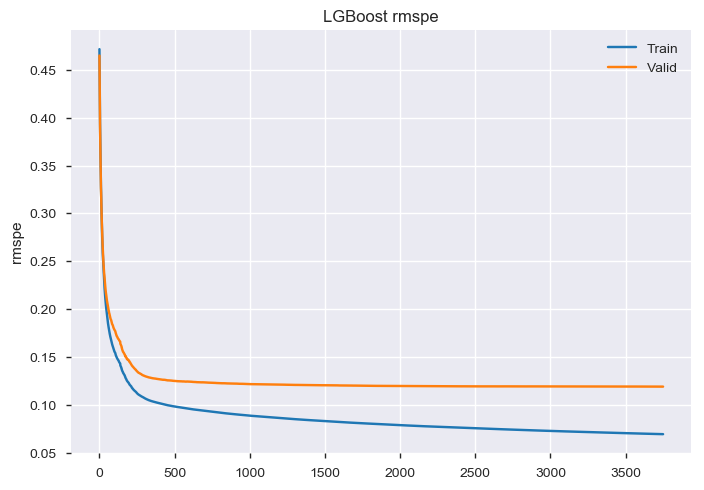

In [97]:
#绘制学习曲线
# retrieve performance metrics
results = clf.evals_result_
epochs = len(results['valid_1']['rmspe'])
x_axis = range(0, epochs)
# plot rmspe
fig, ax = plt.subplots()
ax.plot(x_axis, results['training']['rmspe'], label='Train')
ax.plot(x_axis, results['valid_1']['rmspe'], label='Valid')
ax.legend()
plt.ylabel('rmspe')
plt.title('LGBoost rmspe')
plt.show()

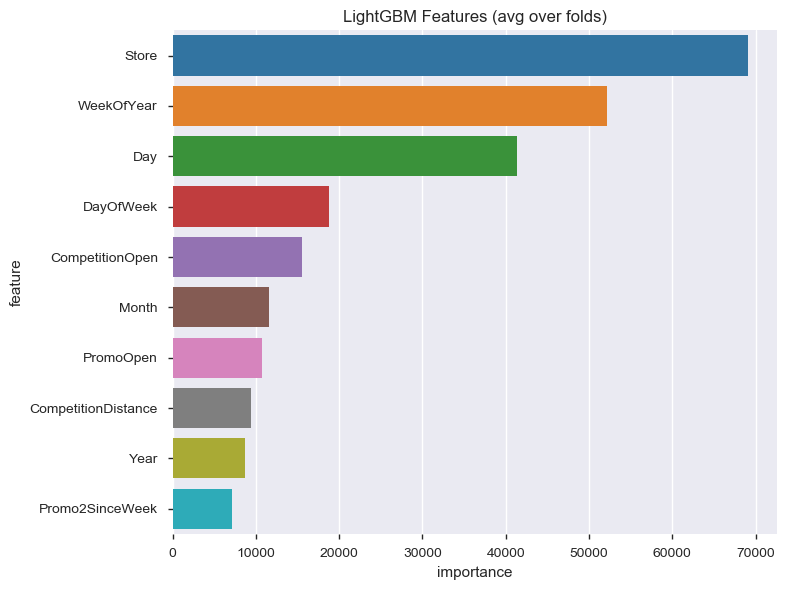

In [98]:
# 绘制特征重要性图

def display_importances(feature_importance_df_):
    cols = feature_importance_df_[["feature", "importance"]].groupby("feature").mean().sort_values(by="importance", ascending=False)[:10].index
    best_features = feature_importance_df_.loc[feature_importance_df_.feature.isin(cols)]
    plt.figure(figsize=(8, 6))
    sns.barplot(x="importance", y="feature", data=best_features.sort_values(by="importance", ascending=False))
    plt.title('LightGBM Features (avg over folds)')
    plt.tight_layout()
    plt.show()

feature_importance_df = pd.DataFrame() 
feature_importance_df["feature"] = list(x_train.columns)
feature_importance_df["importance"] = clf.feature_importances_
display_importances(feature_importance_df)

偏差整体校正
RMSPE for 0.990:0.137137
RMSPE for 0.991:0.133032
RMSPE for 0.992:0.129273
RMSPE for 0.993:0.125907
RMSPE for 0.994:0.122978
RMSPE for 0.995:0.120535
RMSPE for 0.996:0.118622
RMSPE for 0.997:0.117282
RMSPE for 0.998:0.116550
RMSPE for 0.999:0.116455
RMSPE for 1.000:0.117016
RMSPE for 1.001:0.118240
RMSPE for 1.002:0.120124
RMSPE for 1.003:0.122655
RMSPE for 1.004:0.125812
RMSPE for 1.005:0.129565
RMSPE for 1.006:0.133882
RMSPE for 1.007:0.138726
RMSPE for 1.008:0.144060
RMSPE for 1.009:0.149848
偏差整体校正得分为:0.999    0.116455
dtype: float64


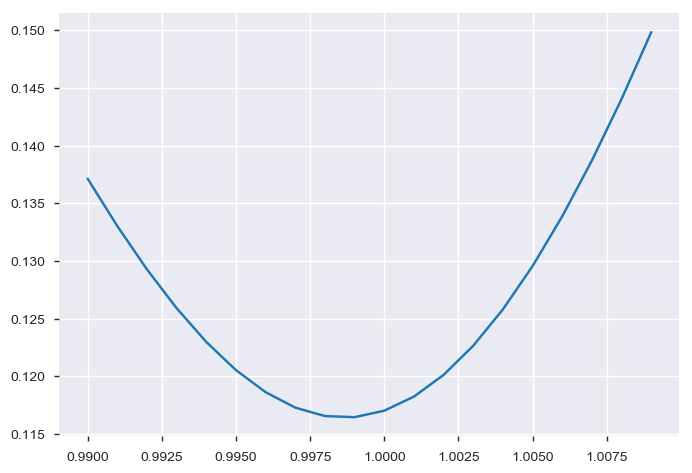

In [99]:
#偏差整体校正优化

print("偏差整体校正")
W=[(0.990+(i/1000)) for i in range(20)]
S =[]
for w in W:
    error = rmspe(np.expm1(y_valid), np.expm1(yhat*w))
    print('RMSPE for {:.3f}:{:.6f}'.format(w,error))
    S.append(error)
Score = pd.Series(S,index=W)
Score.plot()
BS = Score[Score.values == Score.values.min()]
print ('偏差整体校正得分为:{}'.format(BS))

In [100]:
#偏差细节校正优化
res = pd.merge(x_valid, pd.DataFrame(data = y_valid), left_index= True, right_index=True)
res['Prediction'] = yhat
L=range(1115)
W_ho=[]
W_test=[]
for i in L:
    s1 = pd.DataFrame(res[res['Store']==i+1],columns = ['Sales','Prediction'])
    s2 = pd.DataFrame(x_test[x_test['Store']==i+1])
    W1=[(0.990+(i/1000)) for i in range(20)]
    S =[]
    for w in W1:
        error = rmspe(np.expm1(s1.Sales), np.expm1(s1.Prediction*w))
        S.append(error)
    Score = pd.Series(S,index=W1)
    BS = Score[Score.values == Score.values.min()]
    a=np.array(BS.index.values)
    b_ho=a.repeat(len(s1))
    b_test=a.repeat(len(s2))
    W_ho.extend(b_ho.tolist())
    W_test.extend(b_test.tolist())
    
#yhat = clf.predict(x_valid, num_iteration=clf.best_iteration_)     
yhat_new = yhat * W_ho
error = rmspe(np.expm1(y_valid), np.expm1(yhat_new))
print ('偏差细节校正得分为:{:6f}'.format(error))

偏差细节校正得分为:0.107729


In [101]:
#训练融合模型
print("Train an new ensemble LGBoost model")
start = time()
rounds = 10
preds_ho = np.zeros((len(x_valid.index), rounds))
preds_test = np.zeros((len(x_test.index), rounds))
B=[]

for r in range(rounds):
    print('round {}:'.format(r+1))
    
    clf = lgb.LGBMRegressor(
        boosting_type="gbdt",
        num_leaves=85,
        min_child_weight=0.0005,
        min_child_samples=40,
        reg_alpha=0,
        reg_lambda=0,
        max_depth=9,
        n_estimators=8000,
        objective='regression',
        subsample=0.9,            # 在不进行重采样的情况下随机选择部分数据
        colsample_bytree=0.7,     # 每次迭代中随机选择部分特征
        subsample_freq=1,         # bagging 的频率, 0 意味着禁用 bagging. k 意味着每 k 次迭代执行bagging（subsample）
        learning_rate=0.06,
        random_state=49+r
        )
    
    clf.fit(x_train, y_train,eval_set=[(x_train, y_train),(x_valid, y_valid)], eval_metric=rmspe_lg, early_stopping_rounds=500,
            categorical_feature=['Store','DayOfWeek','Promo','StateHoliday','SchoolHoliday','StoreType','Assortment',
                             'CompetitionOpenSinceMonth','CompetitionOpenSinceYear','Promo2','Promo2SinceWeek','Promo2SinceYear',
                             'Year', 'Month','Day','WeekOfYear','IsPromoMonth'])
    
    yhat = clf.predict(x_valid, num_iteration=clf.best_iteration_)
    
    res['Prediction'] = yhat
    L=range(1115)
    W_ho=[]
    W_test=[]
    for i in L:
        s1 = pd.DataFrame(res[res['Store']==i+1],columns = ['Sales','Prediction'])
        s2 = pd.DataFrame(x_test[x_test['Store']==i+1])
        W1=[(0.990+(i/1000)) for i in range(20)]
        S =[]
        for w in W1:
            error = rmspe(np.expm1(s1.Sales), np.expm1(s1.Prediction*w))
            S.append(error)
        Score = pd.Series(S,index=W1)
        BS = Score[Score.values == Score.values.min()]
        a=np.array(BS.index.values)
        b_ho=a.repeat(len(s1))
        b_test=a.repeat(len(s2))
        W_ho.extend(b_ho.tolist())
        W_test.extend(b_test.tolist())
        
    yhat_ho = yhat*W_ho
    yhat_test = clf.predict(x_test, num_iteration=clf.best_iteration_)*W_test
    error = rmspe(np.expm1(y_valid), np.expm1(yhat_ho))
    B.append(error)
    preds_ho[:, r] = yhat_ho
    preds_test[:, r] = yhat_test
    print('round {} end, the error is {}'.format(r+1, error))

end = time()
time_spend = end-start
print('Training is end')
print('Training time is {} h.'.format(time_spend/3600))

Train an new ensemble LGBoost model
round 1:


G:\AIAIAI\lib\site-packages\lightgbm\basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is ['Assortment', 'CompetitionOpenSinceMonth', 'CompetitionOpenSinceYear', 'Day', 'DayOfWeek', 'IsPromoMonth', 'Month', 'Promo', 'Promo2', 'Promo2SinceWeek', 'Promo2SinceYear', 'SchoolHoliday', 'StateHoliday', 'Store', 'StoreType', 'WeekOfYear', 'Year']
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))
G:\AIAIAI\lib\site-packages\lightgbm\basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is ['Assortment', 'CompetitionOpenSinceMonth', 'CompetitionOpenSinceYear', 'Day', 'DayOfWeek', 'IsPromoMonth', 'Month', 'Promo', 'Promo2', 'Promo2SinceWeek', 'Promo2SinceYear', 'SchoolHoliday', 'StateHoliday', 'Store', 'StoreType', 'WeekOfYear', 'Year']
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))


[1]	training's l2: 0.168248	training's rmspe: 0.471598	valid_1's l2: 0.16047	valid_1's rmspe: 0.464945
Training until validation scores don't improve for 500 rounds.
[2]	training's l2: 0.156739	training's rmspe: 0.448532	valid_1's l2: 0.149198	valid_1's rmspe: 0.442679
[3]	training's l2: 0.147444	training's rmspe: 0.429579	valid_1's l2: 0.139904	valid_1's rmspe: 0.424347
[4]	training's l2: 0.138357	training's rmspe: 0.411621	valid_1's l2: 0.131062	valid_1's rmspe: 0.406837
[5]	training's l2: 0.130005	training's rmspe: 0.395091	valid_1's l2: 0.123011	valid_1's rmspe: 0.390982
[6]	training's l2: 0.124923	training's rmspe: 0.385453	valid_1's l2: 0.118176	valid_1's rmspe: 0.382372
[7]	training's l2: 0.118553	training's rmspe: 0.372723	valid_1's l2: 0.111668	valid_1's rmspe: 0.369286
[8]	training's l2: 0.112004	training's rmspe: 0.359874	valid_1's l2: 0.105307	valid_1's rmspe: 0.356851
[9]	training's l2: 0.106179	training's rmspe: 0.34838	valid_1's l2: 0.0997041	valid_1's rmspe: 0.345477
[1

[153]	training's l2: 0.017404	training's rmspe: 0.135378	valid_1's l2: 0.0212842	valid_1's rmspe: 0.157483
[154]	training's l2: 0.0173277	training's rmspe: 0.135137	valid_1's l2: 0.0212198	valid_1's rmspe: 0.157276
[155]	training's l2: 0.0172408	training's rmspe: 0.134793	valid_1's l2: 0.0211175	valid_1's rmspe: 0.156863
[156]	training's l2: 0.0171734	training's rmspe: 0.134548	valid_1's l2: 0.0210091	valid_1's rmspe: 0.156422
[157]	training's l2: 0.0171182	training's rmspe: 0.134165	valid_1's l2: 0.0209462	valid_1's rmspe: 0.15592
[158]	training's l2: 0.0169189	training's rmspe: 0.133456	valid_1's l2: 0.020768	valid_1's rmspe: 0.155348
[159]	training's l2: 0.0168786	training's rmspe: 0.133289	valid_1's l2: 0.0207303	valid_1's rmspe: 0.155192
[160]	training's l2: 0.0168216	training's rmspe: 0.13309	valid_1's l2: 0.0206965	valid_1's rmspe: 0.155014
[161]	training's l2: 0.0166913	training's rmspe: 0.132638	valid_1's l2: 0.0205767	valid_1's rmspe: 0.154652
[162]	training's l2: 0.0166509	t

[305]	training's l2: 0.0110367	training's rmspe: 0.106581	valid_1's l2: 0.0150806	valid_1's rmspe: 0.129847
[306]	training's l2: 0.0110298	training's rmspe: 0.106545	valid_1's l2: 0.0150744	valid_1's rmspe: 0.129817
[307]	training's l2: 0.0110175	training's rmspe: 0.106485	valid_1's l2: 0.0150658	valid_1's rmspe: 0.129762
[308]	training's l2: 0.0110053	training's rmspe: 0.106429	valid_1's l2: 0.0150563	valid_1's rmspe: 0.129749
[309]	training's l2: 0.0109836	training's rmspe: 0.106307	valid_1's l2: 0.0150393	valid_1's rmspe: 0.129674
[310]	training's l2: 0.0109671	training's rmspe: 0.106188	valid_1's l2: 0.0150242	valid_1's rmspe: 0.129599
[311]	training's l2: 0.0109581	training's rmspe: 0.106143	valid_1's l2: 0.0150167	valid_1's rmspe: 0.129577
[312]	training's l2: 0.0109443	training's rmspe: 0.10605	valid_1's l2: 0.0150028	valid_1's rmspe: 0.1295
[313]	training's l2: 0.0109282	training's rmspe: 0.105982	valid_1's l2: 0.0149785	valid_1's rmspe: 0.129364
[314]	training's l2: 0.0109183	

[456]	training's l2: 0.00973954	training's rmspe: 0.0995277	valid_1's l2: 0.0141522	valid_1's rmspe: 0.125528
[457]	training's l2: 0.0097344	training's rmspe: 0.0995026	valid_1's l2: 0.0141508	valid_1's rmspe: 0.125523
[458]	training's l2: 0.00973089	training's rmspe: 0.0994783	valid_1's l2: 0.0141479	valid_1's rmspe: 0.12551
[459]	training's l2: 0.00972586	training's rmspe: 0.0994537	valid_1's l2: 0.0141463	valid_1's rmspe: 0.1255
[460]	training's l2: 0.00972033	training's rmspe: 0.0994168	valid_1's l2: 0.0141417	valid_1's rmspe: 0.125477
[461]	training's l2: 0.00971669	training's rmspe: 0.0993983	valid_1's l2: 0.0141396	valid_1's rmspe: 0.12547
[462]	training's l2: 0.00971108	training's rmspe: 0.0993578	valid_1's l2: 0.0141359	valid_1's rmspe: 0.125455
[463]	training's l2: 0.00970376	training's rmspe: 0.0993184	valid_1's l2: 0.0141295	valid_1's rmspe: 0.125424
[464]	training's l2: 0.00969545	training's rmspe: 0.0992841	valid_1's l2: 0.0141468	valid_1's rmspe: 0.125504
[465]	training'

[604]	training's l2: 0.0090642	training's rmspe: 0.0957038	valid_1's l2: 0.0138494	valid_1's rmspe: 0.124173
[605]	training's l2: 0.0090599	training's rmspe: 0.0956788	valid_1's l2: 0.0138473	valid_1's rmspe: 0.124161
[606]	training's l2: 0.00905644	training's rmspe: 0.0956577	valid_1's l2: 0.0138469	valid_1's rmspe: 0.124155
[607]	training's l2: 0.00905278	training's rmspe: 0.0956335	valid_1's l2: 0.0138457	valid_1's rmspe: 0.124152
[608]	training's l2: 0.00904973	training's rmspe: 0.095615	valid_1's l2: 0.0138452	valid_1's rmspe: 0.12415
[609]	training's l2: 0.00904566	training's rmspe: 0.0955911	valid_1's l2: 0.0138419	valid_1's rmspe: 0.124132
[610]	training's l2: 0.00904284	training's rmspe: 0.0955727	valid_1's l2: 0.01384	valid_1's rmspe: 0.124125
[611]	training's l2: 0.00903404	training's rmspe: 0.0955276	valid_1's l2: 0.0138366	valid_1's rmspe: 0.124098
[612]	training's l2: 0.00903035	training's rmspe: 0.09551	valid_1's l2: 0.0138365	valid_1's rmspe: 0.124099
[613]	training's l

[752]	training's l2: 0.0085579	training's rmspe: 0.0927562	valid_1's l2: 0.0136013	valid_1's rmspe: 0.123011
[753]	training's l2: 0.0085548	training's rmspe: 0.0927334	valid_1's l2: 0.0136005	valid_1's rmspe: 0.123009
[754]	training's l2: 0.0085525	training's rmspe: 0.0927199	valid_1's l2: 0.0135998	valid_1's rmspe: 0.123006
[755]	training's l2: 0.00854903	training's rmspe: 0.0927019	valid_1's l2: 0.0135987	valid_1's rmspe: 0.123
[756]	training's l2: 0.00854638	training's rmspe: 0.0926816	valid_1's l2: 0.0135973	valid_1's rmspe: 0.12299
[757]	training's l2: 0.0085434	training's rmspe: 0.0926666	valid_1's l2: 0.0135954	valid_1's rmspe: 0.12298
[758]	training's l2: 0.00853931	training's rmspe: 0.092643	valid_1's l2: 0.0135907	valid_1's rmspe: 0.122956
[759]	training's l2: 0.00853627	training's rmspe: 0.0926239	valid_1's l2: 0.0135901	valid_1's rmspe: 0.122946
[760]	training's l2: 0.00853364	training's rmspe: 0.0926089	valid_1's l2: 0.0135886	valid_1's rmspe: 0.122939
[761]	training's l2:

[900]	training's l2: 0.00812496	training's rmspe: 0.0901718	valid_1's l2: 0.0134334	valid_1's rmspe: 0.122165
[901]	training's l2: 0.00812241	training's rmspe: 0.0901562	valid_1's l2: 0.0134316	valid_1's rmspe: 0.122157
[902]	training's l2: 0.00811916	training's rmspe: 0.0901383	valid_1's l2: 0.0134334	valid_1's rmspe: 0.122166
[903]	training's l2: 0.00811758	training's rmspe: 0.0901301	valid_1's l2: 0.0134336	valid_1's rmspe: 0.122162
[904]	training's l2: 0.00811391	training's rmspe: 0.0901101	valid_1's l2: 0.0134299	valid_1's rmspe: 0.122148
[905]	training's l2: 0.00811132	training's rmspe: 0.0900947	valid_1's l2: 0.013429	valid_1's rmspe: 0.122144
[906]	training's l2: 0.00810938	training's rmspe: 0.0900801	valid_1's l2: 0.0134281	valid_1's rmspe: 0.122142
[907]	training's l2: 0.00810687	training's rmspe: 0.0900594	valid_1's l2: 0.0134274	valid_1's rmspe: 0.122133
[908]	training's l2: 0.008105	training's rmspe: 0.090049	valid_1's l2: 0.0134371	valid_1's rmspe: 0.122206
[909]	training

[1048]	training's l2: 0.00776868	training's rmspe: 0.0880221	valid_1's l2: 0.0132788	valid_1's rmspe: 0.121467
[1049]	training's l2: 0.00776589	training's rmspe: 0.0880059	valid_1's l2: 0.0132779	valid_1's rmspe: 0.121465
[1050]	training's l2: 0.00776387	training's rmspe: 0.087995	valid_1's l2: 0.0132782	valid_1's rmspe: 0.121467
[1051]	training's l2: 0.00776062	training's rmspe: 0.0879761	valid_1's l2: 0.0132815	valid_1's rmspe: 0.121474
[1052]	training's l2: 0.00775801	training's rmspe: 0.0879619	valid_1's l2: 0.0132813	valid_1's rmspe: 0.121475
[1053]	training's l2: 0.00775666	training's rmspe: 0.0879539	valid_1's l2: 0.0132809	valid_1's rmspe: 0.121475
[1054]	training's l2: 0.0077548	training's rmspe: 0.0879436	valid_1's l2: 0.0132804	valid_1's rmspe: 0.121473
[1055]	training's l2: 0.00775284	training's rmspe: 0.0879303	valid_1's l2: 0.0132809	valid_1's rmspe: 0.121476
[1056]	training's l2: 0.00775054	training's rmspe: 0.0879135	valid_1's l2: 0.0132803	valid_1's rmspe: 0.121476
[10

[1196]	training's l2: 0.00746754	training's rmspe: 0.0861929	valid_1's l2: 0.0132023	valid_1's rmspe: 0.12116
[1197]	training's l2: 0.00746622	training's rmspe: 0.0861856	valid_1's l2: 0.0132013	valid_1's rmspe: 0.121156
[1198]	training's l2: 0.00746474	training's rmspe: 0.0861763	valid_1's l2: 0.0132031	valid_1's rmspe: 0.121165
[1199]	training's l2: 0.00746253	training's rmspe: 0.0861624	valid_1's l2: 0.0132037	valid_1's rmspe: 0.121169
[1200]	training's l2: 0.00746071	training's rmspe: 0.0861511	valid_1's l2: 0.013204	valid_1's rmspe: 0.121171
[1201]	training's l2: 0.00745893	training's rmspe: 0.0861421	valid_1's l2: 0.0132061	valid_1's rmspe: 0.121179
[1202]	training's l2: 0.00745714	training's rmspe: 0.0861309	valid_1's l2: 0.0132046	valid_1's rmspe: 0.121172
[1203]	training's l2: 0.00745538	training's rmspe: 0.0861188	valid_1's l2: 0.0132031	valid_1's rmspe: 0.121164
[1204]	training's l2: 0.00745388	training's rmspe: 0.0861103	valid_1's l2: 0.0131999	valid_1's rmspe: 0.121136
[12

[1344]	training's l2: 0.00719915	training's rmspe: 0.0845571	valid_1's l2: 0.0131033	valid_1's rmspe: 0.12072
[1345]	training's l2: 0.00719747	training's rmspe: 0.0845473	valid_1's l2: 0.0131025	valid_1's rmspe: 0.120717
[1346]	training's l2: 0.0071962	training's rmspe: 0.0845398	valid_1's l2: 0.013102	valid_1's rmspe: 0.120714
[1347]	training's l2: 0.00719417	training's rmspe: 0.0845261	valid_1's l2: 0.0131017	valid_1's rmspe: 0.120714
[1348]	training's l2: 0.00719268	training's rmspe: 0.0845162	valid_1's l2: 0.0131016	valid_1's rmspe: 0.120712
[1349]	training's l2: 0.00719065	training's rmspe: 0.0845025	valid_1's l2: 0.0131024	valid_1's rmspe: 0.120717
[1350]	training's l2: 0.00718879	training's rmspe: 0.0844905	valid_1's l2: 0.0131017	valid_1's rmspe: 0.120715
[1351]	training's l2: 0.00718744	training's rmspe: 0.0844832	valid_1's l2: 0.0131019	valid_1's rmspe: 0.120713
[1352]	training's l2: 0.00718549	training's rmspe: 0.0844707	valid_1's l2: 0.0131006	valid_1's rmspe: 0.120708
[135

[1492]	training's l2: 0.00695118	training's rmspe: 0.0830235	valid_1's l2: 0.0130331	valid_1's rmspe: 0.120429
[1493]	training's l2: 0.00694958	training's rmspe: 0.0830138	valid_1's l2: 0.0130336	valid_1's rmspe: 0.120429
[1494]	training's l2: 0.00694769	training's rmspe: 0.0830022	valid_1's l2: 0.0130321	valid_1's rmspe: 0.12042
[1495]	training's l2: 0.00694614	training's rmspe: 0.0829932	valid_1's l2: 0.013035	valid_1's rmspe: 0.120435
[1496]	training's l2: 0.00694421	training's rmspe: 0.0829853	valid_1's l2: 0.0130353	valid_1's rmspe: 0.120437
[1497]	training's l2: 0.00694283	training's rmspe: 0.0829786	valid_1's l2: 0.0130341	valid_1's rmspe: 0.120439
[1498]	training's l2: 0.00694101	training's rmspe: 0.0829675	valid_1's l2: 0.0130345	valid_1's rmspe: 0.120442
[1499]	training's l2: 0.00693977	training's rmspe: 0.0829581	valid_1's l2: 0.0130336	valid_1's rmspe: 0.120438
[1500]	training's l2: 0.00693781	training's rmspe: 0.0829426	valid_1's l2: 0.0130338	valid_1's rmspe: 0.120438
[15

[1640]	training's l2: 0.00673281	training's rmspe: 0.081665	valid_1's l2: 0.012982	valid_1's rmspe: 0.120169
[1641]	training's l2: 0.00673154	training's rmspe: 0.0816563	valid_1's l2: 0.0129817	valid_1's rmspe: 0.120164
[1642]	training's l2: 0.00673037	training's rmspe: 0.0816471	valid_1's l2: 0.0129816	valid_1's rmspe: 0.120162
[1643]	training's l2: 0.00672875	training's rmspe: 0.0816362	valid_1's l2: 0.0129817	valid_1's rmspe: 0.120162
[1644]	training's l2: 0.00672753	training's rmspe: 0.0816292	valid_1's l2: 0.0129818	valid_1's rmspe: 0.120166
[1645]	training's l2: 0.00672605	training's rmspe: 0.0816165	valid_1's l2: 0.0129809	valid_1's rmspe: 0.120165
[1646]	training's l2: 0.00672474	training's rmspe: 0.0816077	valid_1's l2: 0.0129811	valid_1's rmspe: 0.120164
[1647]	training's l2: 0.00672304	training's rmspe: 0.0815964	valid_1's l2: 0.0129799	valid_1's rmspe: 0.120154
[1648]	training's l2: 0.00672177	training's rmspe: 0.0815877	valid_1's l2: 0.0129791	valid_1's rmspe: 0.12015
[164

[1788]	training's l2: 0.00653695	training's rmspe: 0.0804085	valid_1's l2: 0.0129319	valid_1's rmspe: 0.119868
[1789]	training's l2: 0.00653608	training's rmspe: 0.0804026	valid_1's l2: 0.0129317	valid_1's rmspe: 0.119868
[1790]	training's l2: 0.00653427	training's rmspe: 0.0803926	valid_1's l2: 0.0129307	valid_1's rmspe: 0.119864
[1791]	training's l2: 0.00653309	training's rmspe: 0.0803848	valid_1's l2: 0.0129305	valid_1's rmspe: 0.119865
[1792]	training's l2: 0.006532	training's rmspe: 0.0803779	valid_1's l2: 0.0129302	valid_1's rmspe: 0.119864
[1793]	training's l2: 0.00653096	training's rmspe: 0.080372	valid_1's l2: 0.0129292	valid_1's rmspe: 0.119862
[1794]	training's l2: 0.0065296	training's rmspe: 0.0803636	valid_1's l2: 0.0129287	valid_1's rmspe: 0.119859
[1795]	training's l2: 0.0065284	training's rmspe: 0.080356	valid_1's l2: 0.0129287	valid_1's rmspe: 0.119859
[1796]	training's l2: 0.00652697	training's rmspe: 0.0803463	valid_1's l2: 0.0129288	valid_1's rmspe: 0.119864
[1797]	

[1936]	training's l2: 0.00635019	training's rmspe: 0.0792232	valid_1's l2: 0.0128937	valid_1's rmspe: 0.119716
[1937]	training's l2: 0.00634854	training's rmspe: 0.0792138	valid_1's l2: 0.0128918	valid_1's rmspe: 0.119707
[1938]	training's l2: 0.00634737	training's rmspe: 0.0792067	valid_1's l2: 0.0128911	valid_1's rmspe: 0.119704
[1939]	training's l2: 0.00634615	training's rmspe: 0.0791989	valid_1's l2: 0.0128896	valid_1's rmspe: 0.119697
[1940]	training's l2: 0.0063451	training's rmspe: 0.079191	valid_1's l2: 0.0128898	valid_1's rmspe: 0.1197
[1941]	training's l2: 0.00634365	training's rmspe: 0.0791836	valid_1's l2: 0.0128902	valid_1's rmspe: 0.119701
[1942]	training's l2: 0.0063425	training's rmspe: 0.0791766	valid_1's l2: 0.0128905	valid_1's rmspe: 0.119702
[1943]	training's l2: 0.00634148	training's rmspe: 0.0791697	valid_1's l2: 0.0128909	valid_1's rmspe: 0.119704
[1944]	training's l2: 0.00634064	training's rmspe: 0.0791642	valid_1's l2: 0.0128887	valid_1's rmspe: 0.119693
[1945]

[2084]	training's l2: 0.00618379	training's rmspe: 0.0781622	valid_1's l2: 0.012852	valid_1's rmspe: 0.119545
[2085]	training's l2: 0.00618292	training's rmspe: 0.0781551	valid_1's l2: 0.0128519	valid_1's rmspe: 0.119543
[2086]	training's l2: 0.00618175	training's rmspe: 0.0781485	valid_1's l2: 0.012853	valid_1's rmspe: 0.119547
[2087]	training's l2: 0.0061807	training's rmspe: 0.0781421	valid_1's l2: 0.0128523	valid_1's rmspe: 0.119546
[2088]	training's l2: 0.00617956	training's rmspe: 0.078134	valid_1's l2: 0.0128517	valid_1's rmspe: 0.119538
[2089]	training's l2: 0.00617877	training's rmspe: 0.0781289	valid_1's l2: 0.0128528	valid_1's rmspe: 0.119545
[2090]	training's l2: 0.00617763	training's rmspe: 0.0781208	valid_1's l2: 0.0128521	valid_1's rmspe: 0.119546
[2091]	training's l2: 0.00617624	training's rmspe: 0.0781114	valid_1's l2: 0.0128513	valid_1's rmspe: 0.119543
[2092]	training's l2: 0.00617493	training's rmspe: 0.078103	valid_1's l2: 0.0128496	valid_1's rmspe: 0.119534
[2093]

[2232]	training's l2: 0.00602883	training's rmspe: 0.0771471	valid_1's l2: 0.0128243	valid_1's rmspe: 0.119405
[2233]	training's l2: 0.00602764	training's rmspe: 0.0771404	valid_1's l2: 0.0128243	valid_1's rmspe: 0.119405
[2234]	training's l2: 0.00602683	training's rmspe: 0.077135	valid_1's l2: 0.0128241	valid_1's rmspe: 0.119405
[2235]	training's l2: 0.00602575	training's rmspe: 0.0771274	valid_1's l2: 0.0128263	valid_1's rmspe: 0.119413
[2236]	training's l2: 0.00602428	training's rmspe: 0.0771198	valid_1's l2: 0.0128259	valid_1's rmspe: 0.11941
[2237]	training's l2: 0.00602345	training's rmspe: 0.0771143	valid_1's l2: 0.012826	valid_1's rmspe: 0.11941
[2238]	training's l2: 0.00602265	training's rmspe: 0.0771089	valid_1's l2: 0.0128262	valid_1's rmspe: 0.119411
[2239]	training's l2: 0.0060215	training's rmspe: 0.0771021	valid_1's l2: 0.0128258	valid_1's rmspe: 0.119411
[2240]	training's l2: 0.00602087	training's rmspe: 0.0770979	valid_1's l2: 0.0128262	valid_1's rmspe: 0.119416
[2241]

[2380]	training's l2: 0.00588532	training's rmspe: 0.0762104	valid_1's l2: 0.0128064	valid_1's rmspe: 0.119339
[2381]	training's l2: 0.00588438	training's rmspe: 0.0762034	valid_1's l2: 0.0128063	valid_1's rmspe: 0.119338
[2382]	training's l2: 0.00588351	training's rmspe: 0.0761969	valid_1's l2: 0.0128069	valid_1's rmspe: 0.119341
[2383]	training's l2: 0.00588254	training's rmspe: 0.0761928	valid_1's l2: 0.0128072	valid_1's rmspe: 0.119339
[2384]	training's l2: 0.0058815	training's rmspe: 0.0761869	valid_1's l2: 0.0128079	valid_1's rmspe: 0.119345
[2385]	training's l2: 0.00588048	training's rmspe: 0.0761803	valid_1's l2: 0.0128077	valid_1's rmspe: 0.119343
[2386]	training's l2: 0.00587949	training's rmspe: 0.0761744	valid_1's l2: 0.0128078	valid_1's rmspe: 0.119345
[2387]	training's l2: 0.0058789	training's rmspe: 0.0761703	valid_1's l2: 0.0128079	valid_1's rmspe: 0.119337
[2388]	training's l2: 0.00587818	training's rmspe: 0.0761653	valid_1's l2: 0.0128083	valid_1's rmspe: 0.119336
[23

[2528]	training's l2: 0.00575036	training's rmspe: 0.0753234	valid_1's l2: 0.0127875	valid_1's rmspe: 0.119273
[2529]	training's l2: 0.00574943	training's rmspe: 0.0753173	valid_1's l2: 0.0127871	valid_1's rmspe: 0.119272
[2530]	training's l2: 0.0057486	training's rmspe: 0.0753119	valid_1's l2: 0.0127871	valid_1's rmspe: 0.119273
[2531]	training's l2: 0.00574801	training's rmspe: 0.0753081	valid_1's l2: 0.0127862	valid_1's rmspe: 0.119269
[2532]	training's l2: 0.00574715	training's rmspe: 0.0753027	valid_1's l2: 0.0127852	valid_1's rmspe: 0.119262
[2533]	training's l2: 0.00574615	training's rmspe: 0.0752949	valid_1's l2: 0.0127859	valid_1's rmspe: 0.119269
[2534]	training's l2: 0.00574524	training's rmspe: 0.075289	valid_1's l2: 0.0127868	valid_1's rmspe: 0.119274
[2535]	training's l2: 0.00574408	training's rmspe: 0.0752825	valid_1's l2: 0.012787	valid_1's rmspe: 0.119275
[2536]	training's l2: 0.00574344	training's rmspe: 0.0752781	valid_1's l2: 0.0127868	valid_1's rmspe: 0.119274
[253

[2676]	training's l2: 0.00562328	training's rmspe: 0.0744813	valid_1's l2: 0.0127781	valid_1's rmspe: 0.119236
[2677]	training's l2: 0.00562273	training's rmspe: 0.0744771	valid_1's l2: 0.0127785	valid_1's rmspe: 0.119237
[2678]	training's l2: 0.00562179	training's rmspe: 0.0744708	valid_1's l2: 0.0127787	valid_1's rmspe: 0.119238
[2679]	training's l2: 0.00562083	training's rmspe: 0.0744648	valid_1's l2: 0.012779	valid_1's rmspe: 0.119239
[2680]	training's l2: 0.00561958	training's rmspe: 0.0744576	valid_1's l2: 0.0127793	valid_1's rmspe: 0.119245
[2681]	training's l2: 0.00561838	training's rmspe: 0.0744504	valid_1's l2: 0.0127803	valid_1's rmspe: 0.119252
[2682]	training's l2: 0.00561768	training's rmspe: 0.0744444	valid_1's l2: 0.0127802	valid_1's rmspe: 0.119251
[2683]	training's l2: 0.00561675	training's rmspe: 0.0744378	valid_1's l2: 0.0127806	valid_1's rmspe: 0.119255
[2684]	training's l2: 0.00561594	training's rmspe: 0.074432	valid_1's l2: 0.0127813	valid_1's rmspe: 0.11926
[268

[2824]	training's l2: 0.00550191	training's rmspe: 0.0736547	valid_1's l2: 0.0127744	valid_1's rmspe: 0.119223
[2825]	training's l2: 0.00550138	training's rmspe: 0.0736499	valid_1's l2: 0.0127744	valid_1's rmspe: 0.119223
[2826]	training's l2: 0.00550033	training's rmspe: 0.0736434	valid_1's l2: 0.0127749	valid_1's rmspe: 0.119226
[2827]	training's l2: 0.00549984	training's rmspe: 0.0736399	valid_1's l2: 0.012776	valid_1's rmspe: 0.119227
[2828]	training's l2: 0.00549929	training's rmspe: 0.0736357	valid_1's l2: 0.0127759	valid_1's rmspe: 0.119224
[2829]	training's l2: 0.00549846	training's rmspe: 0.0736291	valid_1's l2: 0.0127761	valid_1's rmspe: 0.119225
[2830]	training's l2: 0.00549745	training's rmspe: 0.0736225	valid_1's l2: 0.0127762	valid_1's rmspe: 0.119223
[2831]	training's l2: 0.00549646	training's rmspe: 0.0736169	valid_1's l2: 0.0127763	valid_1's rmspe: 0.119225
[2832]	training's l2: 0.00549581	training's rmspe: 0.0736117	valid_1's l2: 0.0127748	valid_1's rmspe: 0.119217
[2

[2972]	training's l2: 0.0053853	training's rmspe: 0.0728673	valid_1's l2: 0.0127529	valid_1's rmspe: 0.119127
[2973]	training's l2: 0.00538452	training's rmspe: 0.0728626	valid_1's l2: 0.0127533	valid_1's rmspe: 0.119127
[2974]	training's l2: 0.00538377	training's rmspe: 0.0728573	valid_1's l2: 0.0127533	valid_1's rmspe: 0.119128
[2975]	training's l2: 0.00538306	training's rmspe: 0.0728524	valid_1's l2: 0.0127534	valid_1's rmspe: 0.119127
[2976]	training's l2: 0.00538222	training's rmspe: 0.0728478	valid_1's l2: 0.0127545	valid_1's rmspe: 0.119134
[2977]	training's l2: 0.00538148	training's rmspe: 0.072842	valid_1's l2: 0.0127537	valid_1's rmspe: 0.119134
[2978]	training's l2: 0.00538094	training's rmspe: 0.0728377	valid_1's l2: 0.012754	valid_1's rmspe: 0.119136
[2979]	training's l2: 0.00538039	training's rmspe: 0.0728336	valid_1's l2: 0.0127546	valid_1's rmspe: 0.11914
[2980]	training's l2: 0.00537955	training's rmspe: 0.0728284	valid_1's l2: 0.0127544	valid_1's rmspe: 0.119139
[2981

[3120]	training's l2: 0.0052791	training's rmspe: 0.0721383	valid_1's l2: 0.0127433	valid_1's rmspe: 0.119107
[3121]	training's l2: 0.00527842	training's rmspe: 0.0721328	valid_1's l2: 0.0127429	valid_1's rmspe: 0.119105
[3122]	training's l2: 0.00527764	training's rmspe: 0.0721275	valid_1's l2: 0.0127439	valid_1's rmspe: 0.11911
[3123]	training's l2: 0.00527715	training's rmspe: 0.0721237	valid_1's l2: 0.0127437	valid_1's rmspe: 0.119107
[3124]	training's l2: 0.00527643	training's rmspe: 0.0721186	valid_1's l2: 0.0127436	valid_1's rmspe: 0.119105
[3125]	training's l2: 0.00527575	training's rmspe: 0.0721136	valid_1's l2: 0.0127435	valid_1's rmspe: 0.119104
[3126]	training's l2: 0.00527533	training's rmspe: 0.0721105	valid_1's l2: 0.0127439	valid_1's rmspe: 0.11911
[3127]	training's l2: 0.00527479	training's rmspe: 0.0721069	valid_1's l2: 0.0127444	valid_1's rmspe: 0.119114
[3128]	training's l2: 0.0052744	training's rmspe: 0.0721046	valid_1's l2: 0.0127445	valid_1's rmspe: 0.119114
[3129

[3268]	training's l2: 0.00517996	training's rmspe: 0.0714481	valid_1's l2: 0.0127263	valid_1's rmspe: 0.119015
[3269]	training's l2: 0.00517921	training's rmspe: 0.071443	valid_1's l2: 0.0127262	valid_1's rmspe: 0.119013
[3270]	training's l2: 0.00517854	training's rmspe: 0.071439	valid_1's l2: 0.0127263	valid_1's rmspe: 0.119016
[3271]	training's l2: 0.00517804	training's rmspe: 0.0714352	valid_1's l2: 0.0127265	valid_1's rmspe: 0.119016
[3272]	training's l2: 0.00517749	training's rmspe: 0.0714314	valid_1's l2: 0.0127265	valid_1's rmspe: 0.119017
[3273]	training's l2: 0.00517692	training's rmspe: 0.0714273	valid_1's l2: 0.0127263	valid_1's rmspe: 0.119014
[3274]	training's l2: 0.00517649	training's rmspe: 0.0714242	valid_1's l2: 0.0127258	valid_1's rmspe: 0.119013
[3275]	training's l2: 0.0051757	training's rmspe: 0.0714196	valid_1's l2: 0.0127258	valid_1's rmspe: 0.119012
[3276]	training's l2: 0.005175	training's rmspe: 0.0714146	valid_1's l2: 0.0127267	valid_1's rmspe: 0.119016
[3277]

[3416]	training's l2: 0.0050839	training's rmspe: 0.0707761	valid_1's l2: 0.0127358	valid_1's rmspe: 0.119062
[3417]	training's l2: 0.00508325	training's rmspe: 0.0707723	valid_1's l2: 0.0127352	valid_1's rmspe: 0.11906
[3418]	training's l2: 0.0050827	training's rmspe: 0.0707685	valid_1's l2: 0.0127343	valid_1's rmspe: 0.11907
[3419]	training's l2: 0.00508192	training's rmspe: 0.0707632	valid_1's l2: 0.0127337	valid_1's rmspe: 0.119067
[3420]	training's l2: 0.00508102	training's rmspe: 0.070757	valid_1's l2: 0.0127339	valid_1's rmspe: 0.119068
[3421]	training's l2: 0.00508047	training's rmspe: 0.0707532	valid_1's l2: 0.0127338	valid_1's rmspe: 0.119066
[3422]	training's l2: 0.00507983	training's rmspe: 0.0707487	valid_1's l2: 0.0127341	valid_1's rmspe: 0.119067
[3423]	training's l2: 0.00507938	training's rmspe: 0.0707453	valid_1's l2: 0.0127334	valid_1's rmspe: 0.119063
[3424]	training's l2: 0.00507868	training's rmspe: 0.0707397	valid_1's l2: 0.0127336	valid_1's rmspe: 0.119063
[3425]

[3564]	training's l2: 0.00498926	training's rmspe: 0.0701141	valid_1's l2: 0.012741	valid_1's rmspe: 0.119099
[3565]	training's l2: 0.00498878	training's rmspe: 0.0701097	valid_1's l2: 0.0127409	valid_1's rmspe: 0.119098
[3566]	training's l2: 0.0049881	training's rmspe: 0.070105	valid_1's l2: 0.0127405	valid_1's rmspe: 0.119097
[3567]	training's l2: 0.00498761	training's rmspe: 0.0701019	valid_1's l2: 0.0127407	valid_1's rmspe: 0.119098
[3568]	training's l2: 0.00498723	training's rmspe: 0.0700992	valid_1's l2: 0.0127404	valid_1's rmspe: 0.119096
[3569]	training's l2: 0.00498662	training's rmspe: 0.0700944	valid_1's l2: 0.0127406	valid_1's rmspe: 0.119098
[3570]	training's l2: 0.0049862	training's rmspe: 0.0700912	valid_1's l2: 0.0127401	valid_1's rmspe: 0.119097
[3571]	training's l2: 0.00498559	training's rmspe: 0.0700863	valid_1's l2: 0.0127396	valid_1's rmspe: 0.119094
[3572]	training's l2: 0.00498486	training's rmspe: 0.0700813	valid_1's l2: 0.0127391	valid_1's rmspe: 0.119091
[3573

[3712]	training's l2: 0.00490015	training's rmspe: 0.0694843	valid_1's l2: 0.0127301	valid_1's rmspe: 0.119039
[3713]	training's l2: 0.00489942	training's rmspe: 0.0694791	valid_1's l2: 0.01273	valid_1's rmspe: 0.119037
[3714]	training's l2: 0.00489899	training's rmspe: 0.0694756	valid_1's l2: 0.0127299	valid_1's rmspe: 0.119033
[3715]	training's l2: 0.00489826	training's rmspe: 0.0694706	valid_1's l2: 0.0127301	valid_1's rmspe: 0.119035
[3716]	training's l2: 0.0048977	training's rmspe: 0.0694663	valid_1's l2: 0.0127301	valid_1's rmspe: 0.119035
[3717]	training's l2: 0.00489709	training's rmspe: 0.0694612	valid_1's l2: 0.01273	valid_1's rmspe: 0.119031
[3718]	training's l2: 0.00489651	training's rmspe: 0.0694567	valid_1's l2: 0.0127296	valid_1's rmspe: 0.11903
[3719]	training's l2: 0.00489597	training's rmspe: 0.0694523	valid_1's l2: 0.0127285	valid_1's rmspe: 0.119025
[3720]	training's l2: 0.00489544	training's rmspe: 0.0694491	valid_1's l2: 0.0127289	valid_1's rmspe: 0.119025
[3721]	

G:\AIAIAI\lib\site-packages\lightgbm\basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is ['Assortment', 'CompetitionOpenSinceMonth', 'CompetitionOpenSinceYear', 'Day', 'DayOfWeek', 'IsPromoMonth', 'Month', 'Promo', 'Promo2', 'Promo2SinceWeek', 'Promo2SinceYear', 'SchoolHoliday', 'StateHoliday', 'Store', 'StoreType', 'WeekOfYear', 'Year']
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))
G:\AIAIAI\lib\site-packages\lightgbm\basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is ['Assortment', 'CompetitionOpenSinceMonth', 'CompetitionOpenSinceYear', 'Day', 'DayOfWeek', 'IsPromoMonth', 'Month', 'Promo', 'Promo2', 'Promo2SinceWeek', 'Promo2SinceYear', 'SchoolHoliday', 'StateHoliday', 'Store', 'StoreType', 'WeekOfYear', 'Year']
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))


[1]	training's l2: 0.168133	training's rmspe: 0.471065	valid_1's l2: 0.16027	valid_1's rmspe: 0.464121
Training until validation scores don't improve for 500 rounds.
[2]	training's l2: 0.156931	training's rmspe: 0.448408	valid_1's l2: 0.1491	valid_1's rmspe: 0.441019
[3]	training's l2: 0.146952	training's rmspe: 0.428482	valid_1's l2: 0.139272	valid_1's rmspe: 0.421046
[4]	training's l2: 0.137679	training's rmspe: 0.409934	valid_1's l2: 0.130065	valid_1's rmspe: 0.402468
[5]	training's l2: 0.13377	training's rmspe: 0.402388	valid_1's l2: 0.125909	valid_1's rmspe: 0.394852
[6]	training's l2: 0.125772	training's rmspe: 0.385979	valid_1's l2: 0.118249	valid_1's rmspe: 0.379224
[7]	training's l2: 0.119114	training's rmspe: 0.37209	valid_1's l2: 0.111727	valid_1's rmspe: 0.365987
[8]	training's l2: 0.112662	training's rmspe: 0.359974	valid_1's l2: 0.105541	valid_1's rmspe: 0.354044
[9]	training's l2: 0.108865	training's rmspe: 0.352795	valid_1's l2: 0.102	valid_1's rmspe: 0.348042
[10]	trai

[153]	training's l2: 0.0174005	training's rmspe: 0.133253	valid_1's l2: 0.0212686	valid_1's rmspe: 0.158633
[154]	training's l2: 0.0173479	training's rmspe: 0.133039	valid_1's l2: 0.0212219	valid_1's rmspe: 0.15844
[155]	training's l2: 0.0172893	training's rmspe: 0.132819	valid_1's l2: 0.021109	valid_1's rmspe: 0.158051
[156]	training's l2: 0.0172179	training's rmspe: 0.13256	valid_1's l2: 0.0210137	valid_1's rmspe: 0.157758
[157]	training's l2: 0.017172	training's rmspe: 0.132386	valid_1's l2: 0.020981	valid_1's rmspe: 0.157678
[158]	training's l2: 0.0171062	training's rmspe: 0.132148	valid_1's l2: 0.020917	valid_1's rmspe: 0.157363
[159]	training's l2: 0.017062	training's rmspe: 0.131987	valid_1's l2: 0.0208525	valid_1's rmspe: 0.157204
[160]	training's l2: 0.0170145	training's rmspe: 0.131811	valid_1's l2: 0.0207872	valid_1's rmspe: 0.156839
[161]	training's l2: 0.0169574	training's rmspe: 0.131543	valid_1's l2: 0.0207293	valid_1's rmspe: 0.156196
[162]	training's l2: 0.016908	train

[305]	training's l2: 0.0115038	training's rmspe: 0.108618	valid_1's l2: 0.0155319	valid_1's rmspe: 0.13138
[306]	training's l2: 0.0114917	training's rmspe: 0.108554	valid_1's l2: 0.015518	valid_1's rmspe: 0.131319
[307]	training's l2: 0.0114816	training's rmspe: 0.108506	valid_1's l2: 0.0155075	valid_1's rmspe: 0.131284
[308]	training's l2: 0.0114207	training's rmspe: 0.108233	valid_1's l2: 0.0154531	valid_1's rmspe: 0.131077
[309]	training's l2: 0.0113975	training's rmspe: 0.108131	valid_1's l2: 0.0154405	valid_1's rmspe: 0.131027
[310]	training's l2: 0.0113885	training's rmspe: 0.108071	valid_1's l2: 0.0154264	valid_1's rmspe: 0.130968
[311]	training's l2: 0.0113787	training's rmspe: 0.108023	valid_1's l2: 0.0154221	valid_1's rmspe: 0.130934
[312]	training's l2: 0.0113442	training's rmspe: 0.107861	valid_1's l2: 0.0153922	valid_1's rmspe: 0.130813
[313]	training's l2: 0.0113352	training's rmspe: 0.107817	valid_1's l2: 0.015385	valid_1's rmspe: 0.130786
[314]	training's l2: 0.0113071	

[457]	training's l2: 0.010036	training's rmspe: 0.101026	valid_1's l2: 0.0143444	valid_1's rmspe: 0.125926
[458]	training's l2: 0.0100312	training's rmspe: 0.100997	valid_1's l2: 0.0143398	valid_1's rmspe: 0.125901
[459]	training's l2: 0.0100224	training's rmspe: 0.100946	valid_1's l2: 0.0143332	valid_1's rmspe: 0.125864
[460]	training's l2: 0.0100153	training's rmspe: 0.100903	valid_1's l2: 0.0143325	valid_1's rmspe: 0.125858
[461]	training's l2: 0.0100055	training's rmspe: 0.10085	valid_1's l2: 0.0143253	valid_1's rmspe: 0.125826
[462]	training's l2: 0.0100011	training's rmspe: 0.100817	valid_1's l2: 0.014323	valid_1's rmspe: 0.125821
[463]	training's l2: 0.00999613	training's rmspe: 0.100792	valid_1's l2: 0.0143117	valid_1's rmspe: 0.125771
[464]	training's l2: 0.00999051	training's rmspe: 0.100766	valid_1's l2: 0.0143108	valid_1's rmspe: 0.125765
[465]	training's l2: 0.00998502	training's rmspe: 0.100742	valid_1's l2: 0.0143076	valid_1's rmspe: 0.125754
[466]	training's l2: 0.00997

[606]	training's l2: 0.00922279	training's rmspe: 0.0965418	valid_1's l2: 0.0138255	valid_1's rmspe: 0.1235
[607]	training's l2: 0.00921708	training's rmspe: 0.0965136	valid_1's l2: 0.013821	valid_1's rmspe: 0.123483
[608]	training's l2: 0.00921094	training's rmspe: 0.0964802	valid_1's l2: 0.013824	valid_1's rmspe: 0.123473
[609]	training's l2: 0.0092079	training's rmspe: 0.0964595	valid_1's l2: 0.0138241	valid_1's rmspe: 0.123474
[610]	training's l2: 0.00920426	training's rmspe: 0.0964443	valid_1's l2: 0.0138222	valid_1's rmspe: 0.123456
[611]	training's l2: 0.00919951	training's rmspe: 0.0964192	valid_1's l2: 0.0138169	valid_1's rmspe: 0.123428
[612]	training's l2: 0.00919526	training's rmspe: 0.0963912	valid_1's l2: 0.0138152	valid_1's rmspe: 0.123423
[613]	training's l2: 0.00919205	training's rmspe: 0.0963686	valid_1's l2: 0.0138147	valid_1's rmspe: 0.123421
[614]	training's l2: 0.00918888	training's rmspe: 0.0963523	valid_1's l2: 0.0138118	valid_1's rmspe: 0.123423
[615]	training'

[754]	training's l2: 0.0086637	training's rmspe: 0.0933116	valid_1's l2: 0.0135289	valid_1's rmspe: 0.122216
[755]	training's l2: 0.00866047	training's rmspe: 0.0932942	valid_1's l2: 0.013526	valid_1's rmspe: 0.122197
[756]	training's l2: 0.00865693	training's rmspe: 0.0932748	valid_1's l2: 0.0135242	valid_1's rmspe: 0.12218
[757]	training's l2: 0.00865357	training's rmspe: 0.0932559	valid_1's l2: 0.0135233	valid_1's rmspe: 0.122173
[758]	training's l2: 0.00865058	training's rmspe: 0.0932316	valid_1's l2: 0.013523	valid_1's rmspe: 0.122173
[759]	training's l2: 0.00864786	training's rmspe: 0.0932116	valid_1's l2: 0.0135233	valid_1's rmspe: 0.122174
[760]	training's l2: 0.0086443	training's rmspe: 0.0931914	valid_1's l2: 0.013522	valid_1's rmspe: 0.122173
[761]	training's l2: 0.0086405	training's rmspe: 0.0931674	valid_1's l2: 0.0135208	valid_1's rmspe: 0.122164
[762]	training's l2: 0.00863734	training's rmspe: 0.0931451	valid_1's l2: 0.0135182	valid_1's rmspe: 0.122151
[763]	training's 

[902]	training's l2: 0.00823073	training's rmspe: 0.090757	valid_1's l2: 0.0133596	valid_1's rmspe: 0.121452
[903]	training's l2: 0.00822761	training's rmspe: 0.0907383	valid_1's l2: 0.0133587	valid_1's rmspe: 0.121449
[904]	training's l2: 0.00822542	training's rmspe: 0.0907233	valid_1's l2: 0.0133585	valid_1's rmspe: 0.121447
[905]	training's l2: 0.00822295	training's rmspe: 0.0907116	valid_1's l2: 0.0133583	valid_1's rmspe: 0.121446
[906]	training's l2: 0.00822049	training's rmspe: 0.090696	valid_1's l2: 0.0133573	valid_1's rmspe: 0.121443
[907]	training's l2: 0.00821816	training's rmspe: 0.0906833	valid_1's l2: 0.0133558	valid_1's rmspe: 0.121434
[908]	training's l2: 0.00821525	training's rmspe: 0.0906641	valid_1's l2: 0.0133543	valid_1's rmspe: 0.121427
[909]	training's l2: 0.00821307	training's rmspe: 0.0906515	valid_1's l2: 0.013358	valid_1's rmspe: 0.121451
[910]	training's l2: 0.00820958	training's rmspe: 0.0906351	valid_1's l2: 0.01336	valid_1's rmspe: 0.121453
[911]	training'

[1050]	training's l2: 0.0078641	training's rmspe: 0.0885748	valid_1's l2: 0.0132331	valid_1's rmspe: 0.12086
[1051]	training's l2: 0.0078619	training's rmspe: 0.0885598	valid_1's l2: 0.0132322	valid_1's rmspe: 0.120856
[1052]	training's l2: 0.00785918	training's rmspe: 0.0885437	valid_1's l2: 0.0132311	valid_1's rmspe: 0.120852
[1053]	training's l2: 0.007857	training's rmspe: 0.0885293	valid_1's l2: 0.0132308	valid_1's rmspe: 0.120847
[1054]	training's l2: 0.00785469	training's rmspe: 0.0885151	valid_1's l2: 0.0132299	valid_1's rmspe: 0.120846
[1055]	training's l2: 0.00785256	training's rmspe: 0.088503	valid_1's l2: 0.0132305	valid_1's rmspe: 0.120852
[1056]	training's l2: 0.00785089	training's rmspe: 0.0884914	valid_1's l2: 0.0132306	valid_1's rmspe: 0.120853
[1057]	training's l2: 0.00784863	training's rmspe: 0.0884798	valid_1's l2: 0.0132269	valid_1's rmspe: 0.12084
[1058]	training's l2: 0.00784556	training's rmspe: 0.0884587	valid_1's l2: 0.0132256	valid_1's rmspe: 0.120832
[1059]	t

[1198]	training's l2: 0.00755585	training's rmspe: 0.086705	valid_1's l2: 0.0131218	valid_1's rmspe: 0.120398
[1199]	training's l2: 0.00755399	training's rmspe: 0.0866948	valid_1's l2: 0.0131195	valid_1's rmspe: 0.12039
[1200]	training's l2: 0.0075506	training's rmspe: 0.0866867	valid_1's l2: 0.0131193	valid_1's rmspe: 0.12039
[1201]	training's l2: 0.00754875	training's rmspe: 0.0866733	valid_1's l2: 0.0131177	valid_1's rmspe: 0.120383
[1202]	training's l2: 0.00754711	training's rmspe: 0.0866625	valid_1's l2: 0.0131175	valid_1's rmspe: 0.120382
[1203]	training's l2: 0.00754503	training's rmspe: 0.0866495	valid_1's l2: 0.0131161	valid_1's rmspe: 0.120376
[1204]	training's l2: 0.00754349	training's rmspe: 0.0866407	valid_1's l2: 0.013114	valid_1's rmspe: 0.120366
[1205]	training's l2: 0.00754194	training's rmspe: 0.0866288	valid_1's l2: 0.0131142	valid_1's rmspe: 0.12037
[1206]	training's l2: 0.00753995	training's rmspe: 0.0866145	valid_1's l2: 0.0131127	valid_1's rmspe: 0.120361
[1207]	

[1346]	training's l2: 0.00726337	training's rmspe: 0.0849262	valid_1's l2: 0.0130166	valid_1's rmspe: 0.119899
[1347]	training's l2: 0.00726161	training's rmspe: 0.0849151	valid_1's l2: 0.0130136	valid_1's rmspe: 0.119891
[1348]	training's l2: 0.00725968	training's rmspe: 0.0849039	valid_1's l2: 0.0130132	valid_1's rmspe: 0.119888
[1349]	training's l2: 0.00725825	training's rmspe: 0.0848954	valid_1's l2: 0.0130134	valid_1's rmspe: 0.119887
[1350]	training's l2: 0.00725714	training's rmspe: 0.0848881	valid_1's l2: 0.0130131	valid_1's rmspe: 0.119883
[1351]	training's l2: 0.00725533	training's rmspe: 0.0848734	valid_1's l2: 0.0130105	valid_1's rmspe: 0.119876
[1352]	training's l2: 0.00725289	training's rmspe: 0.0848589	valid_1's l2: 0.0130083	valid_1's rmspe: 0.119864
[1353]	training's l2: 0.00725107	training's rmspe: 0.0848486	valid_1's l2: 0.0130093	valid_1's rmspe: 0.119872
[1354]	training's l2: 0.00724591	training's rmspe: 0.084818	valid_1's l2: 0.0130038	valid_1's rmspe: 0.119848
[1

[1494]	training's l2: 0.00702259	training's rmspe: 0.0834334	valid_1's l2: 0.0129554	valid_1's rmspe: 0.119706
[1495]	training's l2: 0.00702102	training's rmspe: 0.0834239	valid_1's l2: 0.0129548	valid_1's rmspe: 0.119706
[1496]	training's l2: 0.00701979	training's rmspe: 0.0834183	valid_1's l2: 0.0129543	valid_1's rmspe: 0.119706
[1497]	training's l2: 0.00701828	training's rmspe: 0.0834082	valid_1's l2: 0.0129539	valid_1's rmspe: 0.119704
[1498]	training's l2: 0.00701626	training's rmspe: 0.0833972	valid_1's l2: 0.0129518	valid_1's rmspe: 0.119691
[1499]	training's l2: 0.00701468	training's rmspe: 0.0833909	valid_1's l2: 0.0129521	valid_1's rmspe: 0.119692
[1500]	training's l2: 0.00701359	training's rmspe: 0.0833832	valid_1's l2: 0.0129519	valid_1's rmspe: 0.119692
[1501]	training's l2: 0.00701173	training's rmspe: 0.0833727	valid_1's l2: 0.0129512	valid_1's rmspe: 0.119687
[1502]	training's l2: 0.00701032	training's rmspe: 0.0833651	valid_1's l2: 0.0129494	valid_1's rmspe: 0.119681
[

[1642]	training's l2: 0.00679578	training's rmspe: 0.082046	valid_1's l2: 0.0128718	valid_1's rmspe: 0.11933
[1643]	training's l2: 0.00679398	training's rmspe: 0.0820363	valid_1's l2: 0.0128717	valid_1's rmspe: 0.11933
[1644]	training's l2: 0.00679276	training's rmspe: 0.082027	valid_1's l2: 0.0128724	valid_1's rmspe: 0.119333
[1645]	training's l2: 0.00679124	training's rmspe: 0.0820156	valid_1's l2: 0.0128734	valid_1's rmspe: 0.119336
[1646]	training's l2: 0.0067899	training's rmspe: 0.0820083	valid_1's l2: 0.0128725	valid_1's rmspe: 0.119332
[1647]	training's l2: 0.00678839	training's rmspe: 0.0819984	valid_1's l2: 0.0128726	valid_1's rmspe: 0.11933
[1648]	training's l2: 0.00678695	training's rmspe: 0.081987	valid_1's l2: 0.0128722	valid_1's rmspe: 0.119329
[1649]	training's l2: 0.00678551	training's rmspe: 0.0819769	valid_1's l2: 0.0128715	valid_1's rmspe: 0.119324
[1650]	training's l2: 0.00678411	training's rmspe: 0.0819671	valid_1's l2: 0.0128716	valid_1's rmspe: 0.119323
[1651]	t

[1790]	training's l2: 0.00659055	training's rmspe: 0.0807173	valid_1's l2: 0.0128143	valid_1's rmspe: 0.119085
[1791]	training's l2: 0.00658979	training's rmspe: 0.0807128	valid_1's l2: 0.0128132	valid_1's rmspe: 0.11908
[1792]	training's l2: 0.00658852	training's rmspe: 0.0807054	valid_1's l2: 0.0128124	valid_1's rmspe: 0.119076
[1793]	training's l2: 0.00658759	training's rmspe: 0.0806997	valid_1's l2: 0.0128143	valid_1's rmspe: 0.119085
[1794]	training's l2: 0.00658645	training's rmspe: 0.0806923	valid_1's l2: 0.0128141	valid_1's rmspe: 0.119086
[1795]	training's l2: 0.00658527	training's rmspe: 0.0806844	valid_1's l2: 0.0128124	valid_1's rmspe: 0.119077
[1796]	training's l2: 0.00658401	training's rmspe: 0.0806781	valid_1's l2: 0.0128124	valid_1's rmspe: 0.119074
[1797]	training's l2: 0.00658327	training's rmspe: 0.0806745	valid_1's l2: 0.0128117	valid_1's rmspe: 0.119071
[1798]	training's l2: 0.00658201	training's rmspe: 0.0806644	valid_1's l2: 0.0128116	valid_1's rmspe: 0.11907
[17

[1938]	training's l2: 0.00640672	training's rmspe: 0.0795513	valid_1's l2: 0.012776	valid_1's rmspe: 0.11888
[1939]	training's l2: 0.00640543	training's rmspe: 0.0795438	valid_1's l2: 0.0127763	valid_1's rmspe: 0.118883
[1940]	training's l2: 0.00640459	training's rmspe: 0.0795385	valid_1's l2: 0.0127752	valid_1's rmspe: 0.118876
[1941]	training's l2: 0.00640379	training's rmspe: 0.0795333	valid_1's l2: 0.0127749	valid_1's rmspe: 0.118877
[1942]	training's l2: 0.00640228	training's rmspe: 0.0795238	valid_1's l2: 0.012774	valid_1's rmspe: 0.118871
[1943]	training's l2: 0.00640098	training's rmspe: 0.0795152	valid_1's l2: 0.0127735	valid_1's rmspe: 0.118869
[1944]	training's l2: 0.00639945	training's rmspe: 0.0795044	valid_1's l2: 0.012774	valid_1's rmspe: 0.118872
[1945]	training's l2: 0.00639832	training's rmspe: 0.0794979	valid_1's l2: 0.012774	valid_1's rmspe: 0.11887
[1946]	training's l2: 0.00639714	training's rmspe: 0.079491	valid_1's l2: 0.0127735	valid_1's rmspe: 0.118866
[1947]	t

[2086]	training's l2: 0.00624062	training's rmspe: 0.0784686	valid_1's l2: 0.012749	valid_1's rmspe: 0.118748
[2087]	training's l2: 0.00623984	training's rmspe: 0.078463	valid_1's l2: 0.0127488	valid_1's rmspe: 0.118748
[2088]	training's l2: 0.00623913	training's rmspe: 0.0784585	valid_1's l2: 0.0127474	valid_1's rmspe: 0.118744
[2089]	training's l2: 0.00623826	training's rmspe: 0.0784522	valid_1's l2: 0.0127466	valid_1's rmspe: 0.118739
[2090]	training's l2: 0.00623699	training's rmspe: 0.0784445	valid_1's l2: 0.0127464	valid_1's rmspe: 0.118739
[2091]	training's l2: 0.0062353	training's rmspe: 0.0784345	valid_1's l2: 0.0127459	valid_1's rmspe: 0.118745
[2092]	training's l2: 0.0062342	training's rmspe: 0.0784268	valid_1's l2: 0.0127456	valid_1's rmspe: 0.118743
[2093]	training's l2: 0.00623274	training's rmspe: 0.0784164	valid_1's l2: 0.0127455	valid_1's rmspe: 0.118742
[2094]	training's l2: 0.00623158	training's rmspe: 0.0784091	valid_1's l2: 0.0127452	valid_1's rmspe: 0.118738
[2095

[2234]	training's l2: 0.006083	training's rmspe: 0.0774495	valid_1's l2: 0.0127266	valid_1's rmspe: 0.118699
[2235]	training's l2: 0.00608196	training's rmspe: 0.0774431	valid_1's l2: 0.0127261	valid_1's rmspe: 0.118696
[2236]	training's l2: 0.00608145	training's rmspe: 0.0774397	valid_1's l2: 0.0127263	valid_1's rmspe: 0.118698
[2237]	training's l2: 0.00608037	training's rmspe: 0.0774329	valid_1's l2: 0.0127257	valid_1's rmspe: 0.118695
[2238]	training's l2: 0.00607954	training's rmspe: 0.0774279	valid_1's l2: 0.0127266	valid_1's rmspe: 0.118697
[2239]	training's l2: 0.00607861	training's rmspe: 0.0774215	valid_1's l2: 0.0127262	valid_1's rmspe: 0.118698
[2240]	training's l2: 0.00607737	training's rmspe: 0.0774141	valid_1's l2: 0.0127258	valid_1's rmspe: 0.118697
[2241]	training's l2: 0.00607602	training's rmspe: 0.0774046	valid_1's l2: 0.0127256	valid_1's rmspe: 0.118698
[2242]	training's l2: 0.00607493	training's rmspe: 0.0773959	valid_1's l2: 0.012726	valid_1's rmspe: 0.1187
[2243]

[2382]	training's l2: 0.0059333	training's rmspe: 0.0764619	valid_1's l2: 0.0126984	valid_1's rmspe: 0.118587
[2383]	training's l2: 0.00593246	training's rmspe: 0.0764564	valid_1's l2: 0.012694	valid_1's rmspe: 0.118565
[2384]	training's l2: 0.00593154	training's rmspe: 0.0764503	valid_1's l2: 0.0126937	valid_1's rmspe: 0.118562
[2385]	training's l2: 0.0059304	training's rmspe: 0.0764429	valid_1's l2: 0.0126935	valid_1's rmspe: 0.118562
[2386]	training's l2: 0.00592958	training's rmspe: 0.0764374	valid_1's l2: 0.0126932	valid_1's rmspe: 0.118557
[2387]	training's l2: 0.00592866	training's rmspe: 0.076431	valid_1's l2: 0.0126927	valid_1's rmspe: 0.118554
[2388]	training's l2: 0.00592739	training's rmspe: 0.0764224	valid_1's l2: 0.0126935	valid_1's rmspe: 0.118556
[2389]	training's l2: 0.00592634	training's rmspe: 0.0764157	valid_1's l2: 0.0126929	valid_1's rmspe: 0.118554
[2390]	training's l2: 0.00592528	training's rmspe: 0.0764085	valid_1's l2: 0.0126917	valid_1's rmspe: 0.118546
[2391

[2530]	training's l2: 0.00579553	training's rmspe: 0.0755459	valid_1's l2: 0.0126614	valid_1's rmspe: 0.118425
[2531]	training's l2: 0.00579464	training's rmspe: 0.0755391	valid_1's l2: 0.0126612	valid_1's rmspe: 0.118424
[2532]	training's l2: 0.00579367	training's rmspe: 0.0755326	valid_1's l2: 0.0126613	valid_1's rmspe: 0.118424
[2533]	training's l2: 0.00579292	training's rmspe: 0.0755275	valid_1's l2: 0.0126606	valid_1's rmspe: 0.118421
[2534]	training's l2: 0.005792	training's rmspe: 0.0755208	valid_1's l2: 0.0126594	valid_1's rmspe: 0.118416
[2535]	training's l2: 0.00579124	training's rmspe: 0.075516	valid_1's l2: 0.0126599	valid_1's rmspe: 0.118417
[2536]	training's l2: 0.00579032	training's rmspe: 0.0755101	valid_1's l2: 0.0126592	valid_1's rmspe: 0.118415
[2537]	training's l2: 0.00578976	training's rmspe: 0.0755066	valid_1's l2: 0.0126589	valid_1's rmspe: 0.118413
[2538]	training's l2: 0.00578865	training's rmspe: 0.075499	valid_1's l2: 0.0126592	valid_1's rmspe: 0.118414
[2539

[2678]	training's l2: 0.00566031	training's rmspe: 0.0746582	valid_1's l2: 0.0126336	valid_1's rmspe: 0.11828
[2679]	training's l2: 0.00565957	training's rmspe: 0.0746528	valid_1's l2: 0.0126343	valid_1's rmspe: 0.118284
[2680]	training's l2: 0.00565853	training's rmspe: 0.0746452	valid_1's l2: 0.0126335	valid_1's rmspe: 0.118281
[2681]	training's l2: 0.00565752	training's rmspe: 0.0746376	valid_1's l2: 0.0126334	valid_1's rmspe: 0.118282
[2682]	training's l2: 0.00565667	training's rmspe: 0.0746313	valid_1's l2: 0.0126331	valid_1's rmspe: 0.118279
[2683]	training's l2: 0.00565583	training's rmspe: 0.0746259	valid_1's l2: 0.0126327	valid_1's rmspe: 0.118279
[2684]	training's l2: 0.00565509	training's rmspe: 0.0746216	valid_1's l2: 0.0126331	valid_1's rmspe: 0.11828
[2685]	training's l2: 0.00565412	training's rmspe: 0.0746146	valid_1's l2: 0.0126334	valid_1's rmspe: 0.118281
[2686]	training's l2: 0.00565363	training's rmspe: 0.0746107	valid_1's l2: 0.012633	valid_1's rmspe: 0.118277
[268

[2826]	training's l2: 0.00553581	training's rmspe: 0.0738215	valid_1's l2: 0.0126153	valid_1's rmspe: 0.118177
[2827]	training's l2: 0.005535	training's rmspe: 0.0738164	valid_1's l2: 0.0126155	valid_1's rmspe: 0.118178
[2828]	training's l2: 0.00553392	training's rmspe: 0.0738088	valid_1's l2: 0.0126151	valid_1's rmspe: 0.118176
[2829]	training's l2: 0.005533	training's rmspe: 0.0738011	valid_1's l2: 0.0126151	valid_1's rmspe: 0.118174
[2830]	training's l2: 0.00553229	training's rmspe: 0.0737958	valid_1's l2: 0.0126145	valid_1's rmspe: 0.11817
[2831]	training's l2: 0.00553152	training's rmspe: 0.0737901	valid_1's l2: 0.0126141	valid_1's rmspe: 0.118168
[2832]	training's l2: 0.00553039	training's rmspe: 0.0737835	valid_1's l2: 0.0126138	valid_1's rmspe: 0.118167
[2833]	training's l2: 0.00552912	training's rmspe: 0.0737755	valid_1's l2: 0.0126139	valid_1's rmspe: 0.118168
[2834]	training's l2: 0.00552832	training's rmspe: 0.0737695	valid_1's l2: 0.0126133	valid_1's rmspe: 0.118165
[2835]

[2974]	training's l2: 0.00542352	training's rmspe: 0.0730608	valid_1's l2: 0.012596	valid_1's rmspe: 0.118075
[2975]	training's l2: 0.00542304	training's rmspe: 0.0730579	valid_1's l2: 0.0125959	valid_1's rmspe: 0.118075
[2976]	training's l2: 0.00542244	training's rmspe: 0.0730541	valid_1's l2: 0.0125967	valid_1's rmspe: 0.118079
[2977]	training's l2: 0.00542154	training's rmspe: 0.0730482	valid_1's l2: 0.0125966	valid_1's rmspe: 0.118079
[2978]	training's l2: 0.00542108	training's rmspe: 0.073045	valid_1's l2: 0.0125969	valid_1's rmspe: 0.118078
[2979]	training's l2: 0.00542027	training's rmspe: 0.0730398	valid_1's l2: 0.0125964	valid_1's rmspe: 0.118075
[2980]	training's l2: 0.00541956	training's rmspe: 0.0730353	valid_1's l2: 0.0125965	valid_1's rmspe: 0.118081
[2981]	training's l2: 0.00541865	training's rmspe: 0.0730284	valid_1's l2: 0.0125965	valid_1's rmspe: 0.118081
[2982]	training's l2: 0.00541795	training's rmspe: 0.0730238	valid_1's l2: 0.0125951	valid_1's rmspe: 0.118065
[29

[3122]	training's l2: 0.00531314	training's rmspe: 0.0723187	valid_1's l2: 0.012586	valid_1's rmspe: 0.118016
[3123]	training's l2: 0.00531225	training's rmspe: 0.0723133	valid_1's l2: 0.012586	valid_1's rmspe: 0.118015
[3124]	training's l2: 0.00531136	training's rmspe: 0.0723078	valid_1's l2: 0.0125857	valid_1's rmspe: 0.118014
[3125]	training's l2: 0.00531059	training's rmspe: 0.0723021	valid_1's l2: 0.0125856	valid_1's rmspe: 0.118016
[3126]	training's l2: 0.00530974	training's rmspe: 0.0722953	valid_1's l2: 0.0125853	valid_1's rmspe: 0.118016
[3127]	training's l2: 0.00530908	training's rmspe: 0.0722914	valid_1's l2: 0.0125861	valid_1's rmspe: 0.118024
[3128]	training's l2: 0.00530861	training's rmspe: 0.072288	valid_1's l2: 0.0125859	valid_1's rmspe: 0.118025
[3129]	training's l2: 0.00530781	training's rmspe: 0.0722823	valid_1's l2: 0.0125862	valid_1's rmspe: 0.118026
[3130]	training's l2: 0.00530677	training's rmspe: 0.0722752	valid_1's l2: 0.0125855	valid_1's rmspe: 0.118023
[313

[3270]	training's l2: 0.00520991	training's rmspe: 0.0716028	valid_1's l2: 0.0125738	valid_1's rmspe: 0.117988
[3271]	training's l2: 0.00520921	training's rmspe: 0.0715981	valid_1's l2: 0.012574	valid_1's rmspe: 0.11799
[3272]	training's l2: 0.0052085	training's rmspe: 0.0715928	valid_1's l2: 0.0125741	valid_1's rmspe: 0.117991
[3273]	training's l2: 0.00520773	training's rmspe: 0.0715881	valid_1's l2: 0.0125738	valid_1's rmspe: 0.11799
[3274]	training's l2: 0.00520738	training's rmspe: 0.0715855	valid_1's l2: 0.0125734	valid_1's rmspe: 0.117986
[3275]	training's l2: 0.00520656	training's rmspe: 0.0715796	valid_1's l2: 0.012573	valid_1's rmspe: 0.117985
[3276]	training's l2: 0.0052059	training's rmspe: 0.0715755	valid_1's l2: 0.0125728	valid_1's rmspe: 0.117984
[3277]	training's l2: 0.00520516	training's rmspe: 0.0715702	valid_1's l2: 0.0125729	valid_1's rmspe: 0.117984
[3278]	training's l2: 0.00520473	training's rmspe: 0.0715674	valid_1's l2: 0.0125723	valid_1's rmspe: 0.117985
[3279]	

[3418]	training's l2: 0.00511604	training's rmspe: 0.0709437	valid_1's l2: 0.0125649	valid_1's rmspe: 0.117988
[3419]	training's l2: 0.00511528	training's rmspe: 0.0709385	valid_1's l2: 0.0125652	valid_1's rmspe: 0.117989
[3420]	training's l2: 0.00511463	training's rmspe: 0.0709342	valid_1's l2: 0.0125659	valid_1's rmspe: 0.117994
[3421]	training's l2: 0.00511428	training's rmspe: 0.0709315	valid_1's l2: 0.012566	valid_1's rmspe: 0.117994
[3422]	training's l2: 0.00511371	training's rmspe: 0.0709272	valid_1's l2: 0.0125652	valid_1's rmspe: 0.117986
[3423]	training's l2: 0.00511296	training's rmspe: 0.0709219	valid_1's l2: 0.0125652	valid_1's rmspe: 0.117985
[3424]	training's l2: 0.00511229	training's rmspe: 0.0709163	valid_1's l2: 0.0125643	valid_1's rmspe: 0.117972
[3425]	training's l2: 0.00511193	training's rmspe: 0.0709135	valid_1's l2: 0.0125638	valid_1's rmspe: 0.117968
[3426]	training's l2: 0.00511153	training's rmspe: 0.0709104	valid_1's l2: 0.0125639	valid_1's rmspe: 0.11797
[34

[3566]	training's l2: 0.00502163	training's rmspe: 0.0702731	valid_1's l2: 0.012558	valid_1's rmspe: 0.117946
[3567]	training's l2: 0.00502115	training's rmspe: 0.0702701	valid_1's l2: 0.0125582	valid_1's rmspe: 0.117949
[3568]	training's l2: 0.00502052	training's rmspe: 0.0702657	valid_1's l2: 0.0125575	valid_1's rmspe: 0.117945
[3569]	training's l2: 0.00502009	training's rmspe: 0.0702629	valid_1's l2: 0.0125575	valid_1's rmspe: 0.117946
[3570]	training's l2: 0.00501954	training's rmspe: 0.0702589	valid_1's l2: 0.0125568	valid_1's rmspe: 0.117944
[3571]	training's l2: 0.00501887	training's rmspe: 0.0702523	valid_1's l2: 0.0125568	valid_1's rmspe: 0.117945
[3572]	training's l2: 0.00501824	training's rmspe: 0.0702471	valid_1's l2: 0.012557	valid_1's rmspe: 0.117947
[3573]	training's l2: 0.00501747	training's rmspe: 0.0702421	valid_1's l2: 0.0125563	valid_1's rmspe: 0.117942
[3574]	training's l2: 0.00501669	training's rmspe: 0.0702363	valid_1's l2: 0.0125566	valid_1's rmspe: 0.117944
[35

[3713]	training's l2: 0.00493046	training's rmspe: 0.0696399	valid_1's l2: 0.0125502	valid_1's rmspe: 0.117908
[3714]	training's l2: 0.00492997	training's rmspe: 0.0696366	valid_1's l2: 0.0125506	valid_1's rmspe: 0.117908
[3715]	training's l2: 0.00492955	training's rmspe: 0.0696334	valid_1's l2: 0.0125507	valid_1's rmspe: 0.11791
[3716]	training's l2: 0.00492895	training's rmspe: 0.0696288	valid_1's l2: 0.0125504	valid_1's rmspe: 0.117907
[3717]	training's l2: 0.00492846	training's rmspe: 0.0696243	valid_1's l2: 0.0125496	valid_1's rmspe: 0.117902
[3718]	training's l2: 0.004928	training's rmspe: 0.0696211	valid_1's l2: 0.0125496	valid_1's rmspe: 0.117903
[3719]	training's l2: 0.00492742	training's rmspe: 0.0696172	valid_1's l2: 0.0125496	valid_1's rmspe: 0.117904
[3720]	training's l2: 0.00492682	training's rmspe: 0.0696131	valid_1's l2: 0.0125493	valid_1's rmspe: 0.117903
[3721]	training's l2: 0.0049264	training's rmspe: 0.0696098	valid_1's l2: 0.0125494	valid_1's rmspe: 0.117903
[3722

[3861]	training's l2: 0.00484469	training's rmspe: 0.0690312	valid_1's l2: 0.0125397	valid_1's rmspe: 0.117864
[3862]	training's l2: 0.00484421	training's rmspe: 0.0690277	valid_1's l2: 0.0125396	valid_1's rmspe: 0.117861
[3863]	training's l2: 0.00484355	training's rmspe: 0.0690224	valid_1's l2: 0.0125398	valid_1's rmspe: 0.117861
[3864]	training's l2: 0.00484302	training's rmspe: 0.0690182	valid_1's l2: 0.01254	valid_1's rmspe: 0.117863
[3865]	training's l2: 0.00484239	training's rmspe: 0.0690136	valid_1's l2: 0.0125403	valid_1's rmspe: 0.117863
[3866]	training's l2: 0.00484169	training's rmspe: 0.0690085	valid_1's l2: 0.0125399	valid_1's rmspe: 0.11786
[3867]	training's l2: 0.00484092	training's rmspe: 0.069004	valid_1's l2: 0.0125401	valid_1's rmspe: 0.117861
[3868]	training's l2: 0.00484035	training's rmspe: 0.0689992	valid_1's l2: 0.0125401	valid_1's rmspe: 0.117862
[3869]	training's l2: 0.00483969	training's rmspe: 0.0689944	valid_1's l2: 0.0125405	valid_1's rmspe: 0.117863
[3870

[4009]	training's l2: 0.00476561	training's rmspe: 0.0684597	valid_1's l2: 0.012542	valid_1's rmspe: 0.117883
[4010]	training's l2: 0.00476516	training's rmspe: 0.0684561	valid_1's l2: 0.0125421	valid_1's rmspe: 0.117883
[4011]	training's l2: 0.00476471	training's rmspe: 0.0684527	valid_1's l2: 0.0125412	valid_1's rmspe: 0.117881
[4012]	training's l2: 0.00476409	training's rmspe: 0.0684483	valid_1's l2: 0.0125416	valid_1's rmspe: 0.117883
[4013]	training's l2: 0.00476357	training's rmspe: 0.0684447	valid_1's l2: 0.0125413	valid_1's rmspe: 0.117881
[4014]	training's l2: 0.00476309	training's rmspe: 0.0684413	valid_1's l2: 0.0125412	valid_1's rmspe: 0.11788
[4015]	training's l2: 0.00476241	training's rmspe: 0.0684349	valid_1's l2: 0.0125414	valid_1's rmspe: 0.117881
[4016]	training's l2: 0.00476195	training's rmspe: 0.0684316	valid_1's l2: 0.0125414	valid_1's rmspe: 0.117881
[4017]	training's l2: 0.00476136	training's rmspe: 0.0684272	valid_1's l2: 0.0125422	valid_1's rmspe: 0.117884
[40

[4157]	training's l2: 0.00468669	training's rmspe: 0.0678848	valid_1's l2: 0.0125445	valid_1's rmspe: 0.117879
[4158]	training's l2: 0.00468624	training's rmspe: 0.0678812	valid_1's l2: 0.0125442	valid_1's rmspe: 0.117878
[4159]	training's l2: 0.00468584	training's rmspe: 0.0678783	valid_1's l2: 0.0125439	valid_1's rmspe: 0.117878
[4160]	training's l2: 0.00468547	training's rmspe: 0.0678756	valid_1's l2: 0.0125443	valid_1's rmspe: 0.11788
[4161]	training's l2: 0.00468516	training's rmspe: 0.067873	valid_1's l2: 0.0125439	valid_1's rmspe: 0.117879
[4162]	training's l2: 0.00468442	training's rmspe: 0.0678684	valid_1's l2: 0.0125434	valid_1's rmspe: 0.117877
[4163]	training's l2: 0.00468401	training's rmspe: 0.0678655	valid_1's l2: 0.0125434	valid_1's rmspe: 0.117875
[4164]	training's l2: 0.00468328	training's rmspe: 0.0678606	valid_1's l2: 0.0125427	valid_1's rmspe: 0.117872
[4165]	training's l2: 0.0046828	training's rmspe: 0.0678574	valid_1's l2: 0.0125431	valid_1's rmspe: 0.117873
[416

[4305]	training's l2: 0.00461298	training's rmspe: 0.0673485	valid_1's l2: 0.0125393	valid_1's rmspe: 0.117826
[4306]	training's l2: 0.0046125	training's rmspe: 0.0673439	valid_1's l2: 0.0125396	valid_1's rmspe: 0.117829
[4307]	training's l2: 0.00461207	training's rmspe: 0.0673409	valid_1's l2: 0.0125396	valid_1's rmspe: 0.11783
[4308]	training's l2: 0.00461173	training's rmspe: 0.0673383	valid_1's l2: 0.0125397	valid_1's rmspe: 0.117831
[4309]	training's l2: 0.00461121	training's rmspe: 0.0673346	valid_1's l2: 0.0125398	valid_1's rmspe: 0.117833
[4310]	training's l2: 0.00461092	training's rmspe: 0.0673322	valid_1's l2: 0.0125395	valid_1's rmspe: 0.11783
[4311]	training's l2: 0.00461049	training's rmspe: 0.067329	valid_1's l2: 0.0125394	valid_1's rmspe: 0.11783
[4312]	training's l2: 0.00460986	training's rmspe: 0.0673244	valid_1's l2: 0.0125394	valid_1's rmspe: 0.117831
[4313]	training's l2: 0.00460946	training's rmspe: 0.0673213	valid_1's l2: 0.0125394	valid_1's rmspe: 0.117831
[4314]

[4453]	training's l2: 0.00454381	training's rmspe: 0.0668367	valid_1's l2: 0.0125411	valid_1's rmspe: 0.117818
[4454]	training's l2: 0.00454348	training's rmspe: 0.0668341	valid_1's l2: 0.0125405	valid_1's rmspe: 0.117815
[4455]	training's l2: 0.00454293	training's rmspe: 0.0668297	valid_1's l2: 0.0125402	valid_1's rmspe: 0.117815
[4456]	training's l2: 0.00454231	training's rmspe: 0.0668255	valid_1's l2: 0.0125405	valid_1's rmspe: 0.117817
[4457]	training's l2: 0.00454202	training's rmspe: 0.0668233	valid_1's l2: 0.0125404	valid_1's rmspe: 0.117815
[4458]	training's l2: 0.00454136	training's rmspe: 0.0668188	valid_1's l2: 0.0125406	valid_1's rmspe: 0.117814
[4459]	training's l2: 0.00454072	training's rmspe: 0.0668148	valid_1's l2: 0.0125411	valid_1's rmspe: 0.117817
[4460]	training's l2: 0.00454031	training's rmspe: 0.0668114	valid_1's l2: 0.0125407	valid_1's rmspe: 0.117815
[4461]	training's l2: 0.00453963	training's rmspe: 0.0668066	valid_1's l2: 0.0125406	valid_1's rmspe: 0.117814
[

[4601]	training's l2: 0.00447027	training's rmspe: 0.0662897	valid_1's l2: 0.0125477	valid_1's rmspe: 0.117852
[4602]	training's l2: 0.00446976	training's rmspe: 0.0662857	valid_1's l2: 0.0125479	valid_1's rmspe: 0.117853
[4603]	training's l2: 0.00446907	training's rmspe: 0.0662806	valid_1's l2: 0.0125482	valid_1's rmspe: 0.117854
[4604]	training's l2: 0.00446873	training's rmspe: 0.0662777	valid_1's l2: 0.0125485	valid_1's rmspe: 0.117853
[4605]	training's l2: 0.00446816	training's rmspe: 0.0662735	valid_1's l2: 0.012548	valid_1's rmspe: 0.11785
[4606]	training's l2: 0.0044675	training's rmspe: 0.0662699	valid_1's l2: 0.0125475	valid_1's rmspe: 0.117847
[4607]	training's l2: 0.00446717	training's rmspe: 0.0662673	valid_1's l2: 0.0125477	valid_1's rmspe: 0.117849
[4608]	training's l2: 0.00446687	training's rmspe: 0.0662649	valid_1's l2: 0.0125477	valid_1's rmspe: 0.117848
[4609]	training's l2: 0.00446606	training's rmspe: 0.0662599	valid_1's l2: 0.0125478	valid_1's rmspe: 0.117849
[461

[4748]	training's l2: 0.00440346	training's rmspe: 0.0657974	valid_1's l2: 0.0125511	valid_1's rmspe: 0.117862
[4749]	training's l2: 0.00440306	training's rmspe: 0.0657945	valid_1's l2: 0.0125509	valid_1's rmspe: 0.117861
[4750]	training's l2: 0.00440276	training's rmspe: 0.0657927	valid_1's l2: 0.0125506	valid_1's rmspe: 0.117859
[4751]	training's l2: 0.00440213	training's rmspe: 0.0657877	valid_1's l2: 0.0125503	valid_1's rmspe: 0.117858
[4752]	training's l2: 0.00440142	training's rmspe: 0.0657831	valid_1's l2: 0.0125507	valid_1's rmspe: 0.117859
[4753]	training's l2: 0.00440097	training's rmspe: 0.06578	valid_1's l2: 0.0125512	valid_1's rmspe: 0.117862
[4754]	training's l2: 0.00440062	training's rmspe: 0.0657773	valid_1's l2: 0.0125504	valid_1's rmspe: 0.117857
[4755]	training's l2: 0.00439982	training's rmspe: 0.0657722	valid_1's l2: 0.0125501	valid_1's rmspe: 0.117855
[4756]	training's l2: 0.0043994	training's rmspe: 0.0657687	valid_1's l2: 0.01255	valid_1's rmspe: 0.117855
[4757]

G:\AIAIAI\lib\site-packages\lightgbm\basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is ['Assortment', 'CompetitionOpenSinceMonth', 'CompetitionOpenSinceYear', 'Day', 'DayOfWeek', 'IsPromoMonth', 'Month', 'Promo', 'Promo2', 'Promo2SinceWeek', 'Promo2SinceYear', 'SchoolHoliday', 'StateHoliday', 'Store', 'StoreType', 'WeekOfYear', 'Year']
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))
G:\AIAIAI\lib\site-packages\lightgbm\basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is ['Assortment', 'CompetitionOpenSinceMonth', 'CompetitionOpenSinceYear', 'Day', 'DayOfWeek', 'IsPromoMonth', 'Month', 'Promo', 'Promo2', 'Promo2SinceWeek', 'Promo2SinceYear', 'SchoolHoliday', 'StateHoliday', 'Store', 'StoreType', 'WeekOfYear', 'Year']
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))


[1]	training's l2: 0.175261	training's rmspe: 0.486857	valid_1's l2: 0.166549	valid_1's rmspe: 0.478774
Training until validation scores don't improve for 500 rounds.
[2]	training's l2: 0.164807	training's rmspe: 0.46531	valid_1's l2: 0.156303	valid_1's rmspe: 0.457257
[3]	training's l2: 0.154689	training's rmspe: 0.4447	valid_1's l2: 0.14577	valid_1's rmspe: 0.435834
[4]	training's l2: 0.144321	training's rmspe: 0.423899	valid_1's l2: 0.135773	valid_1's rmspe: 0.415617
[5]	training's l2: 0.135318	training's rmspe: 0.405893	valid_1's l2: 0.127068	valid_1's rmspe: 0.397744
[6]	training's l2: 0.127308	training's rmspe: 0.389324	valid_1's l2: 0.119382	valid_1's rmspe: 0.381585
[7]	training's l2: 0.120088	training's rmspe: 0.37578	valid_1's l2: 0.112344	valid_1's rmspe: 0.368089
[8]	training's l2: 0.116435	training's rmspe: 0.368847	valid_1's l2: 0.108588	valid_1's rmspe: 0.361272
[9]	training's l2: 0.110244	training's rmspe: 0.355959	valid_1's l2: 0.102661	valid_1's rmspe: 0.3487
[10]	tra

[153]	training's l2: 0.0171551	training's rmspe: 0.132971	valid_1's l2: 0.0215643	valid_1's rmspe: 0.155679
[154]	training's l2: 0.0170773	training's rmspe: 0.132685	valid_1's l2: 0.0215516	valid_1's rmspe: 0.155607
[155]	training's l2: 0.0170164	training's rmspe: 0.132473	valid_1's l2: 0.0215489	valid_1's rmspe: 0.155642
[156]	training's l2: 0.0169232	training's rmspe: 0.132011	valid_1's l2: 0.0214293	valid_1's rmspe: 0.155076
[157]	training's l2: 0.0168558	training's rmspe: 0.131746	valid_1's l2: 0.0213262	valid_1's rmspe: 0.154751
[158]	training's l2: 0.0167624	training's rmspe: 0.131339	valid_1's l2: 0.0212159	valid_1's rmspe: 0.154242
[159]	training's l2: 0.0166802	training's rmspe: 0.131048	valid_1's l2: 0.021143	valid_1's rmspe: 0.154022
[160]	training's l2: 0.0165765	training's rmspe: 0.130662	valid_1's l2: 0.0210292	valid_1's rmspe: 0.153623
[161]	training's l2: 0.016534	training's rmspe: 0.1305	valid_1's l2: 0.020985	valid_1's rmspe: 0.153466
[162]	training's l2: 0.0164613	tr

[305]	training's l2: 0.0113956	training's rmspe: 0.108321	valid_1's l2: 0.015738	valid_1's rmspe: 0.132858
[306]	training's l2: 0.0113777	training's rmspe: 0.108236	valid_1's l2: 0.0157203	valid_1's rmspe: 0.132766
[307]	training's l2: 0.0113644	training's rmspe: 0.108171	valid_1's l2: 0.0157124	valid_1's rmspe: 0.132733
[308]	training's l2: 0.0113546	training's rmspe: 0.108132	valid_1's l2: 0.0157103	valid_1's rmspe: 0.132725
[309]	training's l2: 0.011334	training's rmspe: 0.108026	valid_1's l2: 0.0156843	valid_1's rmspe: 0.132605
[310]	training's l2: 0.0113237	training's rmspe: 0.107968	valid_1's l2: 0.0156747	valid_1's rmspe: 0.13255
[311]	training's l2: 0.0113112	training's rmspe: 0.107905	valid_1's l2: 0.015664	valid_1's rmspe: 0.132494
[312]	training's l2: 0.0113003	training's rmspe: 0.10785	valid_1's l2: 0.0156466	valid_1's rmspe: 0.132396
[313]	training's l2: 0.0112883	training's rmspe: 0.107783	valid_1's l2: 0.0156368	valid_1's rmspe: 0.132359
[314]	training's l2: 0.0112612	tr

[456]	training's l2: 0.00984341	training's rmspe: 0.100151	valid_1's l2: 0.014408	valid_1's rmspe: 0.127291
[457]	training's l2: 0.00983462	training's rmspe: 0.100104	valid_1's l2: 0.0144002	valid_1's rmspe: 0.127266
[458]	training's l2: 0.00982742	training's rmspe: 0.100056	valid_1's l2: 0.0143933	valid_1's rmspe: 0.127228
[459]	training's l2: 0.00981796	training's rmspe: 0.10002	valid_1's l2: 0.0143863	valid_1's rmspe: 0.127194
[460]	training's l2: 0.00981314	training's rmspe: 0.0999838	valid_1's l2: 0.0143823	valid_1's rmspe: 0.127175
[461]	training's l2: 0.00980691	training's rmspe: 0.099946	valid_1's l2: 0.0143786	valid_1's rmspe: 0.127159
[462]	training's l2: 0.00980304	training's rmspe: 0.099921	valid_1's l2: 0.0143767	valid_1's rmspe: 0.127152
[463]	training's l2: 0.00979526	training's rmspe: 0.0998725	valid_1's l2: 0.0143686	valid_1's rmspe: 0.127115
[464]	training's l2: 0.00978826	training's rmspe: 0.0998401	valid_1's l2: 0.0143643	valid_1's rmspe: 0.127104
[465]	training's l

[604]	training's l2: 0.0090697	training's rmspe: 0.0957574	valid_1's l2: 0.0139559	valid_1's rmspe: 0.125528
[605]	training's l2: 0.00906663	training's rmspe: 0.09574	valid_1's l2: 0.0139561	valid_1's rmspe: 0.12553
[606]	training's l2: 0.00905974	training's rmspe: 0.0957034	valid_1's l2: 0.0139527	valid_1's rmspe: 0.125517
[607]	training's l2: 0.00905285	training's rmspe: 0.0956685	valid_1's l2: 0.013945	valid_1's rmspe: 0.125483
[608]	training's l2: 0.00904942	training's rmspe: 0.0956463	valid_1's l2: 0.0139442	valid_1's rmspe: 0.12548
[609]	training's l2: 0.00904656	training's rmspe: 0.0956302	valid_1's l2: 0.0139426	valid_1's rmspe: 0.125471
[610]	training's l2: 0.00904302	training's rmspe: 0.0956014	valid_1's l2: 0.0139425	valid_1's rmspe: 0.125473
[611]	training's l2: 0.00904054	training's rmspe: 0.095585	valid_1's l2: 0.013942	valid_1's rmspe: 0.12547
[612]	training's l2: 0.00903758	training's rmspe: 0.0955652	valid_1's l2: 0.013943	valid_1's rmspe: 0.125477
[613]	training's l2:

[752]	training's l2: 0.00852822	training's rmspe: 0.0925845	valid_1's l2: 0.0136585	valid_1's rmspe: 0.124264
[753]	training's l2: 0.00852352	training's rmspe: 0.0925566	valid_1's l2: 0.0136556	valid_1's rmspe: 0.124252
[754]	training's l2: 0.00852096	training's rmspe: 0.0925429	valid_1's l2: 0.0136554	valid_1's rmspe: 0.124252
[755]	training's l2: 0.00851748	training's rmspe: 0.0925249	valid_1's l2: 0.0136546	valid_1's rmspe: 0.124251
[756]	training's l2: 0.00851498	training's rmspe: 0.0925095	valid_1's l2: 0.0136537	valid_1's rmspe: 0.124252
[757]	training's l2: 0.00851037	training's rmspe: 0.0924882	valid_1's l2: 0.0136571	valid_1's rmspe: 0.124276
[758]	training's l2: 0.00850831	training's rmspe: 0.0924724	valid_1's l2: 0.0136564	valid_1's rmspe: 0.12427
[759]	training's l2: 0.008506	training's rmspe: 0.0924613	valid_1's l2: 0.0136568	valid_1's rmspe: 0.12427
[760]	training's l2: 0.00850316	training's rmspe: 0.0924464	valid_1's l2: 0.0136724	valid_1's rmspe: 0.124363
[761]	training

[900]	training's l2: 0.00811618	training's rmspe: 0.0901934	valid_1's l2: 0.0134955	valid_1's rmspe: 0.123648
[901]	training's l2: 0.00811441	training's rmspe: 0.0901793	valid_1's l2: 0.013496	valid_1's rmspe: 0.123652
[902]	training's l2: 0.00811225	training's rmspe: 0.0901671	valid_1's l2: 0.0134915	valid_1's rmspe: 0.123632
[903]	training's l2: 0.00811003	training's rmspe: 0.090153	valid_1's l2: 0.0134899	valid_1's rmspe: 0.123621
[904]	training's l2: 0.00810801	training's rmspe: 0.0901411	valid_1's l2: 0.0134881	valid_1's rmspe: 0.123611
[905]	training's l2: 0.00810583	training's rmspe: 0.0901288	valid_1's l2: 0.013489	valid_1's rmspe: 0.123614
[906]	training's l2: 0.00810369	training's rmspe: 0.0901161	valid_1's l2: 0.0134882	valid_1's rmspe: 0.123613
[907]	training's l2: 0.00810147	training's rmspe: 0.0901039	valid_1's l2: 0.0134871	valid_1's rmspe: 0.123607
[908]	training's l2: 0.00809904	training's rmspe: 0.0900928	valid_1's l2: 0.0134867	valid_1's rmspe: 0.123606
[909]	trainin

[1048]	training's l2: 0.00777592	training's rmspe: 0.0881355	valid_1's l2: 0.0133842	valid_1's rmspe: 0.123153
[1049]	training's l2: 0.00777425	training's rmspe: 0.0881233	valid_1's l2: 0.0133811	valid_1's rmspe: 0.123141
[1050]	training's l2: 0.0077726	training's rmspe: 0.0881121	valid_1's l2: 0.0133801	valid_1's rmspe: 0.123136
[1051]	training's l2: 0.0077704	training's rmspe: 0.0880995	valid_1's l2: 0.0133801	valid_1's rmspe: 0.123133
[1052]	training's l2: 0.00776847	training's rmspe: 0.0880897	valid_1's l2: 0.01338	valid_1's rmspe: 0.12313
[1053]	training's l2: 0.00776636	training's rmspe: 0.0880768	valid_1's l2: 0.0133793	valid_1's rmspe: 0.123127
[1054]	training's l2: 0.00776504	training's rmspe: 0.0880696	valid_1's l2: 0.0133823	valid_1's rmspe: 0.123151
[1055]	training's l2: 0.00776336	training's rmspe: 0.0880598	valid_1's l2: 0.0133825	valid_1's rmspe: 0.123147
[1056]	training's l2: 0.00776184	training's rmspe: 0.0880509	valid_1's l2: 0.013382	valid_1's rmspe: 0.123142
[1057]	

[1196]	training's l2: 0.00747227	training's rmspe: 0.08631	valid_1's l2: 0.0133372	valid_1's rmspe: 0.122972
[1197]	training's l2: 0.00747089	training's rmspe: 0.0863018	valid_1's l2: 0.0133367	valid_1's rmspe: 0.122968
[1198]	training's l2: 0.00746857	training's rmspe: 0.0862904	valid_1's l2: 0.0133358	valid_1's rmspe: 0.122963
[1199]	training's l2: 0.00746716	training's rmspe: 0.0862813	valid_1's l2: 0.0133362	valid_1's rmspe: 0.122966
[1200]	training's l2: 0.00746508	training's rmspe: 0.0862692	valid_1's l2: 0.0133351	valid_1's rmspe: 0.12296
[1201]	training's l2: 0.00746357	training's rmspe: 0.0862602	valid_1's l2: 0.0133345	valid_1's rmspe: 0.122956
[1202]	training's l2: 0.00746175	training's rmspe: 0.0862477	valid_1's l2: 0.0133349	valid_1's rmspe: 0.122959
[1203]	training's l2: 0.00746016	training's rmspe: 0.0862377	valid_1's l2: 0.0133349	valid_1's rmspe: 0.122962
[1204]	training's l2: 0.0074581	training's rmspe: 0.086223	valid_1's l2: 0.0133347	valid_1's rmspe: 0.12296
[1205]	

[1344]	training's l2: 0.00719795	training's rmspe: 0.0846521	valid_1's l2: 0.0132544	valid_1's rmspe: 0.122651
[1345]	training's l2: 0.00719624	training's rmspe: 0.0846434	valid_1's l2: 0.0132537	valid_1's rmspe: 0.122647
[1346]	training's l2: 0.0071942	training's rmspe: 0.0846298	valid_1's l2: 0.0132536	valid_1's rmspe: 0.122651
[1347]	training's l2: 0.0071927	training's rmspe: 0.0846204	valid_1's l2: 0.0132533	valid_1's rmspe: 0.12266
[1348]	training's l2: 0.0071911	training's rmspe: 0.08461	valid_1's l2: 0.0132528	valid_1's rmspe: 0.122658
[1349]	training's l2: 0.00718927	training's rmspe: 0.0845996	valid_1's l2: 0.0132528	valid_1's rmspe: 0.122658
[1350]	training's l2: 0.00718774	training's rmspe: 0.0845893	valid_1's l2: 0.0132531	valid_1's rmspe: 0.122662
[1351]	training's l2: 0.00718609	training's rmspe: 0.0845802	valid_1's l2: 0.013252	valid_1's rmspe: 0.122656
[1352]	training's l2: 0.00718431	training's rmspe: 0.0845697	valid_1's l2: 0.0132512	valid_1's rmspe: 0.122653
[1353]	t

[1492]	training's l2: 0.00695299	training's rmspe: 0.0831403	valid_1's l2: 0.0132007	valid_1's rmspe: 0.122426
[1493]	training's l2: 0.00695135	training's rmspe: 0.0831281	valid_1's l2: 0.0131997	valid_1's rmspe: 0.122423
[1494]	training's l2: 0.00694963	training's rmspe: 0.0831197	valid_1's l2: 0.0131992	valid_1's rmspe: 0.122423
[1495]	training's l2: 0.00694803	training's rmspe: 0.0831068	valid_1's l2: 0.0131987	valid_1's rmspe: 0.122421
[1496]	training's l2: 0.0069458	training's rmspe: 0.0830963	valid_1's l2: 0.0131992	valid_1's rmspe: 0.122421
[1497]	training's l2: 0.00694441	training's rmspe: 0.0830881	valid_1's l2: 0.0131975	valid_1's rmspe: 0.122409
[1498]	training's l2: 0.00694298	training's rmspe: 0.0830789	valid_1's l2: 0.013196	valid_1's rmspe: 0.1224
[1499]	training's l2: 0.0069412	training's rmspe: 0.0830679	valid_1's l2: 0.0131952	valid_1's rmspe: 0.122397
[1500]	training's l2: 0.00693981	training's rmspe: 0.0830592	valid_1's l2: 0.0131951	valid_1's rmspe: 0.122398
[1501]

[1640]	training's l2: 0.00673091	training's rmspe: 0.0817542	valid_1's l2: 0.0131296	valid_1's rmspe: 0.12212
[1641]	training's l2: 0.00672973	training's rmspe: 0.0817466	valid_1's l2: 0.0131291	valid_1's rmspe: 0.122118
[1642]	training's l2: 0.00672849	training's rmspe: 0.0817375	valid_1's l2: 0.0131298	valid_1's rmspe: 0.122122
[1643]	training's l2: 0.00672737	training's rmspe: 0.0817301	valid_1's l2: 0.0131294	valid_1's rmspe: 0.122119
[1644]	training's l2: 0.00672552	training's rmspe: 0.0817176	valid_1's l2: 0.0131296	valid_1's rmspe: 0.122122
[1645]	training's l2: 0.00672392	training's rmspe: 0.0817073	valid_1's l2: 0.0131275	valid_1's rmspe: 0.122111
[1646]	training's l2: 0.00672291	training's rmspe: 0.0817012	valid_1's l2: 0.0131289	valid_1's rmspe: 0.122117
[1647]	training's l2: 0.00672151	training's rmspe: 0.0816943	valid_1's l2: 0.0131296	valid_1's rmspe: 0.122121
[1648]	training's l2: 0.00672003	training's rmspe: 0.0816857	valid_1's l2: 0.0131294	valid_1's rmspe: 0.12212
[16

[1788]	training's l2: 0.00653042	training's rmspe: 0.0805034	valid_1's l2: 0.0130801	valid_1's rmspe: 0.121843
[1789]	training's l2: 0.00652895	training's rmspe: 0.0804942	valid_1's l2: 0.0130802	valid_1's rmspe: 0.121845
[1790]	training's l2: 0.00652761	training's rmspe: 0.0804865	valid_1's l2: 0.01308	valid_1's rmspe: 0.121845
[1791]	training's l2: 0.00652633	training's rmspe: 0.0804793	valid_1's l2: 0.0130802	valid_1's rmspe: 0.121846
[1792]	training's l2: 0.00652502	training's rmspe: 0.0804695	valid_1's l2: 0.0130807	valid_1's rmspe: 0.121849
[1793]	training's l2: 0.00652315	training's rmspe: 0.0804589	valid_1's l2: 0.0130796	valid_1's rmspe: 0.121843
[1794]	training's l2: 0.00652213	training's rmspe: 0.0804523	valid_1's l2: 0.0130794	valid_1's rmspe: 0.121844
[1795]	training's l2: 0.0065213	training's rmspe: 0.0804468	valid_1's l2: 0.0130788	valid_1's rmspe: 0.121836
[1796]	training's l2: 0.00651967	training's rmspe: 0.0804373	valid_1's l2: 0.0130776	valid_1's rmspe: 0.12183
[1797

[1936]	training's l2: 0.00634155	training's rmspe: 0.0792988	valid_1's l2: 0.0130399	valid_1's rmspe: 0.121663
[1937]	training's l2: 0.00634044	training's rmspe: 0.0792923	valid_1's l2: 0.0130383	valid_1's rmspe: 0.121655
[1938]	training's l2: 0.00633966	training's rmspe: 0.0792875	valid_1's l2: 0.0130388	valid_1's rmspe: 0.121659
[1939]	training's l2: 0.00633885	training's rmspe: 0.0792832	valid_1's l2: 0.0130386	valid_1's rmspe: 0.121658
[1940]	training's l2: 0.00633743	training's rmspe: 0.079271	valid_1's l2: 0.0130384	valid_1's rmspe: 0.121658
[1941]	training's l2: 0.00633608	training's rmspe: 0.0792632	valid_1's l2: 0.0130383	valid_1's rmspe: 0.121657
[1942]	training's l2: 0.0063348	training's rmspe: 0.0792538	valid_1's l2: 0.0130374	valid_1's rmspe: 0.121656
[1943]	training's l2: 0.00633367	training's rmspe: 0.0792458	valid_1's l2: 0.013038	valid_1's rmspe: 0.121659
[1944]	training's l2: 0.00633238	training's rmspe: 0.0792388	valid_1's l2: 0.0130382	valid_1's rmspe: 0.121662
[194

[2084]	training's l2: 0.00617276	training's rmspe: 0.0781961	valid_1's l2: 0.0130072	valid_1's rmspe: 0.121536
[2085]	training's l2: 0.00617147	training's rmspe: 0.0781895	valid_1's l2: 0.013006	valid_1's rmspe: 0.12153
[2086]	training's l2: 0.00617034	training's rmspe: 0.0781818	valid_1's l2: 0.013005	valid_1's rmspe: 0.121526
[2087]	training's l2: 0.00616914	training's rmspe: 0.078173	valid_1's l2: 0.0130041	valid_1's rmspe: 0.121522
[2088]	training's l2: 0.00616796	training's rmspe: 0.0781662	valid_1's l2: 0.0130043	valid_1's rmspe: 0.121521
[2089]	training's l2: 0.00616673	training's rmspe: 0.0781577	valid_1's l2: 0.0130055	valid_1's rmspe: 0.121527
[2090]	training's l2: 0.00616556	training's rmspe: 0.0781492	valid_1's l2: 0.0130057	valid_1's rmspe: 0.121529
[2091]	training's l2: 0.00616448	training's rmspe: 0.0781428	valid_1's l2: 0.0130053	valid_1's rmspe: 0.121528
[2092]	training's l2: 0.00616341	training's rmspe: 0.0781353	valid_1's l2: 0.0130061	valid_1's rmspe: 0.121533
[2093

[2232]	training's l2: 0.00601843	training's rmspe: 0.0771942	valid_1's l2: 0.0129785	valid_1's rmspe: 0.121418
[2233]	training's l2: 0.00601729	training's rmspe: 0.0771879	valid_1's l2: 0.0129785	valid_1's rmspe: 0.121416
[2234]	training's l2: 0.00601606	training's rmspe: 0.0771783	valid_1's l2: 0.0129786	valid_1's rmspe: 0.121415
[2235]	training's l2: 0.00601496	training's rmspe: 0.0771729	valid_1's l2: 0.0129783	valid_1's rmspe: 0.121414
[2236]	training's l2: 0.00601416	training's rmspe: 0.0771682	valid_1's l2: 0.0129778	valid_1's rmspe: 0.121411
[2237]	training's l2: 0.0060132	training's rmspe: 0.077161	valid_1's l2: 0.0129776	valid_1's rmspe: 0.121413
[2238]	training's l2: 0.0060122	training's rmspe: 0.0771557	valid_1's l2: 0.0129772	valid_1's rmspe: 0.12141
[2239]	training's l2: 0.006011	training's rmspe: 0.077147	valid_1's l2: 0.0129777	valid_1's rmspe: 0.121415
[2240]	training's l2: 0.00601024	training's rmspe: 0.0771413	valid_1's l2: 0.012976	valid_1's rmspe: 0.121407
[2241]	tr

[2380]	training's l2: 0.00587114	training's rmspe: 0.0762273	valid_1's l2: 0.0129452	valid_1's rmspe: 0.121263
[2381]	training's l2: 0.00587059	training's rmspe: 0.0762238	valid_1's l2: 0.0129449	valid_1's rmspe: 0.121262
[2382]	training's l2: 0.00586997	training's rmspe: 0.0762198	valid_1's l2: 0.012944	valid_1's rmspe: 0.121258
[2383]	training's l2: 0.00586923	training's rmspe: 0.0762152	valid_1's l2: 0.012944	valid_1's rmspe: 0.121258
[2384]	training's l2: 0.00586831	training's rmspe: 0.07621	valid_1's l2: 0.0129433	valid_1's rmspe: 0.121256
[2385]	training's l2: 0.00586731	training's rmspe: 0.076204	valid_1's l2: 0.0129424	valid_1's rmspe: 0.121251
[2386]	training's l2: 0.0058667	training's rmspe: 0.0761998	valid_1's l2: 0.0129407	valid_1's rmspe: 0.121245
[2387]	training's l2: 0.00586569	training's rmspe: 0.0761935	valid_1's l2: 0.0129399	valid_1's rmspe: 0.121241
[2388]	training's l2: 0.00586474	training's rmspe: 0.0761867	valid_1's l2: 0.0129401	valid_1's rmspe: 0.121241
[2389]	

[2528]	training's l2: 0.00574251	training's rmspe: 0.0753726	valid_1's l2: 0.0129177	valid_1's rmspe: 0.121071
[2529]	training's l2: 0.00574179	training's rmspe: 0.0753683	valid_1's l2: 0.0129173	valid_1's rmspe: 0.121068
[2530]	training's l2: 0.00574085	training's rmspe: 0.0753619	valid_1's l2: 0.0129169	valid_1's rmspe: 0.121067
[2531]	training's l2: 0.00574005	training's rmspe: 0.0753561	valid_1's l2: 0.0129173	valid_1's rmspe: 0.121068
[2532]	training's l2: 0.00573916	training's rmspe: 0.0753501	valid_1's l2: 0.0129167	valid_1's rmspe: 0.121064
[2533]	training's l2: 0.00573836	training's rmspe: 0.0753455	valid_1's l2: 0.0129161	valid_1's rmspe: 0.121061
[2534]	training's l2: 0.00573728	training's rmspe: 0.0753379	valid_1's l2: 0.0129161	valid_1's rmspe: 0.121059
[2535]	training's l2: 0.00573678	training's rmspe: 0.0753348	valid_1's l2: 0.0129153	valid_1's rmspe: 0.121052
[2536]	training's l2: 0.00573618	training's rmspe: 0.0753304	valid_1's l2: 0.0129147	valid_1's rmspe: 0.121047
[

[2676]	training's l2: 0.00561648	training's rmspe: 0.0745197	valid_1's l2: 0.012895	valid_1's rmspe: 0.120953
[2677]	training's l2: 0.00561575	training's rmspe: 0.0745147	valid_1's l2: 0.0128944	valid_1's rmspe: 0.120954
[2678]	training's l2: 0.00561484	training's rmspe: 0.0745098	valid_1's l2: 0.0128941	valid_1's rmspe: 0.120952
[2679]	training's l2: 0.00561371	training's rmspe: 0.0745021	valid_1's l2: 0.0128945	valid_1's rmspe: 0.120953
[2680]	training's l2: 0.00561272	training's rmspe: 0.0744948	valid_1's l2: 0.0128945	valid_1's rmspe: 0.120951
[2681]	training's l2: 0.005612	training's rmspe: 0.0744898	valid_1's l2: 0.0128943	valid_1's rmspe: 0.12095
[2682]	training's l2: 0.00561142	training's rmspe: 0.0744858	valid_1's l2: 0.0128926	valid_1's rmspe: 0.120937
[2683]	training's l2: 0.00561042	training's rmspe: 0.0744795	valid_1's l2: 0.0128921	valid_1's rmspe: 0.12093
[2684]	training's l2: 0.0056098	training's rmspe: 0.0744735	valid_1's l2: 0.0128918	valid_1's rmspe: 0.120927
[2685]	

[2824]	training's l2: 0.00549918	training's rmspe: 0.0737151	valid_1's l2: 0.0128857	valid_1's rmspe: 0.120884
[2825]	training's l2: 0.00549824	training's rmspe: 0.0737096	valid_1's l2: 0.0128862	valid_1's rmspe: 0.120886
[2826]	training's l2: 0.00549769	training's rmspe: 0.0737056	valid_1's l2: 0.012886	valid_1's rmspe: 0.120885
[2827]	training's l2: 0.00549687	training's rmspe: 0.0736985	valid_1's l2: 0.0128862	valid_1's rmspe: 0.120886
[2828]	training's l2: 0.0054963	training's rmspe: 0.0736947	valid_1's l2: 0.0128856	valid_1's rmspe: 0.120883
[2829]	training's l2: 0.00549573	training's rmspe: 0.0736912	valid_1's l2: 0.012886	valid_1's rmspe: 0.120885
[2830]	training's l2: 0.00549536	training's rmspe: 0.0736887	valid_1's l2: 0.0128848	valid_1's rmspe: 0.120877
[2831]	training's l2: 0.00549487	training's rmspe: 0.0736851	valid_1's l2: 0.012885	valid_1's rmspe: 0.120879
[2832]	training's l2: 0.00549378	training's rmspe: 0.0736779	valid_1's l2: 0.0128856	valid_1's rmspe: 0.120881
[2833

[2972]	training's l2: 0.00538708	training's rmspe: 0.0729447	valid_1's l2: 0.0128684	valid_1's rmspe: 0.120775
[2973]	training's l2: 0.00538589	training's rmspe: 0.0729384	valid_1's l2: 0.0128684	valid_1's rmspe: 0.120774
[2974]	training's l2: 0.00538514	training's rmspe: 0.0729334	valid_1's l2: 0.012869	valid_1's rmspe: 0.120774
[2975]	training's l2: 0.00538457	training's rmspe: 0.0729296	valid_1's l2: 0.0128686	valid_1's rmspe: 0.120772
[2976]	training's l2: 0.00538403	training's rmspe: 0.0729252	valid_1's l2: 0.0128686	valid_1's rmspe: 0.120767
[2977]	training's l2: 0.0053836	training's rmspe: 0.0729223	valid_1's l2: 0.0128685	valid_1's rmspe: 0.120766
[2978]	training's l2: 0.00538255	training's rmspe: 0.0729159	valid_1's l2: 0.0128694	valid_1's rmspe: 0.120771
[2979]	training's l2: 0.00538187	training's rmspe: 0.0729119	valid_1's l2: 0.0128691	valid_1's rmspe: 0.120769
[2980]	training's l2: 0.00538107	training's rmspe: 0.0729071	valid_1's l2: 0.0128691	valid_1's rmspe: 0.120768
[29

[3120]	training's l2: 0.00527934	training's rmspe: 0.0722064	valid_1's l2: 0.0128712	valid_1's rmspe: 0.120785
[3121]	training's l2: 0.00527882	training's rmspe: 0.0722025	valid_1's l2: 0.0128703	valid_1's rmspe: 0.120782
[3122]	training's l2: 0.00527802	training's rmspe: 0.0721975	valid_1's l2: 0.012871	valid_1's rmspe: 0.120788
[3123]	training's l2: 0.00527729	training's rmspe: 0.0721925	valid_1's l2: 0.0128709	valid_1's rmspe: 0.120786
[3124]	training's l2: 0.00527664	training's rmspe: 0.0721879	valid_1's l2: 0.012869	valid_1's rmspe: 0.120777
[3125]	training's l2: 0.00527582	training's rmspe: 0.0721817	valid_1's l2: 0.0128693	valid_1's rmspe: 0.12078
[3126]	training's l2: 0.00527527	training's rmspe: 0.0721777	valid_1's l2: 0.0128688	valid_1's rmspe: 0.120779
[3127]	training's l2: 0.00527459	training's rmspe: 0.0721724	valid_1's l2: 0.0128692	valid_1's rmspe: 0.12078
[3128]	training's l2: 0.00527383	training's rmspe: 0.0721671	valid_1's l2: 0.0128706	valid_1's rmspe: 0.120788
[3129

[3268]	training's l2: 0.00518065	training's rmspe: 0.0715126	valid_1's l2: 0.0128808	valid_1's rmspe: 0.120819
[3269]	training's l2: 0.00517994	training's rmspe: 0.0715076	valid_1's l2: 0.0128816	valid_1's rmspe: 0.120826
[3270]	training's l2: 0.00517917	training's rmspe: 0.0715029	valid_1's l2: 0.0128821	valid_1's rmspe: 0.120831
[3271]	training's l2: 0.00517837	training's rmspe: 0.0714979	valid_1's l2: 0.0128817	valid_1's rmspe: 0.12083
[3272]	training's l2: 0.00517757	training's rmspe: 0.0714922	valid_1's l2: 0.0128819	valid_1's rmspe: 0.120832
[3273]	training's l2: 0.00517712	training's rmspe: 0.0714891	valid_1's l2: 0.0128824	valid_1's rmspe: 0.120838
[3274]	training's l2: 0.00517621	training's rmspe: 0.0714816	valid_1's l2: 0.0128826	valid_1's rmspe: 0.120839
[3275]	training's l2: 0.00517563	training's rmspe: 0.0714775	valid_1's l2: 0.0128819	valid_1's rmspe: 0.120836
[3276]	training's l2: 0.00517512	training's rmspe: 0.0714737	valid_1's l2: 0.0128823	valid_1's rmspe: 0.120837
[3

[3416]	training's l2: 0.00508293	training's rmspe: 0.0708363	valid_1's l2: 0.0128702	valid_1's rmspe: 0.120793
[3417]	training's l2: 0.00508197	training's rmspe: 0.0708304	valid_1's l2: 0.0128704	valid_1's rmspe: 0.120794
[3418]	training's l2: 0.00508135	training's rmspe: 0.0708261	valid_1's l2: 0.0128708	valid_1's rmspe: 0.120796
[3419]	training's l2: 0.00508073	training's rmspe: 0.0708209	valid_1's l2: 0.0128704	valid_1's rmspe: 0.120794
[3420]	training's l2: 0.00508008	training's rmspe: 0.0708166	valid_1's l2: 0.0128705	valid_1's rmspe: 0.120794
[3421]	training's l2: 0.0050796	training's rmspe: 0.0708131	valid_1's l2: 0.012872	valid_1's rmspe: 0.120799
[3422]	training's l2: 0.00507919	training's rmspe: 0.0708102	valid_1's l2: 0.0128718	valid_1's rmspe: 0.120797
[3423]	training's l2: 0.00507884	training's rmspe: 0.0708072	valid_1's l2: 0.0128716	valid_1's rmspe: 0.120797
[3424]	training's l2: 0.00507836	training's rmspe: 0.0708041	valid_1's l2: 0.012872	valid_1's rmspe: 0.1208
[3425]

G:\AIAIAI\lib\site-packages\lightgbm\basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is ['Assortment', 'CompetitionOpenSinceMonth', 'CompetitionOpenSinceYear', 'Day', 'DayOfWeek', 'IsPromoMonth', 'Month', 'Promo', 'Promo2', 'Promo2SinceWeek', 'Promo2SinceYear', 'SchoolHoliday', 'StateHoliday', 'Store', 'StoreType', 'WeekOfYear', 'Year']
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))
G:\AIAIAI\lib\site-packages\lightgbm\basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is ['Assortment', 'CompetitionOpenSinceMonth', 'CompetitionOpenSinceYear', 'Day', 'DayOfWeek', 'IsPromoMonth', 'Month', 'Promo', 'Promo2', 'Promo2SinceWeek', 'Promo2SinceYear', 'SchoolHoliday', 'StateHoliday', 'Store', 'StoreType', 'WeekOfYear', 'Year']
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))


[1]	training's l2: 0.173502	training's rmspe: 0.483705	valid_1's l2: 0.165329	valid_1's rmspe: 0.4772
Training until validation scores don't improve for 500 rounds.
[2]	training's l2: 0.161475	training's rmspe: 0.458978	valid_1's l2: 0.15352	valid_1's rmspe: 0.452334
[3]	training's l2: 0.150814	training's rmspe: 0.437029	valid_1's l2: 0.143142	valid_1's rmspe: 0.430806
[4]	training's l2: 0.141005	training's rmspe: 0.416983	valid_1's l2: 0.133497	valid_1's rmspe: 0.410741
[5]	training's l2: 0.133683	training's rmspe: 0.401124	valid_1's l2: 0.126599	valid_1's rmspe: 0.395077
[6]	training's l2: 0.129108	training's rmspe: 0.392785	valid_1's l2: 0.12193	valid_1's rmspe: 0.38682
[7]	training's l2: 0.121664	training's rmspe: 0.378146	valid_1's l2: 0.114594	valid_1's rmspe: 0.372104
[8]	training's l2: 0.114725	training's rmspe: 0.363747	valid_1's l2: 0.107923	valid_1's rmspe: 0.358177
[9]	training's l2: 0.108658	training's rmspe: 0.351618	valid_1's l2: 0.102063	valid_1's rmspe: 0.346348
[10]	t

[153]	training's l2: 0.0179984	training's rmspe: 0.135222	valid_1's l2: 0.0220028	valid_1's rmspe: 0.155849
[154]	training's l2: 0.0179527	training's rmspe: 0.135055	valid_1's l2: 0.0219534	valid_1's rmspe: 0.155687
[155]	training's l2: 0.0178078	training's rmspe: 0.134539	valid_1's l2: 0.0218437	valid_1's rmspe: 0.155369
[156]	training's l2: 0.0177652	training's rmspe: 0.134385	valid_1's l2: 0.0217883	valid_1's rmspe: 0.155222
[157]	training's l2: 0.0177363	training's rmspe: 0.134287	valid_1's l2: 0.0217475	valid_1's rmspe: 0.155092
[158]	training's l2: 0.0176705	training's rmspe: 0.134048	valid_1's l2: 0.021698	valid_1's rmspe: 0.154928
[159]	training's l2: 0.0174711	training's rmspe: 0.13337	valid_1's l2: 0.0215329	valid_1's rmspe: 0.154435
[160]	training's l2: 0.0173831	training's rmspe: 0.133038	valid_1's l2: 0.0214487	valid_1's rmspe: 0.15413
[161]	training's l2: 0.0172347	training's rmspe: 0.132485	valid_1's l2: 0.0213281	valid_1's rmspe: 0.153714
[162]	training's l2: 0.0171084	

[305]	training's l2: 0.0118683	training's rmspe: 0.110667	valid_1's l2: 0.0160158	valid_1's rmspe: 0.133057
[306]	training's l2: 0.0118536	training's rmspe: 0.110571	valid_1's l2: 0.0159989	valid_1's rmspe: 0.132966
[307]	training's l2: 0.0118387	training's rmspe: 0.110502	valid_1's l2: 0.0159861	valid_1's rmspe: 0.132908
[308]	training's l2: 0.0118207	training's rmspe: 0.110413	valid_1's l2: 0.0159651	valid_1's rmspe: 0.132814
[309]	training's l2: 0.0118081	training's rmspe: 0.110355	valid_1's l2: 0.0159355	valid_1's rmspe: 0.132693
[310]	training's l2: 0.0117966	training's rmspe: 0.110298	valid_1's l2: 0.0159255	valid_1's rmspe: 0.132652
[311]	training's l2: 0.011788	training's rmspe: 0.110259	valid_1's l2: 0.0159134	valid_1's rmspe: 0.132588
[312]	training's l2: 0.0117345	training's rmspe: 0.110012	valid_1's l2: 0.0158598	valid_1's rmspe: 0.132405
[313]	training's l2: 0.0117115	training's rmspe: 0.109904	valid_1's l2: 0.0158481	valid_1's rmspe: 0.13237
[314]	training's l2: 0.0116998

[457]	training's l2: 0.0103084	training's rmspe: 0.102573	valid_1's l2: 0.0147551	valid_1's rmspe: 0.127503
[458]	training's l2: 0.0103036	training's rmspe: 0.102548	valid_1's l2: 0.0147463	valid_1's rmspe: 0.127472
[459]	training's l2: 0.0102989	training's rmspe: 0.10252	valid_1's l2: 0.014741	valid_1's rmspe: 0.127459
[460]	training's l2: 0.010294	training's rmspe: 0.102498	valid_1's l2: 0.0147402	valid_1's rmspe: 0.127454
[461]	training's l2: 0.010261	training's rmspe: 0.102341	valid_1's l2: 0.0147101	valid_1's rmspe: 0.127343
[462]	training's l2: 0.0102546	training's rmspe: 0.102306	valid_1's l2: 0.0147089	valid_1's rmspe: 0.127341
[463]	training's l2: 0.0102506	training's rmspe: 0.102273	valid_1's l2: 0.0147088	valid_1's rmspe: 0.127345
[464]	training's l2: 0.0102456	training's rmspe: 0.102247	valid_1's l2: 0.0147057	valid_1's rmspe: 0.127328
[465]	training's l2: 0.0102338	training's rmspe: 0.102206	valid_1's l2: 0.0146876	valid_1's rmspe: 0.127282
[466]	training's l2: 0.0102259	t

[606]	training's l2: 0.00944336	training's rmspe: 0.0978649	valid_1's l2: 0.0142185	valid_1's rmspe: 0.125303
[607]	training's l2: 0.00944076	training's rmspe: 0.0978503	valid_1's l2: 0.0142168	valid_1's rmspe: 0.125303
[608]	training's l2: 0.00943578	training's rmspe: 0.0978288	valid_1's l2: 0.0142072	valid_1's rmspe: 0.125277
[609]	training's l2: 0.00943135	training's rmspe: 0.0978049	valid_1's l2: 0.0142051	valid_1's rmspe: 0.125273
[610]	training's l2: 0.00942635	training's rmspe: 0.097768	valid_1's l2: 0.0142026	valid_1's rmspe: 0.125262
[611]	training's l2: 0.00942087	training's rmspe: 0.0977402	valid_1's l2: 0.0141993	valid_1's rmspe: 0.125247
[612]	training's l2: 0.00941726	training's rmspe: 0.0977195	valid_1's l2: 0.0141973	valid_1's rmspe: 0.125234
[613]	training's l2: 0.00941381	training's rmspe: 0.0977011	valid_1's l2: 0.014198	valid_1's rmspe: 0.125234
[614]	training's l2: 0.00941152	training's rmspe: 0.0976874	valid_1's l2: 0.0141973	valid_1's rmspe: 0.12523
[615]	trainin

[754]	training's l2: 0.00884654	training's rmspe: 0.094483	valid_1's l2: 0.0139289	valid_1's rmspe: 0.124056
[755]	training's l2: 0.00884326	training's rmspe: 0.0944642	valid_1's l2: 0.0139275	valid_1's rmspe: 0.124049
[756]	training's l2: 0.00883992	training's rmspe: 0.0944466	valid_1's l2: 0.0139256	valid_1's rmspe: 0.124041
[757]	training's l2: 0.00883268	training's rmspe: 0.0944109	valid_1's l2: 0.0139231	valid_1's rmspe: 0.124036
[758]	training's l2: 0.00882849	training's rmspe: 0.0943886	valid_1's l2: 0.013917	valid_1's rmspe: 0.12402
[759]	training's l2: 0.00882582	training's rmspe: 0.0943702	valid_1's l2: 0.0139154	valid_1's rmspe: 0.124008
[760]	training's l2: 0.00882329	training's rmspe: 0.0943572	valid_1's l2: 0.0139103	valid_1's rmspe: 0.123989
[761]	training's l2: 0.00882013	training's rmspe: 0.0943375	valid_1's l2: 0.0139069	valid_1's rmspe: 0.123976
[762]	training's l2: 0.00881634	training's rmspe: 0.0943194	valid_1's l2: 0.013905	valid_1's rmspe: 0.123971
[763]	training

[902]	training's l2: 0.00840493	training's rmspe: 0.0918709	valid_1's l2: 0.0137283	valid_1's rmspe: 0.123303
[903]	training's l2: 0.00840356	training's rmspe: 0.0918632	valid_1's l2: 0.0137285	valid_1's rmspe: 0.123305
[904]	training's l2: 0.0084013	training's rmspe: 0.0918472	valid_1's l2: 0.013728	valid_1's rmspe: 0.123304
[905]	training's l2: 0.00839701	training's rmspe: 0.0918244	valid_1's l2: 0.013722	valid_1's rmspe: 0.123272
[906]	training's l2: 0.00839434	training's rmspe: 0.0918092	valid_1's l2: 0.0137214	valid_1's rmspe: 0.12327
[907]	training's l2: 0.00839204	training's rmspe: 0.0917954	valid_1's l2: 0.0137197	valid_1's rmspe: 0.123261
[908]	training's l2: 0.00839005	training's rmspe: 0.0917841	valid_1's l2: 0.0137194	valid_1's rmspe: 0.123261
[909]	training's l2: 0.00838736	training's rmspe: 0.0917661	valid_1's l2: 0.0137179	valid_1's rmspe: 0.123254
[910]	training's l2: 0.00838459	training's rmspe: 0.0917504	valid_1's l2: 0.0137166	valid_1's rmspe: 0.123248
[911]	training

[1050]	training's l2: 0.00802697	training's rmspe: 0.0896259	valid_1's l2: 0.0135721	valid_1's rmspe: 0.122564
[1051]	training's l2: 0.00802387	training's rmspe: 0.0896054	valid_1's l2: 0.0135738	valid_1's rmspe: 0.122573
[1052]	training's l2: 0.00802151	training's rmspe: 0.089591	valid_1's l2: 0.0135721	valid_1's rmspe: 0.122565
[1053]	training's l2: 0.00801926	training's rmspe: 0.0895765	valid_1's l2: 0.0135715	valid_1's rmspe: 0.122562
[1054]	training's l2: 0.00801667	training's rmspe: 0.0895612	valid_1's l2: 0.0135692	valid_1's rmspe: 0.122555
[1055]	training's l2: 0.00801402	training's rmspe: 0.0895412	valid_1's l2: 0.0135671	valid_1's rmspe: 0.122546
[1056]	training's l2: 0.00801184	training's rmspe: 0.0895281	valid_1's l2: 0.0135676	valid_1's rmspe: 0.122549
[1057]	training's l2: 0.00800979	training's rmspe: 0.0895123	valid_1's l2: 0.0135689	valid_1's rmspe: 0.122556
[1058]	training's l2: 0.00800814	training's rmspe: 0.0895014	valid_1's l2: 0.0135675	valid_1's rmspe: 0.122548
[1

[1198]	training's l2: 0.00770057	training's rmspe: 0.0876323	valid_1's l2: 0.0134757	valid_1's rmspe: 0.122186
[1199]	training's l2: 0.00769825	training's rmspe: 0.0876197	valid_1's l2: 0.0134746	valid_1's rmspe: 0.122182
[1200]	training's l2: 0.00769633	training's rmspe: 0.0876102	valid_1's l2: 0.0134739	valid_1's rmspe: 0.12218
[1201]	training's l2: 0.00769412	training's rmspe: 0.0875985	valid_1's l2: 0.0134738	valid_1's rmspe: 0.122183
[1202]	training's l2: 0.00769189	training's rmspe: 0.0875839	valid_1's l2: 0.0134733	valid_1's rmspe: 0.122178
[1203]	training's l2: 0.0076895	training's rmspe: 0.0875683	valid_1's l2: 0.0134722	valid_1's rmspe: 0.12216
[1204]	training's l2: 0.00768786	training's rmspe: 0.0875589	valid_1's l2: 0.013473	valid_1's rmspe: 0.122164
[1205]	training's l2: 0.00768562	training's rmspe: 0.0875465	valid_1's l2: 0.0134726	valid_1's rmspe: 0.122163
[1206]	training's l2: 0.00768386	training's rmspe: 0.087534	valid_1's l2: 0.0134718	valid_1's rmspe: 0.122162
[1207]

[1346]	training's l2: 0.00740015	training's rmspe: 0.0858123	valid_1's l2: 0.0133718	valid_1's rmspe: 0.121738
[1347]	training's l2: 0.00739774	training's rmspe: 0.0858007	valid_1's l2: 0.0133704	valid_1's rmspe: 0.121734
[1348]	training's l2: 0.00739611	training's rmspe: 0.085789	valid_1's l2: 0.0133693	valid_1's rmspe: 0.12173
[1349]	training's l2: 0.00739444	training's rmspe: 0.085776	valid_1's l2: 0.0133688	valid_1's rmspe: 0.121726
[1350]	training's l2: 0.00739274	training's rmspe: 0.085765	valid_1's l2: 0.0133682	valid_1's rmspe: 0.121725
[1351]	training's l2: 0.00739093	training's rmspe: 0.0857545	valid_1's l2: 0.0133684	valid_1's rmspe: 0.121725
[1352]	training's l2: 0.00738891	training's rmspe: 0.0857431	valid_1's l2: 0.0133662	valid_1's rmspe: 0.121715
[1353]	training's l2: 0.00738656	training's rmspe: 0.0857302	valid_1's l2: 0.0133646	valid_1's rmspe: 0.121703
[1354]	training's l2: 0.00738445	training's rmspe: 0.0857209	valid_1's l2: 0.013363	valid_1's rmspe: 0.121691
[1355]

[1494]	training's l2: 0.00713664	training's rmspe: 0.0841838	valid_1's l2: 0.0132751	valid_1's rmspe: 0.121302
[1495]	training's l2: 0.00713498	training's rmspe: 0.0841743	valid_1's l2: 0.0132723	valid_1's rmspe: 0.121294
[1496]	training's l2: 0.00713346	training's rmspe: 0.084164	valid_1's l2: 0.0132715	valid_1's rmspe: 0.12129
[1497]	training's l2: 0.00713203	training's rmspe: 0.0841559	valid_1's l2: 0.0132714	valid_1's rmspe: 0.121291
[1498]	training's l2: 0.00713044	training's rmspe: 0.0841479	valid_1's l2: 0.0132787	valid_1's rmspe: 0.121328
[1499]	training's l2: 0.00712862	training's rmspe: 0.0841372	valid_1's l2: 0.0132802	valid_1's rmspe: 0.121332
[1500]	training's l2: 0.00712679	training's rmspe: 0.0841221	valid_1's l2: 0.0132791	valid_1's rmspe: 0.121326
[1501]	training's l2: 0.00712455	training's rmspe: 0.084107	valid_1's l2: 0.0132778	valid_1's rmspe: 0.121321
[1502]	training's l2: 0.00712283	training's rmspe: 0.0840956	valid_1's l2: 0.0132767	valid_1's rmspe: 0.12131
[1503

[1642]	training's l2: 0.00690335	training's rmspe: 0.0827594	valid_1's l2: 0.0131984	valid_1's rmspe: 0.121013
[1643]	training's l2: 0.00690171	training's rmspe: 0.0827498	valid_1's l2: 0.0131983	valid_1's rmspe: 0.121011
[1644]	training's l2: 0.00690032	training's rmspe: 0.0827412	valid_1's l2: 0.0131991	valid_1's rmspe: 0.121014
[1645]	training's l2: 0.00689841	training's rmspe: 0.0827306	valid_1's l2: 0.0131981	valid_1's rmspe: 0.121009
[1646]	training's l2: 0.0068968	training's rmspe: 0.0827216	valid_1's l2: 0.0131987	valid_1's rmspe: 0.121014
[1647]	training's l2: 0.00689454	training's rmspe: 0.0827067	valid_1's l2: 0.0131986	valid_1's rmspe: 0.121014
[1648]	training's l2: 0.00689282	training's rmspe: 0.0826949	valid_1's l2: 0.0131997	valid_1's rmspe: 0.121021
[1649]	training's l2: 0.00689125	training's rmspe: 0.0826828	valid_1's l2: 0.0131989	valid_1's rmspe: 0.121017
[1650]	training's l2: 0.00688939	training's rmspe: 0.0826717	valid_1's l2: 0.0131993	valid_1's rmspe: 0.12102
[16

[1790]	training's l2: 0.00668742	training's rmspe: 0.0814165	valid_1's l2: 0.0131339	valid_1's rmspe: 0.1207
[1791]	training's l2: 0.00668633	training's rmspe: 0.0814095	valid_1's l2: 0.0131295	valid_1's rmspe: 0.120677
[1792]	training's l2: 0.0066849	training's rmspe: 0.0814016	valid_1's l2: 0.0131293	valid_1's rmspe: 0.120675
[1793]	training's l2: 0.00668363	training's rmspe: 0.0813936	valid_1's l2: 0.0131287	valid_1's rmspe: 0.120674
[1794]	training's l2: 0.00668229	training's rmspe: 0.0813862	valid_1's l2: 0.0131289	valid_1's rmspe: 0.120677
[1795]	training's l2: 0.00668091	training's rmspe: 0.0813777	valid_1's l2: 0.0131284	valid_1's rmspe: 0.120675
[1796]	training's l2: 0.00667903	training's rmspe: 0.0813672	valid_1's l2: 0.013131	valid_1's rmspe: 0.120685
[1797]	training's l2: 0.00667766	training's rmspe: 0.0813588	valid_1's l2: 0.0131309	valid_1's rmspe: 0.120687
[1798]	training's l2: 0.00667607	training's rmspe: 0.0813504	valid_1's l2: 0.01313	valid_1's rmspe: 0.120682
[1799]	

[1938]	training's l2: 0.0064945	training's rmspe: 0.0801915	valid_1's l2: 0.0130959	valid_1's rmspe: 0.120534
[1939]	training's l2: 0.00649319	training's rmspe: 0.0801825	valid_1's l2: 0.0130952	valid_1's rmspe: 0.120533
[1940]	training's l2: 0.00649198	training's rmspe: 0.0801752	valid_1's l2: 0.0130953	valid_1's rmspe: 0.120535
[1941]	training's l2: 0.00649074	training's rmspe: 0.0801679	valid_1's l2: 0.0130952	valid_1's rmspe: 0.120533
[1942]	training's l2: 0.00648948	training's rmspe: 0.0801588	valid_1's l2: 0.0130943	valid_1's rmspe: 0.120535
[1943]	training's l2: 0.00648836	training's rmspe: 0.0801513	valid_1's l2: 0.0130938	valid_1's rmspe: 0.120533
[1944]	training's l2: 0.00648707	training's rmspe: 0.0801424	valid_1's l2: 0.0130939	valid_1's rmspe: 0.120534
[1945]	training's l2: 0.0064861	training's rmspe: 0.0801361	valid_1's l2: 0.0130926	valid_1's rmspe: 0.120529
[1946]	training's l2: 0.00648454	training's rmspe: 0.0801268	valid_1's l2: 0.0130909	valid_1's rmspe: 0.120524
[19

[2086]	training's l2: 0.00631447	training's rmspe: 0.0790633	valid_1's l2: 0.013052	valid_1's rmspe: 0.120401
[2087]	training's l2: 0.00631311	training's rmspe: 0.0790539	valid_1's l2: 0.0130518	valid_1's rmspe: 0.120399
[2088]	training's l2: 0.006312	training's rmspe: 0.0790473	valid_1's l2: 0.0130515	valid_1's rmspe: 0.120396
[2089]	training's l2: 0.00631103	training's rmspe: 0.0790409	valid_1's l2: 0.0130512	valid_1's rmspe: 0.120394
[2090]	training's l2: 0.00630979	training's rmspe: 0.0790335	valid_1's l2: 0.0130514	valid_1's rmspe: 0.120396
[2091]	training's l2: 0.00630852	training's rmspe: 0.0790255	valid_1's l2: 0.01305	valid_1's rmspe: 0.120391
[2092]	training's l2: 0.0063076	training's rmspe: 0.0790202	valid_1's l2: 0.0130485	valid_1's rmspe: 0.120379
[2093]	training's l2: 0.00630685	training's rmspe: 0.0790153	valid_1's l2: 0.0130484	valid_1's rmspe: 0.120377
[2094]	training's l2: 0.00630556	training's rmspe: 0.0790068	valid_1's l2: 0.0130482	valid_1's rmspe: 0.120377
[2095]	

[2234]	training's l2: 0.00614859	training's rmspe: 0.0779934	valid_1's l2: 0.0130236	valid_1's rmspe: 0.12026
[2235]	training's l2: 0.00614752	training's rmspe: 0.0779859	valid_1's l2: 0.0130231	valid_1's rmspe: 0.120258
[2236]	training's l2: 0.00614627	training's rmspe: 0.077978	valid_1's l2: 0.0130213	valid_1's rmspe: 0.120252
[2237]	training's l2: 0.00614549	training's rmspe: 0.0779733	valid_1's l2: 0.0130232	valid_1's rmspe: 0.120264
[2238]	training's l2: 0.00614423	training's rmspe: 0.0779661	valid_1's l2: 0.0130225	valid_1's rmspe: 0.120261
[2239]	training's l2: 0.00614312	training's rmspe: 0.0779592	valid_1's l2: 0.0130232	valid_1's rmspe: 0.120268
[2240]	training's l2: 0.00614197	training's rmspe: 0.0779517	valid_1's l2: 0.0130239	valid_1's rmspe: 0.120274
[2241]	training's l2: 0.00614065	training's rmspe: 0.0779435	valid_1's l2: 0.0130243	valid_1's rmspe: 0.120274
[2242]	training's l2: 0.00613908	training's rmspe: 0.077935	valid_1's l2: 0.0130235	valid_1's rmspe: 0.120272
[224

[2382]	training's l2: 0.00599316	training's rmspe: 0.0769727	valid_1's l2: 0.0129974	valid_1's rmspe: 0.120174
[2383]	training's l2: 0.00599242	training's rmspe: 0.0769675	valid_1's l2: 0.0129975	valid_1's rmspe: 0.120174
[2384]	training's l2: 0.00599131	training's rmspe: 0.0769602	valid_1's l2: 0.0129961	valid_1's rmspe: 0.120169
[2385]	training's l2: 0.00599035	training's rmspe: 0.0769536	valid_1's l2: 0.012995	valid_1's rmspe: 0.120163
[2386]	training's l2: 0.00598926	training's rmspe: 0.0769467	valid_1's l2: 0.0129952	valid_1's rmspe: 0.120163
[2387]	training's l2: 0.00598798	training's rmspe: 0.0769371	valid_1's l2: 0.0129948	valid_1's rmspe: 0.120162
[2388]	training's l2: 0.00598655	training's rmspe: 0.0769296	valid_1's l2: 0.0129939	valid_1's rmspe: 0.120157
[2389]	training's l2: 0.00598539	training's rmspe: 0.0769231	valid_1's l2: 0.0129937	valid_1's rmspe: 0.120156
[2390]	training's l2: 0.00598423	training's rmspe: 0.0769154	valid_1's l2: 0.0129915	valid_1's rmspe: 0.120146
[2

[2530]	training's l2: 0.00584828	training's rmspe: 0.0760192	valid_1's l2: 0.0129815	valid_1's rmspe: 0.120085
[2531]	training's l2: 0.00584748	training's rmspe: 0.0760128	valid_1's l2: 0.0129813	valid_1's rmspe: 0.120081
[2532]	training's l2: 0.00584686	training's rmspe: 0.0760088	valid_1's l2: 0.0129814	valid_1's rmspe: 0.120082
[2533]	training's l2: 0.00584581	training's rmspe: 0.0760021	valid_1's l2: 0.0129815	valid_1's rmspe: 0.12008
[2534]	training's l2: 0.00584522	training's rmspe: 0.0759984	valid_1's l2: 0.0129818	valid_1's rmspe: 0.120082
[2535]	training's l2: 0.00584431	training's rmspe: 0.0759927	valid_1's l2: 0.0129819	valid_1's rmspe: 0.12008
[2536]	training's l2: 0.00584344	training's rmspe: 0.0759861	valid_1's l2: 0.0129826	valid_1's rmspe: 0.120084
[2537]	training's l2: 0.00584214	training's rmspe: 0.0759763	valid_1's l2: 0.0129824	valid_1's rmspe: 0.120083
[2538]	training's l2: 0.00584122	training's rmspe: 0.0759694	valid_1's l2: 0.0129829	valid_1's rmspe: 0.120086
[25

[2678]	training's l2: 0.00571524	training's rmspe: 0.0751285	valid_1's l2: 0.0129595	valid_1's rmspe: 0.119975
[2679]	training's l2: 0.00571435	training's rmspe: 0.0751227	valid_1's l2: 0.0129588	valid_1's rmspe: 0.119971
[2680]	training's l2: 0.00571345	training's rmspe: 0.0751167	valid_1's l2: 0.0129583	valid_1's rmspe: 0.119968
[2681]	training's l2: 0.00571274	training's rmspe: 0.0751118	valid_1's l2: 0.012958	valid_1's rmspe: 0.119967
[2682]	training's l2: 0.00571177	training's rmspe: 0.075106	valid_1's l2: 0.0129581	valid_1's rmspe: 0.119966
[2683]	training's l2: 0.00571077	training's rmspe: 0.0751	valid_1's l2: 0.0129576	valid_1's rmspe: 0.119963
[2684]	training's l2: 0.00570995	training's rmspe: 0.0750949	valid_1's l2: 0.0129573	valid_1's rmspe: 0.119962
[2685]	training's l2: 0.00570931	training's rmspe: 0.0750913	valid_1's l2: 0.0129576	valid_1's rmspe: 0.119965
[2686]	training's l2: 0.00570846	training's rmspe: 0.0750862	valid_1's l2: 0.0129593	valid_1's rmspe: 0.119975
[2687]

[2826]	training's l2: 0.00558981	training's rmspe: 0.0742974	valid_1's l2: 0.0129327	valid_1's rmspe: 0.119882
[2827]	training's l2: 0.00558888	training's rmspe: 0.0742922	valid_1's l2: 0.0129318	valid_1's rmspe: 0.11988
[2828]	training's l2: 0.00558791	training's rmspe: 0.0742856	valid_1's l2: 0.0129317	valid_1's rmspe: 0.11988
[2829]	training's l2: 0.00558713	training's rmspe: 0.0742797	valid_1's l2: 0.0129314	valid_1's rmspe: 0.119878
[2830]	training's l2: 0.00558634	training's rmspe: 0.0742743	valid_1's l2: 0.0129311	valid_1's rmspe: 0.119877
[2831]	training's l2: 0.0055854	training's rmspe: 0.0742674	valid_1's l2: 0.0129312	valid_1's rmspe: 0.119878
[2832]	training's l2: 0.00558441	training's rmspe: 0.0742615	valid_1's l2: 0.0129315	valid_1's rmspe: 0.119878
[2833]	training's l2: 0.00558351	training's rmspe: 0.0742546	valid_1's l2: 0.0129311	valid_1's rmspe: 0.119876
[2834]	training's l2: 0.00558266	training's rmspe: 0.0742492	valid_1's l2: 0.0129314	valid_1's rmspe: 0.119877
[283

[2974]	training's l2: 0.00546979	training's rmspe: 0.0734856	valid_1's l2: 0.0129129	valid_1's rmspe: 0.119829
[2975]	training's l2: 0.00546885	training's rmspe: 0.0734783	valid_1's l2: 0.0129121	valid_1's rmspe: 0.119826
[2976]	training's l2: 0.00546806	training's rmspe: 0.0734722	valid_1's l2: 0.0129116	valid_1's rmspe: 0.119822
[2977]	training's l2: 0.00546704	training's rmspe: 0.0734658	valid_1's l2: 0.0129123	valid_1's rmspe: 0.119826
[2978]	training's l2: 0.00546632	training's rmspe: 0.0734615	valid_1's l2: 0.0129126	valid_1's rmspe: 0.119827
[2979]	training's l2: 0.00546545	training's rmspe: 0.0734548	valid_1's l2: 0.0129125	valid_1's rmspe: 0.119825
[2980]	training's l2: 0.00546464	training's rmspe: 0.0734499	valid_1's l2: 0.0129118	valid_1's rmspe: 0.119821
[2981]	training's l2: 0.00546373	training's rmspe: 0.0734445	valid_1's l2: 0.0129115	valid_1's rmspe: 0.119821
[2982]	training's l2: 0.00546306	training's rmspe: 0.0734391	valid_1's l2: 0.0129111	valid_1's rmspe: 0.119818
[

[3122]	training's l2: 0.00535724	training's rmspe: 0.0727101	valid_1's l2: 0.0129199	valid_1's rmspe: 0.119858
[3123]	training's l2: 0.00535639	training's rmspe: 0.0727038	valid_1's l2: 0.0129195	valid_1's rmspe: 0.119855
[3124]	training's l2: 0.00535545	training's rmspe: 0.0726995	valid_1's l2: 0.0129186	valid_1's rmspe: 0.119845
[3125]	training's l2: 0.00535432	training's rmspe: 0.0726931	valid_1's l2: 0.0129186	valid_1's rmspe: 0.119845
[3126]	training's l2: 0.00535376	training's rmspe: 0.0726893	valid_1's l2: 0.012919	valid_1's rmspe: 0.119847
[3127]	training's l2: 0.00535303	training's rmspe: 0.0726845	valid_1's l2: 0.0129189	valid_1's rmspe: 0.119846
[3128]	training's l2: 0.00535229	training's rmspe: 0.0726795	valid_1's l2: 0.0129187	valid_1's rmspe: 0.119844
[3129]	training's l2: 0.00535155	training's rmspe: 0.072674	valid_1's l2: 0.0129191	valid_1's rmspe: 0.119846
[3130]	training's l2: 0.00535082	training's rmspe: 0.0726693	valid_1's l2: 0.0129195	valid_1's rmspe: 0.119848
[31

[3270]	training's l2: 0.00525023	training's rmspe: 0.0719719	valid_1's l2: 0.0129069	valid_1's rmspe: 0.119822
[3271]	training's l2: 0.00524978	training's rmspe: 0.0719683	valid_1's l2: 0.0129061	valid_1's rmspe: 0.119818
[3272]	training's l2: 0.0052491	training's rmspe: 0.0719634	valid_1's l2: 0.0129048	valid_1's rmspe: 0.11981
[3273]	training's l2: 0.00524821	training's rmspe: 0.0719556	valid_1's l2: 0.0129059	valid_1's rmspe: 0.119815
[3274]	training's l2: 0.00524733	training's rmspe: 0.0719496	valid_1's l2: 0.0129058	valid_1's rmspe: 0.119815
[3275]	training's l2: 0.00524659	training's rmspe: 0.0719441	valid_1's l2: 0.012906	valid_1's rmspe: 0.119814
[3276]	training's l2: 0.005246	training's rmspe: 0.0719404	valid_1's l2: 0.0129058	valid_1's rmspe: 0.119814
[3277]	training's l2: 0.00524494	training's rmspe: 0.0719347	valid_1's l2: 0.0129062	valid_1's rmspe: 0.119815
[3278]	training's l2: 0.00524448	training's rmspe: 0.0719318	valid_1's l2: 0.012907	valid_1's rmspe: 0.11982
[3279]	t

[3418]	training's l2: 0.00514764	training's rmspe: 0.0712706	valid_1's l2: 0.0128988	valid_1's rmspe: 0.119769
[3419]	training's l2: 0.00514698	training's rmspe: 0.0712664	valid_1's l2: 0.0128984	valid_1's rmspe: 0.119768
[3420]	training's l2: 0.00514655	training's rmspe: 0.0712627	valid_1's l2: 0.012898	valid_1's rmspe: 0.119764
[3421]	training's l2: 0.00514583	training's rmspe: 0.0712573	valid_1's l2: 0.0128977	valid_1's rmspe: 0.119765
[3422]	training's l2: 0.00514528	training's rmspe: 0.0712534	valid_1's l2: 0.0128981	valid_1's rmspe: 0.119769
[3423]	training's l2: 0.00514473	training's rmspe: 0.0712487	valid_1's l2: 0.0128977	valid_1's rmspe: 0.119765
[3424]	training's l2: 0.00514406	training's rmspe: 0.0712441	valid_1's l2: 0.0128977	valid_1's rmspe: 0.119766
[3425]	training's l2: 0.00514328	training's rmspe: 0.0712386	valid_1's l2: 0.0128978	valid_1's rmspe: 0.119765
[3426]	training's l2: 0.00514285	training's rmspe: 0.0712356	valid_1's l2: 0.0128968	valid_1's rmspe: 0.119761
[3

[3566]	training's l2: 0.00504954	training's rmspe: 0.0705832	valid_1's l2: 0.0128877	valid_1's rmspe: 0.119691
[3567]	training's l2: 0.00504898	training's rmspe: 0.0705787	valid_1's l2: 0.0128875	valid_1's rmspe: 0.11969
[3568]	training's l2: 0.00504832	training's rmspe: 0.0705742	valid_1's l2: 0.0128872	valid_1's rmspe: 0.119689
[3569]	training's l2: 0.00504755	training's rmspe: 0.0705696	valid_1's l2: 0.0128857	valid_1's rmspe: 0.119683
[3570]	training's l2: 0.00504686	training's rmspe: 0.0705643	valid_1's l2: 0.0128855	valid_1's rmspe: 0.11968
[3571]	training's l2: 0.00504642	training's rmspe: 0.0705614	valid_1's l2: 0.0128835	valid_1's rmspe: 0.11967
[3572]	training's l2: 0.00504582	training's rmspe: 0.0705578	valid_1's l2: 0.0128836	valid_1's rmspe: 0.119669
[3573]	training's l2: 0.00504524	training's rmspe: 0.0705522	valid_1's l2: 0.0128828	valid_1's rmspe: 0.119661
[3574]	training's l2: 0.00504449	training's rmspe: 0.0705469	valid_1's l2: 0.0128826	valid_1's rmspe: 0.11966
[3575

[3714]	training's l2: 0.00495856	training's rmspe: 0.0699342	valid_1's l2: 0.0128636	valid_1's rmspe: 0.119577
[3715]	training's l2: 0.00495808	training's rmspe: 0.0699306	valid_1's l2: 0.0128643	valid_1's rmspe: 0.11958
[3716]	training's l2: 0.00495758	training's rmspe: 0.0699269	valid_1's l2: 0.012864	valid_1's rmspe: 0.119579
[3717]	training's l2: 0.00495686	training's rmspe: 0.0699223	valid_1's l2: 0.0128641	valid_1's rmspe: 0.119581
[3718]	training's l2: 0.00495624	training's rmspe: 0.0699182	valid_1's l2: 0.0128636	valid_1's rmspe: 0.119578
[3719]	training's l2: 0.00495582	training's rmspe: 0.0699153	valid_1's l2: 0.0128641	valid_1's rmspe: 0.119582
[3720]	training's l2: 0.00495517	training's rmspe: 0.0699109	valid_1's l2: 0.0128638	valid_1's rmspe: 0.119581
[3721]	training's l2: 0.00495446	training's rmspe: 0.0699059	valid_1's l2: 0.0128644	valid_1's rmspe: 0.119584
[3722]	training's l2: 0.00495394	training's rmspe: 0.0699018	valid_1's l2: 0.0128642	valid_1's rmspe: 0.119581
[37

[3862]	training's l2: 0.00487083	training's rmspe: 0.0693099	valid_1's l2: 0.0128562	valid_1's rmspe: 0.119531
[3863]	training's l2: 0.00487022	training's rmspe: 0.0693054	valid_1's l2: 0.0128561	valid_1's rmspe: 0.119532
[3864]	training's l2: 0.00486962	training's rmspe: 0.0693008	valid_1's l2: 0.0128562	valid_1's rmspe: 0.119534
[3865]	training's l2: 0.00486892	training's rmspe: 0.0692963	valid_1's l2: 0.012856	valid_1's rmspe: 0.119535
[3866]	training's l2: 0.00486847	training's rmspe: 0.0692929	valid_1's l2: 0.0128559	valid_1's rmspe: 0.119535
[3867]	training's l2: 0.00486785	training's rmspe: 0.069289	valid_1's l2: 0.0128554	valid_1's rmspe: 0.11953
[3868]	training's l2: 0.00486736	training's rmspe: 0.0692856	valid_1's l2: 0.012855	valid_1's rmspe: 0.119529
[3869]	training's l2: 0.00486656	training's rmspe: 0.0692802	valid_1's l2: 0.012855	valid_1's rmspe: 0.119529
[3870]	training's l2: 0.00486597	training's rmspe: 0.0692759	valid_1's l2: 0.012855	valid_1's rmspe: 0.11953
[3871]	t

[4010]	training's l2: 0.00478484	training's rmspe: 0.0686981	valid_1's l2: 0.0128508	valid_1's rmspe: 0.11951
[4011]	training's l2: 0.00478431	training's rmspe: 0.0686939	valid_1's l2: 0.0128513	valid_1's rmspe: 0.119513
[4012]	training's l2: 0.00478371	training's rmspe: 0.0686891	valid_1's l2: 0.0128514	valid_1's rmspe: 0.119513
[4013]	training's l2: 0.00478331	training's rmspe: 0.0686862	valid_1's l2: 0.0128516	valid_1's rmspe: 0.119516
[4014]	training's l2: 0.00478272	training's rmspe: 0.0686816	valid_1's l2: 0.0128511	valid_1's rmspe: 0.119514
[4015]	training's l2: 0.00478197	training's rmspe: 0.0686764	valid_1's l2: 0.0128522	valid_1's rmspe: 0.119521
[4016]	training's l2: 0.00478162	training's rmspe: 0.0686741	valid_1's l2: 0.0128521	valid_1's rmspe: 0.119521
[4017]	training's l2: 0.00478095	training's rmspe: 0.068669	valid_1's l2: 0.0128518	valid_1's rmspe: 0.119521
[4018]	training's l2: 0.00478055	training's rmspe: 0.0686659	valid_1's l2: 0.0128513	valid_1's rmspe: 0.119519
[40

[4158]	training's l2: 0.00470597	training's rmspe: 0.0681263	valid_1's l2: 0.0128478	valid_1's rmspe: 0.119512
[4159]	training's l2: 0.00470564	training's rmspe: 0.0681236	valid_1's l2: 0.0128468	valid_1's rmspe: 0.119506
[4160]	training's l2: 0.00470514	training's rmspe: 0.0681204	valid_1's l2: 0.0128465	valid_1's rmspe: 0.119504
[4161]	training's l2: 0.00470454	training's rmspe: 0.0681159	valid_1's l2: 0.0128467	valid_1's rmspe: 0.119505
[4162]	training's l2: 0.0047041	training's rmspe: 0.0681124	valid_1's l2: 0.0128466	valid_1's rmspe: 0.119505
[4163]	training's l2: 0.00470365	training's rmspe: 0.0681086	valid_1's l2: 0.0128466	valid_1's rmspe: 0.119505
[4164]	training's l2: 0.00470322	training's rmspe: 0.0681052	valid_1's l2: 0.0128465	valid_1's rmspe: 0.119504
[4165]	training's l2: 0.00470272	training's rmspe: 0.0681015	valid_1's l2: 0.0128468	valid_1's rmspe: 0.119504
[4166]	training's l2: 0.00470228	training's rmspe: 0.0680982	valid_1's l2: 0.0128462	valid_1's rmspe: 0.119502
[4

[4306]	training's l2: 0.00463138	training's rmspe: 0.0675691	valid_1's l2: 0.0128494	valid_1's rmspe: 0.119519
[4307]	training's l2: 0.00463078	training's rmspe: 0.0675652	valid_1's l2: 0.0128494	valid_1's rmspe: 0.119516
[4308]	training's l2: 0.00463024	training's rmspe: 0.0675613	valid_1's l2: 0.0128501	valid_1's rmspe: 0.11952
[4309]	training's l2: 0.00462989	training's rmspe: 0.0675583	valid_1's l2: 0.01285	valid_1's rmspe: 0.119518
[4310]	training's l2: 0.0046293	training's rmspe: 0.0675539	valid_1's l2: 0.0128501	valid_1's rmspe: 0.119518
[4311]	training's l2: 0.00462872	training's rmspe: 0.0675495	valid_1's l2: 0.0128509	valid_1's rmspe: 0.11952
[4312]	training's l2: 0.00462832	training's rmspe: 0.0675467	valid_1's l2: 0.0128509	valid_1's rmspe: 0.119521
[4313]	training's l2: 0.00462783	training's rmspe: 0.0675431	valid_1's l2: 0.0128508	valid_1's rmspe: 0.119519
[4314]	training's l2: 0.00462725	training's rmspe: 0.0675387	valid_1's l2: 0.0128515	valid_1's rmspe: 0.119523
[4315]

[4454]	training's l2: 0.00455659	training's rmspe: 0.067011	valid_1's l2: 0.0128551	valid_1's rmspe: 0.119545
[4455]	training's l2: 0.00455611	training's rmspe: 0.0670074	valid_1's l2: 0.0128551	valid_1's rmspe: 0.119544
[4456]	training's l2: 0.00455563	training's rmspe: 0.0670039	valid_1's l2: 0.0128548	valid_1's rmspe: 0.119543
[4457]	training's l2: 0.00455512	training's rmspe: 0.0670004	valid_1's l2: 0.0128553	valid_1's rmspe: 0.119545
[4458]	training's l2: 0.00455472	training's rmspe: 0.0669971	valid_1's l2: 0.0128564	valid_1's rmspe: 0.119552
[4459]	training's l2: 0.00455411	training's rmspe: 0.0669921	valid_1's l2: 0.0128581	valid_1's rmspe: 0.119561
[4460]	training's l2: 0.00455372	training's rmspe: 0.0669893	valid_1's l2: 0.0128581	valid_1's rmspe: 0.119562
[4461]	training's l2: 0.00455339	training's rmspe: 0.0669862	valid_1's l2: 0.0128568	valid_1's rmspe: 0.119555
[4462]	training's l2: 0.00455275	training's rmspe: 0.0669827	valid_1's l2: 0.0128568	valid_1's rmspe: 0.119554
[4

G:\AIAIAI\lib\site-packages\lightgbm\basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is ['Assortment', 'CompetitionOpenSinceMonth', 'CompetitionOpenSinceYear', 'Day', 'DayOfWeek', 'IsPromoMonth', 'Month', 'Promo', 'Promo2', 'Promo2SinceWeek', 'Promo2SinceYear', 'SchoolHoliday', 'StateHoliday', 'Store', 'StoreType', 'WeekOfYear', 'Year']
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))
G:\AIAIAI\lib\site-packages\lightgbm\basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is ['Assortment', 'CompetitionOpenSinceMonth', 'CompetitionOpenSinceYear', 'Day', 'DayOfWeek', 'IsPromoMonth', 'Month', 'Promo', 'Promo2', 'Promo2SinceWeek', 'Promo2SinceYear', 'SchoolHoliday', 'StateHoliday', 'Store', 'StoreType', 'WeekOfYear', 'Year']
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))


[1]	training's l2: 0.16813	training's rmspe: 0.471117	valid_1's l2: 0.160363	valid_1's rmspe: 0.464384
Training until validation scores don't improve for 500 rounds.
[2]	training's l2: 0.156574	training's rmspe: 0.447592	valid_1's l2: 0.149008	valid_1's rmspe: 0.441176
[3]	training's l2: 0.146323	training's rmspe: 0.426621	valid_1's l2: 0.138916	valid_1's rmspe: 0.42033
[4]	training's l2: 0.137883	training's rmspe: 0.4094	valid_1's l2: 0.130545	valid_1's rmspe: 0.40357
[5]	training's l2: 0.129666	training's rmspe: 0.393764	valid_1's l2: 0.122492	valid_1's rmspe: 0.387932
[6]	training's l2: 0.125934	training's rmspe: 0.387316	valid_1's l2: 0.119367	valid_1's rmspe: 0.383257
[7]	training's l2: 0.121399	training's rmspe: 0.378663	valid_1's l2: 0.115117	valid_1's rmspe: 0.375878
[8]	training's l2: 0.117254	training's rmspe: 0.37073	valid_1's l2: 0.110434	valid_1's rmspe: 0.366444
[9]	training's l2: 0.113211	training's rmspe: 0.363162	valid_1's l2: 0.106444	valid_1's rmspe: 0.359486
[10]	tr

[153]	training's l2: 0.0179167	training's rmspe: 0.135936	valid_1's l2: 0.0221167	valid_1's rmspe: 0.15796
[154]	training's l2: 0.0178623	training's rmspe: 0.135752	valid_1's l2: 0.0220686	valid_1's rmspe: 0.157818
[155]	training's l2: 0.0176532	training's rmspe: 0.135051	valid_1's l2: 0.0218829	valid_1's rmspe: 0.15727
[156]	training's l2: 0.0174252	training's rmspe: 0.134274	valid_1's l2: 0.0217121	valid_1's rmspe: 0.156815
[157]	training's l2: 0.017362	training's rmspe: 0.134031	valid_1's l2: 0.0216949	valid_1's rmspe: 0.156617
[158]	training's l2: 0.0172944	training's rmspe: 0.133777	valid_1's l2: 0.0217058	valid_1's rmspe: 0.156662
[159]	training's l2: 0.0172492	training's rmspe: 0.133599	valid_1's l2: 0.0216633	valid_1's rmspe: 0.156495
[160]	training's l2: 0.0172152	training's rmspe: 0.133476	valid_1's l2: 0.0216371	valid_1's rmspe: 0.156397
[161]	training's l2: 0.0171619	training's rmspe: 0.133291	valid_1's l2: 0.0215921	valid_1's rmspe: 0.156234
[162]	training's l2: 0.0171054	

[305]	training's l2: 0.0117165	training's rmspe: 0.109893	valid_1's l2: 0.0162938	valid_1's rmspe: 0.134378
[306]	training's l2: 0.0116905	training's rmspe: 0.109783	valid_1's l2: 0.0162696	valid_1's rmspe: 0.134284
[307]	training's l2: 0.0116727	training's rmspe: 0.109695	valid_1's l2: 0.0162454	valid_1's rmspe: 0.134181
[308]	training's l2: 0.011654	training's rmspe: 0.109603	valid_1's l2: 0.0162218	valid_1's rmspe: 0.134071
[309]	training's l2: 0.0116392	training's rmspe: 0.109534	valid_1's l2: 0.016216	valid_1's rmspe: 0.134035
[310]	training's l2: 0.0116018	training's rmspe: 0.109359	valid_1's l2: 0.0161686	valid_1's rmspe: 0.133845
[311]	training's l2: 0.0115787	training's rmspe: 0.109235	valid_1's l2: 0.0161424	valid_1's rmspe: 0.133736
[312]	training's l2: 0.0115651	training's rmspe: 0.109167	valid_1's l2: 0.0161265	valid_1's rmspe: 0.133666
[313]	training's l2: 0.0115516	training's rmspe: 0.109094	valid_1's l2: 0.0161102	valid_1's rmspe: 0.133583
[314]	training's l2: 0.0115288

[457]	training's l2: 0.0100709	training's rmspe: 0.101561	valid_1's l2: 0.0147842	valid_1's rmspe: 0.12753
[458]	training's l2: 0.0100626	training's rmspe: 0.101522	valid_1's l2: 0.0147802	valid_1's rmspe: 0.127515
[459]	training's l2: 0.0100556	training's rmspe: 0.101481	valid_1's l2: 0.0147711	valid_1's rmspe: 0.127486
[460]	training's l2: 0.0100495	training's rmspe: 0.101447	valid_1's l2: 0.0147752	valid_1's rmspe: 0.127518
[461]	training's l2: 0.0100445	training's rmspe: 0.101419	valid_1's l2: 0.0147738	valid_1's rmspe: 0.127513
[462]	training's l2: 0.0100247	training's rmspe: 0.101314	valid_1's l2: 0.0147568	valid_1's rmspe: 0.127432
[463]	training's l2: 0.0100187	training's rmspe: 0.101282	valid_1's l2: 0.0147533	valid_1's rmspe: 0.127421
[464]	training's l2: 0.0100129	training's rmspe: 0.101253	valid_1's l2: 0.0147527	valid_1's rmspe: 0.127427
[465]	training's l2: 0.0100075	training's rmspe: 0.101221	valid_1's l2: 0.0147493	valid_1's rmspe: 0.127411
[466]	training's l2: 0.010000

[606]	training's l2: 0.00930729	training's rmspe: 0.0972069	valid_1's l2: 0.0143733	valid_1's rmspe: 0.125884
[607]	training's l2: 0.00930225	training's rmspe: 0.0971796	valid_1's l2: 0.0143678	valid_1's rmspe: 0.125857
[608]	training's l2: 0.00929876	training's rmspe: 0.0971594	valid_1's l2: 0.014367	valid_1's rmspe: 0.125851
[609]	training's l2: 0.00929604	training's rmspe: 0.0971393	valid_1's l2: 0.0143665	valid_1's rmspe: 0.125852
[610]	training's l2: 0.00929032	training's rmspe: 0.0971006	valid_1's l2: 0.0143621	valid_1's rmspe: 0.125833
[611]	training's l2: 0.00928391	training's rmspe: 0.0970662	valid_1's l2: 0.0143684	valid_1's rmspe: 0.125891
[612]	training's l2: 0.00928033	training's rmspe: 0.0970467	valid_1's l2: 0.014367	valid_1's rmspe: 0.125882
[613]	training's l2: 0.00927723	training's rmspe: 0.0970274	valid_1's l2: 0.014361	valid_1's rmspe: 0.125852
[614]	training's l2: 0.00927166	training's rmspe: 0.0969984	valid_1's l2: 0.0143515	valid_1's rmspe: 0.125803
[615]	trainin

[754]	training's l2: 0.0087426	training's rmspe: 0.0939562	valid_1's l2: 0.0141379	valid_1's rmspe: 0.124924
[755]	training's l2: 0.00873854	training's rmspe: 0.0939339	valid_1's l2: 0.0141336	valid_1's rmspe: 0.124904
[756]	training's l2: 0.00873588	training's rmspe: 0.0939181	valid_1's l2: 0.0141306	valid_1's rmspe: 0.124897
[757]	training's l2: 0.00873346	training's rmspe: 0.0939033	valid_1's l2: 0.0141296	valid_1's rmspe: 0.124891
[758]	training's l2: 0.00873005	training's rmspe: 0.0938833	valid_1's l2: 0.014127	valid_1's rmspe: 0.124879
[759]	training's l2: 0.00872667	training's rmspe: 0.0938701	valid_1's l2: 0.0141256	valid_1's rmspe: 0.12487
[760]	training's l2: 0.00872395	training's rmspe: 0.0938541	valid_1's l2: 0.0141234	valid_1's rmspe: 0.124859
[761]	training's l2: 0.00872102	training's rmspe: 0.0938383	valid_1's l2: 0.0141233	valid_1's rmspe: 0.12486
[762]	training's l2: 0.00871749	training's rmspe: 0.093818	valid_1's l2: 0.0141233	valid_1's rmspe: 0.124854
[763]	training'

[902]	training's l2: 0.00826897	training's rmspe: 0.0912157	valid_1's l2: 0.0139058	valid_1's rmspe: 0.124025
[903]	training's l2: 0.00826651	training's rmspe: 0.0912013	valid_1's l2: 0.013903	valid_1's rmspe: 0.124011
[904]	training's l2: 0.0082651	training's rmspe: 0.0911926	valid_1's l2: 0.0139032	valid_1's rmspe: 0.124018
[905]	training's l2: 0.00826291	training's rmspe: 0.0911803	valid_1's l2: 0.0139017	valid_1's rmspe: 0.124009
[906]	training's l2: 0.00826034	training's rmspe: 0.091164	valid_1's l2: 0.0139006	valid_1's rmspe: 0.124004
[907]	training's l2: 0.00825731	training's rmspe: 0.0911466	valid_1's l2: 0.0138973	valid_1's rmspe: 0.123991
[908]	training's l2: 0.00825461	training's rmspe: 0.0911311	valid_1's l2: 0.013896	valid_1's rmspe: 0.123987
[909]	training's l2: 0.00825248	training's rmspe: 0.0911193	valid_1's l2: 0.013896	valid_1's rmspe: 0.123989
[910]	training's l2: 0.00824865	training's rmspe: 0.0910976	valid_1's l2: 0.0138922	valid_1's rmspe: 0.123971
[911]	training'

[1050]	training's l2: 0.00789376	training's rmspe: 0.0889397	valid_1's l2: 0.0137143	valid_1's rmspe: 0.123176
[1051]	training's l2: 0.00789167	training's rmspe: 0.088925	valid_1's l2: 0.0137143	valid_1's rmspe: 0.123176
[1052]	training's l2: 0.00789037	training's rmspe: 0.0889174	valid_1's l2: 0.0137137	valid_1's rmspe: 0.123175
[1053]	training's l2: 0.00788764	training's rmspe: 0.0888992	valid_1's l2: 0.0137124	valid_1's rmspe: 0.123159
[1054]	training's l2: 0.00788572	training's rmspe: 0.088886	valid_1's l2: 0.0137129	valid_1's rmspe: 0.12316
[1055]	training's l2: 0.00788385	training's rmspe: 0.0888745	valid_1's l2: 0.0137127	valid_1's rmspe: 0.123161
[1056]	training's l2: 0.00788192	training's rmspe: 0.0888633	valid_1's l2: 0.0137122	valid_1's rmspe: 0.123159
[1057]	training's l2: 0.00787969	training's rmspe: 0.0888515	valid_1's l2: 0.013711	valid_1's rmspe: 0.123156
[1058]	training's l2: 0.00787677	training's rmspe: 0.0888354	valid_1's l2: 0.013707	valid_1's rmspe: 0.123138
[1059]

[1198]	training's l2: 0.00758485	training's rmspe: 0.0870368	valid_1's l2: 0.0135821	valid_1's rmspe: 0.122616
[1199]	training's l2: 0.0075828	training's rmspe: 0.0870239	valid_1's l2: 0.0135822	valid_1's rmspe: 0.122617
[1200]	training's l2: 0.00757992	training's rmspe: 0.0870063	valid_1's l2: 0.0135815	valid_1's rmspe: 0.122614
[1201]	training's l2: 0.00757713	training's rmspe: 0.0869865	valid_1's l2: 0.013581	valid_1's rmspe: 0.122615
[1202]	training's l2: 0.00757527	training's rmspe: 0.0869747	valid_1's l2: 0.0135793	valid_1's rmspe: 0.122608
[1203]	training's l2: 0.00757321	training's rmspe: 0.0869628	valid_1's l2: 0.0135768	valid_1's rmspe: 0.1226
[1204]	training's l2: 0.00757131	training's rmspe: 0.086951	valid_1's l2: 0.0135773	valid_1's rmspe: 0.122601
[1205]	training's l2: 0.00756985	training's rmspe: 0.0869427	valid_1's l2: 0.0135766	valid_1's rmspe: 0.122599
[1206]	training's l2: 0.00756736	training's rmspe: 0.086926	valid_1's l2: 0.0135753	valid_1's rmspe: 0.122593
[1207]	

[1346]	training's l2: 0.00730099	training's rmspe: 0.0852902	valid_1's l2: 0.0134616	valid_1's rmspe: 0.122124
[1347]	training's l2: 0.00729919	training's rmspe: 0.085279	valid_1's l2: 0.0134604	valid_1's rmspe: 0.122118
[1348]	training's l2: 0.0072976	training's rmspe: 0.0852688	valid_1's l2: 0.0134591	valid_1's rmspe: 0.12211
[1349]	training's l2: 0.00729591	training's rmspe: 0.0852592	valid_1's l2: 0.0134569	valid_1's rmspe: 0.122113
[1350]	training's l2: 0.00729401	training's rmspe: 0.0852487	valid_1's l2: 0.0134565	valid_1's rmspe: 0.122114
[1351]	training's l2: 0.00729167	training's rmspe: 0.0852357	valid_1's l2: 0.0134581	valid_1's rmspe: 0.12212
[1352]	training's l2: 0.00729044	training's rmspe: 0.0852285	valid_1's l2: 0.0134577	valid_1's rmspe: 0.122122
[1353]	training's l2: 0.00728866	training's rmspe: 0.085217	valid_1's l2: 0.0134576	valid_1's rmspe: 0.122123
[1354]	training's l2: 0.00728569	training's rmspe: 0.0852041	valid_1's l2: 0.0134612	valid_1's rmspe: 0.122149
[1355]

[1494]	training's l2: 0.00705368	training's rmspe: 0.0837686	valid_1's l2: 0.0133879	valid_1's rmspe: 0.12181
[1495]	training's l2: 0.00705227	training's rmspe: 0.0837621	valid_1's l2: 0.0133901	valid_1's rmspe: 0.121818
[1496]	training's l2: 0.00705082	training's rmspe: 0.0837543	valid_1's l2: 0.0133895	valid_1's rmspe: 0.121817
[1497]	training's l2: 0.00704895	training's rmspe: 0.0837415	valid_1's l2: 0.013387	valid_1's rmspe: 0.121808
[1498]	training's l2: 0.0070475	training's rmspe: 0.0837308	valid_1's l2: 0.013388	valid_1's rmspe: 0.121814
[1499]	training's l2: 0.00704568	training's rmspe: 0.0837196	valid_1's l2: 0.013388	valid_1's rmspe: 0.121814
[1500]	training's l2: 0.00704361	training's rmspe: 0.083708	valid_1's l2: 0.0133877	valid_1's rmspe: 0.121812
[1501]	training's l2: 0.0070421	training's rmspe: 0.0836957	valid_1's l2: 0.0133874	valid_1's rmspe: 0.121813
[1502]	training's l2: 0.00704063	training's rmspe: 0.0836881	valid_1's l2: 0.0133862	valid_1's rmspe: 0.121805
[1503]	t

[1642]	training's l2: 0.00682594	training's rmspe: 0.0823375	valid_1's l2: 0.0133159	valid_1's rmspe: 0.121445
[1643]	training's l2: 0.00682365	training's rmspe: 0.0823232	valid_1's l2: 0.0133136	valid_1's rmspe: 0.121433
[1644]	training's l2: 0.00682183	training's rmspe: 0.0823126	valid_1's l2: 0.0133117	valid_1's rmspe: 0.121425
[1645]	training's l2: 0.00682004	training's rmspe: 0.0823019	valid_1's l2: 0.0133108	valid_1's rmspe: 0.121421
[1646]	training's l2: 0.00681905	training's rmspe: 0.0822957	valid_1's l2: 0.01331	valid_1's rmspe: 0.12141
[1647]	training's l2: 0.0068172	training's rmspe: 0.0822838	valid_1's l2: 0.0133099	valid_1's rmspe: 0.121408
[1648]	training's l2: 0.00681568	training's rmspe: 0.0822732	valid_1's l2: 0.0133091	valid_1's rmspe: 0.121405
[1649]	training's l2: 0.00681447	training's rmspe: 0.0822652	valid_1's l2: 0.0133091	valid_1's rmspe: 0.121406
[1650]	training's l2: 0.0068129	training's rmspe: 0.0822552	valid_1's l2: 0.013309	valid_1's rmspe: 0.121407
[1651]	

[1790]	training's l2: 0.0066194	training's rmspe: 0.0810576	valid_1's l2: 0.0132523	valid_1's rmspe: 0.121163
[1791]	training's l2: 0.00661786	training's rmspe: 0.0810473	valid_1's l2: 0.0132518	valid_1's rmspe: 0.121162
[1792]	training's l2: 0.00661662	training's rmspe: 0.0810396	valid_1's l2: 0.0132512	valid_1's rmspe: 0.121158
[1793]	training's l2: 0.00661474	training's rmspe: 0.081029	valid_1's l2: 0.0132502	valid_1's rmspe: 0.121153
[1794]	training's l2: 0.00661331	training's rmspe: 0.0810233	valid_1's l2: 0.0132501	valid_1's rmspe: 0.121152
[1795]	training's l2: 0.00661199	training's rmspe: 0.0810137	valid_1's l2: 0.0132502	valid_1's rmspe: 0.12115
[1796]	training's l2: 0.00661068	training's rmspe: 0.0810068	valid_1's l2: 0.0132499	valid_1's rmspe: 0.121147
[1797]	training's l2: 0.00660856	training's rmspe: 0.0809945	valid_1's l2: 0.0132453	valid_1's rmspe: 0.121135
[1798]	training's l2: 0.00660784	training's rmspe: 0.0809893	valid_1's l2: 0.0132449	valid_1's rmspe: 0.121132
[179

[1938]	training's l2: 0.00643071	training's rmspe: 0.0798529	valid_1's l2: 0.0132155	valid_1's rmspe: 0.121039
[1939]	training's l2: 0.0064299	training's rmspe: 0.0798478	valid_1's l2: 0.0132141	valid_1's rmspe: 0.121032
[1940]	training's l2: 0.00642887	training's rmspe: 0.0798416	valid_1's l2: 0.0132141	valid_1's rmspe: 0.121033
[1941]	training's l2: 0.00642776	training's rmspe: 0.0798341	valid_1's l2: 0.0132128	valid_1's rmspe: 0.121027
[1942]	training's l2: 0.00642645	training's rmspe: 0.079827	valid_1's l2: 0.0132132	valid_1's rmspe: 0.121027
[1943]	training's l2: 0.00642523	training's rmspe: 0.0798196	valid_1's l2: 0.0132119	valid_1's rmspe: 0.121022
[1944]	training's l2: 0.00642368	training's rmspe: 0.0798095	valid_1's l2: 0.013212	valid_1's rmspe: 0.121022
[1945]	training's l2: 0.00642268	training's rmspe: 0.0798032	valid_1's l2: 0.0132133	valid_1's rmspe: 0.12103
[1946]	training's l2: 0.0064215	training's rmspe: 0.0797964	valid_1's l2: 0.0132121	valid_1's rmspe: 0.121029
[1947]

[2086]	training's l2: 0.00626267	training's rmspe: 0.0787619	valid_1's l2: 0.0131916	valid_1's rmspe: 0.120961
[2087]	training's l2: 0.00626146	training's rmspe: 0.0787535	valid_1's l2: 0.0131892	valid_1's rmspe: 0.120945
[2088]	training's l2: 0.00626016	training's rmspe: 0.0787449	valid_1's l2: 0.0131888	valid_1's rmspe: 0.120948
[2089]	training's l2: 0.00625905	training's rmspe: 0.078738	valid_1's l2: 0.0131886	valid_1's rmspe: 0.120946
[2090]	training's l2: 0.00625826	training's rmspe: 0.0787327	valid_1's l2: 0.0131894	valid_1's rmspe: 0.120951
[2091]	training's l2: 0.00625671	training's rmspe: 0.0787224	valid_1's l2: 0.0131893	valid_1's rmspe: 0.12095
[2092]	training's l2: 0.00625592	training's rmspe: 0.0787173	valid_1's l2: 0.0131891	valid_1's rmspe: 0.120948
[2093]	training's l2: 0.00625447	training's rmspe: 0.0787089	valid_1's l2: 0.0131888	valid_1's rmspe: 0.120946
[2094]	training's l2: 0.00625331	training's rmspe: 0.0787025	valid_1's l2: 0.0131895	valid_1's rmspe: 0.120948
[20

[2234]	training's l2: 0.00610085	training's rmspe: 0.0777065	valid_1's l2: 0.0131518	valid_1's rmspe: 0.120779
[2235]	training's l2: 0.00609968	training's rmspe: 0.0776985	valid_1's l2: 0.0131515	valid_1's rmspe: 0.120778
[2236]	training's l2: 0.00609888	training's rmspe: 0.0776934	valid_1's l2: 0.0131504	valid_1's rmspe: 0.120775
[2237]	training's l2: 0.00609768	training's rmspe: 0.0776862	valid_1's l2: 0.0131504	valid_1's rmspe: 0.120773
[2238]	training's l2: 0.00609668	training's rmspe: 0.0776799	valid_1's l2: 0.013151	valid_1's rmspe: 0.120778
[2239]	training's l2: 0.00609545	training's rmspe: 0.0776702	valid_1's l2: 0.0131508	valid_1's rmspe: 0.120777
[2240]	training's l2: 0.00609409	training's rmspe: 0.0776606	valid_1's l2: 0.0131499	valid_1's rmspe: 0.120773
[2241]	training's l2: 0.00609321	training's rmspe: 0.0776549	valid_1's l2: 0.0131493	valid_1's rmspe: 0.12077
[2242]	training's l2: 0.00609225	training's rmspe: 0.0776482	valid_1's l2: 0.0131476	valid_1's rmspe: 0.120761
[22

[2382]	training's l2: 0.00595043	training's rmspe: 0.0767116	valid_1's l2: 0.0131154	valid_1's rmspe: 0.120585
[2383]	training's l2: 0.00594959	training's rmspe: 0.0767058	valid_1's l2: 0.013115	valid_1's rmspe: 0.120584
[2384]	training's l2: 0.00594848	training's rmspe: 0.076698	valid_1's l2: 0.0131139	valid_1's rmspe: 0.12058
[2385]	training's l2: 0.00594753	training's rmspe: 0.0766916	valid_1's l2: 0.0131128	valid_1's rmspe: 0.120576
[2386]	training's l2: 0.00594642	training's rmspe: 0.0766841	valid_1's l2: 0.0131126	valid_1's rmspe: 0.120573
[2387]	training's l2: 0.00594564	training's rmspe: 0.0766797	valid_1's l2: 0.0131128	valid_1's rmspe: 0.120571
[2388]	training's l2: 0.00594462	training's rmspe: 0.0766727	valid_1's l2: 0.0131127	valid_1's rmspe: 0.12057
[2389]	training's l2: 0.00594341	training's rmspe: 0.0766653	valid_1's l2: 0.0131125	valid_1's rmspe: 0.120569
[2390]	training's l2: 0.00594278	training's rmspe: 0.0766609	valid_1's l2: 0.0131137	valid_1's rmspe: 0.120573
[2391

[2530]	training's l2: 0.00581296	training's rmspe: 0.0757955	valid_1's l2: 0.0130999	valid_1's rmspe: 0.120535
[2531]	training's l2: 0.00581176	training's rmspe: 0.0757888	valid_1's l2: 0.0130995	valid_1's rmspe: 0.120534
[2532]	training's l2: 0.00581087	training's rmspe: 0.0757822	valid_1's l2: 0.0130991	valid_1's rmspe: 0.120531
[2533]	training's l2: 0.00580977	training's rmspe: 0.0757763	valid_1's l2: 0.0130993	valid_1's rmspe: 0.120534
[2534]	training's l2: 0.00580886	training's rmspe: 0.0757703	valid_1's l2: 0.0130991	valid_1's rmspe: 0.120535
[2535]	training's l2: 0.00580785	training's rmspe: 0.075765	valid_1's l2: 0.0130994	valid_1's rmspe: 0.120536
[2536]	training's l2: 0.00580741	training's rmspe: 0.075762	valid_1's l2: 0.0130997	valid_1's rmspe: 0.120537
[2537]	training's l2: 0.00580628	training's rmspe: 0.0757552	valid_1's l2: 0.0131007	valid_1's rmspe: 0.120542
[2538]	training's l2: 0.00580574	training's rmspe: 0.0757514	valid_1's l2: 0.0131005	valid_1's rmspe: 0.12054
[253

[2678]	training's l2: 0.00568065	training's rmspe: 0.074925	valid_1's l2: 0.0130797	valid_1's rmspe: 0.120433
[2679]	training's l2: 0.00567965	training's rmspe: 0.0749172	valid_1's l2: 0.0130782	valid_1's rmspe: 0.120426
[2680]	training's l2: 0.00567907	training's rmspe: 0.0749136	valid_1's l2: 0.0130775	valid_1's rmspe: 0.12042
[2681]	training's l2: 0.0056784	training's rmspe: 0.0749096	valid_1's l2: 0.0130778	valid_1's rmspe: 0.120419
[2682]	training's l2: 0.00567715	training's rmspe: 0.0749011	valid_1's l2: 0.013077	valid_1's rmspe: 0.120416
[2683]	training's l2: 0.00567633	training's rmspe: 0.0748961	valid_1's l2: 0.0130767	valid_1's rmspe: 0.120414
[2684]	training's l2: 0.00567524	training's rmspe: 0.0748877	valid_1's l2: 0.0130756	valid_1's rmspe: 0.120406
[2685]	training's l2: 0.00567414	training's rmspe: 0.074881	valid_1's l2: 0.0130755	valid_1's rmspe: 0.120406
[2686]	training's l2: 0.0056735	training's rmspe: 0.0748769	valid_1's l2: 0.0130758	valid_1's rmspe: 0.120407
[2687]	

[2826]	training's l2: 0.00555417	training's rmspe: 0.0740711	valid_1's l2: 0.0130637	valid_1's rmspe: 0.120359
[2827]	training's l2: 0.0055532	training's rmspe: 0.074064	valid_1's l2: 0.0130622	valid_1's rmspe: 0.12035
[2828]	training's l2: 0.0055521	training's rmspe: 0.0740563	valid_1's l2: 0.0130623	valid_1's rmspe: 0.12035
[2829]	training's l2: 0.00555115	training's rmspe: 0.0740491	valid_1's l2: 0.0130623	valid_1's rmspe: 0.120349
[2830]	training's l2: 0.00555078	training's rmspe: 0.0740467	valid_1's l2: 0.013062	valid_1's rmspe: 0.120351
[2831]	training's l2: 0.00554991	training's rmspe: 0.0740408	valid_1's l2: 0.0130621	valid_1's rmspe: 0.120352
[2832]	training's l2: 0.00554897	training's rmspe: 0.0740355	valid_1's l2: 0.0130626	valid_1's rmspe: 0.120351
[2833]	training's l2: 0.00554804	training's rmspe: 0.0740288	valid_1's l2: 0.0130629	valid_1's rmspe: 0.120352
[2834]	training's l2: 0.00554715	training's rmspe: 0.074022	valid_1's l2: 0.0130621	valid_1's rmspe: 0.12035
[2835]	tr

[2974]	training's l2: 0.0054381	training's rmspe: 0.0732836	valid_1's l2: 0.0130417	valid_1's rmspe: 0.120218
[2975]	training's l2: 0.00543763	training's rmspe: 0.0732811	valid_1's l2: 0.0130417	valid_1's rmspe: 0.120218
[2976]	training's l2: 0.00543667	training's rmspe: 0.0732738	valid_1's l2: 0.0130416	valid_1's rmspe: 0.120218
[2977]	training's l2: 0.00543603	training's rmspe: 0.0732688	valid_1's l2: 0.013041	valid_1's rmspe: 0.120215
[2978]	training's l2: 0.00543515	training's rmspe: 0.0732622	valid_1's l2: 0.0130412	valid_1's rmspe: 0.120216
[2979]	training's l2: 0.00543453	training's rmspe: 0.0732577	valid_1's l2: 0.0130406	valid_1's rmspe: 0.120211
[2980]	training's l2: 0.00543331	training's rmspe: 0.0732507	valid_1's l2: 0.0130406	valid_1's rmspe: 0.120212
[2981]	training's l2: 0.00543254	training's rmspe: 0.0732457	valid_1's l2: 0.0130403	valid_1's rmspe: 0.120213
[2982]	training's l2: 0.00543197	training's rmspe: 0.0732413	valid_1's l2: 0.0130391	valid_1's rmspe: 0.120208
[29

[3122]	training's l2: 0.00532738	training's rmspe: 0.0725222	valid_1's l2: 0.0130303	valid_1's rmspe: 0.120173
[3123]	training's l2: 0.00532678	training's rmspe: 0.0725181	valid_1's l2: 0.0130298	valid_1's rmspe: 0.12017
[3124]	training's l2: 0.00532574	training's rmspe: 0.0725101	valid_1's l2: 0.01303	valid_1's rmspe: 0.120173
[3125]	training's l2: 0.00532505	training's rmspe: 0.0725058	valid_1's l2: 0.013029	valid_1's rmspe: 0.120167
[3126]	training's l2: 0.00532466	training's rmspe: 0.0725028	valid_1's l2: 0.0130289	valid_1's rmspe: 0.120165
[3127]	training's l2: 0.00532375	training's rmspe: 0.0724966	valid_1's l2: 0.0130282	valid_1's rmspe: 0.120161
[3128]	training's l2: 0.00532305	training's rmspe: 0.0724919	valid_1's l2: 0.0130282	valid_1's rmspe: 0.120162
[3129]	training's l2: 0.00532205	training's rmspe: 0.0724846	valid_1's l2: 0.0130273	valid_1's rmspe: 0.120158
[3130]	training's l2: 0.00532149	training's rmspe: 0.0724806	valid_1's l2: 0.0130267	valid_1's rmspe: 0.120156
[3131

[3270]	training's l2: 0.00522473	training's rmspe: 0.0718078	valid_1's l2: 0.0130173	valid_1's rmspe: 0.120118
[3271]	training's l2: 0.00522393	training's rmspe: 0.0718028	valid_1's l2: 0.0130168	valid_1's rmspe: 0.120115
[3272]	training's l2: 0.005223	training's rmspe: 0.0717955	valid_1's l2: 0.013017	valid_1's rmspe: 0.120114
[3273]	training's l2: 0.0052226	training's rmspe: 0.0717926	valid_1's l2: 0.0130169	valid_1's rmspe: 0.120115
[3274]	training's l2: 0.0052219	training's rmspe: 0.0717882	valid_1's l2: 0.0130174	valid_1's rmspe: 0.120118
[3275]	training's l2: 0.00522121	training's rmspe: 0.0717832	valid_1's l2: 0.0130158	valid_1's rmspe: 0.120115
[3276]	training's l2: 0.00522035	training's rmspe: 0.0717771	valid_1's l2: 0.0130159	valid_1's rmspe: 0.120116
[3277]	training's l2: 0.00521959	training's rmspe: 0.0717722	valid_1's l2: 0.013015	valid_1's rmspe: 0.120112
[3278]	training's l2: 0.00521922	training's rmspe: 0.0717692	valid_1's l2: 0.0130152	valid_1's rmspe: 0.120113
[3279]	

[3418]	training's l2: 0.00512697	training's rmspe: 0.0711198	valid_1's l2: 0.0130151	valid_1's rmspe: 0.120083
[3419]	training's l2: 0.00512644	training's rmspe: 0.0711167	valid_1's l2: 0.0130151	valid_1's rmspe: 0.120084
[3420]	training's l2: 0.00512593	training's rmspe: 0.0711131	valid_1's l2: 0.0130147	valid_1's rmspe: 0.120085
[3421]	training's l2: 0.00512532	training's rmspe: 0.0711088	valid_1's l2: 0.0130147	valid_1's rmspe: 0.120085
[3422]	training's l2: 0.00512475	training's rmspe: 0.0711046	valid_1's l2: 0.0130147	valid_1's rmspe: 0.120084
[3423]	training's l2: 0.00512373	training's rmspe: 0.0710982	valid_1's l2: 0.0130139	valid_1's rmspe: 0.120081
[3424]	training's l2: 0.00512331	training's rmspe: 0.0710951	valid_1's l2: 0.0130141	valid_1's rmspe: 0.120082
[3425]	training's l2: 0.00512288	training's rmspe: 0.0710917	valid_1's l2: 0.013014	valid_1's rmspe: 0.120081
[3426]	training's l2: 0.00512231	training's rmspe: 0.0710878	valid_1's l2: 0.0130153	valid_1's rmspe: 0.120085
[3

[3566]	training's l2: 0.00503374	training's rmspe: 0.0704529	valid_1's l2: 0.0130065	valid_1's rmspe: 0.120041
[3567]	training's l2: 0.00503327	training's rmspe: 0.0704503	valid_1's l2: 0.0130064	valid_1's rmspe: 0.120039
[3568]	training's l2: 0.00503253	training's rmspe: 0.0704451	valid_1's l2: 0.013006	valid_1's rmspe: 0.120036
[3569]	training's l2: 0.00503182	training's rmspe: 0.0704396	valid_1's l2: 0.0130058	valid_1's rmspe: 0.120036
[3570]	training's l2: 0.00503112	training's rmspe: 0.0704349	valid_1's l2: 0.0130056	valid_1's rmspe: 0.120036
[3571]	training's l2: 0.00503062	training's rmspe: 0.0704311	valid_1's l2: 0.0130051	valid_1's rmspe: 0.120035
[3572]	training's l2: 0.00502983	training's rmspe: 0.0704261	valid_1's l2: 0.0130049	valid_1's rmspe: 0.120033
[3573]	training's l2: 0.00502907	training's rmspe: 0.0704209	valid_1's l2: 0.0130042	valid_1's rmspe: 0.120031
[3574]	training's l2: 0.00502858	training's rmspe: 0.0704171	valid_1's l2: 0.0130043	valid_1's rmspe: 0.120033
[3

[3714]	training's l2: 0.00494372	training's rmspe: 0.0698271	valid_1's l2: 0.0129969	valid_1's rmspe: 0.119963
[3715]	training's l2: 0.00494306	training's rmspe: 0.0698222	valid_1's l2: 0.0129969	valid_1's rmspe: 0.119963
[3716]	training's l2: 0.00494251	training's rmspe: 0.0698179	valid_1's l2: 0.0129966	valid_1's rmspe: 0.119959
[3717]	training's l2: 0.00494208	training's rmspe: 0.0698152	valid_1's l2: 0.0129964	valid_1's rmspe: 0.119958
[3718]	training's l2: 0.00494132	training's rmspe: 0.0698103	valid_1's l2: 0.0129962	valid_1's rmspe: 0.119958
[3719]	training's l2: 0.00494093	training's rmspe: 0.0698076	valid_1's l2: 0.012996	valid_1's rmspe: 0.119957
[3720]	training's l2: 0.00494038	training's rmspe: 0.0698035	valid_1's l2: 0.0129957	valid_1's rmspe: 0.119956
[3721]	training's l2: 0.00493944	training's rmspe: 0.0697974	valid_1's l2: 0.012996	valid_1's rmspe: 0.119957
[3722]	training's l2: 0.0049387	training's rmspe: 0.0697917	valid_1's l2: 0.012996	valid_1's rmspe: 0.119957
[3723

[3862]	training's l2: 0.0048566	training's rmspe: 0.0692132	valid_1's l2: 0.0129994	valid_1's rmspe: 0.119994
[3863]	training's l2: 0.0048558	training's rmspe: 0.0692081	valid_1's l2: 0.0129994	valid_1's rmspe: 0.119993
[3864]	training's l2: 0.00485532	training's rmspe: 0.0692051	valid_1's l2: 0.012999	valid_1's rmspe: 0.119991
[3865]	training's l2: 0.00485475	training's rmspe: 0.0692008	valid_1's l2: 0.0129987	valid_1's rmspe: 0.119991
[3866]	training's l2: 0.00485429	training's rmspe: 0.0691976	valid_1's l2: 0.0129983	valid_1's rmspe: 0.119988
[3867]	training's l2: 0.00485373	training's rmspe: 0.0691933	valid_1's l2: 0.0129989	valid_1's rmspe: 0.119991
[3868]	training's l2: 0.00485312	training's rmspe: 0.0691885	valid_1's l2: 0.012999	valid_1's rmspe: 0.119993
[3869]	training's l2: 0.00485267	training's rmspe: 0.0691851	valid_1's l2: 0.0129982	valid_1's rmspe: 0.119988
[3870]	training's l2: 0.00485182	training's rmspe: 0.0691799	valid_1's l2: 0.0129985	valid_1's rmspe: 0.11999
[3871]

[4010]	training's l2: 0.00477656	training's rmspe: 0.0686296	valid_1's l2: 0.0129915	valid_1's rmspe: 0.119984
[4011]	training's l2: 0.00477597	training's rmspe: 0.0686257	valid_1's l2: 0.0129916	valid_1's rmspe: 0.119984
[4012]	training's l2: 0.00477545	training's rmspe: 0.0686216	valid_1's l2: 0.0129914	valid_1's rmspe: 0.119982
[4013]	training's l2: 0.00477479	training's rmspe: 0.0686171	valid_1's l2: 0.0129912	valid_1's rmspe: 0.11998
[4014]	training's l2: 0.00477441	training's rmspe: 0.0686148	valid_1's l2: 0.0129914	valid_1's rmspe: 0.119981
[4015]	training's l2: 0.00477391	training's rmspe: 0.0686112	valid_1's l2: 0.0129904	valid_1's rmspe: 0.119976
[4016]	training's l2: 0.00477352	training's rmspe: 0.068607	valid_1's l2: 0.0129903	valid_1's rmspe: 0.119977
[4017]	training's l2: 0.00477295	training's rmspe: 0.0686029	valid_1's l2: 0.0129908	valid_1's rmspe: 0.119979
[4018]	training's l2: 0.00477244	training's rmspe: 0.0685989	valid_1's l2: 0.0129908	valid_1's rmspe: 0.119977
[40

[4158]	training's l2: 0.00469516	training's rmspe: 0.0680475	valid_1's l2: 0.0129882	valid_1's rmspe: 0.119973
[4159]	training's l2: 0.00469475	training's rmspe: 0.0680448	valid_1's l2: 0.0129887	valid_1's rmspe: 0.119975
[4160]	training's l2: 0.00469407	training's rmspe: 0.0680404	valid_1's l2: 0.0129886	valid_1's rmspe: 0.119975
[4161]	training's l2: 0.00469368	training's rmspe: 0.0680374	valid_1's l2: 0.0129882	valid_1's rmspe: 0.119973
[4162]	training's l2: 0.00469305	training's rmspe: 0.0680329	valid_1's l2: 0.0129895	valid_1's rmspe: 0.11998
[4163]	training's l2: 0.0046926	training's rmspe: 0.0680292	valid_1's l2: 0.0129892	valid_1's rmspe: 0.119976
[4164]	training's l2: 0.00469205	training's rmspe: 0.0680253	valid_1's l2: 0.0129893	valid_1's rmspe: 0.119977
[4165]	training's l2: 0.0046917	training's rmspe: 0.0680225	valid_1's l2: 0.0129892	valid_1's rmspe: 0.119977
[4166]	training's l2: 0.00469106	training's rmspe: 0.0680181	valid_1's l2: 0.0129897	valid_1's rmspe: 0.11998
[4167

[4306]	training's l2: 0.0046216	training's rmspe: 0.0675101	valid_1's l2: 0.0129939	valid_1's rmspe: 0.119961
[4307]	training's l2: 0.00462122	training's rmspe: 0.0675077	valid_1's l2: 0.0129934	valid_1's rmspe: 0.119959
[4308]	training's l2: 0.00462054	training's rmspe: 0.0675033	valid_1's l2: 0.0129933	valid_1's rmspe: 0.119958
[4309]	training's l2: 0.00461993	training's rmspe: 0.0674984	valid_1's l2: 0.0129935	valid_1's rmspe: 0.119959
[4310]	training's l2: 0.00461968	training's rmspe: 0.0674965	valid_1's l2: 0.0129927	valid_1's rmspe: 0.119954
[4311]	training's l2: 0.00461895	training's rmspe: 0.0674921	valid_1's l2: 0.0129923	valid_1's rmspe: 0.119951
[4312]	training's l2: 0.00461838	training's rmspe: 0.0674879	valid_1's l2: 0.0129933	valid_1's rmspe: 0.119957
[4313]	training's l2: 0.00461793	training's rmspe: 0.0674843	valid_1's l2: 0.0129932	valid_1's rmspe: 0.119956
[4314]	training's l2: 0.00461753	training's rmspe: 0.0674804	valid_1's l2: 0.0129936	valid_1's rmspe: 0.119959
[4

[4454]	training's l2: 0.00454803	training's rmspe: 0.0669659	valid_1's l2: 0.0129975	valid_1's rmspe: 0.119982
[4455]	training's l2: 0.00454767	training's rmspe: 0.066963	valid_1's l2: 0.0129974	valid_1's rmspe: 0.11998
[4456]	training's l2: 0.00454703	training's rmspe: 0.066958	valid_1's l2: 0.0129971	valid_1's rmspe: 0.119978
[4457]	training's l2: 0.0045466	training's rmspe: 0.0669545	valid_1's l2: 0.0129972	valid_1's rmspe: 0.119978
[4458]	training's l2: 0.004546	training's rmspe: 0.0669501	valid_1's l2: 0.0129974	valid_1's rmspe: 0.119978
[4459]	training's l2: 0.00454542	training's rmspe: 0.0669464	valid_1's l2: 0.0129968	valid_1's rmspe: 0.119973
[4460]	training's l2: 0.00454477	training's rmspe: 0.0669416	valid_1's l2: 0.0129966	valid_1's rmspe: 0.119972
[4461]	training's l2: 0.00454445	training's rmspe: 0.066939	valid_1's l2: 0.0129956	valid_1's rmspe: 0.119968
[4462]	training's l2: 0.00454388	training's rmspe: 0.066935	valid_1's l2: 0.0129955	valid_1's rmspe: 0.119966
[4463]	tr

[4602]	training's l2: 0.00447778	training's rmspe: 0.0664408	valid_1's l2: 0.0130011	valid_1's rmspe: 0.119998
[4603]	training's l2: 0.00447716	training's rmspe: 0.0664367	valid_1's l2: 0.0130011	valid_1's rmspe: 0.119997
[4604]	training's l2: 0.00447673	training's rmspe: 0.0664336	valid_1's l2: 0.0130005	valid_1's rmspe: 0.119993
[4605]	training's l2: 0.0044763	training's rmspe: 0.0664307	valid_1's l2: 0.0130002	valid_1's rmspe: 0.119994
[4606]	training's l2: 0.00447587	training's rmspe: 0.0664273	valid_1's l2: 0.0129998	valid_1's rmspe: 0.119992
[4607]	training's l2: 0.00447559	training's rmspe: 0.0664252	valid_1's l2: 0.0129997	valid_1's rmspe: 0.119993
[4608]	training's l2: 0.0044751	training's rmspe: 0.0664212	valid_1's l2: 0.013	valid_1's rmspe: 0.119996
[4609]	training's l2: 0.00447477	training's rmspe: 0.0664185	valid_1's l2: 0.0129996	valid_1's rmspe: 0.119995
[4610]	training's l2: 0.00447435	training's rmspe: 0.0664157	valid_1's l2: 0.0129997	valid_1's rmspe: 0.119996
[4611]	

G:\AIAIAI\lib\site-packages\lightgbm\basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is ['Assortment', 'CompetitionOpenSinceMonth', 'CompetitionOpenSinceYear', 'Day', 'DayOfWeek', 'IsPromoMonth', 'Month', 'Promo', 'Promo2', 'Promo2SinceWeek', 'Promo2SinceYear', 'SchoolHoliday', 'StateHoliday', 'Store', 'StoreType', 'WeekOfYear', 'Year']
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))
G:\AIAIAI\lib\site-packages\lightgbm\basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is ['Assortment', 'CompetitionOpenSinceMonth', 'CompetitionOpenSinceYear', 'Day', 'DayOfWeek', 'IsPromoMonth', 'Month', 'Promo', 'Promo2', 'Promo2SinceWeek', 'Promo2SinceYear', 'SchoolHoliday', 'StateHoliday', 'Store', 'StoreType', 'WeekOfYear', 'Year']
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))


[1]	training's l2: 0.168196	training's rmspe: 0.471232	valid_1's l2: 0.160395	valid_1's rmspe: 0.464306
Training until validation scores don't improve for 500 rounds.
[2]	training's l2: 0.157796	training's rmspe: 0.449779	valid_1's l2: 0.149963	valid_1's rmspe: 0.4431
[3]	training's l2: 0.151277	training's rmspe: 0.438127	valid_1's l2: 0.143201	valid_1's rmspe: 0.431927
[4]	training's l2: 0.141361	training's rmspe: 0.418429	valid_1's l2: 0.133521	valid_1's rmspe: 0.412509
[5]	training's l2: 0.136305	training's rmspe: 0.409615	valid_1's l2: 0.128321	valid_1's rmspe: 0.404142
[6]	training's l2: 0.127946	training's rmspe: 0.391977	valid_1's l2: 0.120258	valid_1's rmspe: 0.386942
[7]	training's l2: 0.121148	training's rmspe: 0.378295	valid_1's l2: 0.113351	valid_1's rmspe: 0.372717
[8]	training's l2: 0.114265	training's rmspe: 0.364885	valid_1's l2: 0.106748	valid_1's rmspe: 0.359644
[9]	training's l2: 0.110624	training's rmspe: 0.357926	valid_1's l2: 0.103362	valid_1's rmspe: 0.354087
[10

[153]	training's l2: 0.0173485	training's rmspe: 0.133793	valid_1's l2: 0.0214718	valid_1's rmspe: 0.156305
[154]	training's l2: 0.017278	training's rmspe: 0.133531	valid_1's l2: 0.0213891	valid_1's rmspe: 0.155984
[155]	training's l2: 0.0172023	training's rmspe: 0.133248	valid_1's l2: 0.0213677	valid_1's rmspe: 0.155986
[156]	training's l2: 0.0171207	training's rmspe: 0.132963	valid_1's l2: 0.0213216	valid_1's rmspe: 0.155819
[157]	training's l2: 0.0170994	training's rmspe: 0.132861	valid_1's l2: 0.0212929	valid_1's rmspe: 0.155684
[158]	training's l2: 0.0170555	training's rmspe: 0.132633	valid_1's l2: 0.0212353	valid_1's rmspe: 0.155339
[159]	training's l2: 0.0170268	training's rmspe: 0.132513	valid_1's l2: 0.0212129	valid_1's rmspe: 0.155247
[160]	training's l2: 0.0169098	training's rmspe: 0.132086	valid_1's l2: 0.0210908	valid_1's rmspe: 0.154791
[161]	training's l2: 0.0168759	training's rmspe: 0.131962	valid_1's l2: 0.0210605	valid_1's rmspe: 0.154682
[162]	training's l2: 0.016859

[305]	training's l2: 0.0117032	training's rmspe: 0.109968	valid_1's l2: 0.0159399	valid_1's rmspe: 0.132819
[306]	training's l2: 0.0116848	training's rmspe: 0.109881	valid_1's l2: 0.0159203	valid_1's rmspe: 0.13272
[307]	training's l2: 0.0116686	training's rmspe: 0.109787	valid_1's l2: 0.01591	valid_1's rmspe: 0.132682
[308]	training's l2: 0.0116479	training's rmspe: 0.109694	valid_1's l2: 0.0158874	valid_1's rmspe: 0.132572
[309]	training's l2: 0.0116399	training's rmspe: 0.109654	valid_1's l2: 0.0158695	valid_1's rmspe: 0.132497
[310]	training's l2: 0.0115821	training's rmspe: 0.10939	valid_1's l2: 0.0158141	valid_1's rmspe: 0.132273
[311]	training's l2: 0.0115688	training's rmspe: 0.109308	valid_1's l2: 0.0158064	valid_1's rmspe: 0.13224
[312]	training's l2: 0.0115559	training's rmspe: 0.109237	valid_1's l2: 0.015794	valid_1's rmspe: 0.132193
[313]	training's l2: 0.0115403	training's rmspe: 0.109162	valid_1's l2: 0.0157843	valid_1's rmspe: 0.13213
[314]	training's l2: 0.0115274	trai

[457]	training's l2: 0.01014	training's rmspe: 0.101836	valid_1's l2: 0.0146863	valid_1's rmspe: 0.127285
[458]	training's l2: 0.010135	training's rmspe: 0.101815	valid_1's l2: 0.0146795	valid_1's rmspe: 0.127251
[459]	training's l2: 0.0101291	training's rmspe: 0.101785	valid_1's l2: 0.0146758	valid_1's rmspe: 0.127233
[460]	training's l2: 0.0101228	training's rmspe: 0.101748	valid_1's l2: 0.0146741	valid_1's rmspe: 0.127222
[461]	training's l2: 0.0101169	training's rmspe: 0.101707	valid_1's l2: 0.0146756	valid_1's rmspe: 0.127218
[462]	training's l2: 0.0101125	training's rmspe: 0.101682	valid_1's l2: 0.0146848	valid_1's rmspe: 0.127242
[463]	training's l2: 0.0101057	training's rmspe: 0.101644	valid_1's l2: 0.0146798	valid_1's rmspe: 0.127218
[464]	training's l2: 0.0100966	training's rmspe: 0.10161	valid_1's l2: 0.0146724	valid_1's rmspe: 0.127177
[465]	training's l2: 0.0100908	training's rmspe: 0.101582	valid_1's l2: 0.014671	valid_1's rmspe: 0.127182
[466]	training's l2: 0.0100853	tr

[606]	training's l2: 0.00937576	training's rmspe: 0.0975066	valid_1's l2: 0.0142249	valid_1's rmspe: 0.125347
[607]	training's l2: 0.00937248	training's rmspe: 0.0974832	valid_1's l2: 0.0142247	valid_1's rmspe: 0.125347
[608]	training's l2: 0.00936844	training's rmspe: 0.0974632	valid_1's l2: 0.0142359	valid_1's rmspe: 0.125406
[609]	training's l2: 0.00936545	training's rmspe: 0.0974421	valid_1's l2: 0.0142354	valid_1's rmspe: 0.125404
[610]	training's l2: 0.0093603	training's rmspe: 0.0974118	valid_1's l2: 0.0142331	valid_1's rmspe: 0.125394
[611]	training's l2: 0.00935536	training's rmspe: 0.0973841	valid_1's l2: 0.0142324	valid_1's rmspe: 0.125393
[612]	training's l2: 0.0093514	training's rmspe: 0.0973675	valid_1's l2: 0.0142319	valid_1's rmspe: 0.125389
[613]	training's l2: 0.00934813	training's rmspe: 0.0973536	valid_1's l2: 0.0142348	valid_1's rmspe: 0.125403
[614]	training's l2: 0.00934374	training's rmspe: 0.0973297	valid_1's l2: 0.0142323	valid_1's rmspe: 0.125392
[615]	traini

[754]	training's l2: 0.00876237	training's rmspe: 0.0939761	valid_1's l2: 0.0139204	valid_1's rmspe: 0.124
[755]	training's l2: 0.00875978	training's rmspe: 0.0939569	valid_1's l2: 0.0139215	valid_1's rmspe: 0.124007
[756]	training's l2: 0.0087554	training's rmspe: 0.0939335	valid_1's l2: 0.0139168	valid_1's rmspe: 0.123988
[757]	training's l2: 0.00875287	training's rmspe: 0.0939149	valid_1's l2: 0.0139155	valid_1's rmspe: 0.123983
[758]	training's l2: 0.00875037	training's rmspe: 0.0939005	valid_1's l2: 0.0139149	valid_1's rmspe: 0.123984
[759]	training's l2: 0.00874892	training's rmspe: 0.0938932	valid_1's l2: 0.0139143	valid_1's rmspe: 0.12398
[760]	training's l2: 0.00874513	training's rmspe: 0.0938744	valid_1's l2: 0.0139127	valid_1's rmspe: 0.123972
[761]	training's l2: 0.00873964	training's rmspe: 0.0938479	valid_1's l2: 0.0139164	valid_1's rmspe: 0.123974
[762]	training's l2: 0.00873621	training's rmspe: 0.0938251	valid_1's l2: 0.0139139	valid_1's rmspe: 0.123964
[763]	training'

[902]	training's l2: 0.00830432	training's rmspe: 0.0912749	valid_1's l2: 0.013711	valid_1's rmspe: 0.123178
[903]	training's l2: 0.00830188	training's rmspe: 0.091259	valid_1's l2: 0.013711	valid_1's rmspe: 0.123178
[904]	training's l2: 0.00829965	training's rmspe: 0.0912458	valid_1's l2: 0.0137109	valid_1's rmspe: 0.123175
[905]	training's l2: 0.00829646	training's rmspe: 0.0912301	valid_1's l2: 0.0137082	valid_1's rmspe: 0.123158
[906]	training's l2: 0.00829382	training's rmspe: 0.0912115	valid_1's l2: 0.0137091	valid_1's rmspe: 0.123161
[907]	training's l2: 0.00828925	training's rmspe: 0.0911835	valid_1's l2: 0.0137065	valid_1's rmspe: 0.123147
[908]	training's l2: 0.0082863	training's rmspe: 0.0911661	valid_1's l2: 0.0137055	valid_1's rmspe: 0.123143
[909]	training's l2: 0.00828183	training's rmspe: 0.0911358	valid_1's l2: 0.0137067	valid_1's rmspe: 0.123147
[910]	training's l2: 0.00827864	training's rmspe: 0.0911208	valid_1's l2: 0.0137057	valid_1's rmspe: 0.123143
[911]	training

[1050]	training's l2: 0.00792953	training's rmspe: 0.0890482	valid_1's l2: 0.0135489	valid_1's rmspe: 0.122448
[1051]	training's l2: 0.00792773	training's rmspe: 0.0890377	valid_1's l2: 0.0135491	valid_1's rmspe: 0.122451
[1052]	training's l2: 0.00792564	training's rmspe: 0.0890263	valid_1's l2: 0.0135503	valid_1's rmspe: 0.122457
[1053]	training's l2: 0.00792364	training's rmspe: 0.0890125	valid_1's l2: 0.0135492	valid_1's rmspe: 0.122452
[1054]	training's l2: 0.00792052	training's rmspe: 0.0889954	valid_1's l2: 0.0135449	valid_1's rmspe: 0.122437
[1055]	training's l2: 0.00791814	training's rmspe: 0.0889829	valid_1's l2: 0.0135439	valid_1's rmspe: 0.122433
[1056]	training's l2: 0.00791567	training's rmspe: 0.0889669	valid_1's l2: 0.0135426	valid_1's rmspe: 0.122426
[1057]	training's l2: 0.00791306	training's rmspe: 0.0889514	valid_1's l2: 0.0135395	valid_1's rmspe: 0.122404
[1058]	training's l2: 0.00791075	training's rmspe: 0.088937	valid_1's l2: 0.0135392	valid_1's rmspe: 0.1224
[105

[1198]	training's l2: 0.00759988	training's rmspe: 0.0870694	valid_1's l2: 0.0134275	valid_1's rmspe: 0.121981
[1199]	training's l2: 0.00759789	training's rmspe: 0.0870561	valid_1's l2: 0.0134271	valid_1's rmspe: 0.121983
[1200]	training's l2: 0.00759609	training's rmspe: 0.087046	valid_1's l2: 0.0134262	valid_1's rmspe: 0.121978
[1201]	training's l2: 0.007594	training's rmspe: 0.0870329	valid_1's l2: 0.0134258	valid_1's rmspe: 0.121973
[1202]	training's l2: 0.00759154	training's rmspe: 0.0870146	valid_1's l2: 0.0134247	valid_1's rmspe: 0.121965
[1203]	training's l2: 0.00758998	training's rmspe: 0.087006	valid_1's l2: 0.0134273	valid_1's rmspe: 0.121989
[1204]	training's l2: 0.00758797	training's rmspe: 0.0869935	valid_1's l2: 0.0134262	valid_1's rmspe: 0.121983
[1205]	training's l2: 0.00758607	training's rmspe: 0.0869815	valid_1's l2: 0.0134258	valid_1's rmspe: 0.121981
[1206]	training's l2: 0.00758479	training's rmspe: 0.0869753	valid_1's l2: 0.0134257	valid_1's rmspe: 0.121982
[1207

[1346]	training's l2: 0.00732246	training's rmspe: 0.085366	valid_1's l2: 0.0133318	valid_1's rmspe: 0.121526
[1347]	training's l2: 0.00732078	training's rmspe: 0.085355	valid_1's l2: 0.0133317	valid_1's rmspe: 0.121525
[1348]	training's l2: 0.0073183	training's rmspe: 0.0853415	valid_1's l2: 0.0133305	valid_1's rmspe: 0.121521
[1349]	training's l2: 0.00731634	training's rmspe: 0.0853297	valid_1's l2: 0.0133303	valid_1's rmspe: 0.12152
[1350]	training's l2: 0.00731472	training's rmspe: 0.0853202	valid_1's l2: 0.0133292	valid_1's rmspe: 0.121515
[1351]	training's l2: 0.00731309	training's rmspe: 0.0853107	valid_1's l2: 0.0133295	valid_1's rmspe: 0.121517
[1352]	training's l2: 0.00731085	training's rmspe: 0.0852969	valid_1's l2: 0.0133296	valid_1's rmspe: 0.121516
[1353]	training's l2: 0.00730912	training's rmspe: 0.0852873	valid_1's l2: 0.0133301	valid_1's rmspe: 0.121523
[1354]	training's l2: 0.00730691	training's rmspe: 0.0852742	valid_1's l2: 0.0133284	valid_1's rmspe: 0.121517
[1355

[1494]	training's l2: 0.00707388	training's rmspe: 0.0838373	valid_1's l2: 0.0132612	valid_1's rmspe: 0.12128
[1495]	training's l2: 0.00707201	training's rmspe: 0.0838274	valid_1's l2: 0.01326	valid_1's rmspe: 0.121276
[1496]	training's l2: 0.00707056	training's rmspe: 0.0838199	valid_1's l2: 0.013258	valid_1's rmspe: 0.121273
[1497]	training's l2: 0.00706888	training's rmspe: 0.0838114	valid_1's l2: 0.0132581	valid_1's rmspe: 0.121272
[1498]	training's l2: 0.00706721	training's rmspe: 0.0838012	valid_1's l2: 0.0132581	valid_1's rmspe: 0.121273
[1499]	training's l2: 0.00706585	training's rmspe: 0.0837922	valid_1's l2: 0.0132595	valid_1's rmspe: 0.121278
[1500]	training's l2: 0.00706424	training's rmspe: 0.0837819	valid_1's l2: 0.0132603	valid_1's rmspe: 0.121282
[1501]	training's l2: 0.00706289	training's rmspe: 0.0837712	valid_1's l2: 0.0132611	valid_1's rmspe: 0.121287
[1502]	training's l2: 0.00706046	training's rmspe: 0.0837586	valid_1's l2: 0.0132618	valid_1's rmspe: 0.121295
[1503

[1642]	training's l2: 0.0068455	training's rmspe: 0.0824321	valid_1's l2: 0.0131956	valid_1's rmspe: 0.120996
[1643]	training's l2: 0.00684427	training's rmspe: 0.0824236	valid_1's l2: 0.0131949	valid_1's rmspe: 0.120994
[1644]	training's l2: 0.00684276	training's rmspe: 0.0824146	valid_1's l2: 0.0131958	valid_1's rmspe: 0.121022
[1645]	training's l2: 0.00684166	training's rmspe: 0.0824074	valid_1's l2: 0.0131965	valid_1's rmspe: 0.121026
[1646]	training's l2: 0.00683983	training's rmspe: 0.082396	valid_1's l2: 0.0131962	valid_1's rmspe: 0.121027
[1647]	training's l2: 0.0068383	training's rmspe: 0.0823861	valid_1's l2: 0.0131963	valid_1's rmspe: 0.121028
[1648]	training's l2: 0.00683687	training's rmspe: 0.0823765	valid_1's l2: 0.0131958	valid_1's rmspe: 0.121024
[1649]	training's l2: 0.00683575	training's rmspe: 0.0823688	valid_1's l2: 0.0131955	valid_1's rmspe: 0.121022
[1650]	training's l2: 0.00683475	training's rmspe: 0.0823628	valid_1's l2: 0.0131945	valid_1's rmspe: 0.121017
[165

[1790]	training's l2: 0.00664687	training's rmspe: 0.081149	valid_1's l2: 0.0131446	valid_1's rmspe: 0.12079
[1791]	training's l2: 0.00664548	training's rmspe: 0.0811398	valid_1's l2: 0.0131444	valid_1's rmspe: 0.120788
[1792]	training's l2: 0.00664403	training's rmspe: 0.0811303	valid_1's l2: 0.0131449	valid_1's rmspe: 0.120791
[1793]	training's l2: 0.00664305	training's rmspe: 0.0811243	valid_1's l2: 0.0131438	valid_1's rmspe: 0.120787
[1794]	training's l2: 0.00664154	training's rmspe: 0.0811126	valid_1's l2: 0.0131435	valid_1's rmspe: 0.120786
[1795]	training's l2: 0.00663996	training's rmspe: 0.0811003	valid_1's l2: 0.0131433	valid_1's rmspe: 0.120784
[1796]	training's l2: 0.00663873	training's rmspe: 0.0810931	valid_1's l2: 0.0131435	valid_1's rmspe: 0.120785
[1797]	training's l2: 0.00663776	training's rmspe: 0.0810871	valid_1's l2: 0.0131436	valid_1's rmspe: 0.120784
[1798]	training's l2: 0.00663611	training's rmspe: 0.0810766	valid_1's l2: 0.0131427	valid_1's rmspe: 0.12078
[179

[1938]	training's l2: 0.00645929	training's rmspe: 0.0799614	valid_1's l2: 0.0130842	valid_1's rmspe: 0.12052
[1939]	training's l2: 0.00645769	training's rmspe: 0.0799513	valid_1's l2: 0.0130817	valid_1's rmspe: 0.120508
[1940]	training's l2: 0.00645638	training's rmspe: 0.0799427	valid_1's l2: 0.0130823	valid_1's rmspe: 0.120508
[1941]	training's l2: 0.00645524	training's rmspe: 0.0799346	valid_1's l2: 0.0130823	valid_1's rmspe: 0.120508
[1942]	training's l2: 0.00645401	training's rmspe: 0.0799259	valid_1's l2: 0.013082	valid_1's rmspe: 0.120507
[1943]	training's l2: 0.00645284	training's rmspe: 0.0799185	valid_1's l2: 0.0130819	valid_1's rmspe: 0.120506
[1944]	training's l2: 0.00645197	training's rmspe: 0.079914	valid_1's l2: 0.0130813	valid_1's rmspe: 0.120502
[1945]	training's l2: 0.00645055	training's rmspe: 0.0799046	valid_1's l2: 0.0130788	valid_1's rmspe: 0.120484
[1946]	training's l2: 0.00644968	training's rmspe: 0.0798999	valid_1's l2: 0.0130796	valid_1's rmspe: 0.120493
[194

[2086]	training's l2: 0.00628517	training's rmspe: 0.0788398	valid_1's l2: 0.0130496	valid_1's rmspe: 0.120398
[2087]	training's l2: 0.00628417	training's rmspe: 0.0788332	valid_1's l2: 0.0130498	valid_1's rmspe: 0.120399
[2088]	training's l2: 0.00628337	training's rmspe: 0.0788276	valid_1's l2: 0.0130494	valid_1's rmspe: 0.120398
[2089]	training's l2: 0.00628242	training's rmspe: 0.078821	valid_1's l2: 0.0130507	valid_1's rmspe: 0.120404
[2090]	training's l2: 0.00628166	training's rmspe: 0.0788157	valid_1's l2: 0.0130508	valid_1's rmspe: 0.120404
[2091]	training's l2: 0.00628048	training's rmspe: 0.0788083	valid_1's l2: 0.01305	valid_1's rmspe: 0.1204
[2092]	training's l2: 0.00627937	training's rmspe: 0.078802	valid_1's l2: 0.013051	valid_1's rmspe: 0.1204
[2093]	training's l2: 0.00627799	training's rmspe: 0.0787923	valid_1's l2: 0.0130514	valid_1's rmspe: 0.1204
[2094]	training's l2: 0.0062777	training's rmspe: 0.0787904	valid_1's l2: 0.0130514	valid_1's rmspe: 0.120398
[2095]	traini

[2234]	training's l2: 0.00612471	training's rmspe: 0.0778009	valid_1's l2: 0.0130255	valid_1's rmspe: 0.120254
[2235]	training's l2: 0.00612357	training's rmspe: 0.0777934	valid_1's l2: 0.0130257	valid_1's rmspe: 0.120252
[2236]	training's l2: 0.0061227	training's rmspe: 0.0777873	valid_1's l2: 0.0130264	valid_1's rmspe: 0.120258
[2237]	training's l2: 0.00612164	training's rmspe: 0.0777804	valid_1's l2: 0.0130269	valid_1's rmspe: 0.120262
[2238]	training's l2: 0.00612067	training's rmspe: 0.0777735	valid_1's l2: 0.0130268	valid_1's rmspe: 0.120261
[2239]	training's l2: 0.00611955	training's rmspe: 0.0777663	valid_1's l2: 0.0130256	valid_1's rmspe: 0.120247
[2240]	training's l2: 0.0061185	training's rmspe: 0.0777598	valid_1's l2: 0.0130254	valid_1's rmspe: 0.120246
[2241]	training's l2: 0.00611767	training's rmspe: 0.0777541	valid_1's l2: 0.013025	valid_1's rmspe: 0.120245
[2242]	training's l2: 0.00611687	training's rmspe: 0.0777492	valid_1's l2: 0.0130259	valid_1's rmspe: 0.120249
[224

[2382]	training's l2: 0.0059669	training's rmspe: 0.0767746	valid_1's l2: 0.0130123	valid_1's rmspe: 0.120161
[2383]	training's l2: 0.00596589	training's rmspe: 0.0767675	valid_1's l2: 0.0130124	valid_1's rmspe: 0.120161
[2384]	training's l2: 0.00596501	training's rmspe: 0.0767616	valid_1's l2: 0.0130124	valid_1's rmspe: 0.12016
[2385]	training's l2: 0.00596394	training's rmspe: 0.0767548	valid_1's l2: 0.013012	valid_1's rmspe: 0.120157
[2386]	training's l2: 0.00596281	training's rmspe: 0.076747	valid_1's l2: 0.0130111	valid_1's rmspe: 0.120153
[2387]	training's l2: 0.00596166	training's rmspe: 0.0767388	valid_1's l2: 0.0130103	valid_1's rmspe: 0.120151
[2388]	training's l2: 0.00596074	training's rmspe: 0.0767311	valid_1's l2: 0.0130107	valid_1's rmspe: 0.120152
[2389]	training's l2: 0.00596008	training's rmspe: 0.0767268	valid_1's l2: 0.0130127	valid_1's rmspe: 0.120166
[2390]	training's l2: 0.00595877	training's rmspe: 0.0767196	valid_1's l2: 0.0130124	valid_1's rmspe: 0.120165
[2391

[2530]	training's l2: 0.00583094	training's rmspe: 0.0758845	valid_1's l2: 0.0129959	valid_1's rmspe: 0.120106
[2531]	training's l2: 0.00583002	training's rmspe: 0.0758783	valid_1's l2: 0.0129948	valid_1's rmspe: 0.120101
[2532]	training's l2: 0.00582957	training's rmspe: 0.0758755	valid_1's l2: 0.0129946	valid_1's rmspe: 0.1201
[2533]	training's l2: 0.00582872	training's rmspe: 0.0758694	valid_1's l2: 0.012994	valid_1's rmspe: 0.120099
[2534]	training's l2: 0.00582751	training's rmspe: 0.0758602	valid_1's l2: 0.0129941	valid_1's rmspe: 0.120102
[2535]	training's l2: 0.00582678	training's rmspe: 0.0758541	valid_1's l2: 0.0129943	valid_1's rmspe: 0.120105
[2536]	training's l2: 0.00582593	training's rmspe: 0.075849	valid_1's l2: 0.0129947	valid_1's rmspe: 0.120114
[2537]	training's l2: 0.00582493	training's rmspe: 0.075843	valid_1's l2: 0.0129942	valid_1's rmspe: 0.120109
[2538]	training's l2: 0.00582389	training's rmspe: 0.0758359	valid_1's l2: 0.0129947	valid_1's rmspe: 0.120108
[2539]

[2678]	training's l2: 0.00570114	training's rmspe: 0.0750242	valid_1's l2: 0.0129847	valid_1's rmspe: 0.120041
[2679]	training's l2: 0.00570056	training's rmspe: 0.0750205	valid_1's l2: 0.0129834	valid_1's rmspe: 0.120035
[2680]	training's l2: 0.00569965	training's rmspe: 0.0750144	valid_1's l2: 0.0129825	valid_1's rmspe: 0.120031
[2681]	training's l2: 0.00569905	training's rmspe: 0.0750104	valid_1's l2: 0.0129819	valid_1's rmspe: 0.12003
[2682]	training's l2: 0.00569839	training's rmspe: 0.0750059	valid_1's l2: 0.0129814	valid_1's rmspe: 0.120024
[2683]	training's l2: 0.0056978	training's rmspe: 0.0750023	valid_1's l2: 0.0129814	valid_1's rmspe: 0.120025
[2684]	training's l2: 0.00569693	training's rmspe: 0.0749964	valid_1's l2: 0.0129816	valid_1's rmspe: 0.120025
[2685]	training's l2: 0.005696	training's rmspe: 0.0749906	valid_1's l2: 0.0129816	valid_1's rmspe: 0.120026
[2686]	training's l2: 0.0056949	training's rmspe: 0.0749849	valid_1's l2: 0.0129818	valid_1's rmspe: 0.120031
[2687]

[2826]	training's l2: 0.00557364	training's rmspe: 0.0741673	valid_1's l2: 0.0129631	valid_1's rmspe: 0.119925
[2827]	training's l2: 0.00557299	training's rmspe: 0.0741635	valid_1's l2: 0.0129636	valid_1's rmspe: 0.119928
[2828]	training's l2: 0.00557223	training's rmspe: 0.0741586	valid_1's l2: 0.012965	valid_1's rmspe: 0.119936
[2829]	training's l2: 0.00557159	training's rmspe: 0.0741543	valid_1's l2: 0.0129646	valid_1's rmspe: 0.119934
[2830]	training's l2: 0.00557066	training's rmspe: 0.0741476	valid_1's l2: 0.0129643	valid_1's rmspe: 0.119934
[2831]	training's l2: 0.00556996	training's rmspe: 0.0741429	valid_1's l2: 0.0129636	valid_1's rmspe: 0.11993
[2832]	training's l2: 0.00556925	training's rmspe: 0.0741379	valid_1's l2: 0.0129629	valid_1's rmspe: 0.119927
[2833]	training's l2: 0.00556872	training's rmspe: 0.0741342	valid_1's l2: 0.0129629	valid_1's rmspe: 0.119928
[2834]	training's l2: 0.00556793	training's rmspe: 0.074129	valid_1's l2: 0.012963	valid_1's rmspe: 0.11993
[2835]

[2974]	training's l2: 0.00546125	training's rmspe: 0.0733964	valid_1's l2: 0.0129541	valid_1's rmspe: 0.119873
[2975]	training's l2: 0.00546039	training's rmspe: 0.0733903	valid_1's l2: 0.0129542	valid_1's rmspe: 0.119875
[2976]	training's l2: 0.00545979	training's rmspe: 0.0733868	valid_1's l2: 0.0129543	valid_1's rmspe: 0.119876
[2977]	training's l2: 0.00545882	training's rmspe: 0.0733795	valid_1's l2: 0.0129549	valid_1's rmspe: 0.119877
[2978]	training's l2: 0.00545782	training's rmspe: 0.0733728	valid_1's l2: 0.0129541	valid_1's rmspe: 0.119875
[2979]	training's l2: 0.00545676	training's rmspe: 0.0733662	valid_1's l2: 0.0129547	valid_1's rmspe: 0.119878
[2980]	training's l2: 0.00545582	training's rmspe: 0.0733595	valid_1's l2: 0.0129535	valid_1's rmspe: 0.119872
[2981]	training's l2: 0.00545512	training's rmspe: 0.0733551	valid_1's l2: 0.0129534	valid_1's rmspe: 0.119872
[2982]	training's l2: 0.00545437	training's rmspe: 0.0733486	valid_1's l2: 0.0129531	valid_1's rmspe: 0.119871
[

[3122]	training's l2: 0.0053507	training's rmspe: 0.0726299	valid_1's l2: 0.0129455	valid_1's rmspe: 0.119843
[3123]	training's l2: 0.00534999	training's rmspe: 0.0726261	valid_1's l2: 0.0129461	valid_1's rmspe: 0.119846
[3124]	training's l2: 0.00534927	training's rmspe: 0.072621	valid_1's l2: 0.0129463	valid_1's rmspe: 0.119847
[3125]	training's l2: 0.00534865	training's rmspe: 0.072616	valid_1's l2: 0.012946	valid_1's rmspe: 0.119846
[3126]	training's l2: 0.00534792	training's rmspe: 0.0726116	valid_1's l2: 0.0129458	valid_1's rmspe: 0.119847
[3127]	training's l2: 0.00534737	training's rmspe: 0.0726076	valid_1's l2: 0.0129458	valid_1's rmspe: 0.119848
[3128]	training's l2: 0.00534655	training's rmspe: 0.0726018	valid_1's l2: 0.0129461	valid_1's rmspe: 0.119851
[3129]	training's l2: 0.0053457	training's rmspe: 0.0725955	valid_1's l2: 0.0129464	valid_1's rmspe: 0.119852
[3130]	training's l2: 0.00534496	training's rmspe: 0.0725903	valid_1's l2: 0.0129468	valid_1's rmspe: 0.119854
[3131]

[3270]	training's l2: 0.00524517	training's rmspe: 0.0719181	valid_1's l2: 0.0129386	valid_1's rmspe: 0.119775
[3271]	training's l2: 0.00524418	training's rmspe: 0.0719129	valid_1's l2: 0.0129384	valid_1's rmspe: 0.119774
[3272]	training's l2: 0.00524363	training's rmspe: 0.0719089	valid_1's l2: 0.0129387	valid_1's rmspe: 0.119774
[3273]	training's l2: 0.005243	training's rmspe: 0.0719047	valid_1's l2: 0.0129395	valid_1's rmspe: 0.119777
[3274]	training's l2: 0.00524213	training's rmspe: 0.0718984	valid_1's l2: 0.0129397	valid_1's rmspe: 0.119779
[3275]	training's l2: 0.00524143	training's rmspe: 0.0718933	valid_1's l2: 0.0129396	valid_1's rmspe: 0.119782
[3276]	training's l2: 0.00524075	training's rmspe: 0.0718881	valid_1's l2: 0.0129393	valid_1's rmspe: 0.11978
[3277]	training's l2: 0.00524009	training's rmspe: 0.0718831	valid_1's l2: 0.0129386	valid_1's rmspe: 0.119778
[3278]	training's l2: 0.00523913	training's rmspe: 0.0718774	valid_1's l2: 0.0129391	valid_1's rmspe: 0.119781
[327

[3418]	training's l2: 0.00514622	training's rmspe: 0.0712235	valid_1's l2: 0.0129284	valid_1's rmspe: 0.119759
[3419]	training's l2: 0.00514546	training's rmspe: 0.071218	valid_1's l2: 0.0129284	valid_1's rmspe: 0.119758
[3420]	training's l2: 0.00514497	training's rmspe: 0.0712147	valid_1's l2: 0.0129286	valid_1's rmspe: 0.119758
[3421]	training's l2: 0.0051442	training's rmspe: 0.0712092	valid_1's l2: 0.0129286	valid_1's rmspe: 0.119759
[3422]	training's l2: 0.00514342	training's rmspe: 0.0712043	valid_1's l2: 0.0129288	valid_1's rmspe: 0.119763
[3423]	training's l2: 0.00514278	training's rmspe: 0.0711997	valid_1's l2: 0.0129273	valid_1's rmspe: 0.119754
[3424]	training's l2: 0.00514218	training's rmspe: 0.071195	valid_1's l2: 0.0129266	valid_1's rmspe: 0.11975
[3425]	training's l2: 0.00514138	training's rmspe: 0.0711902	valid_1's l2: 0.0129266	valid_1's rmspe: 0.119749
[3426]	training's l2: 0.00514071	training's rmspe: 0.0711855	valid_1's l2: 0.0129269	valid_1's rmspe: 0.119751
[3427

[3566]	training's l2: 0.00505222	training's rmspe: 0.070565	valid_1's l2: 0.0129315	valid_1's rmspe: 0.119801
[3567]	training's l2: 0.00505177	training's rmspe: 0.0705622	valid_1's l2: 0.012932	valid_1's rmspe: 0.119802
[3568]	training's l2: 0.00505133	training's rmspe: 0.0705593	valid_1's l2: 0.0129325	valid_1's rmspe: 0.119804
[3569]	training's l2: 0.00505063	training's rmspe: 0.070555	valid_1's l2: 0.0129328	valid_1's rmspe: 0.119805
[3570]	training's l2: 0.00504987	training's rmspe: 0.0705494	valid_1's l2: 0.0129339	valid_1's rmspe: 0.119808
[3571]	training's l2: 0.00504927	training's rmspe: 0.0705457	valid_1's l2: 0.0129342	valid_1's rmspe: 0.119813
[3572]	training's l2: 0.00504849	training's rmspe: 0.0705403	valid_1's l2: 0.0129345	valid_1's rmspe: 0.119814
[3573]	training's l2: 0.00504805	training's rmspe: 0.0705374	valid_1's l2: 0.0129353	valid_1's rmspe: 0.11982
[3574]	training's l2: 0.00504767	training's rmspe: 0.0705348	valid_1's l2: 0.0129359	valid_1's rmspe: 0.119821
[3575

[3714]	training's l2: 0.00496264	training's rmspe: 0.0699377	valid_1's l2: 0.0129349	valid_1's rmspe: 0.119812
[3715]	training's l2: 0.00496209	training's rmspe: 0.0699332	valid_1's l2: 0.0129353	valid_1's rmspe: 0.119812
[3716]	training's l2: 0.00496163	training's rmspe: 0.0699301	valid_1's l2: 0.0129352	valid_1's rmspe: 0.119811
[3717]	training's l2: 0.00496123	training's rmspe: 0.0699271	valid_1's l2: 0.012936	valid_1's rmspe: 0.119818
[3718]	training's l2: 0.00496079	training's rmspe: 0.069924	valid_1's l2: 0.0129358	valid_1's rmspe: 0.119817
[3719]	training's l2: 0.00495998	training's rmspe: 0.0699185	valid_1's l2: 0.0129364	valid_1's rmspe: 0.119821
[3720]	training's l2: 0.00495955	training's rmspe: 0.0699149	valid_1's l2: 0.0129368	valid_1's rmspe: 0.119823
[3721]	training's l2: 0.00495869	training's rmspe: 0.0699088	valid_1's l2: 0.0129372	valid_1's rmspe: 0.119825
[3722]	training's l2: 0.00495803	training's rmspe: 0.0699036	valid_1's l2: 0.0129378	valid_1's rmspe: 0.119825
[37

[3862]	training's l2: 0.00487965	training's rmspe: 0.0693482	valid_1's l2: 0.0129175	valid_1's rmspe: 0.119745
[3863]	training's l2: 0.00487913	training's rmspe: 0.0693444	valid_1's l2: 0.0129181	valid_1's rmspe: 0.11975
[3864]	training's l2: 0.00487849	training's rmspe: 0.0693397	valid_1's l2: 0.0129185	valid_1's rmspe: 0.119751
[3865]	training's l2: 0.00487775	training's rmspe: 0.0693349	valid_1's l2: 0.0129182	valid_1's rmspe: 0.119749
[3866]	training's l2: 0.00487718	training's rmspe: 0.069331	valid_1's l2: 0.0129181	valid_1's rmspe: 0.119749
[3867]	training's l2: 0.00487666	training's rmspe: 0.069327	valid_1's l2: 0.0129184	valid_1's rmspe: 0.11975
[3868]	training's l2: 0.0048762	training's rmspe: 0.069324	valid_1's l2: 0.0129189	valid_1's rmspe: 0.119754
[3869]	training's l2: 0.00487582	training's rmspe: 0.0693211	valid_1's l2: 0.0129187	valid_1's rmspe: 0.119752
[3870]	training's l2: 0.00487502	training's rmspe: 0.0693156	valid_1's l2: 0.0129184	valid_1's rmspe: 0.119752
[3871]	

G:\AIAIAI\lib\site-packages\lightgbm\basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is ['Assortment', 'CompetitionOpenSinceMonth', 'CompetitionOpenSinceYear', 'Day', 'DayOfWeek', 'IsPromoMonth', 'Month', 'Promo', 'Promo2', 'Promo2SinceWeek', 'Promo2SinceYear', 'SchoolHoliday', 'StateHoliday', 'Store', 'StoreType', 'WeekOfYear', 'Year']
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))
G:\AIAIAI\lib\site-packages\lightgbm\basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is ['Assortment', 'CompetitionOpenSinceMonth', 'CompetitionOpenSinceYear', 'Day', 'DayOfWeek', 'IsPromoMonth', 'Month', 'Promo', 'Promo2', 'Promo2SinceWeek', 'Promo2SinceYear', 'SchoolHoliday', 'StateHoliday', 'Store', 'StoreType', 'WeekOfYear', 'Year']
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))


[1]	training's l2: 0.168543	training's rmspe: 0.472241	valid_1's l2: 0.160865	valid_1's rmspe: 0.465803
Training until validation scores don't improve for 500 rounds.
[2]	training's l2: 0.157022	training's rmspe: 0.44927	valid_1's l2: 0.14952	valid_1's rmspe: 0.443121
[3]	training's l2: 0.147661	training's rmspe: 0.4302	valid_1's l2: 0.140138	valid_1's rmspe: 0.424569
[4]	training's l2: 0.138353	training's rmspe: 0.412331	valid_1's l2: 0.131001	valid_1's rmspe: 0.406808
[5]	training's l2: 0.130047	training's rmspe: 0.395387	valid_1's l2: 0.122899	valid_1's rmspe: 0.390305
[6]	training's l2: 0.125166	training's rmspe: 0.386181	valid_1's l2: 0.117948	valid_1's rmspe: 0.381588
[7]	training's l2: 0.120557	training's rmspe: 0.37781	valid_1's l2: 0.113574	valid_1's rmspe: 0.374357
[8]	training's l2: 0.114338	training's rmspe: 0.365829	valid_1's l2: 0.107227	valid_1's rmspe: 0.361837
[9]	training's l2: 0.111102	training's rmspe: 0.359704	valid_1's l2: 0.103884	valid_1's rmspe: 0.3556
[10]	tra

[153]	training's l2: 0.0180948	training's rmspe: 0.138865	valid_1's l2: 0.0225796	valid_1's rmspe: 0.16265
[154]	training's l2: 0.0180495	training's rmspe: 0.138695	valid_1's l2: 0.0225339	valid_1's rmspe: 0.162477
[155]	training's l2: 0.018	training's rmspe: 0.13853	valid_1's l2: 0.0224835	valid_1's rmspe: 0.162329
[156]	training's l2: 0.0179666	training's rmspe: 0.138384	valid_1's l2: 0.0224434	valid_1's rmspe: 0.162173
[157]	training's l2: 0.0179399	training's rmspe: 0.138299	valid_1's l2: 0.0224123	valid_1's rmspe: 0.162058
[158]	training's l2: 0.0178973	training's rmspe: 0.138141	valid_1's l2: 0.0223746	valid_1's rmspe: 0.161936
[159]	training's l2: 0.0178461	training's rmspe: 0.137966	valid_1's l2: 0.0223261	valid_1's rmspe: 0.161788
[160]	training's l2: 0.0177816	training's rmspe: 0.137729	valid_1's l2: 0.0222259	valid_1's rmspe: 0.16147
[161]	training's l2: 0.0176902	training's rmspe: 0.137389	valid_1's l2: 0.0221431	valid_1's rmspe: 0.161109
[162]	training's l2: 0.0176525	trai

[305]	training's l2: 0.0116221	training's rmspe: 0.10944	valid_1's l2: 0.015994	valid_1's rmspe: 0.132125
[306]	training's l2: 0.0116117	training's rmspe: 0.109382	valid_1's l2: 0.0159771	valid_1's rmspe: 0.13204
[307]	training's l2: 0.0115988	training's rmspe: 0.109308	valid_1's l2: 0.0159691	valid_1's rmspe: 0.132005
[308]	training's l2: 0.0115861	training's rmspe: 0.109252	valid_1's l2: 0.0159562	valid_1's rmspe: 0.131944
[309]	training's l2: 0.011569	training's rmspe: 0.109175	valid_1's l2: 0.015949	valid_1's rmspe: 0.131913
[310]	training's l2: 0.01155	training's rmspe: 0.109058	valid_1's l2: 0.0159379	valid_1's rmspe: 0.131861
[311]	training's l2: 0.0115101	training's rmspe: 0.108874	valid_1's l2: 0.0159002	valid_1's rmspe: 0.131706
[312]	training's l2: 0.0114834	training's rmspe: 0.108743	valid_1's l2: 0.0158682	valid_1's rmspe: 0.131579
[313]	training's l2: 0.0114659	training's rmspe: 0.108665	valid_1's l2: 0.0158525	valid_1's rmspe: 0.131522
[314]	training's l2: 0.0114562	trai

[457]	training's l2: 0.0101753	training's rmspe: 0.101904	valid_1's l2: 0.0148867	valid_1's rmspe: 0.127459
[458]	training's l2: 0.0101696	training's rmspe: 0.101873	valid_1's l2: 0.0148837	valid_1's rmspe: 0.127443
[459]	training's l2: 0.010166	training's rmspe: 0.101853	valid_1's l2: 0.0148828	valid_1's rmspe: 0.12744
[460]	training's l2: 0.0101605	training's rmspe: 0.101821	valid_1's l2: 0.0148815	valid_1's rmspe: 0.127434
[461]	training's l2: 0.0101545	training's rmspe: 0.101788	valid_1's l2: 0.0148761	valid_1's rmspe: 0.127416
[462]	training's l2: 0.0101474	training's rmspe: 0.101753	valid_1's l2: 0.0148691	valid_1's rmspe: 0.127399
[463]	training's l2: 0.0101407	training's rmspe: 0.101717	valid_1's l2: 0.0148636	valid_1's rmspe: 0.127378
[464]	training's l2: 0.0101352	training's rmspe: 0.101684	valid_1's l2: 0.0148597	valid_1's rmspe: 0.127363
[465]	training's l2: 0.0101309	training's rmspe: 0.101655	valid_1's l2: 0.0148623	valid_1's rmspe: 0.127376
[466]	training's l2: 0.0101258

[606]	training's l2: 0.00940344	training's rmspe: 0.0975695	valid_1's l2: 0.0144133	valid_1's rmspe: 0.125415
[607]	training's l2: 0.00940021	training's rmspe: 0.0975512	valid_1's l2: 0.0144096	valid_1's rmspe: 0.1254
[608]	training's l2: 0.00937804	training's rmspe: 0.0974425	valid_1's l2: 0.0143909	valid_1's rmspe: 0.125324
[609]	training's l2: 0.00937234	training's rmspe: 0.0974128	valid_1's l2: 0.0143846	valid_1's rmspe: 0.1253
[610]	training's l2: 0.00936805	training's rmspe: 0.0973886	valid_1's l2: 0.014384	valid_1's rmspe: 0.125297
[611]	training's l2: 0.00935277	training's rmspe: 0.0973116	valid_1's l2: 0.0143684	valid_1's rmspe: 0.125236
[612]	training's l2: 0.00935	training's rmspe: 0.0972956	valid_1's l2: 0.0143671	valid_1's rmspe: 0.125232
[613]	training's l2: 0.00934739	training's rmspe: 0.0972803	valid_1's l2: 0.0143648	valid_1's rmspe: 0.125223
[614]	training's l2: 0.00934251	training's rmspe: 0.0972419	valid_1's l2: 0.0143617	valid_1's rmspe: 0.125212
[615]	training's l

[754]	training's l2: 0.00877959	training's rmspe: 0.0939716	valid_1's l2: 0.0140551	valid_1's rmspe: 0.124055
[755]	training's l2: 0.00877701	training's rmspe: 0.0939575	valid_1's l2: 0.0140546	valid_1's rmspe: 0.124059
[756]	training's l2: 0.00877374	training's rmspe: 0.0939305	valid_1's l2: 0.0140542	valid_1's rmspe: 0.124055
[757]	training's l2: 0.00876982	training's rmspe: 0.0939102	valid_1's l2: 0.0140517	valid_1's rmspe: 0.124044
[758]	training's l2: 0.00876679	training's rmspe: 0.0938924	valid_1's l2: 0.0140502	valid_1's rmspe: 0.124036
[759]	training's l2: 0.00876233	training's rmspe: 0.093865	valid_1's l2: 0.0140497	valid_1's rmspe: 0.124035
[760]	training's l2: 0.00875994	training's rmspe: 0.0938511	valid_1's l2: 0.0140487	valid_1's rmspe: 0.12403
[761]	training's l2: 0.00875559	training's rmspe: 0.0938295	valid_1's l2: 0.0140456	valid_1's rmspe: 0.124017
[762]	training's l2: 0.00875243	training's rmspe: 0.0938143	valid_1's l2: 0.014044	valid_1's rmspe: 0.12401
[763]	training

[902]	training's l2: 0.00832684	training's rmspe: 0.0913296	valid_1's l2: 0.013884	valid_1's rmspe: 0.123276
[903]	training's l2: 0.00832502	training's rmspe: 0.0913196	valid_1's l2: 0.0138886	valid_1's rmspe: 0.123322
[904]	training's l2: 0.0083206	training's rmspe: 0.0912945	valid_1's l2: 0.0138864	valid_1's rmspe: 0.123315
[905]	training's l2: 0.00831837	training's rmspe: 0.0912776	valid_1's l2: 0.0138842	valid_1's rmspe: 0.123303
[906]	training's l2: 0.00831617	training's rmspe: 0.0912627	valid_1's l2: 0.0138843	valid_1's rmspe: 0.123303
[907]	training's l2: 0.00830794	training's rmspe: 0.0912131	valid_1's l2: 0.013879	valid_1's rmspe: 0.123282
[908]	training's l2: 0.00830482	training's rmspe: 0.0911986	valid_1's l2: 0.0138772	valid_1's rmspe: 0.123271
[909]	training's l2: 0.0083007	training's rmspe: 0.0911755	valid_1's l2: 0.0138748	valid_1's rmspe: 0.123262
[910]	training's l2: 0.00829771	training's rmspe: 0.0911562	valid_1's l2: 0.0138727	valid_1's rmspe: 0.123253
[911]	training

[1050]	training's l2: 0.00795655	training's rmspe: 0.0891062	valid_1's l2: 0.0137297	valid_1's rmspe: 0.122586
[1051]	training's l2: 0.00795405	training's rmspe: 0.0890937	valid_1's l2: 0.013729	valid_1's rmspe: 0.122581
[1052]	training's l2: 0.00795247	training's rmspe: 0.0890846	valid_1's l2: 0.0137294	valid_1's rmspe: 0.122588
[1053]	training's l2: 0.00795015	training's rmspe: 0.0890702	valid_1's l2: 0.0137268	valid_1's rmspe: 0.122578
[1054]	training's l2: 0.00794781	training's rmspe: 0.0890573	valid_1's l2: 0.0137272	valid_1's rmspe: 0.12258
[1055]	training's l2: 0.0079456	training's rmspe: 0.0890426	valid_1's l2: 0.013726	valid_1's rmspe: 0.122575
[1056]	training's l2: 0.00794167	training's rmspe: 0.0890203	valid_1's l2: 0.013723	valid_1's rmspe: 0.122576
[1057]	training's l2: 0.00793958	training's rmspe: 0.0890054	valid_1's l2: 0.0137232	valid_1's rmspe: 0.122575
[1058]	training's l2: 0.00793751	training's rmspe: 0.0889921	valid_1's l2: 0.0137238	valid_1's rmspe: 0.122576
[1059]

[1198]	training's l2: 0.00763885	training's rmspe: 0.0872089	valid_1's l2: 0.0135968	valid_1's rmspe: 0.122011
[1199]	training's l2: 0.00763651	training's rmspe: 0.0871947	valid_1's l2: 0.0135969	valid_1's rmspe: 0.122013
[1200]	training's l2: 0.00763475	training's rmspe: 0.0871831	valid_1's l2: 0.0135949	valid_1's rmspe: 0.122004
[1201]	training's l2: 0.00763191	training's rmspe: 0.0871662	valid_1's l2: 0.0135936	valid_1's rmspe: 0.122
[1202]	training's l2: 0.00763043	training's rmspe: 0.0871565	valid_1's l2: 0.0135947	valid_1's rmspe: 0.122004
[1203]	training's l2: 0.00762827	training's rmspe: 0.0871424	valid_1's l2: 0.013594	valid_1's rmspe: 0.122001
[1204]	training's l2: 0.00762636	training's rmspe: 0.0871313	valid_1's l2: 0.0135935	valid_1's rmspe: 0.122001
[1205]	training's l2: 0.00762414	training's rmspe: 0.0871192	valid_1's l2: 0.0135937	valid_1's rmspe: 0.122001
[1206]	training's l2: 0.00762191	training's rmspe: 0.0871066	valid_1's l2: 0.0135922	valid_1's rmspe: 0.121992
[1207

[1346]	training's l2: 0.00736524	training's rmspe: 0.0855352	valid_1's l2: 0.0135102	valid_1's rmspe: 0.121621
[1347]	training's l2: 0.00736329	training's rmspe: 0.0855248	valid_1's l2: 0.01351	valid_1's rmspe: 0.121619
[1348]	training's l2: 0.00736165	training's rmspe: 0.0855153	valid_1's l2: 0.0135095	valid_1's rmspe: 0.121619
[1349]	training's l2: 0.00735992	training's rmspe: 0.0855047	valid_1's l2: 0.0135076	valid_1's rmspe: 0.121611
[1350]	training's l2: 0.0073584	training's rmspe: 0.0854914	valid_1's l2: 0.0135072	valid_1's rmspe: 0.121609
[1351]	training's l2: 0.0073568	training's rmspe: 0.085482	valid_1's l2: 0.0135068	valid_1's rmspe: 0.121609
[1352]	training's l2: 0.00735496	training's rmspe: 0.0854709	valid_1's l2: 0.0135048	valid_1's rmspe: 0.121602
[1353]	training's l2: 0.00735366	training's rmspe: 0.0854627	valid_1's l2: 0.0135057	valid_1's rmspe: 0.12161
[1354]	training's l2: 0.00735213	training's rmspe: 0.085453	valid_1's l2: 0.0135053	valid_1's rmspe: 0.121607
[1355]	t

[1494]	training's l2: 0.007111	training's rmspe: 0.0839954	valid_1's l2: 0.0134541	valid_1's rmspe: 0.121413
[1495]	training's l2: 0.00711014	training's rmspe: 0.0839904	valid_1's l2: 0.0134529	valid_1's rmspe: 0.121404
[1496]	training's l2: 0.00710866	training's rmspe: 0.0839811	valid_1's l2: 0.0134527	valid_1's rmspe: 0.121407
[1497]	training's l2: 0.0071069	training's rmspe: 0.0839703	valid_1's l2: 0.0134504	valid_1's rmspe: 0.121396
[1498]	training's l2: 0.00710514	training's rmspe: 0.0839575	valid_1's l2: 0.0134499	valid_1's rmspe: 0.121394
[1499]	training's l2: 0.00710362	training's rmspe: 0.0839481	valid_1's l2: 0.0134494	valid_1's rmspe: 0.121392
[1500]	training's l2: 0.00710172	training's rmspe: 0.083935	valid_1's l2: 0.0134483	valid_1's rmspe: 0.121383
[1501]	training's l2: 0.00710035	training's rmspe: 0.0839268	valid_1's l2: 0.0134484	valid_1's rmspe: 0.121384
[1502]	training's l2: 0.00709811	training's rmspe: 0.0839109	valid_1's l2: 0.0134477	valid_1's rmspe: 0.12138
[1503]

[1642]	training's l2: 0.00688426	training's rmspe: 0.0825707	valid_1's l2: 0.0133924	valid_1's rmspe: 0.121157
[1643]	training's l2: 0.00688278	training's rmspe: 0.0825604	valid_1's l2: 0.013392	valid_1's rmspe: 0.121155
[1644]	training's l2: 0.00688139	training's rmspe: 0.0825519	valid_1's l2: 0.0133927	valid_1's rmspe: 0.121158
[1645]	training's l2: 0.00687953	training's rmspe: 0.0825428	valid_1's l2: 0.0133923	valid_1's rmspe: 0.121155
[1646]	training's l2: 0.00687793	training's rmspe: 0.0825352	valid_1's l2: 0.0133923	valid_1's rmspe: 0.121155
[1647]	training's l2: 0.00687676	training's rmspe: 0.0825285	valid_1's l2: 0.0133919	valid_1's rmspe: 0.121153
[1648]	training's l2: 0.00687462	training's rmspe: 0.0825151	valid_1's l2: 0.013391	valid_1's rmspe: 0.121147
[1649]	training's l2: 0.00687227	training's rmspe: 0.0824989	valid_1's l2: 0.0133871	valid_1's rmspe: 0.121125
[1650]	training's l2: 0.00687072	training's rmspe: 0.0824879	valid_1's l2: 0.0133872	valid_1's rmspe: 0.121127
[16

[1789]	training's l2: 0.00667763	training's rmspe: 0.0812687	valid_1's l2: 0.0133453	valid_1's rmspe: 0.120969
[1790]	training's l2: 0.00667631	training's rmspe: 0.0812608	valid_1's l2: 0.0133451	valid_1's rmspe: 0.120968
[1791]	training's l2: 0.00667487	training's rmspe: 0.0812523	valid_1's l2: 0.0133449	valid_1's rmspe: 0.12097
[1792]	training's l2: 0.00667322	training's rmspe: 0.0812419	valid_1's l2: 0.0133442	valid_1's rmspe: 0.120966
[1793]	training's l2: 0.00667196	training's rmspe: 0.0812328	valid_1's l2: 0.0133432	valid_1's rmspe: 0.120962
[1794]	training's l2: 0.00667068	training's rmspe: 0.081224	valid_1's l2: 0.0133432	valid_1's rmspe: 0.120962
[1795]	training's l2: 0.00666948	training's rmspe: 0.0812148	valid_1's l2: 0.0133441	valid_1's rmspe: 0.120967
[1796]	training's l2: 0.00666818	training's rmspe: 0.0812071	valid_1's l2: 0.0133441	valid_1's rmspe: 0.120969
[1797]	training's l2: 0.00666677	training's rmspe: 0.0811978	valid_1's l2: 0.0133435	valid_1's rmspe: 0.120965
[17

[1937]	training's l2: 0.00648314	training's rmspe: 0.0800692	valid_1's l2: 0.0133216	valid_1's rmspe: 0.120861
[1938]	training's l2: 0.00648207	training's rmspe: 0.0800639	valid_1's l2: 0.0133212	valid_1's rmspe: 0.120858
[1939]	training's l2: 0.00648082	training's rmspe: 0.0800559	valid_1's l2: 0.0133205	valid_1's rmspe: 0.120856
[1940]	training's l2: 0.00647993	training's rmspe: 0.0800499	valid_1's l2: 0.0133197	valid_1's rmspe: 0.120854
[1941]	training's l2: 0.00647814	training's rmspe: 0.0800404	valid_1's l2: 0.0133198	valid_1's rmspe: 0.120856
[1942]	training's l2: 0.00647652	training's rmspe: 0.080029	valid_1's l2: 0.0133201	valid_1's rmspe: 0.120858
[1943]	training's l2: 0.00647522	training's rmspe: 0.0800231	valid_1's l2: 0.0133204	valid_1's rmspe: 0.120862
[1944]	training's l2: 0.00647401	training's rmspe: 0.0800157	valid_1's l2: 0.0133197	valid_1's rmspe: 0.120856
[1945]	training's l2: 0.00647261	training's rmspe: 0.0800073	valid_1's l2: 0.0133186	valid_1's rmspe: 0.120854
[1

[2085]	training's l2: 0.00631181	training's rmspe: 0.0789781	valid_1's l2: 0.0132977	valid_1's rmspe: 0.120755
[2086]	training's l2: 0.00631093	training's rmspe: 0.078972	valid_1's l2: 0.0132975	valid_1's rmspe: 0.120753
[2087]	training's l2: 0.00630961	training's rmspe: 0.0789636	valid_1's l2: 0.0132973	valid_1's rmspe: 0.120751
[2088]	training's l2: 0.00630874	training's rmspe: 0.0789573	valid_1's l2: 0.0132947	valid_1's rmspe: 0.120736
[2089]	training's l2: 0.00630747	training's rmspe: 0.0789491	valid_1's l2: 0.0132937	valid_1's rmspe: 0.120729
[2090]	training's l2: 0.0063063	training's rmspe: 0.0789406	valid_1's l2: 0.0132937	valid_1's rmspe: 0.120731
[2091]	training's l2: 0.00630517	training's rmspe: 0.0789325	valid_1's l2: 0.0132935	valid_1's rmspe: 0.120729
[2092]	training's l2: 0.00630394	training's rmspe: 0.0789245	valid_1's l2: 0.013293	valid_1's rmspe: 0.120727
[2093]	training's l2: 0.00630297	training's rmspe: 0.0789181	valid_1's l2: 0.013293	valid_1's rmspe: 0.120727
[2094

[2233]	training's l2: 0.00615053	training's rmspe: 0.0779384	valid_1's l2: 0.0132538	valid_1's rmspe: 0.120585
[2234]	training's l2: 0.0061496	training's rmspe: 0.0779329	valid_1's l2: 0.0132526	valid_1's rmspe: 0.12058
[2235]	training's l2: 0.00614836	training's rmspe: 0.0779252	valid_1's l2: 0.0132521	valid_1's rmspe: 0.120578
[2236]	training's l2: 0.0061475	training's rmspe: 0.07792	valid_1's l2: 0.0132516	valid_1's rmspe: 0.120576
[2237]	training's l2: 0.00614689	training's rmspe: 0.0779164	valid_1's l2: 0.0132517	valid_1's rmspe: 0.120577
[2238]	training's l2: 0.00614578	training's rmspe: 0.0779096	valid_1's l2: 0.0132513	valid_1's rmspe: 0.120575
[2239]	training's l2: 0.00614448	training's rmspe: 0.0779015	valid_1's l2: 0.0132516	valid_1's rmspe: 0.120576
[2240]	training's l2: 0.00614376	training's rmspe: 0.0778967	valid_1's l2: 0.0132509	valid_1's rmspe: 0.120572
[2241]	training's l2: 0.00614218	training's rmspe: 0.0778882	valid_1's l2: 0.0132512	valid_1's rmspe: 0.120575
[2242]

[2381]	training's l2: 0.0059948	training's rmspe: 0.0769128	valid_1's l2: 0.0132359	valid_1's rmspe: 0.120489
[2382]	training's l2: 0.00599368	training's rmspe: 0.0769049	valid_1's l2: 0.0132369	valid_1's rmspe: 0.120493
[2383]	training's l2: 0.00599276	training's rmspe: 0.0768993	valid_1's l2: 0.0132362	valid_1's rmspe: 0.120488
[2384]	training's l2: 0.00599154	training's rmspe: 0.0768925	valid_1's l2: 0.0132369	valid_1's rmspe: 0.120495
[2385]	training's l2: 0.00599034	training's rmspe: 0.076884	valid_1's l2: 0.0132363	valid_1's rmspe: 0.120493
[2386]	training's l2: 0.0059893	training's rmspe: 0.0768787	valid_1's l2: 0.0132384	valid_1's rmspe: 0.120503
[2387]	training's l2: 0.00598821	training's rmspe: 0.0768722	valid_1's l2: 0.0132382	valid_1's rmspe: 0.120501
[2388]	training's l2: 0.00598759	training's rmspe: 0.0768681	valid_1's l2: 0.013238	valid_1's rmspe: 0.1205
[2389]	training's l2: 0.00598665	training's rmspe: 0.0768613	valid_1's l2: 0.0132376	valid_1's rmspe: 0.120499
[2390]	

[2529]	training's l2: 0.00585759	training's rmspe: 0.076022	valid_1's l2: 0.0132139	valid_1's rmspe: 0.120375
[2530]	training's l2: 0.00585661	training's rmspe: 0.0760136	valid_1's l2: 0.0132139	valid_1's rmspe: 0.120374
[2531]	training's l2: 0.00585596	training's rmspe: 0.0760091	valid_1's l2: 0.0132145	valid_1's rmspe: 0.120375
[2532]	training's l2: 0.00585502	training's rmspe: 0.0760021	valid_1's l2: 0.013214	valid_1's rmspe: 0.120377
[2533]	training's l2: 0.00585437	training's rmspe: 0.075998	valid_1's l2: 0.0132124	valid_1's rmspe: 0.120371
[2534]	training's l2: 0.00585307	training's rmspe: 0.0759902	valid_1's l2: 0.0132127	valid_1's rmspe: 0.120372
[2535]	training's l2: 0.00585185	training's rmspe: 0.0759827	valid_1's l2: 0.0132115	valid_1's rmspe: 0.120366
[2536]	training's l2: 0.00585129	training's rmspe: 0.0759785	valid_1's l2: 0.0132112	valid_1's rmspe: 0.120365
[2537]	training's l2: 0.00585035	training's rmspe: 0.0759715	valid_1's l2: 0.0132113	valid_1's rmspe: 0.120365
[253

[2677]	training's l2: 0.00571787	training's rmspe: 0.0750957	valid_1's l2: 0.0131872	valid_1's rmspe: 0.120244
[2678]	training's l2: 0.00571705	training's rmspe: 0.0750899	valid_1's l2: 0.0131872	valid_1's rmspe: 0.120243
[2679]	training's l2: 0.00571605	training's rmspe: 0.0750834	valid_1's l2: 0.0131864	valid_1's rmspe: 0.120239
[2680]	training's l2: 0.00571541	training's rmspe: 0.0750791	valid_1's l2: 0.0131868	valid_1's rmspe: 0.120243
[2681]	training's l2: 0.00571445	training's rmspe: 0.0750729	valid_1's l2: 0.0131868	valid_1's rmspe: 0.120243
[2682]	training's l2: 0.00571351	training's rmspe: 0.0750672	valid_1's l2: 0.0131867	valid_1's rmspe: 0.120242
[2683]	training's l2: 0.00571265	training's rmspe: 0.0750621	valid_1's l2: 0.0131869	valid_1's rmspe: 0.120243
[2684]	training's l2: 0.00571145	training's rmspe: 0.0750553	valid_1's l2: 0.0131873	valid_1's rmspe: 0.120248
[2685]	training's l2: 0.00571039	training's rmspe: 0.0750479	valid_1's l2: 0.0131875	valid_1's rmspe: 0.120252
[

[2825]	training's l2: 0.00559109	training's rmspe: 0.0742541	valid_1's l2: 0.0131735	valid_1's rmspe: 0.120192
[2826]	training's l2: 0.00559039	training's rmspe: 0.0742499	valid_1's l2: 0.0131729	valid_1's rmspe: 0.120189
[2827]	training's l2: 0.00558966	training's rmspe: 0.0742452	valid_1's l2: 0.0131723	valid_1's rmspe: 0.120185
[2828]	training's l2: 0.00558875	training's rmspe: 0.0742384	valid_1's l2: 0.0131726	valid_1's rmspe: 0.120188
[2829]	training's l2: 0.00558785	training's rmspe: 0.0742321	valid_1's l2: 0.0131726	valid_1's rmspe: 0.120187
[2830]	training's l2: 0.0055874	training's rmspe: 0.0742285	valid_1's l2: 0.0131731	valid_1's rmspe: 0.120185
[2831]	training's l2: 0.00558665	training's rmspe: 0.0742226	valid_1's l2: 0.0131741	valid_1's rmspe: 0.12019
[2832]	training's l2: 0.0055858	training's rmspe: 0.0742172	valid_1's l2: 0.0131734	valid_1's rmspe: 0.120188
[2833]	training's l2: 0.00558507	training's rmspe: 0.0742119	valid_1's l2: 0.0131736	valid_1's rmspe: 0.120188
[283

[2973]	training's l2: 0.00547318	training's rmspe: 0.0734472	valid_1's l2: 0.0131786	valid_1's rmspe: 0.120246
[2974]	training's l2: 0.00547245	training's rmspe: 0.0734433	valid_1's l2: 0.0131786	valid_1's rmspe: 0.120248
[2975]	training's l2: 0.00547165	training's rmspe: 0.073436	valid_1's l2: 0.0131782	valid_1's rmspe: 0.120246
[2976]	training's l2: 0.00547091	training's rmspe: 0.0734314	valid_1's l2: 0.0131787	valid_1's rmspe: 0.120248
[2977]	training's l2: 0.00547015	training's rmspe: 0.0734262	valid_1's l2: 0.0131788	valid_1's rmspe: 0.120247
[2978]	training's l2: 0.00546945	training's rmspe: 0.0734211	valid_1's l2: 0.0131781	valid_1's rmspe: 0.120244
[2979]	training's l2: 0.00546863	training's rmspe: 0.0734152	valid_1's l2: 0.0131784	valid_1's rmspe: 0.120247
[2980]	training's l2: 0.00546803	training's rmspe: 0.0734104	valid_1's l2: 0.0131786	valid_1's rmspe: 0.120246
[2981]	training's l2: 0.00546738	training's rmspe: 0.0734055	valid_1's l2: 0.0131781	valid_1's rmspe: 0.120242
[2

[3121]	training's l2: 0.00536042	training's rmspe: 0.0726871	valid_1's l2: 0.0131656	valid_1's rmspe: 0.120137
[3122]	training's l2: 0.00535973	training's rmspe: 0.0726826	valid_1's l2: 0.0131658	valid_1's rmspe: 0.120141
[3123]	training's l2: 0.00535903	training's rmspe: 0.0726776	valid_1's l2: 0.0131656	valid_1's rmspe: 0.120141
[3124]	training's l2: 0.00535816	training's rmspe: 0.072673	valid_1's l2: 0.0131658	valid_1's rmspe: 0.120142
[3125]	training's l2: 0.00535743	training's rmspe: 0.0726678	valid_1's l2: 0.0131661	valid_1's rmspe: 0.120144
[3126]	training's l2: 0.00535652	training's rmspe: 0.0726616	valid_1's l2: 0.0131662	valid_1's rmspe: 0.120142
[3127]	training's l2: 0.00535601	training's rmspe: 0.0726582	valid_1's l2: 0.0131661	valid_1's rmspe: 0.120141
[3128]	training's l2: 0.0053552	training's rmspe: 0.0726523	valid_1's l2: 0.0131666	valid_1's rmspe: 0.120145
[3129]	training's l2: 0.00535484	training's rmspe: 0.0726499	valid_1's l2: 0.0131659	valid_1's rmspe: 0.120139
[31

[3269]	training's l2: 0.00525635	training's rmspe: 0.0719761	valid_1's l2: 0.0131515	valid_1's rmspe: 0.120075
[3270]	training's l2: 0.00525537	training's rmspe: 0.0719707	valid_1's l2: 0.0131519	valid_1's rmspe: 0.120076
[3271]	training's l2: 0.00525464	training's rmspe: 0.0719654	valid_1's l2: 0.0131535	valid_1's rmspe: 0.120082
[3272]	training's l2: 0.00525385	training's rmspe: 0.0719595	valid_1's l2: 0.0131544	valid_1's rmspe: 0.120085
[3273]	training's l2: 0.00525326	training's rmspe: 0.0719557	valid_1's l2: 0.0131527	valid_1's rmspe: 0.120079
[3274]	training's l2: 0.0052525	training's rmspe: 0.0719507	valid_1's l2: 0.0131526	valid_1's rmspe: 0.120078
[3275]	training's l2: 0.00525194	training's rmspe: 0.0719469	valid_1's l2: 0.0131519	valid_1's rmspe: 0.120074
[3276]	training's l2: 0.00525113	training's rmspe: 0.0719407	valid_1's l2: 0.0131518	valid_1's rmspe: 0.120076
[3277]	training's l2: 0.00525046	training's rmspe: 0.0719359	valid_1's l2: 0.0131515	valid_1's rmspe: 0.120075
[3

[3416]	training's l2: 0.00515456	training's rmspe: 0.0712687	valid_1's l2: 0.0131454	valid_1's rmspe: 0.120036
[3417]	training's l2: 0.00515411	training's rmspe: 0.0712658	valid_1's l2: 0.0131459	valid_1's rmspe: 0.120038
[3418]	training's l2: 0.00515339	training's rmspe: 0.0712613	valid_1's l2: 0.0131465	valid_1's rmspe: 0.120042
[3419]	training's l2: 0.00515243	training's rmspe: 0.0712556	valid_1's l2: 0.0131468	valid_1's rmspe: 0.120043
[3420]	training's l2: 0.0051518	training's rmspe: 0.0712514	valid_1's l2: 0.013147	valid_1's rmspe: 0.120043
[3421]	training's l2: 0.00515116	training's rmspe: 0.0712471	valid_1's l2: 0.0131464	valid_1's rmspe: 0.120041
[3422]	training's l2: 0.00515057	training's rmspe: 0.0712431	valid_1's l2: 0.0131457	valid_1's rmspe: 0.120038
[3423]	training's l2: 0.00514949	training's rmspe: 0.0712355	valid_1's l2: 0.0131454	valid_1's rmspe: 0.12004
[3424]	training's l2: 0.00514871	training's rmspe: 0.071229	valid_1's l2: 0.0131451	valid_1's rmspe: 0.120039
[3425

[3564]	training's l2: 0.00505665	training's rmspe: 0.0705759	valid_1's l2: 0.0131371	valid_1's rmspe: 0.120014
[3565]	training's l2: 0.00505597	training's rmspe: 0.0705708	valid_1's l2: 0.0131371	valid_1's rmspe: 0.120014
[3566]	training's l2: 0.00505537	training's rmspe: 0.0705666	valid_1's l2: 0.0131366	valid_1's rmspe: 0.120011
[3567]	training's l2: 0.00505486	training's rmspe: 0.0705628	valid_1's l2: 0.0131364	valid_1's rmspe: 0.120008
[3568]	training's l2: 0.00505414	training's rmspe: 0.0705575	valid_1's l2: 0.0131358	valid_1's rmspe: 0.120006
[3569]	training's l2: 0.00505349	training's rmspe: 0.0705538	valid_1's l2: 0.0131359	valid_1's rmspe: 0.120006
[3570]	training's l2: 0.00505239	training's rmspe: 0.0705477	valid_1's l2: 0.0131359	valid_1's rmspe: 0.120008
[3571]	training's l2: 0.00505135	training's rmspe: 0.0705404	valid_1's l2: 0.0131354	valid_1's rmspe: 0.120006
[3572]	training's l2: 0.00505099	training's rmspe: 0.0705375	valid_1's l2: 0.0131357	valid_1's rmspe: 0.120007
[

[3712]	training's l2: 0.00496565	training's rmspe: 0.0699344	valid_1's l2: 0.0131424	valid_1's rmspe: 0.120047
[3713]	training's l2: 0.00496491	training's rmspe: 0.0699291	valid_1's l2: 0.0131421	valid_1's rmspe: 0.120046
[3714]	training's l2: 0.00496449	training's rmspe: 0.0699265	valid_1's l2: 0.0131422	valid_1's rmspe: 0.120046
[3715]	training's l2: 0.00496395	training's rmspe: 0.069922	valid_1's l2: 0.0131419	valid_1's rmspe: 0.120044
[3716]	training's l2: 0.00496322	training's rmspe: 0.069918	valid_1's l2: 0.0131421	valid_1's rmspe: 0.120046
[3717]	training's l2: 0.00496289	training's rmspe: 0.0699156	valid_1's l2: 0.0131427	valid_1's rmspe: 0.120044
[3718]	training's l2: 0.00496231	training's rmspe: 0.0699114	valid_1's l2: 0.0131426	valid_1's rmspe: 0.120044
[3719]	training's l2: 0.00496181	training's rmspe: 0.0699076	valid_1's l2: 0.0131425	valid_1's rmspe: 0.120044
[3720]	training's l2: 0.00496083	training's rmspe: 0.0699021	valid_1's l2: 0.0131423	valid_1's rmspe: 0.120042
[37

[3860]	training's l2: 0.00487678	training's rmspe: 0.0693048	valid_1's l2: 0.0131417	valid_1's rmspe: 0.120036
[3861]	training's l2: 0.00487625	training's rmspe: 0.0693004	valid_1's l2: 0.0131412	valid_1's rmspe: 0.120033
[3862]	training's l2: 0.00487567	training's rmspe: 0.0692962	valid_1's l2: 0.0131416	valid_1's rmspe: 0.120036
[3863]	training's l2: 0.00487527	training's rmspe: 0.0692932	valid_1's l2: 0.0131404	valid_1's rmspe: 0.120032
[3864]	training's l2: 0.0048747	training's rmspe: 0.0692889	valid_1's l2: 0.0131406	valid_1's rmspe: 0.120031
[3865]	training's l2: 0.00487432	training's rmspe: 0.0692857	valid_1's l2: 0.0131406	valid_1's rmspe: 0.120031
[3866]	training's l2: 0.00487392	training's rmspe: 0.0692828	valid_1's l2: 0.0131418	valid_1's rmspe: 0.120035
[3867]	training's l2: 0.0048732	training's rmspe: 0.069278	valid_1's l2: 0.0131418	valid_1's rmspe: 0.120037
[3868]	training's l2: 0.00487257	training's rmspe: 0.0692734	valid_1's l2: 0.0131417	valid_1's rmspe: 0.120037
[386

[4008]	training's l2: 0.00479418	training's rmspe: 0.0687149	valid_1's l2: 0.0131277	valid_1's rmspe: 0.119969
[4009]	training's l2: 0.00479383	training's rmspe: 0.0687121	valid_1's l2: 0.0131274	valid_1's rmspe: 0.119969
[4010]	training's l2: 0.00479307	training's rmspe: 0.068707	valid_1's l2: 0.0131272	valid_1's rmspe: 0.119967
[4011]	training's l2: 0.0047924	training's rmspe: 0.0687021	valid_1's l2: 0.0131272	valid_1's rmspe: 0.119967
[4012]	training's l2: 0.00479176	training's rmspe: 0.0686983	valid_1's l2: 0.0131275	valid_1's rmspe: 0.119968
[4013]	training's l2: 0.00479127	training's rmspe: 0.068695	valid_1's l2: 0.0131279	valid_1's rmspe: 0.119969
[4014]	training's l2: 0.00479069	training's rmspe: 0.0686897	valid_1's l2: 0.0131282	valid_1's rmspe: 0.11997
[4015]	training's l2: 0.00478989	training's rmspe: 0.068684	valid_1's l2: 0.0131289	valid_1's rmspe: 0.119974
[4016]	training's l2: 0.00478948	training's rmspe: 0.0686805	valid_1's l2: 0.0131286	valid_1's rmspe: 0.119973
[4017]

[4156]	training's l2: 0.00471281	training's rmspe: 0.0681321	valid_1's l2: 0.0131283	valid_1's rmspe: 0.119984
[4157]	training's l2: 0.0047125	training's rmspe: 0.0681296	valid_1's l2: 0.0131279	valid_1's rmspe: 0.119982
[4158]	training's l2: 0.00471197	training's rmspe: 0.0681256	valid_1's l2: 0.0131274	valid_1's rmspe: 0.11998
[4159]	training's l2: 0.00471157	training's rmspe: 0.0681228	valid_1's l2: 0.0131276	valid_1's rmspe: 0.11998
[4160]	training's l2: 0.00471116	training's rmspe: 0.0681203	valid_1's l2: 0.0131276	valid_1's rmspe: 0.11998
[4161]	training's l2: 0.00471058	training's rmspe: 0.0681153	valid_1's l2: 0.0131275	valid_1's rmspe: 0.119979
[4162]	training's l2: 0.00470995	training's rmspe: 0.0681112	valid_1's l2: 0.0131279	valid_1's rmspe: 0.119981
[4163]	training's l2: 0.00470938	training's rmspe: 0.0681069	valid_1's l2: 0.0131276	valid_1's rmspe: 0.11998
[4164]	training's l2: 0.00470901	training's rmspe: 0.0681042	valid_1's l2: 0.0131279	valid_1's rmspe: 0.119981
[4165]

[4304]	training's l2: 0.00463957	training's rmspe: 0.0675974	valid_1's l2: 0.0131254	valid_1's rmspe: 0.119951
[4305]	training's l2: 0.00463893	training's rmspe: 0.0675925	valid_1's l2: 0.0131259	valid_1's rmspe: 0.119954
[4306]	training's l2: 0.0046383	training's rmspe: 0.0675887	valid_1's l2: 0.0131264	valid_1's rmspe: 0.119957
[4307]	training's l2: 0.00463769	training's rmspe: 0.0675839	valid_1's l2: 0.0131261	valid_1's rmspe: 0.119956
[4308]	training's l2: 0.00463728	training's rmspe: 0.0675811	valid_1's l2: 0.0131257	valid_1's rmspe: 0.119957
[4309]	training's l2: 0.00463679	training's rmspe: 0.0675775	valid_1's l2: 0.0131258	valid_1's rmspe: 0.119955
[4310]	training's l2: 0.0046362	training's rmspe: 0.0675732	valid_1's l2: 0.0131252	valid_1's rmspe: 0.119951
[4311]	training's l2: 0.00463542	training's rmspe: 0.0675678	valid_1's l2: 0.0131253	valid_1's rmspe: 0.119951
[4312]	training's l2: 0.00463485	training's rmspe: 0.0675635	valid_1's l2: 0.0131253	valid_1's rmspe: 0.119951
[43

[4452]	training's l2: 0.00456607	training's rmspe: 0.0670616	valid_1's l2: 0.0131228	valid_1's rmspe: 0.119948
[4453]	training's l2: 0.00456574	training's rmspe: 0.0670595	valid_1's l2: 0.0131229	valid_1's rmspe: 0.119946
[4454]	training's l2: 0.00456526	training's rmspe: 0.0670561	valid_1's l2: 0.0131232	valid_1's rmspe: 0.119947
[4455]	training's l2: 0.00456498	training's rmspe: 0.0670541	valid_1's l2: 0.0131234	valid_1's rmspe: 0.119947
[4456]	training's l2: 0.00456455	training's rmspe: 0.0670513	valid_1's l2: 0.0131234	valid_1's rmspe: 0.119947
[4457]	training's l2: 0.0045641	training's rmspe: 0.0670485	valid_1's l2: 0.0131235	valid_1's rmspe: 0.119947
[4458]	training's l2: 0.00456357	training's rmspe: 0.067045	valid_1's l2: 0.0131239	valid_1's rmspe: 0.119948
[4459]	training's l2: 0.00456315	training's rmspe: 0.0670409	valid_1's l2: 0.0131248	valid_1's rmspe: 0.119952
[4460]	training's l2: 0.00456282	training's rmspe: 0.0670384	valid_1's l2: 0.0131248	valid_1's rmspe: 0.119952
[44

[4600]	training's l2: 0.0044956	training's rmspe: 0.0665383	valid_1's l2: 0.0131189	valid_1's rmspe: 0.119929
[4601]	training's l2: 0.00449519	training's rmspe: 0.066535	valid_1's l2: 0.0131187	valid_1's rmspe: 0.119928
[4602]	training's l2: 0.0044947	training's rmspe: 0.0665313	valid_1's l2: 0.0131181	valid_1's rmspe: 0.119925
[4603]	training's l2: 0.00449444	training's rmspe: 0.0665295	valid_1's l2: 0.0131182	valid_1's rmspe: 0.119925
[4604]	training's l2: 0.00449397	training's rmspe: 0.0665256	valid_1's l2: 0.0131179	valid_1's rmspe: 0.119923
[4605]	training's l2: 0.00449337	training's rmspe: 0.0665213	valid_1's l2: 0.0131188	valid_1's rmspe: 0.119927
[4606]	training's l2: 0.00449292	training's rmspe: 0.0665181	valid_1's l2: 0.0131183	valid_1's rmspe: 0.119927
[4607]	training's l2: 0.00449242	training's rmspe: 0.0665145	valid_1's l2: 0.0131184	valid_1's rmspe: 0.119928
[4608]	training's l2: 0.00449217	training's rmspe: 0.0665128	valid_1's l2: 0.0131181	valid_1's rmspe: 0.119927
[460

[4748]	training's l2: 0.00443031	training's rmspe: 0.06605	valid_1's l2: 0.0131187	valid_1's rmspe: 0.119943
[4749]	training's l2: 0.00442991	training's rmspe: 0.0660472	valid_1's l2: 0.0131183	valid_1's rmspe: 0.119941
[4750]	training's l2: 0.00442944	training's rmspe: 0.0660431	valid_1's l2: 0.0131189	valid_1's rmspe: 0.119946
[4751]	training's l2: 0.00442898	training's rmspe: 0.0660399	valid_1's l2: 0.0131185	valid_1's rmspe: 0.119945
[4752]	training's l2: 0.00442846	training's rmspe: 0.0660366	valid_1's l2: 0.0131194	valid_1's rmspe: 0.11995
[4753]	training's l2: 0.0044281	training's rmspe: 0.0660336	valid_1's l2: 0.013118	valid_1's rmspe: 0.119945
[4754]	training's l2: 0.0044278	training's rmspe: 0.0660312	valid_1's l2: 0.0131191	valid_1's rmspe: 0.119957
[4755]	training's l2: 0.00442743	training's rmspe: 0.0660285	valid_1's l2: 0.0131192	valid_1's rmspe: 0.119957
[4756]	training's l2: 0.00442696	training's rmspe: 0.0660251	valid_1's l2: 0.013119	valid_1's rmspe: 0.119956
[4757]	t

[4896]	training's l2: 0.00436709	training's rmspe: 0.0655755	valid_1's l2: 0.0131222	valid_1's rmspe: 0.119975
[4897]	training's l2: 0.0043666	training's rmspe: 0.065572	valid_1's l2: 0.0131229	valid_1's rmspe: 0.119978
[4898]	training's l2: 0.00436628	training's rmspe: 0.0655691	valid_1's l2: 0.0131226	valid_1's rmspe: 0.119976
[4899]	training's l2: 0.00436597	training's rmspe: 0.0655665	valid_1's l2: 0.0131234	valid_1's rmspe: 0.119978
[4900]	training's l2: 0.00436557	training's rmspe: 0.0655632	valid_1's l2: 0.0131232	valid_1's rmspe: 0.119977
[4901]	training's l2: 0.00436505	training's rmspe: 0.0655595	valid_1's l2: 0.0131236	valid_1's rmspe: 0.119979
[4902]	training's l2: 0.00436454	training's rmspe: 0.0655556	valid_1's l2: 0.0131235	valid_1's rmspe: 0.119979
[4903]	training's l2: 0.00436414	training's rmspe: 0.0655524	valid_1's l2: 0.0131239	valid_1's rmspe: 0.119981
[4904]	training's l2: 0.00436355	training's rmspe: 0.0655493	valid_1's l2: 0.0131242	valid_1's rmspe: 0.119982
[49

[5044]	training's l2: 0.00430463	training's rmspe: 0.0651044	valid_1's l2: 0.0131241	valid_1's rmspe: 0.11998
[5045]	training's l2: 0.00430436	training's rmspe: 0.0651026	valid_1's l2: 0.0131242	valid_1's rmspe: 0.11998
[5046]	training's l2: 0.00430397	training's rmspe: 0.0650996	valid_1's l2: 0.0131241	valid_1's rmspe: 0.11998
[5047]	training's l2: 0.00430343	training's rmspe: 0.0650958	valid_1's l2: 0.013124	valid_1's rmspe: 0.119979
[5048]	training's l2: 0.00430311	training's rmspe: 0.0650933	valid_1's l2: 0.0131243	valid_1's rmspe: 0.11998
[5049]	training's l2: 0.00430277	training's rmspe: 0.0650906	valid_1's l2: 0.0131246	valid_1's rmspe: 0.119982
[5050]	training's l2: 0.00430225	training's rmspe: 0.0650867	valid_1's l2: 0.013125	valid_1's rmspe: 0.119984
[5051]	training's l2: 0.00430182	training's rmspe: 0.0650833	valid_1's l2: 0.013124	valid_1's rmspe: 0.119981
[5052]	training's l2: 0.00430144	training's rmspe: 0.0650804	valid_1's l2: 0.0131244	valid_1's rmspe: 0.119981
[5053]	t

G:\AIAIAI\lib\site-packages\lightgbm\basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is ['Assortment', 'CompetitionOpenSinceMonth', 'CompetitionOpenSinceYear', 'Day', 'DayOfWeek', 'IsPromoMonth', 'Month', 'Promo', 'Promo2', 'Promo2SinceWeek', 'Promo2SinceYear', 'SchoolHoliday', 'StateHoliday', 'Store', 'StoreType', 'WeekOfYear', 'Year']
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))
G:\AIAIAI\lib\site-packages\lightgbm\basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is ['Assortment', 'CompetitionOpenSinceMonth', 'CompetitionOpenSinceYear', 'Day', 'DayOfWeek', 'IsPromoMonth', 'Month', 'Promo', 'Promo2', 'Promo2SinceWeek', 'Promo2SinceYear', 'SchoolHoliday', 'StateHoliday', 'Store', 'StoreType', 'WeekOfYear', 'Year']
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))


[1]	training's l2: 0.169548	training's rmspe: 0.47348	valid_1's l2: 0.161258	valid_1's rmspe: 0.465919
Training until validation scores don't improve for 500 rounds.
[2]	training's l2: 0.162744	training's rmspe: 0.461277	valid_1's l2: 0.15453	valid_1's rmspe: 0.454357
[3]	training's l2: 0.15181	training's rmspe: 0.439	valid_1's l2: 0.143762	valid_1's rmspe: 0.432082
[4]	training's l2: 0.146798	training's rmspe: 0.429963	valid_1's l2: 0.13834	valid_1's rmspe: 0.422677
[5]	training's l2: 0.137205	training's rmspe: 0.410184	valid_1's l2: 0.129144	valid_1's rmspe: 0.403716
[6]	training's l2: 0.128889	training's rmspe: 0.393676	valid_1's l2: 0.120998	valid_1's rmspe: 0.387209
[7]	training's l2: 0.12143	training's rmspe: 0.377902	valid_1's l2: 0.113856	valid_1's rmspe: 0.372072
[8]	training's l2: 0.117652	training's rmspe: 0.3707	valid_1's l2: 0.110329	valid_1's rmspe: 0.36609
[9]	training's l2: 0.114196	training's rmspe: 0.363975	valid_1's l2: 0.107117	valid_1's rmspe: 0.360745
[10]	trainin

[153]	training's l2: 0.0181101	training's rmspe: 0.13605	valid_1's l2: 0.0219881	valid_1's rmspe: 0.160357
[154]	training's l2: 0.0180112	training's rmspe: 0.135701	valid_1's l2: 0.0219022	valid_1's rmspe: 0.159663
[155]	training's l2: 0.0179756	training's rmspe: 0.135566	valid_1's l2: 0.0218691	valid_1's rmspe: 0.159512
[156]	training's l2: 0.0179412	training's rmspe: 0.135442	valid_1's l2: 0.0218429	valid_1's rmspe: 0.159432
[157]	training's l2: 0.0178479	training's rmspe: 0.135107	valid_1's l2: 0.0218428	valid_1's rmspe: 0.159437
[158]	training's l2: 0.0178152	training's rmspe: 0.134996	valid_1's l2: 0.0218188	valid_1's rmspe: 0.159374
[159]	training's l2: 0.0177071	training's rmspe: 0.134621	valid_1's l2: 0.0217922	valid_1's rmspe: 0.159324
[160]	training's l2: 0.0176205	training's rmspe: 0.134318	valid_1's l2: 0.021725	valid_1's rmspe: 0.159111
[161]	training's l2: 0.0175844	training's rmspe: 0.13419	valid_1's l2: 0.0216708	valid_1's rmspe: 0.158991
[162]	training's l2: 0.0175492	

[305]	training's l2: 0.0114909	training's rmspe: 0.108789	valid_1's l2: 0.0155239	valid_1's rmspe: 0.131173
[306]	training's l2: 0.0114772	training's rmspe: 0.108719	valid_1's l2: 0.0155135	valid_1's rmspe: 0.131125
[307]	training's l2: 0.0114537	training's rmspe: 0.10859	valid_1's l2: 0.0154952	valid_1's rmspe: 0.13105
[308]	training's l2: 0.0114324	training's rmspe: 0.108472	valid_1's l2: 0.0154815	valid_1's rmspe: 0.130993
[309]	training's l2: 0.0114125	training's rmspe: 0.10838	valid_1's l2: 0.0154626	valid_1's rmspe: 0.130902
[310]	training's l2: 0.0113944	training's rmspe: 0.108296	valid_1's l2: 0.0154478	valid_1's rmspe: 0.13083
[311]	training's l2: 0.0113827	training's rmspe: 0.108238	valid_1's l2: 0.0154352	valid_1's rmspe: 0.130764
[312]	training's l2: 0.0113715	training's rmspe: 0.108161	valid_1's l2: 0.0154229	valid_1's rmspe: 0.130706
[313]	training's l2: 0.0113629	training's rmspe: 0.108099	valid_1's l2: 0.015418	valid_1's rmspe: 0.130687
[314]	training's l2: 0.0113451	tr

[457]	training's l2: 0.0100575	training's rmspe: 0.10125	valid_1's l2: 0.0143893	valid_1's rmspe: 0.126125
[458]	training's l2: 0.0100536	training's rmspe: 0.101228	valid_1's l2: 0.0143868	valid_1's rmspe: 0.126111
[459]	training's l2: 0.0100472	training's rmspe: 0.101197	valid_1's l2: 0.014382	valid_1's rmspe: 0.126073
[460]	training's l2: 0.0100414	training's rmspe: 0.101168	valid_1's l2: 0.0143736	valid_1's rmspe: 0.12604
[461]	training's l2: 0.0100356	training's rmspe: 0.101138	valid_1's l2: 0.0143728	valid_1's rmspe: 0.126026
[462]	training's l2: 0.0100304	training's rmspe: 0.101098	valid_1's l2: 0.0143697	valid_1's rmspe: 0.126019
[463]	training's l2: 0.0100225	training's rmspe: 0.101047	valid_1's l2: 0.0143667	valid_1's rmspe: 0.126002
[464]	training's l2: 0.0100166	training's rmspe: 0.100997	valid_1's l2: 0.0143642	valid_1's rmspe: 0.125988
[465]	training's l2: 0.0100127	training's rmspe: 0.10097	valid_1's l2: 0.0143632	valid_1's rmspe: 0.125986
[466]	training's l2: 0.0100033	t

[606]	training's l2: 0.00924728	training's rmspe: 0.0967268	valid_1's l2: 0.0139285	valid_1's rmspe: 0.124238
[607]	training's l2: 0.00924089	training's rmspe: 0.0967011	valid_1's l2: 0.0139287	valid_1's rmspe: 0.124248
[608]	training's l2: 0.00923755	training's rmspe: 0.0966824	valid_1's l2: 0.0139301	valid_1's rmspe: 0.124255
[609]	training's l2: 0.00923368	training's rmspe: 0.0966593	valid_1's l2: 0.0139268	valid_1's rmspe: 0.124239
[610]	training's l2: 0.00923043	training's rmspe: 0.0966423	valid_1's l2: 0.0139246	valid_1's rmspe: 0.124234
[611]	training's l2: 0.00922679	training's rmspe: 0.0966209	valid_1's l2: 0.0139141	valid_1's rmspe: 0.124176
[612]	training's l2: 0.0092239	training's rmspe: 0.0966064	valid_1's l2: 0.0139139	valid_1's rmspe: 0.124176
[613]	training's l2: 0.00921996	training's rmspe: 0.0965854	valid_1's l2: 0.013912	valid_1's rmspe: 0.124168
[614]	training's l2: 0.00921475	training's rmspe: 0.0965587	valid_1's l2: 0.0139057	valid_1's rmspe: 0.124141
[615]	traini

[754]	training's l2: 0.00872045	training's rmspe: 0.0936646	valid_1's l2: 0.0137154	valid_1's rmspe: 0.123278
[755]	training's l2: 0.00871784	training's rmspe: 0.0936483	valid_1's l2: 0.0137144	valid_1's rmspe: 0.123274
[756]	training's l2: 0.00871492	training's rmspe: 0.0936306	valid_1's l2: 0.0137127	valid_1's rmspe: 0.123264
[757]	training's l2: 0.00871135	training's rmspe: 0.0936098	valid_1's l2: 0.0137114	valid_1's rmspe: 0.123266
[758]	training's l2: 0.0087075	training's rmspe: 0.0935919	valid_1's l2: 0.0137109	valid_1's rmspe: 0.123265
[759]	training's l2: 0.00870477	training's rmspe: 0.0935742	valid_1's l2: 0.0137099	valid_1's rmspe: 0.123261
[760]	training's l2: 0.0086993	training's rmspe: 0.0935418	valid_1's l2: 0.0137076	valid_1's rmspe: 0.123254
[761]	training's l2: 0.00869603	training's rmspe: 0.0935252	valid_1's l2: 0.0137117	valid_1's rmspe: 0.123254
[762]	training's l2: 0.00869157	training's rmspe: 0.0934938	valid_1's l2: 0.0137114	valid_1's rmspe: 0.123248
[763]	traini

[902]	training's l2: 0.00823403	training's rmspe: 0.0909001	valid_1's l2: 0.0135096	valid_1's rmspe: 0.122315
[903]	training's l2: 0.00823175	training's rmspe: 0.0908842	valid_1's l2: 0.0135083	valid_1's rmspe: 0.122309
[904]	training's l2: 0.00822899	training's rmspe: 0.0908694	valid_1's l2: 0.0135071	valid_1's rmspe: 0.122302
[905]	training's l2: 0.00822661	training's rmspe: 0.0908573	valid_1's l2: 0.0135008	valid_1's rmspe: 0.122279
[906]	training's l2: 0.00822332	training's rmspe: 0.0908403	valid_1's l2: 0.0134984	valid_1's rmspe: 0.122262
[907]	training's l2: 0.00822124	training's rmspe: 0.0908266	valid_1's l2: 0.0134977	valid_1's rmspe: 0.122262
[908]	training's l2: 0.00821846	training's rmspe: 0.0908118	valid_1's l2: 0.0134954	valid_1's rmspe: 0.122248
[909]	training's l2: 0.00821604	training's rmspe: 0.0907963	valid_1's l2: 0.0134952	valid_1's rmspe: 0.122251
[910]	training's l2: 0.00821227	training's rmspe: 0.0907784	valid_1's l2: 0.0134981	valid_1's rmspe: 0.12227
[911]	train

[1050]	training's l2: 0.0078593	training's rmspe: 0.0886375	valid_1's l2: 0.0133881	valid_1's rmspe: 0.121832
[1051]	training's l2: 0.00785638	training's rmspe: 0.0886194	valid_1's l2: 0.0133863	valid_1's rmspe: 0.121824
[1052]	training's l2: 0.00785532	training's rmspe: 0.0886125	valid_1's l2: 0.0133852	valid_1's rmspe: 0.121821
[1053]	training's l2: 0.00785306	training's rmspe: 0.0885978	valid_1's l2: 0.0133843	valid_1's rmspe: 0.121818
[1054]	training's l2: 0.00785092	training's rmspe: 0.0885798	valid_1's l2: 0.0133845	valid_1's rmspe: 0.121814
[1055]	training's l2: 0.00784867	training's rmspe: 0.0885654	valid_1's l2: 0.0133851	valid_1's rmspe: 0.121817
[1056]	training's l2: 0.00784649	training's rmspe: 0.0885524	valid_1's l2: 0.0133841	valid_1's rmspe: 0.121813
[1057]	training's l2: 0.00784449	training's rmspe: 0.0885428	valid_1's l2: 0.0133841	valid_1's rmspe: 0.121812
[1058]	training's l2: 0.00784211	training's rmspe: 0.0885285	valid_1's l2: 0.0133833	valid_1's rmspe: 0.121808
[1

[1198]	training's l2: 0.00754716	training's rmspe: 0.0867357	valid_1's l2: 0.0133053	valid_1's rmspe: 0.121418
[1199]	training's l2: 0.00754578	training's rmspe: 0.0867277	valid_1's l2: 0.0133064	valid_1's rmspe: 0.121424
[1200]	training's l2: 0.00754412	training's rmspe: 0.0867182	valid_1's l2: 0.0133069	valid_1's rmspe: 0.121428
[1201]	training's l2: 0.00754265	training's rmspe: 0.08671	valid_1's l2: 0.0133072	valid_1's rmspe: 0.12143
[1202]	training's l2: 0.00754125	training's rmspe: 0.0867013	valid_1's l2: 0.013307	valid_1's rmspe: 0.121429
[1203]	training's l2: 0.0075394	training's rmspe: 0.0866905	valid_1's l2: 0.0133074	valid_1's rmspe: 0.12143
[1204]	training's l2: 0.00753773	training's rmspe: 0.0866804	valid_1's l2: 0.0133072	valid_1's rmspe: 0.121429
[1205]	training's l2: 0.0075354	training's rmspe: 0.0866646	valid_1's l2: 0.0133058	valid_1's rmspe: 0.121408
[1206]	training's l2: 0.00753347	training's rmspe: 0.0866525	valid_1's l2: 0.0133052	valid_1's rmspe: 0.121404
[1207]	t

[1346]	training's l2: 0.00727492	training's rmspe: 0.0850552	valid_1's l2: 0.0132152	valid_1's rmspe: 0.120999
[1347]	training's l2: 0.00727373	training's rmspe: 0.0850484	valid_1's l2: 0.0132134	valid_1's rmspe: 0.120988
[1348]	training's l2: 0.00727187	training's rmspe: 0.0850372	valid_1's l2: 0.0132078	valid_1's rmspe: 0.120964
[1349]	training's l2: 0.00727086	training's rmspe: 0.0850306	valid_1's l2: 0.0132065	valid_1's rmspe: 0.120947
[1350]	training's l2: 0.00726897	training's rmspe: 0.0850181	valid_1's l2: 0.013206	valid_1's rmspe: 0.120944
[1351]	training's l2: 0.00726698	training's rmspe: 0.0850062	valid_1's l2: 0.0132047	valid_1's rmspe: 0.120935
[1352]	training's l2: 0.00726479	training's rmspe: 0.0849932	valid_1's l2: 0.0132044	valid_1's rmspe: 0.120934
[1353]	training's l2: 0.00726331	training's rmspe: 0.0849848	valid_1's l2: 0.0132047	valid_1's rmspe: 0.120935
[1354]	training's l2: 0.00726081	training's rmspe: 0.0849699	valid_1's l2: 0.0132021	valid_1's rmspe: 0.120923
[1

[1494]	training's l2: 0.00701788	training's rmspe: 0.0834833	valid_1's l2: 0.0131438	valid_1's rmspe: 0.120663
[1495]	training's l2: 0.00701594	training's rmspe: 0.0834697	valid_1's l2: 0.013143	valid_1's rmspe: 0.120658
[1496]	training's l2: 0.00701439	training's rmspe: 0.0834605	valid_1's l2: 0.013143	valid_1's rmspe: 0.120656
[1497]	training's l2: 0.00701321	training's rmspe: 0.0834534	valid_1's l2: 0.0131422	valid_1's rmspe: 0.120654
[1498]	training's l2: 0.00701123	training's rmspe: 0.0834381	valid_1's l2: 0.0131421	valid_1's rmspe: 0.120654
[1499]	training's l2: 0.00700888	training's rmspe: 0.083421	valid_1's l2: 0.0131427	valid_1's rmspe: 0.120658
[1500]	training's l2: 0.00700732	training's rmspe: 0.0834116	valid_1's l2: 0.0131425	valid_1's rmspe: 0.120658
[1501]	training's l2: 0.00700547	training's rmspe: 0.0834001	valid_1's l2: 0.013143	valid_1's rmspe: 0.120659
[1502]	training's l2: 0.00700413	training's rmspe: 0.0833922	valid_1's l2: 0.0131432	valid_1's rmspe: 0.12066
[1503]

[1642]	training's l2: 0.00678463	training's rmspe: 0.0820439	valid_1's l2: 0.0131128	valid_1's rmspe: 0.120549
[1643]	training's l2: 0.00678312	training's rmspe: 0.0820355	valid_1's l2: 0.0131128	valid_1's rmspe: 0.120553
[1644]	training's l2: 0.00678194	training's rmspe: 0.0820282	valid_1's l2: 0.0131136	valid_1's rmspe: 0.12056
[1645]	training's l2: 0.00678027	training's rmspe: 0.0820177	valid_1's l2: 0.0131139	valid_1's rmspe: 0.120562
[1646]	training's l2: 0.00677916	training's rmspe: 0.0820118	valid_1's l2: 0.0131129	valid_1's rmspe: 0.120559
[1647]	training's l2: 0.00677747	training's rmspe: 0.082	valid_1's l2: 0.0131123	valid_1's rmspe: 0.120557
[1648]	training's l2: 0.00677598	training's rmspe: 0.0819917	valid_1's l2: 0.0131122	valid_1's rmspe: 0.120557
[1649]	training's l2: 0.00677443	training's rmspe: 0.0819833	valid_1's l2: 0.0131133	valid_1's rmspe: 0.120559
[1650]	training's l2: 0.00677347	training's rmspe: 0.0819776	valid_1's l2: 0.0131121	valid_1's rmspe: 0.120554
[1651]

[1790]	training's l2: 0.00657984	training's rmspe: 0.0807599	valid_1's l2: 0.0130677	valid_1's rmspe: 0.120389
[1791]	training's l2: 0.00657926	training's rmspe: 0.0807564	valid_1's l2: 0.0130671	valid_1's rmspe: 0.120388
[1792]	training's l2: 0.00657832	training's rmspe: 0.0807496	valid_1's l2: 0.0130667	valid_1's rmspe: 0.120388
[1793]	training's l2: 0.00657638	training's rmspe: 0.0807406	valid_1's l2: 0.0130664	valid_1's rmspe: 0.120386
[1794]	training's l2: 0.00657542	training's rmspe: 0.0807337	valid_1's l2: 0.0130661	valid_1's rmspe: 0.120385
[1795]	training's l2: 0.00657435	training's rmspe: 0.0807263	valid_1's l2: 0.0130668	valid_1's rmspe: 0.120388
[1796]	training's l2: 0.00657312	training's rmspe: 0.0807186	valid_1's l2: 0.0130652	valid_1's rmspe: 0.120381
[1797]	training's l2: 0.00657175	training's rmspe: 0.0807102	valid_1's l2: 0.0130653	valid_1's rmspe: 0.120381
[1798]	training's l2: 0.00657031	training's rmspe: 0.080701	valid_1's l2: 0.013065	valid_1's rmspe: 0.120381
[17

[1938]	training's l2: 0.00639559	training's rmspe: 0.0795703	valid_1's l2: 0.0130329	valid_1's rmspe: 0.120222
[1939]	training's l2: 0.00639401	training's rmspe: 0.0795572	valid_1's l2: 0.0130318	valid_1's rmspe: 0.120217
[1940]	training's l2: 0.00639269	training's rmspe: 0.0795482	valid_1's l2: 0.0130315	valid_1's rmspe: 0.120216
[1941]	training's l2: 0.00639125	training's rmspe: 0.0795405	valid_1's l2: 0.0130309	valid_1's rmspe: 0.120213
[1942]	training's l2: 0.00639009	training's rmspe: 0.0795339	valid_1's l2: 0.0130307	valid_1's rmspe: 0.120213
[1943]	training's l2: 0.00638917	training's rmspe: 0.0795277	valid_1's l2: 0.0130309	valid_1's rmspe: 0.120214
[1944]	training's l2: 0.00638817	training's rmspe: 0.0795201	valid_1's l2: 0.013031	valid_1's rmspe: 0.120213
[1945]	training's l2: 0.00638692	training's rmspe: 0.0795104	valid_1's l2: 0.0130297	valid_1's rmspe: 0.120213
[1946]	training's l2: 0.00638565	training's rmspe: 0.0795028	valid_1's l2: 0.0130297	valid_1's rmspe: 0.120212
[1

[2086]	training's l2: 0.0062242	training's rmspe: 0.0784574	valid_1's l2: 0.0130034	valid_1's rmspe: 0.120078
[2087]	training's l2: 0.00622314	training's rmspe: 0.0784522	valid_1's l2: 0.0130037	valid_1's rmspe: 0.12008
[2088]	training's l2: 0.00622203	training's rmspe: 0.0784454	valid_1's l2: 0.0130031	valid_1's rmspe: 0.120076
[2089]	training's l2: 0.00622122	training's rmspe: 0.07844	valid_1's l2: 0.0130025	valid_1's rmspe: 0.120074
[2090]	training's l2: 0.0062203	training's rmspe: 0.0784329	valid_1's l2: 0.0130016	valid_1's rmspe: 0.120071
[2091]	training's l2: 0.00621947	training's rmspe: 0.078428	valid_1's l2: 0.0130002	valid_1's rmspe: 0.120063
[2092]	training's l2: 0.00621851	training's rmspe: 0.0784221	valid_1's l2: 0.013	valid_1's rmspe: 0.120061
[2093]	training's l2: 0.00621717	training's rmspe: 0.0784149	valid_1's l2: 0.0130003	valid_1's rmspe: 0.120064
[2094]	training's l2: 0.00621636	training's rmspe: 0.0784089	valid_1's l2: 0.0130002	valid_1's rmspe: 0.120066
[2095]	trai

[2234]	training's l2: 0.00606266	training's rmspe: 0.0774203	valid_1's l2: 0.0129497	valid_1's rmspe: 0.11987
[2235]	training's l2: 0.00606171	training's rmspe: 0.0774129	valid_1's l2: 0.0129495	valid_1's rmspe: 0.119869
[2236]	training's l2: 0.0060607	training's rmspe: 0.0774056	valid_1's l2: 0.012949	valid_1's rmspe: 0.119866
[2237]	training's l2: 0.00605969	training's rmspe: 0.0773978	valid_1's l2: 0.0129486	valid_1's rmspe: 0.119863
[2238]	training's l2: 0.00605846	training's rmspe: 0.0773906	valid_1's l2: 0.0129471	valid_1's rmspe: 0.119853
[2239]	training's l2: 0.00605706	training's rmspe: 0.0773831	valid_1's l2: 0.0129471	valid_1's rmspe: 0.119854
[2240]	training's l2: 0.00605632	training's rmspe: 0.0773787	valid_1's l2: 0.0129472	valid_1's rmspe: 0.119854
[2241]	training's l2: 0.00605526	training's rmspe: 0.0773706	valid_1's l2: 0.0129474	valid_1's rmspe: 0.119856
[2242]	training's l2: 0.00605452	training's rmspe: 0.077365	valid_1's l2: 0.0129465	valid_1's rmspe: 0.119849
[2243

[2382]	training's l2: 0.0059133	training's rmspe: 0.0764522	valid_1's l2: 0.0129156	valid_1's rmspe: 0.11973
[2383]	training's l2: 0.00591262	training's rmspe: 0.0764476	valid_1's l2: 0.0129149	valid_1's rmspe: 0.119727
[2384]	training's l2: 0.00591173	training's rmspe: 0.0764417	valid_1's l2: 0.0129147	valid_1's rmspe: 0.119728
[2385]	training's l2: 0.00591082	training's rmspe: 0.0764359	valid_1's l2: 0.0129154	valid_1's rmspe: 0.11973
[2386]	training's l2: 0.00590977	training's rmspe: 0.0764286	valid_1's l2: 0.0129145	valid_1's rmspe: 0.119727
[2387]	training's l2: 0.00590892	training's rmspe: 0.0764224	valid_1's l2: 0.0129143	valid_1's rmspe: 0.119726
[2388]	training's l2: 0.0059083	training's rmspe: 0.076418	valid_1's l2: 0.0129128	valid_1's rmspe: 0.119717
[2389]	training's l2: 0.00590731	training's rmspe: 0.0764119	valid_1's l2: 0.0129126	valid_1's rmspe: 0.119718
[2390]	training's l2: 0.0059062	training's rmspe: 0.0764041	valid_1's l2: 0.012913	valid_1's rmspe: 0.11972
[2391]	tr

[2530]	training's l2: 0.0057697	training's rmspe: 0.075507	valid_1's l2: 0.0128949	valid_1's rmspe: 0.119678
[2531]	training's l2: 0.00576911	training's rmspe: 0.0755031	valid_1's l2: 0.0128947	valid_1's rmspe: 0.119676
[2532]	training's l2: 0.00576817	training's rmspe: 0.0754968	valid_1's l2: 0.0128945	valid_1's rmspe: 0.119675
[2533]	training's l2: 0.0057674	training's rmspe: 0.0754912	valid_1's l2: 0.0128946	valid_1's rmspe: 0.119675
[2534]	training's l2: 0.00576631	training's rmspe: 0.0754836	valid_1's l2: 0.0128944	valid_1's rmspe: 0.119673
[2535]	training's l2: 0.00576486	training's rmspe: 0.075475	valid_1's l2: 0.0128941	valid_1's rmspe: 0.119672
[2536]	training's l2: 0.00576427	training's rmspe: 0.075471	valid_1's l2: 0.0128943	valid_1's rmspe: 0.11967
[2537]	training's l2: 0.00576305	training's rmspe: 0.0754628	valid_1's l2: 0.0128929	valid_1's rmspe: 0.119663
[2538]	training's l2: 0.00576186	training's rmspe: 0.0754549	valid_1's l2: 0.0128923	valid_1's rmspe: 0.11966
[2539]	t

[2678]	training's l2: 0.0056434	training's rmspe: 0.0746633	valid_1's l2: 0.012874	valid_1's rmspe: 0.119601
[2679]	training's l2: 0.00564252	training's rmspe: 0.074657	valid_1's l2: 0.0128738	valid_1's rmspe: 0.119602
[2680]	training's l2: 0.00564157	training's rmspe: 0.0746506	valid_1's l2: 0.0128738	valid_1's rmspe: 0.119598
[2681]	training's l2: 0.00564042	training's rmspe: 0.0746428	valid_1's l2: 0.0128736	valid_1's rmspe: 0.119595
[2682]	training's l2: 0.00563928	training's rmspe: 0.0746349	valid_1's l2: 0.0128735	valid_1's rmspe: 0.119593
[2683]	training's l2: 0.00563817	training's rmspe: 0.0746275	valid_1's l2: 0.0128722	valid_1's rmspe: 0.119585
[2684]	training's l2: 0.00563725	training's rmspe: 0.0746212	valid_1's l2: 0.0128722	valid_1's rmspe: 0.119586
[2685]	training's l2: 0.00563635	training's rmspe: 0.0746144	valid_1's l2: 0.0128726	valid_1's rmspe: 0.119588
[2686]	training's l2: 0.00563532	training's rmspe: 0.0746076	valid_1's l2: 0.0128728	valid_1's rmspe: 0.119589
[268

[2826]	training's l2: 0.00551854	training's rmspe: 0.073825	valid_1's l2: 0.0128674	valid_1's rmspe: 0.119556
[2827]	training's l2: 0.00551794	training's rmspe: 0.073821	valid_1's l2: 0.0128674	valid_1's rmspe: 0.119558
[2828]	training's l2: 0.00551694	training's rmspe: 0.0738142	valid_1's l2: 0.0128677	valid_1's rmspe: 0.119559
[2829]	training's l2: 0.00551613	training's rmspe: 0.0738086	valid_1's l2: 0.0128667	valid_1's rmspe: 0.119559
[2830]	training's l2: 0.00551538	training's rmspe: 0.0738031	valid_1's l2: 0.0128663	valid_1's rmspe: 0.119557
[2831]	training's l2: 0.00551462	training's rmspe: 0.0737981	valid_1's l2: 0.0128656	valid_1's rmspe: 0.119554
[2832]	training's l2: 0.00551361	training's rmspe: 0.0737913	valid_1's l2: 0.0128657	valid_1's rmspe: 0.119553
[2833]	training's l2: 0.00551287	training's rmspe: 0.0737858	valid_1's l2: 0.0128653	valid_1's rmspe: 0.119551
[2834]	training's l2: 0.00551185	training's rmspe: 0.0737779	valid_1's l2: 0.0128655	valid_1's rmspe: 0.119552
[28

[2974]	training's l2: 0.00540113	training's rmspe: 0.0730235	valid_1's l2: 0.0128655	valid_1's rmspe: 0.119565
[2975]	training's l2: 0.00540018	training's rmspe: 0.0730186	valid_1's l2: 0.0128656	valid_1's rmspe: 0.119565
[2976]	training's l2: 0.00539951	training's rmspe: 0.0730142	valid_1's l2: 0.0128633	valid_1's rmspe: 0.119561
[2977]	training's l2: 0.00539889	training's rmspe: 0.0730091	valid_1's l2: 0.0128626	valid_1's rmspe: 0.119549
[2978]	training's l2: 0.005398	training's rmspe: 0.0730026	valid_1's l2: 0.0128629	valid_1's rmspe: 0.119548
[2979]	training's l2: 0.0053975	training's rmspe: 0.0729992	valid_1's l2: 0.0128626	valid_1's rmspe: 0.119542
[2980]	training's l2: 0.00539669	training's rmspe: 0.0729935	valid_1's l2: 0.0128628	valid_1's rmspe: 0.119544
[2981]	training's l2: 0.0053961	training's rmspe: 0.0729897	valid_1's l2: 0.0128649	valid_1's rmspe: 0.119554
[2982]	training's l2: 0.00539538	training's rmspe: 0.0729846	valid_1's l2: 0.0128647	valid_1's rmspe: 0.119552
[2983

[3122]	training's l2: 0.005292	training's rmspe: 0.07227	valid_1's l2: 0.0128578	valid_1's rmspe: 0.119546
[3123]	training's l2: 0.00529114	training's rmspe: 0.0722647	valid_1's l2: 0.0128583	valid_1's rmspe: 0.119548
[3124]	training's l2: 0.00529034	training's rmspe: 0.0722598	valid_1's l2: 0.0128584	valid_1's rmspe: 0.11955
[3125]	training's l2: 0.0052895	training's rmspe: 0.0722544	valid_1's l2: 0.0128585	valid_1's rmspe: 0.11955
[3126]	training's l2: 0.00528895	training's rmspe: 0.0722502	valid_1's l2: 0.0128583	valid_1's rmspe: 0.119549
[3127]	training's l2: 0.00528837	training's rmspe: 0.0722459	valid_1's l2: 0.0128579	valid_1's rmspe: 0.119548
[3128]	training's l2: 0.00528773	training's rmspe: 0.0722413	valid_1's l2: 0.012858	valid_1's rmspe: 0.119551
[3129]	training's l2: 0.00528698	training's rmspe: 0.0722362	valid_1's l2: 0.0128587	valid_1's rmspe: 0.119554
[3130]	training's l2: 0.00528603	training's rmspe: 0.0722284	valid_1's l2: 0.0128588	valid_1's rmspe: 0.119553
[3131]	tr

[3270]	training's l2: 0.0051892	training's rmspe: 0.0715548	valid_1's l2: 0.0128582	valid_1's rmspe: 0.119536
[3271]	training's l2: 0.00518844	training's rmspe: 0.0715493	valid_1's l2: 0.012858	valid_1's rmspe: 0.119536
[3272]	training's l2: 0.00518799	training's rmspe: 0.0715464	valid_1's l2: 0.0128573	valid_1's rmspe: 0.119534
[3273]	training's l2: 0.00518746	training's rmspe: 0.0715421	valid_1's l2: 0.0128566	valid_1's rmspe: 0.119525
[3274]	training's l2: 0.00518699	training's rmspe: 0.0715387	valid_1's l2: 0.0128564	valid_1's rmspe: 0.119524
[3275]	training's l2: 0.00518617	training's rmspe: 0.0715335	valid_1's l2: 0.0128566	valid_1's rmspe: 0.119526
[3276]	training's l2: 0.00518569	training's rmspe: 0.0715301	valid_1's l2: 0.0128565	valid_1's rmspe: 0.119525
[3277]	training's l2: 0.00518521	training's rmspe: 0.0715266	valid_1's l2: 0.0128596	valid_1's rmspe: 0.119536
[3278]	training's l2: 0.00518474	training's rmspe: 0.0715232	valid_1's l2: 0.0128585	valid_1's rmspe: 0.119532
[32

[3418]	training's l2: 0.00509018	training's rmspe: 0.0708644	valid_1's l2: 0.0128578	valid_1's rmspe: 0.119565
[3419]	training's l2: 0.00508937	training's rmspe: 0.0708576	valid_1's l2: 0.0128573	valid_1's rmspe: 0.119563
[3420]	training's l2: 0.00508866	training's rmspe: 0.0708521	valid_1's l2: 0.0128573	valid_1's rmspe: 0.119563
[3421]	training's l2: 0.00508775	training's rmspe: 0.0708466	valid_1's l2: 0.0128576	valid_1's rmspe: 0.119566
[3422]	training's l2: 0.00508696	training's rmspe: 0.0708399	valid_1's l2: 0.0128574	valid_1's rmspe: 0.119566
[3423]	training's l2: 0.00508616	training's rmspe: 0.0708338	valid_1's l2: 0.0128573	valid_1's rmspe: 0.119563
[3424]	training's l2: 0.00508567	training's rmspe: 0.0708301	valid_1's l2: 0.0128572	valid_1's rmspe: 0.119562
[3425]	training's l2: 0.00508482	training's rmspe: 0.070824	valid_1's l2: 0.0128572	valid_1's rmspe: 0.119563
[3426]	training's l2: 0.00508395	training's rmspe: 0.0708182	valid_1's l2: 0.0128568	valid_1's rmspe: 0.119561
[3

[3566]	training's l2: 0.00499329	training's rmspe: 0.0701878	valid_1's l2: 0.0128448	valid_1's rmspe: 0.119506
[3567]	training's l2: 0.00499289	training's rmspe: 0.0701848	valid_1's l2: 0.0128439	valid_1's rmspe: 0.119503
[3568]	training's l2: 0.00499232	training's rmspe: 0.0701806	valid_1's l2: 0.0128445	valid_1's rmspe: 0.119507
[3569]	training's l2: 0.00499196	training's rmspe: 0.070178	valid_1's l2: 0.0128447	valid_1's rmspe: 0.119508
[3570]	training's l2: 0.00499158	training's rmspe: 0.0701756	valid_1's l2: 0.0128446	valid_1's rmspe: 0.119509
[3571]	training's l2: 0.00499065	training's rmspe: 0.0701693	valid_1's l2: 0.0128447	valid_1's rmspe: 0.119508
[3572]	training's l2: 0.00498938	training's rmspe: 0.0701618	valid_1's l2: 0.012844	valid_1's rmspe: 0.119506
[3573]	training's l2: 0.00498861	training's rmspe: 0.0701567	valid_1's l2: 0.0128443	valid_1's rmspe: 0.119507
[3574]	training's l2: 0.00498771	training's rmspe: 0.0701507	valid_1's l2: 0.0128443	valid_1's rmspe: 0.119507
[35

[3714]	training's l2: 0.00490277	training's rmspe: 0.0695487	valid_1's l2: 0.01284	valid_1's rmspe: 0.119492
[3715]	training's l2: 0.00490216	training's rmspe: 0.069544	valid_1's l2: 0.0128398	valid_1's rmspe: 0.119491
[3716]	training's l2: 0.00490164	training's rmspe: 0.06954	valid_1's l2: 0.0128397	valid_1's rmspe: 0.119488
[3717]	training's l2: 0.00490092	training's rmspe: 0.069535	valid_1's l2: 0.0128395	valid_1's rmspe: 0.119486
[3718]	training's l2: 0.00490029	training's rmspe: 0.0695296	valid_1's l2: 0.0128396	valid_1's rmspe: 0.119487
[3719]	training's l2: 0.00489941	training's rmspe: 0.0695233	valid_1's l2: 0.0128398	valid_1's rmspe: 0.119488
[3720]	training's l2: 0.0048988	training's rmspe: 0.0695189	valid_1's l2: 0.0128397	valid_1's rmspe: 0.119487
[3721]	training's l2: 0.00489823	training's rmspe: 0.0695151	valid_1's l2: 0.01284	valid_1's rmspe: 0.119488
[3722]	training's l2: 0.00489761	training's rmspe: 0.0695106	valid_1's l2: 0.0128398	valid_1's rmspe: 0.119488
[3723]	tra

[3862]	training's l2: 0.004817	training's rmspe: 0.0689373	valid_1's l2: 0.0128376	valid_1's rmspe: 0.119448
[3863]	training's l2: 0.00481655	training's rmspe: 0.0689343	valid_1's l2: 0.0128374	valid_1's rmspe: 0.119446
[3864]	training's l2: 0.00481589	training's rmspe: 0.0689303	valid_1's l2: 0.0128375	valid_1's rmspe: 0.119447
[3865]	training's l2: 0.00481552	training's rmspe: 0.0689275	valid_1's l2: 0.0128377	valid_1's rmspe: 0.119448
[3866]	training's l2: 0.00481508	training's rmspe: 0.0689248	valid_1's l2: 0.012838	valid_1's rmspe: 0.119449
[3867]	training's l2: 0.00481465	training's rmspe: 0.0689214	valid_1's l2: 0.0128377	valid_1's rmspe: 0.119447
[3868]	training's l2: 0.00481381	training's rmspe: 0.0689161	valid_1's l2: 0.012839	valid_1's rmspe: 0.119451
[3869]	training's l2: 0.00481319	training's rmspe: 0.0689109	valid_1's l2: 0.0128394	valid_1's rmspe: 0.119455
[3870]	training's l2: 0.00481283	training's rmspe: 0.0689082	valid_1's l2: 0.0128402	valid_1's rmspe: 0.119457
[3871

[4010]	training's l2: 0.00473755	training's rmspe: 0.0683647	valid_1's l2: 0.0128326	valid_1's rmspe: 0.11941
[4011]	training's l2: 0.0047369	training's rmspe: 0.0683598	valid_1's l2: 0.0128329	valid_1's rmspe: 0.119412
[4012]	training's l2: 0.00473663	training's rmspe: 0.0683577	valid_1's l2: 0.0128326	valid_1's rmspe: 0.119411
[4013]	training's l2: 0.00473611	training's rmspe: 0.068354	valid_1's l2: 0.0128331	valid_1's rmspe: 0.119414
[4014]	training's l2: 0.0047355	training's rmspe: 0.0683502	valid_1's l2: 0.0128331	valid_1's rmspe: 0.119416
[4015]	training's l2: 0.00473463	training's rmspe: 0.0683443	valid_1's l2: 0.0128329	valid_1's rmspe: 0.119413
[4016]	training's l2: 0.00473393	training's rmspe: 0.0683398	valid_1's l2: 0.012833	valid_1's rmspe: 0.119414
[4017]	training's l2: 0.00473327	training's rmspe: 0.0683353	valid_1's l2: 0.0128327	valid_1's rmspe: 0.119413
[4018]	training's l2: 0.00473272	training's rmspe: 0.0683311	valid_1's l2: 0.0128326	valid_1's rmspe: 0.119413
[4019]

[4158]	training's l2: 0.00466194	training's rmspe: 0.0678154	valid_1's l2: 0.0128248	valid_1's rmspe: 0.119363
[4159]	training's l2: 0.00466124	training's rmspe: 0.0678105	valid_1's l2: 0.0128247	valid_1's rmspe: 0.119362
[4160]	training's l2: 0.00466078	training's rmspe: 0.0678071	valid_1's l2: 0.0128216	valid_1's rmspe: 0.119345
[4161]	training's l2: 0.00466018	training's rmspe: 0.0678025	valid_1's l2: 0.0128217	valid_1's rmspe: 0.119345
[4162]	training's l2: 0.00465984	training's rmspe: 0.0678002	valid_1's l2: 0.0128213	valid_1's rmspe: 0.119343
[4163]	training's l2: 0.00465929	training's rmspe: 0.0677959	valid_1's l2: 0.0128208	valid_1's rmspe: 0.11934
[4164]	training's l2: 0.00465886	training's rmspe: 0.067792	valid_1's l2: 0.0128209	valid_1's rmspe: 0.119341
[4165]	training's l2: 0.00465812	training's rmspe: 0.0677878	valid_1's l2: 0.0128208	valid_1's rmspe: 0.119339
[4166]	training's l2: 0.00465762	training's rmspe: 0.0677838	valid_1's l2: 0.0128207	valid_1's rmspe: 0.119339
[41

[4306]	training's l2: 0.00458678	training's rmspe: 0.0672609	valid_1's l2: 0.0128114	valid_1's rmspe: 0.119307
[4307]	training's l2: 0.00458638	training's rmspe: 0.0672585	valid_1's l2: 0.0128113	valid_1's rmspe: 0.119303
[4308]	training's l2: 0.00458603	training's rmspe: 0.0672558	valid_1's l2: 0.0128113	valid_1's rmspe: 0.119302
[4309]	training's l2: 0.00458549	training's rmspe: 0.0672514	valid_1's l2: 0.0128111	valid_1's rmspe: 0.119302
[4310]	training's l2: 0.00458486	training's rmspe: 0.067247	valid_1's l2: 0.0128113	valid_1's rmspe: 0.119302
[4311]	training's l2: 0.00458424	training's rmspe: 0.0672429	valid_1's l2: 0.0128113	valid_1's rmspe: 0.119302
[4312]	training's l2: 0.00458385	training's rmspe: 0.0672398	valid_1's l2: 0.012811	valid_1's rmspe: 0.119299
[4313]	training's l2: 0.00458319	training's rmspe: 0.0672355	valid_1's l2: 0.0128104	valid_1's rmspe: 0.119291
[4314]	training's l2: 0.00458242	training's rmspe: 0.0672308	valid_1's l2: 0.0128103	valid_1's rmspe: 0.119291
[43

[4454]	training's l2: 0.00451615	training's rmspe: 0.0667419	valid_1's l2: 0.012797	valid_1's rmspe: 0.11924
[4455]	training's l2: 0.00451569	training's rmspe: 0.0667384	valid_1's l2: 0.0127971	valid_1's rmspe: 0.119242
[4456]	training's l2: 0.00451507	training's rmspe: 0.066734	valid_1's l2: 0.0127976	valid_1's rmspe: 0.119243
[4457]	training's l2: 0.00451441	training's rmspe: 0.0667293	valid_1's l2: 0.0127971	valid_1's rmspe: 0.119242
[4458]	training's l2: 0.00451399	training's rmspe: 0.0667262	valid_1's l2: 0.0127959	valid_1's rmspe: 0.119235
[4459]	training's l2: 0.00451372	training's rmspe: 0.066724	valid_1's l2: 0.0127955	valid_1's rmspe: 0.119232
[4460]	training's l2: 0.00451313	training's rmspe: 0.06672	valid_1's l2: 0.0127956	valid_1's rmspe: 0.119232
[4461]	training's l2: 0.00451251	training's rmspe: 0.066715	valid_1's l2: 0.0127959	valid_1's rmspe: 0.119233
[4462]	training's l2: 0.00451188	training's rmspe: 0.06671	valid_1's l2: 0.012796	valid_1's rmspe: 0.119235
[4463]	trai

[4602]	training's l2: 0.00444546	training's rmspe: 0.0662128	valid_1's l2: 0.012808	valid_1's rmspe: 0.119299
[4603]	training's l2: 0.00444517	training's rmspe: 0.0662105	valid_1's l2: 0.0128073	valid_1's rmspe: 0.119295
[4604]	training's l2: 0.00444468	training's rmspe: 0.0662068	valid_1's l2: 0.0128068	valid_1's rmspe: 0.119291
[4605]	training's l2: 0.00444421	training's rmspe: 0.0662028	valid_1's l2: 0.0128072	valid_1's rmspe: 0.119293
[4606]	training's l2: 0.00444377	training's rmspe: 0.0661993	valid_1's l2: 0.0128073	valid_1's rmspe: 0.119294
[4607]	training's l2: 0.00444312	training's rmspe: 0.0661954	valid_1's l2: 0.0128076	valid_1's rmspe: 0.119297
[4608]	training's l2: 0.00444263	training's rmspe: 0.0661921	valid_1's l2: 0.0128083	valid_1's rmspe: 0.119301
[4609]	training's l2: 0.00444233	training's rmspe: 0.0661899	valid_1's l2: 0.0128079	valid_1's rmspe: 0.119299
[4610]	training's l2: 0.00444201	training's rmspe: 0.0661875	valid_1's l2: 0.0128079	valid_1's rmspe: 0.119299
[4

[4750]	training's l2: 0.00437771	training's rmspe: 0.0657092	valid_1's l2: 0.0128038	valid_1's rmspe: 0.119293
[4751]	training's l2: 0.00437696	training's rmspe: 0.0657043	valid_1's l2: 0.0128042	valid_1's rmspe: 0.119296
[4752]	training's l2: 0.0043766	training's rmspe: 0.0657014	valid_1's l2: 0.0128034	valid_1's rmspe: 0.119291
[4753]	training's l2: 0.00437616	training's rmspe: 0.065698	valid_1's l2: 0.0128032	valid_1's rmspe: 0.11929
[4754]	training's l2: 0.0043757	training's rmspe: 0.0656947	valid_1's l2: 0.012803	valid_1's rmspe: 0.119289
[4755]	training's l2: 0.00437523	training's rmspe: 0.0656909	valid_1's l2: 0.0128028	valid_1's rmspe: 0.119288
[4756]	training's l2: 0.00437493	training's rmspe: 0.0656889	valid_1's l2: 0.0128023	valid_1's rmspe: 0.119287
[4757]	training's l2: 0.00437441	training's rmspe: 0.0656845	valid_1's l2: 0.0128024	valid_1's rmspe: 0.119286
[4758]	training's l2: 0.00437399	training's rmspe: 0.0656806	valid_1's l2: 0.0128028	valid_1's rmspe: 0.119284
[4759]

[4898]	training's l2: 0.00431269	training's rmspe: 0.0652155	valid_1's l2: 0.0128022	valid_1's rmspe: 0.119287
[4899]	training's l2: 0.00431237	training's rmspe: 0.065213	valid_1's l2: 0.0128024	valid_1's rmspe: 0.119288
[4900]	training's l2: 0.004312	training's rmspe: 0.0652101	valid_1's l2: 0.0128023	valid_1's rmspe: 0.119287
[4901]	training's l2: 0.00431161	training's rmspe: 0.0652073	valid_1's l2: 0.0128023	valid_1's rmspe: 0.119286
[4902]	training's l2: 0.0043113	training's rmspe: 0.0652048	valid_1's l2: 0.0128037	valid_1's rmspe: 0.11929
[4903]	training's l2: 0.00431074	training's rmspe: 0.0652005	valid_1's l2: 0.0128042	valid_1's rmspe: 0.119292
[4904]	training's l2: 0.00431037	training's rmspe: 0.0651981	valid_1's l2: 0.0128038	valid_1's rmspe: 0.11929
[4905]	training's l2: 0.00431009	training's rmspe: 0.065196	valid_1's l2: 0.0128039	valid_1's rmspe: 0.119291
[4906]	training's l2: 0.00430964	training's rmspe: 0.0651931	valid_1's l2: 0.0128036	valid_1's rmspe: 0.119289
[4907]	t

G:\AIAIAI\lib\site-packages\lightgbm\basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is ['Assortment', 'CompetitionOpenSinceMonth', 'CompetitionOpenSinceYear', 'Day', 'DayOfWeek', 'IsPromoMonth', 'Month', 'Promo', 'Promo2', 'Promo2SinceWeek', 'Promo2SinceYear', 'SchoolHoliday', 'StateHoliday', 'Store', 'StoreType', 'WeekOfYear', 'Year']
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))
G:\AIAIAI\lib\site-packages\lightgbm\basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is ['Assortment', 'CompetitionOpenSinceMonth', 'CompetitionOpenSinceYear', 'Day', 'DayOfWeek', 'IsPromoMonth', 'Month', 'Promo', 'Promo2', 'Promo2SinceWeek', 'Promo2SinceYear', 'SchoolHoliday', 'StateHoliday', 'Store', 'StoreType', 'WeekOfYear', 'Year']
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))


[1]	training's l2: 0.170658	training's rmspe: 0.474425	valid_1's l2: 0.163049	valid_1's rmspe: 0.467273
Training until validation scores don't improve for 500 rounds.
[2]	training's l2: 0.162261	training's rmspe: 0.456007	valid_1's l2: 0.155058	valid_1's rmspe: 0.449198
[3]	training's l2: 0.151543	training's rmspe: 0.434979	valid_1's l2: 0.144595	valid_1's rmspe: 0.428862
[4]	training's l2: 0.142016	training's rmspe: 0.416003	valid_1's l2: 0.135618	valid_1's rmspe: 0.411525
[5]	training's l2: 0.133073	training's rmspe: 0.398655	valid_1's l2: 0.12692	valid_1's rmspe: 0.394804
[6]	training's l2: 0.125159	training's rmspe: 0.382474	valid_1's l2: 0.119224	valid_1's rmspe: 0.37915
[7]	training's l2: 0.118688	training's rmspe: 0.369423	valid_1's l2: 0.112719	valid_1's rmspe: 0.366462
[8]	training's l2: 0.112056	training's rmspe: 0.357069	valid_1's l2: 0.106172	valid_1's rmspe: 0.354097
[9]	training's l2: 0.108436	training's rmspe: 0.350683	valid_1's l2: 0.102587	valid_1's rmspe: 0.347417
[10

[153]	training's l2: 0.0176083	training's rmspe: 0.134299	valid_1's l2: 0.0226064	valid_1's rmspe: 0.161382
[154]	training's l2: 0.017495	training's rmspe: 0.133897	valid_1's l2: 0.0225311	valid_1's rmspe: 0.161107
[155]	training's l2: 0.0174452	training's rmspe: 0.133718	valid_1's l2: 0.022515	valid_1's rmspe: 0.160898
[156]	training's l2: 0.0173162	training's rmspe: 0.133216	valid_1's l2: 0.0223834	valid_1's rmspe: 0.160068
[157]	training's l2: 0.0172949	training's rmspe: 0.133142	valid_1's l2: 0.022365	valid_1's rmspe: 0.160012
[158]	training's l2: 0.0172505	training's rmspe: 0.132975	valid_1's l2: 0.0223044	valid_1's rmspe: 0.159787
[159]	training's l2: 0.0171832	training's rmspe: 0.132737	valid_1's l2: 0.0222414	valid_1's rmspe: 0.159546
[160]	training's l2: 0.0171151	training's rmspe: 0.132476	valid_1's l2: 0.0221377	valid_1's rmspe: 0.159274
[161]	training's l2: 0.017049	training's rmspe: 0.132216	valid_1's l2: 0.0220695	valid_1's rmspe: 0.159091
[162]	training's l2: 0.0170093	t

[305]	training's l2: 0.0115403	training's rmspe: 0.108885	valid_1's l2: 0.0163886	valid_1's rmspe: 0.13398
[306]	training's l2: 0.011526	training's rmspe: 0.108804	valid_1's l2: 0.0163784	valid_1's rmspe: 0.13393
[307]	training's l2: 0.0115138	training's rmspe: 0.108731	valid_1's l2: 0.0163689	valid_1's rmspe: 0.133892
[308]	training's l2: 0.0115067	training's rmspe: 0.10869	valid_1's l2: 0.0163643	valid_1's rmspe: 0.13387
[309]	training's l2: 0.0114954	training's rmspe: 0.108636	valid_1's l2: 0.0163557	valid_1's rmspe: 0.133844
[310]	training's l2: 0.0114827	training's rmspe: 0.10858	valid_1's l2: 0.016366	valid_1's rmspe: 0.133854
[311]	training's l2: 0.0114748	training's rmspe: 0.108536	valid_1's l2: 0.0163614	valid_1's rmspe: 0.133837
[312]	training's l2: 0.0114626	training's rmspe: 0.108471	valid_1's l2: 0.0163523	valid_1's rmspe: 0.133809
[313]	training's l2: 0.0114463	training's rmspe: 0.108396	valid_1's l2: 0.0163459	valid_1's rmspe: 0.133721
[314]	training's l2: 0.0114287	trai

[457]	training's l2: 0.0100607	training's rmspe: 0.101334	valid_1's l2: 0.0152793	valid_1's rmspe: 0.129112
[458]	training's l2: 0.0100554	training's rmspe: 0.101287	valid_1's l2: 0.0152714	valid_1's rmspe: 0.129083
[459]	training's l2: 0.0100492	training's rmspe: 0.101256	valid_1's l2: 0.0152668	valid_1's rmspe: 0.129065
[460]	training's l2: 0.0100434	training's rmspe: 0.101225	valid_1's l2: 0.0152604	valid_1's rmspe: 0.129026
[461]	training's l2: 0.0100377	training's rmspe: 0.101199	valid_1's l2: 0.0152591	valid_1's rmspe: 0.129019
[462]	training's l2: 0.0100339	training's rmspe: 0.101182	valid_1's l2: 0.0152579	valid_1's rmspe: 0.129007
[463]	training's l2: 0.0100311	training's rmspe: 0.101166	valid_1's l2: 0.0152574	valid_1's rmspe: 0.129007
[464]	training's l2: 0.0100256	training's rmspe: 0.101127	valid_1's l2: 0.0152554	valid_1's rmspe: 0.129004
[465]	training's l2: 0.0100195	training's rmspe: 0.101093	valid_1's l2: 0.015249	valid_1's rmspe: 0.128977
[466]	training's l2: 0.010014

[606]	training's l2: 0.00933218	training's rmspe: 0.0971407	valid_1's l2: 0.0148912	valid_1's rmspe: 0.127546
[607]	training's l2: 0.00932664	training's rmspe: 0.0971109	valid_1's l2: 0.0148855	valid_1's rmspe: 0.127517
[608]	training's l2: 0.00932296	training's rmspe: 0.097081	valid_1's l2: 0.0148832	valid_1's rmspe: 0.127504
[609]	training's l2: 0.00931893	training's rmspe: 0.0970594	valid_1's l2: 0.014879	valid_1's rmspe: 0.127482
[610]	training's l2: 0.00931614	training's rmspe: 0.0970441	valid_1's l2: 0.0148765	valid_1's rmspe: 0.127471
[611]	training's l2: 0.0093121	training's rmspe: 0.0970215	valid_1's l2: 0.0148752	valid_1's rmspe: 0.127465
[612]	training's l2: 0.0093064	training's rmspe: 0.097	valid_1's l2: 0.0148727	valid_1's rmspe: 0.127455
[613]	training's l2: 0.00930358	training's rmspe: 0.0969804	valid_1's l2: 0.0148707	valid_1's rmspe: 0.127446
[614]	training's l2: 0.00929926	training's rmspe: 0.0969564	valid_1's l2: 0.0148672	valid_1's rmspe: 0.12743
[615]	training's l2

[754]	training's l2: 0.00877969	training's rmspe: 0.0939424	valid_1's l2: 0.0146509	valid_1's rmspe: 0.1266
[755]	training's l2: 0.00877629	training's rmspe: 0.0939229	valid_1's l2: 0.0146491	valid_1's rmspe: 0.126593
[756]	training's l2: 0.00876991	training's rmspe: 0.0938884	valid_1's l2: 0.0146465	valid_1's rmspe: 0.126575
[757]	training's l2: 0.0087639	training's rmspe: 0.0938524	valid_1's l2: 0.0146416	valid_1's rmspe: 0.126555
[758]	training's l2: 0.00876073	training's rmspe: 0.0938371	valid_1's l2: 0.0146396	valid_1's rmspe: 0.12655
[759]	training's l2: 0.00875494	training's rmspe: 0.0938059	valid_1's l2: 0.0146353	valid_1's rmspe: 0.126525
[760]	training's l2: 0.00875101	training's rmspe: 0.0937831	valid_1's l2: 0.0146337	valid_1's rmspe: 0.126517
[761]	training's l2: 0.00874516	training's rmspe: 0.0937538	valid_1's l2: 0.0146354	valid_1's rmspe: 0.126526
[762]	training's l2: 0.00874241	training's rmspe: 0.093741	valid_1's l2: 0.0146378	valid_1's rmspe: 0.126525
[763]	training'

[902]	training's l2: 0.00832245	training's rmspe: 0.0912634	valid_1's l2: 0.014492	valid_1's rmspe: 0.126017
[903]	training's l2: 0.00831867	training's rmspe: 0.0912451	valid_1's l2: 0.01449	valid_1's rmspe: 0.126006
[904]	training's l2: 0.00831629	training's rmspe: 0.0912297	valid_1's l2: 0.0144894	valid_1's rmspe: 0.126003
[905]	training's l2: 0.00831308	training's rmspe: 0.0912088	valid_1's l2: 0.0144876	valid_1's rmspe: 0.125997
[906]	training's l2: 0.00831063	training's rmspe: 0.0911941	valid_1's l2: 0.0144869	valid_1's rmspe: 0.125995
[907]	training's l2: 0.00830665	training's rmspe: 0.0911739	valid_1's l2: 0.0144867	valid_1's rmspe: 0.125989
[908]	training's l2: 0.00830337	training's rmspe: 0.0911591	valid_1's l2: 0.0144876	valid_1's rmspe: 0.125994
[909]	training's l2: 0.00830027	training's rmspe: 0.0911455	valid_1's l2: 0.0144874	valid_1's rmspe: 0.125991
[910]	training's l2: 0.00829786	training's rmspe: 0.0911309	valid_1's l2: 0.0144857	valid_1's rmspe: 0.125982
[911]	trainin

[1050]	training's l2: 0.00792556	training's rmspe: 0.088978	valid_1's l2: 0.0143526	valid_1's rmspe: 0.125385
[1051]	training's l2: 0.00792302	training's rmspe: 0.088962	valid_1's l2: 0.0143507	valid_1's rmspe: 0.125374
[1052]	training's l2: 0.00792063	training's rmspe: 0.0889477	valid_1's l2: 0.0143474	valid_1's rmspe: 0.125356
[1053]	training's l2: 0.00791802	training's rmspe: 0.0889337	valid_1's l2: 0.014347	valid_1's rmspe: 0.12535
[1054]	training's l2: 0.00791545	training's rmspe: 0.0889196	valid_1's l2: 0.0143469	valid_1's rmspe: 0.125349
[1055]	training's l2: 0.00791324	training's rmspe: 0.0889071	valid_1's l2: 0.0143464	valid_1's rmspe: 0.125349
[1056]	training's l2: 0.00791073	training's rmspe: 0.0888931	valid_1's l2: 0.0143442	valid_1's rmspe: 0.125342
[1057]	training's l2: 0.00790851	training's rmspe: 0.088881	valid_1's l2: 0.0143461	valid_1's rmspe: 0.12536
[1058]	training's l2: 0.00790572	training's rmspe: 0.0888599	valid_1's l2: 0.0143451	valid_1's rmspe: 0.125356
[1059]	

[1198]	training's l2: 0.00758888	training's rmspe: 0.0869558	valid_1's l2: 0.0142137	valid_1's rmspe: 0.12482
[1199]	training's l2: 0.0075878	training's rmspe: 0.0869497	valid_1's l2: 0.0142136	valid_1's rmspe: 0.124819
[1200]	training's l2: 0.00758587	training's rmspe: 0.0869383	valid_1's l2: 0.0142135	valid_1's rmspe: 0.124821
[1201]	training's l2: 0.00758399	training's rmspe: 0.0869274	valid_1's l2: 0.0142149	valid_1's rmspe: 0.124825
[1202]	training's l2: 0.0075823	training's rmspe: 0.0869158	valid_1's l2: 0.0142143	valid_1's rmspe: 0.124825
[1203]	training's l2: 0.00758079	training's rmspe: 0.0869071	valid_1's l2: 0.0142193	valid_1's rmspe: 0.12485
[1204]	training's l2: 0.00757878	training's rmspe: 0.086895	valid_1's l2: 0.0142175	valid_1's rmspe: 0.124827
[1205]	training's l2: 0.00757628	training's rmspe: 0.0868832	valid_1's l2: 0.0142273	valid_1's rmspe: 0.124869
[1206]	training's l2: 0.00757383	training's rmspe: 0.0868725	valid_1's l2: 0.0142263	valid_1's rmspe: 0.124865
[1207]

[1346]	training's l2: 0.00730619	training's rmspe: 0.0852345	valid_1's l2: 0.0141453	valid_1's rmspe: 0.124532
[1347]	training's l2: 0.00730434	training's rmspe: 0.0852241	valid_1's l2: 0.0141465	valid_1's rmspe: 0.124541
[1348]	training's l2: 0.00730217	training's rmspe: 0.0852127	valid_1's l2: 0.0141461	valid_1's rmspe: 0.12454
[1349]	training's l2: 0.00730045	training's rmspe: 0.0852027	valid_1's l2: 0.0141459	valid_1's rmspe: 0.124538
[1350]	training's l2: 0.00729869	training's rmspe: 0.0851911	valid_1's l2: 0.0141463	valid_1's rmspe: 0.124539
[1351]	training's l2: 0.00729673	training's rmspe: 0.0851792	valid_1's l2: 0.0141469	valid_1's rmspe: 0.124542
[1352]	training's l2: 0.00729498	training's rmspe: 0.0851674	valid_1's l2: 0.0141463	valid_1's rmspe: 0.124537
[1353]	training's l2: 0.00729345	training's rmspe: 0.0851583	valid_1's l2: 0.0141455	valid_1's rmspe: 0.124537
[1354]	training's l2: 0.00729168	training's rmspe: 0.0851485	valid_1's l2: 0.0141457	valid_1's rmspe: 0.124538
[1

[1494]	training's l2: 0.00705541	training's rmspe: 0.0836714	valid_1's l2: 0.0140816	valid_1's rmspe: 0.124266
[1495]	training's l2: 0.00705428	training's rmspe: 0.0836641	valid_1's l2: 0.0140804	valid_1's rmspe: 0.124261
[1496]	training's l2: 0.00705212	training's rmspe: 0.0836543	valid_1's l2: 0.0140843	valid_1's rmspe: 0.124277
[1497]	training's l2: 0.00705065	training's rmspe: 0.0836457	valid_1's l2: 0.014085	valid_1's rmspe: 0.124279
[1498]	training's l2: 0.00704894	training's rmspe: 0.0836328	valid_1's l2: 0.014084	valid_1's rmspe: 0.124277
[1499]	training's l2: 0.00704822	training's rmspe: 0.0836283	valid_1's l2: 0.0140836	valid_1's rmspe: 0.124274
[1500]	training's l2: 0.00704653	training's rmspe: 0.0836181	valid_1's l2: 0.0140844	valid_1's rmspe: 0.12428
[1501]	training's l2: 0.00704506	training's rmspe: 0.0836076	valid_1's l2: 0.0140851	valid_1's rmspe: 0.124285
[1502]	training's l2: 0.00704337	training's rmspe: 0.0835998	valid_1's l2: 0.0140856	valid_1's rmspe: 0.124289
[150

[1642]	training's l2: 0.00681254	training's rmspe: 0.0821463	valid_1's l2: 0.014028	valid_1's rmspe: 0.124071
[1643]	training's l2: 0.00681188	training's rmspe: 0.0821419	valid_1's l2: 0.0140284	valid_1's rmspe: 0.12407
[1644]	training's l2: 0.00681082	training's rmspe: 0.0821354	valid_1's l2: 0.0140275	valid_1's rmspe: 0.124063
[1645]	training's l2: 0.00680902	training's rmspe: 0.0821218	valid_1's l2: 0.0140265	valid_1's rmspe: 0.124058
[1646]	training's l2: 0.00680779	training's rmspe: 0.0821134	valid_1's l2: 0.0140266	valid_1's rmspe: 0.124059
[1647]	training's l2: 0.00680647	training's rmspe: 0.0821057	valid_1's l2: 0.0140253	valid_1's rmspe: 0.124053
[1648]	training's l2: 0.00680485	training's rmspe: 0.0820955	valid_1's l2: 0.0140245	valid_1's rmspe: 0.12405
[1649]	training's l2: 0.00680346	training's rmspe: 0.0820863	valid_1's l2: 0.0140245	valid_1's rmspe: 0.12405
[1650]	training's l2: 0.006802	training's rmspe: 0.0820774	valid_1's l2: 0.0140243	valid_1's rmspe: 0.124045
[1651]	

[1790]	training's l2: 0.00660447	training's rmspe: 0.0808308	valid_1's l2: 0.0139675	valid_1's rmspe: 0.123799
[1791]	training's l2: 0.00660332	training's rmspe: 0.0808229	valid_1's l2: 0.0139674	valid_1's rmspe: 0.123799
[1792]	training's l2: 0.00660179	training's rmspe: 0.080814	valid_1's l2: 0.0139674	valid_1's rmspe: 0.123798
[1793]	training's l2: 0.00660042	training's rmspe: 0.080805	valid_1's l2: 0.0139672	valid_1's rmspe: 0.123793
[1794]	training's l2: 0.00659969	training's rmspe: 0.0808002	valid_1's l2: 0.0139661	valid_1's rmspe: 0.123785
[1795]	training's l2: 0.00659893	training's rmspe: 0.0807953	valid_1's l2: 0.0139653	valid_1's rmspe: 0.123782
[1796]	training's l2: 0.00659784	training's rmspe: 0.080788	valid_1's l2: 0.0139628	valid_1's rmspe: 0.123762
[1797]	training's l2: 0.00659695	training's rmspe: 0.080782	valid_1's l2: 0.013963	valid_1's rmspe: 0.123763
[1798]	training's l2: 0.00659575	training's rmspe: 0.0807733	valid_1's l2: 0.0139619	valid_1's rmspe: 0.123758
[1799]

[1938]	training's l2: 0.00641606	training's rmspe: 0.0796275	valid_1's l2: 0.0139448	valid_1's rmspe: 0.123718
[1939]	training's l2: 0.00641476	training's rmspe: 0.0796195	valid_1's l2: 0.013944	valid_1's rmspe: 0.12371
[1940]	training's l2: 0.00641372	training's rmspe: 0.0796137	valid_1's l2: 0.0139432	valid_1's rmspe: 0.123707
[1941]	training's l2: 0.00641246	training's rmspe: 0.0796056	valid_1's l2: 0.0139434	valid_1's rmspe: 0.123708
[1942]	training's l2: 0.00641148	training's rmspe: 0.079599	valid_1's l2: 0.0139431	valid_1's rmspe: 0.123708
[1943]	training's l2: 0.00640984	training's rmspe: 0.0795897	valid_1's l2: 0.0139433	valid_1's rmspe: 0.123708
[1944]	training's l2: 0.00640825	training's rmspe: 0.0795763	valid_1's l2: 0.0139432	valid_1's rmspe: 0.123708
[1945]	training's l2: 0.00640705	training's rmspe: 0.0795687	valid_1's l2: 0.0139425	valid_1's rmspe: 0.123704
[1946]	training's l2: 0.00640571	training's rmspe: 0.0795605	valid_1's l2: 0.0139419	valid_1's rmspe: 0.123701
[194

[2086]	training's l2: 0.006244	training's rmspe: 0.0785178	valid_1's l2: 0.0138949	valid_1's rmspe: 0.123477
[2087]	training's l2: 0.00624293	training's rmspe: 0.0785109	valid_1's l2: 0.0138947	valid_1's rmspe: 0.123476
[2088]	training's l2: 0.00624226	training's rmspe: 0.0785068	valid_1's l2: 0.0138945	valid_1's rmspe: 0.123474
[2089]	training's l2: 0.00624054	training's rmspe: 0.0784959	valid_1's l2: 0.0138952	valid_1's rmspe: 0.123477
[2090]	training's l2: 0.00623934	training's rmspe: 0.0784876	valid_1's l2: 0.0138953	valid_1's rmspe: 0.123478
[2091]	training's l2: 0.00623806	training's rmspe: 0.0784793	valid_1's l2: 0.0138937	valid_1's rmspe: 0.123469
[2092]	training's l2: 0.00623688	training's rmspe: 0.0784724	valid_1's l2: 0.0138927	valid_1's rmspe: 0.123465
[2093]	training's l2: 0.00623592	training's rmspe: 0.0784668	valid_1's l2: 0.0138929	valid_1's rmspe: 0.123468
[2094]	training's l2: 0.00623456	training's rmspe: 0.0784574	valid_1's l2: 0.0138927	valid_1's rmspe: 0.123467
[20

[2234]	training's l2: 0.0060861	training's rmspe: 0.0775008	valid_1's l2: 0.0138648	valid_1's rmspe: 0.123347
[2235]	training's l2: 0.00608538	training's rmspe: 0.0774962	valid_1's l2: 0.0138647	valid_1's rmspe: 0.123351
[2236]	training's l2: 0.00608455	training's rmspe: 0.0774909	valid_1's l2: 0.0138638	valid_1's rmspe: 0.123345
[2237]	training's l2: 0.0060834	training's rmspe: 0.0774834	valid_1's l2: 0.0138633	valid_1's rmspe: 0.123343
[2238]	training's l2: 0.00608256	training's rmspe: 0.077478	valid_1's l2: 0.0138639	valid_1's rmspe: 0.123344
[2239]	training's l2: 0.0060814	training's rmspe: 0.0774695	valid_1's l2: 0.0138638	valid_1's rmspe: 0.123343
[2240]	training's l2: 0.00608033	training's rmspe: 0.0774622	valid_1's l2: 0.0138638	valid_1's rmspe: 0.123344
[2241]	training's l2: 0.00607914	training's rmspe: 0.077454	valid_1's l2: 0.0138634	valid_1's rmspe: 0.123342
[2242]	training's l2: 0.00607824	training's rmspe: 0.077448	valid_1's l2: 0.013863	valid_1's rmspe: 0.123338
[2243]	t

[2382]	training's l2: 0.00593848	training's rmspe: 0.0765314	valid_1's l2: 0.0138334	valid_1's rmspe: 0.123217
[2383]	training's l2: 0.00593747	training's rmspe: 0.0765252	valid_1's l2: 0.013833	valid_1's rmspe: 0.123215
[2384]	training's l2: 0.00593661	training's rmspe: 0.0765188	valid_1's l2: 0.013833	valid_1's rmspe: 0.123215
[2385]	training's l2: 0.0059361	training's rmspe: 0.0765158	valid_1's l2: 0.0138329	valid_1's rmspe: 0.123215
[2386]	training's l2: 0.00593483	training's rmspe: 0.0765083	valid_1's l2: 0.0138327	valid_1's rmspe: 0.123216
[2387]	training's l2: 0.00593385	training's rmspe: 0.0765016	valid_1's l2: 0.0138317	valid_1's rmspe: 0.12321
[2388]	training's l2: 0.0059331	training's rmspe: 0.0764969	valid_1's l2: 0.0138311	valid_1's rmspe: 0.123209
[2389]	training's l2: 0.00593239	training's rmspe: 0.0764921	valid_1's l2: 0.0138308	valid_1's rmspe: 0.123207
[2390]	training's l2: 0.00593141	training's rmspe: 0.0764853	valid_1's l2: 0.013832	valid_1's rmspe: 0.123215
[2391]	

[2530]	training's l2: 0.00580228	training's rmspe: 0.0756332	valid_1's l2: 0.0138112	valid_1's rmspe: 0.123101
[2531]	training's l2: 0.0058015	training's rmspe: 0.0756281	valid_1's l2: 0.0138104	valid_1's rmspe: 0.123098
[2532]	training's l2: 0.00580066	training's rmspe: 0.0756223	valid_1's l2: 0.0138103	valid_1's rmspe: 0.123098
[2533]	training's l2: 0.00579965	training's rmspe: 0.0756156	valid_1's l2: 0.0138096	valid_1's rmspe: 0.123096
[2534]	training's l2: 0.00579835	training's rmspe: 0.0756066	valid_1's l2: 0.0138091	valid_1's rmspe: 0.123094
[2535]	training's l2: 0.00579743	training's rmspe: 0.0756011	valid_1's l2: 0.0138093	valid_1's rmspe: 0.123097
[2536]	training's l2: 0.00579664	training's rmspe: 0.0755958	valid_1's l2: 0.0138094	valid_1's rmspe: 0.123097
[2537]	training's l2: 0.00579569	training's rmspe: 0.0755889	valid_1's l2: 0.0138086	valid_1's rmspe: 0.123092
[2538]	training's l2: 0.0057948	training's rmspe: 0.0755827	valid_1's l2: 0.0138083	valid_1's rmspe: 0.123091
[25

[2678]	training's l2: 0.00566591	training's rmspe: 0.0747323	valid_1's l2: 0.0137872	valid_1's rmspe: 0.123004
[2679]	training's l2: 0.00566505	training's rmspe: 0.0747274	valid_1's l2: 0.0137869	valid_1's rmspe: 0.123002
[2680]	training's l2: 0.00566397	training's rmspe: 0.0747199	valid_1's l2: 0.0137872	valid_1's rmspe: 0.123002
[2681]	training's l2: 0.00566343	training's rmspe: 0.0747165	valid_1's l2: 0.0137875	valid_1's rmspe: 0.123005
[2682]	training's l2: 0.0056627	training's rmspe: 0.074712	valid_1's l2: 0.0137864	valid_1's rmspe: 0.122994
[2683]	training's l2: 0.00566177	training's rmspe: 0.0747059	valid_1's l2: 0.0137861	valid_1's rmspe: 0.122991
[2684]	training's l2: 0.00566081	training's rmspe: 0.074699	valid_1's l2: 0.0137862	valid_1's rmspe: 0.122995
[2685]	training's l2: 0.00565994	training's rmspe: 0.0746924	valid_1's l2: 0.0137856	valid_1's rmspe: 0.122994
[2686]	training's l2: 0.00565932	training's rmspe: 0.0746879	valid_1's l2: 0.0137857	valid_1's rmspe: 0.122994
[268

[2826]	training's l2: 0.00554276	training's rmspe: 0.0739048	valid_1's l2: 0.0137735	valid_1's rmspe: 0.122952
[2827]	training's l2: 0.00554194	training's rmspe: 0.0738988	valid_1's l2: 0.0137732	valid_1's rmspe: 0.122952
[2828]	training's l2: 0.00554099	training's rmspe: 0.0738915	valid_1's l2: 0.0137733	valid_1's rmspe: 0.122952
[2829]	training's l2: 0.00554053	training's rmspe: 0.0738882	valid_1's l2: 0.0137733	valid_1's rmspe: 0.122951
[2830]	training's l2: 0.00553974	training's rmspe: 0.0738827	valid_1's l2: 0.0137737	valid_1's rmspe: 0.122954
[2831]	training's l2: 0.00553886	training's rmspe: 0.0738775	valid_1's l2: 0.013774	valid_1's rmspe: 0.122956
[2832]	training's l2: 0.00553794	training's rmspe: 0.0738714	valid_1's l2: 0.0137741	valid_1's rmspe: 0.122955
[2833]	training's l2: 0.00553728	training's rmspe: 0.0738677	valid_1's l2: 0.013774	valid_1's rmspe: 0.122956
[2834]	training's l2: 0.00553664	training's rmspe: 0.0738633	valid_1's l2: 0.013774	valid_1's rmspe: 0.122958
[283

[2974]	training's l2: 0.00543056	training's rmspe: 0.0731494	valid_1's l2: 0.0137587	valid_1's rmspe: 0.122882
[2975]	training's l2: 0.00542971	training's rmspe: 0.0731442	valid_1's l2: 0.0137589	valid_1's rmspe: 0.122886
[2976]	training's l2: 0.00542914	training's rmspe: 0.0731396	valid_1's l2: 0.0137586	valid_1's rmspe: 0.122882
[2977]	training's l2: 0.00542831	training's rmspe: 0.073133	valid_1's l2: 0.0137588	valid_1's rmspe: 0.122881
[2978]	training's l2: 0.00542708	training's rmspe: 0.0731255	valid_1's l2: 0.0137584	valid_1's rmspe: 0.122879
[2979]	training's l2: 0.00542645	training's rmspe: 0.0731211	valid_1's l2: 0.0137584	valid_1's rmspe: 0.122879
[2980]	training's l2: 0.00542564	training's rmspe: 0.0731156	valid_1's l2: 0.0137588	valid_1's rmspe: 0.122881
[2981]	training's l2: 0.00542475	training's rmspe: 0.0731096	valid_1's l2: 0.0137586	valid_1's rmspe: 0.12288
[2982]	training's l2: 0.00542406	training's rmspe: 0.0731061	valid_1's l2: 0.0137589	valid_1's rmspe: 0.122881
[29

[3122]	training's l2: 0.00532092	training's rmspe: 0.0724027	valid_1's l2: 0.0137509	valid_1's rmspe: 0.122869
[3123]	training's l2: 0.00531983	training's rmspe: 0.0723967	valid_1's l2: 0.0137511	valid_1's rmspe: 0.122872
[3124]	training's l2: 0.00531901	training's rmspe: 0.0723914	valid_1's l2: 0.0137516	valid_1's rmspe: 0.122875
[3125]	training's l2: 0.00531864	training's rmspe: 0.0723889	valid_1's l2: 0.0137508	valid_1's rmspe: 0.122873
[3126]	training's l2: 0.005318	training's rmspe: 0.072385	valid_1's l2: 0.013751	valid_1's rmspe: 0.122875
[3127]	training's l2: 0.0053172	training's rmspe: 0.0723798	valid_1's l2: 0.0137503	valid_1's rmspe: 0.122871
[3128]	training's l2: 0.00531652	training's rmspe: 0.0723737	valid_1's l2: 0.0137492	valid_1's rmspe: 0.122866
[3129]	training's l2: 0.00531578	training's rmspe: 0.0723684	valid_1's l2: 0.0137508	valid_1's rmspe: 0.122873
[3130]	training's l2: 0.00531531	training's rmspe: 0.0723651	valid_1's l2: 0.0137502	valid_1's rmspe: 0.122871
[3131]

[3270]	training's l2: 0.00521692	training's rmspe: 0.0716815	valid_1's l2: 0.0137224	valid_1's rmspe: 0.122738
[3271]	training's l2: 0.00521614	training's rmspe: 0.0716754	valid_1's l2: 0.0137228	valid_1's rmspe: 0.122742
[3272]	training's l2: 0.00521553	training's rmspe: 0.0716708	valid_1's l2: 0.0137217	valid_1's rmspe: 0.12274
[3273]	training's l2: 0.0052147	training's rmspe: 0.071665	valid_1's l2: 0.0137207	valid_1's rmspe: 0.122735
[3274]	training's l2: 0.00521418	training's rmspe: 0.0716613	valid_1's l2: 0.0137206	valid_1's rmspe: 0.122736
[3275]	training's l2: 0.00521354	training's rmspe: 0.0716577	valid_1's l2: 0.0137214	valid_1's rmspe: 0.122742
[3276]	training's l2: 0.00521276	training's rmspe: 0.0716518	valid_1's l2: 0.0137215	valid_1's rmspe: 0.122743
[3277]	training's l2: 0.00521213	training's rmspe: 0.0716471	valid_1's l2: 0.0137211	valid_1's rmspe: 0.122738
[3278]	training's l2: 0.00521131	training's rmspe: 0.0716414	valid_1's l2: 0.0137205	valid_1's rmspe: 0.122738
[327

[3418]	training's l2: 0.00511869	training's rmspe: 0.0709983	valid_1's l2: 0.0137218	valid_1's rmspe: 0.12276
[3419]	training's l2: 0.00511794	training's rmspe: 0.0709921	valid_1's l2: 0.0137224	valid_1's rmspe: 0.122761
[3420]	training's l2: 0.00511741	training's rmspe: 0.0709881	valid_1's l2: 0.0137227	valid_1's rmspe: 0.122763
[3421]	training's l2: 0.00511671	training's rmspe: 0.0709832	valid_1's l2: 0.0137226	valid_1's rmspe: 0.122764
[3422]	training's l2: 0.00511621	training's rmspe: 0.0709795	valid_1's l2: 0.0137208	valid_1's rmspe: 0.122758
[3423]	training's l2: 0.00511554	training's rmspe: 0.0709742	valid_1's l2: 0.0137215	valid_1's rmspe: 0.122759
[3424]	training's l2: 0.00511469	training's rmspe: 0.0709695	valid_1's l2: 0.0137219	valid_1's rmspe: 0.122762
[3425]	training's l2: 0.00511438	training's rmspe: 0.0709676	valid_1's l2: 0.0137212	valid_1's rmspe: 0.122757
[3426]	training's l2: 0.00511394	training's rmspe: 0.0709643	valid_1's l2: 0.013721	valid_1's rmspe: 0.122753
[34

[3566]	training's l2: 0.00502665	training's rmspe: 0.0703515	valid_1's l2: 0.0137186	valid_1's rmspe: 0.122747
[3567]	training's l2: 0.00502603	training's rmspe: 0.0703455	valid_1's l2: 0.0137183	valid_1's rmspe: 0.122744
[3568]	training's l2: 0.00502572	training's rmspe: 0.0703434	valid_1's l2: 0.0137181	valid_1's rmspe: 0.122743
[3569]	training's l2: 0.00502505	training's rmspe: 0.0703385	valid_1's l2: 0.0137166	valid_1's rmspe: 0.122736
[3570]	training's l2: 0.00502466	training's rmspe: 0.0703358	valid_1's l2: 0.0137166	valid_1's rmspe: 0.122736
[3571]	training's l2: 0.00502411	training's rmspe: 0.0703326	valid_1's l2: 0.0137169	valid_1's rmspe: 0.122738
[3572]	training's l2: 0.00502358	training's rmspe: 0.0703285	valid_1's l2: 0.0137156	valid_1's rmspe: 0.122732
[3573]	training's l2: 0.00502277	training's rmspe: 0.0703238	valid_1's l2: 0.013716	valid_1's rmspe: 0.122733
[3574]	training's l2: 0.00502228	training's rmspe: 0.0703193	valid_1's l2: 0.0137162	valid_1's rmspe: 0.122734
[3

[3714]	training's l2: 0.00493855	training's rmspe: 0.0697263	valid_1's l2: 0.013711	valid_1's rmspe: 0.122694
[3715]	training's l2: 0.00493792	training's rmspe: 0.0697217	valid_1's l2: 0.0137109	valid_1's rmspe: 0.122694
[3716]	training's l2: 0.0049373	training's rmspe: 0.0697172	valid_1's l2: 0.0137104	valid_1's rmspe: 0.122692
[3717]	training's l2: 0.00493669	training's rmspe: 0.069712	valid_1's l2: 0.0137103	valid_1's rmspe: 0.12269
[3718]	training's l2: 0.00493591	training's rmspe: 0.0697061	valid_1's l2: 0.0137102	valid_1's rmspe: 0.12269
[3719]	training's l2: 0.00493561	training's rmspe: 0.0697039	valid_1's l2: 0.0137096	valid_1's rmspe: 0.122687
[3720]	training's l2: 0.00493496	training's rmspe: 0.0696989	valid_1's l2: 0.0137098	valid_1's rmspe: 0.122687
[3721]	training's l2: 0.00493431	training's rmspe: 0.0696938	valid_1's l2: 0.0137095	valid_1's rmspe: 0.122686
[3722]	training's l2: 0.00493396	training's rmspe: 0.0696913	valid_1's l2: 0.0137092	valid_1's rmspe: 0.122684
[3723]

[3862]	training's l2: 0.0048536	training's rmspe: 0.0691171	valid_1's l2: 0.0137138	valid_1's rmspe: 0.122723
[3863]	training's l2: 0.00485295	training's rmspe: 0.0691121	valid_1's l2: 0.0137144	valid_1's rmspe: 0.12273
[3864]	training's l2: 0.0048522	training's rmspe: 0.069107	valid_1's l2: 0.0137142	valid_1's rmspe: 0.122728
[3865]	training's l2: 0.00485183	training's rmspe: 0.0691042	valid_1's l2: 0.0137133	valid_1's rmspe: 0.122725
[3866]	training's l2: 0.00485115	training's rmspe: 0.0690994	valid_1's l2: 0.0137124	valid_1's rmspe: 0.122723
[3867]	training's l2: 0.0048506	training's rmspe: 0.0690952	valid_1's l2: 0.0137126	valid_1's rmspe: 0.122724
[3868]	training's l2: 0.00485007	training's rmspe: 0.0690915	valid_1's l2: 0.0137128	valid_1's rmspe: 0.122725
[3869]	training's l2: 0.00484949	training's rmspe: 0.0690879	valid_1's l2: 0.0137125	valid_1's rmspe: 0.122723
[3870]	training's l2: 0.00484889	training's rmspe: 0.0690827	valid_1's l2: 0.0137128	valid_1's rmspe: 0.122723
[3871]

[4010]	training's l2: 0.00477378	training's rmspe: 0.0685389	valid_1's l2: 0.0137174	valid_1's rmspe: 0.122742
[4011]	training's l2: 0.00477318	training's rmspe: 0.0685346	valid_1's l2: 0.0137168	valid_1's rmspe: 0.122738
[4012]	training's l2: 0.00477248	training's rmspe: 0.0685294	valid_1's l2: 0.0137169	valid_1's rmspe: 0.122739
[4013]	training's l2: 0.00477196	training's rmspe: 0.0685254	valid_1's l2: 0.013717	valid_1's rmspe: 0.122739
[4014]	training's l2: 0.00477152	training's rmspe: 0.0685219	valid_1's l2: 0.0137176	valid_1's rmspe: 0.122742
[4015]	training's l2: 0.00477082	training's rmspe: 0.0685173	valid_1's l2: 0.0137171	valid_1's rmspe: 0.122739
[4016]	training's l2: 0.00477037	training's rmspe: 0.068514	valid_1's l2: 0.0137168	valid_1's rmspe: 0.122736
[4017]	training's l2: 0.00476967	training's rmspe: 0.0685089	valid_1's l2: 0.0137173	valid_1's rmspe: 0.122738
[4018]	training's l2: 0.00476921	training's rmspe: 0.0685052	valid_1's l2: 0.0137144	valid_1's rmspe: 0.122732
[40

[4158]	training's l2: 0.00469593	training's rmspe: 0.0679765	valid_1's l2: 0.0137174	valid_1's rmspe: 0.12275
[4159]	training's l2: 0.00469522	training's rmspe: 0.0679715	valid_1's l2: 0.0137179	valid_1's rmspe: 0.122753
[4160]	training's l2: 0.00469464	training's rmspe: 0.0679669	valid_1's l2: 0.013718	valid_1's rmspe: 0.122754
[4161]	training's l2: 0.00469417	training's rmspe: 0.0679627	valid_1's l2: 0.0137177	valid_1's rmspe: 0.122753
[4162]	training's l2: 0.00469357	training's rmspe: 0.0679579	valid_1's l2: 0.0137176	valid_1's rmspe: 0.122751
[4163]	training's l2: 0.00469321	training's rmspe: 0.0679552	valid_1's l2: 0.0137177	valid_1's rmspe: 0.122752
[4164]	training's l2: 0.00469212	training's rmspe: 0.0679478	valid_1's l2: 0.0137178	valid_1's rmspe: 0.122752
[4165]	training's l2: 0.00469157	training's rmspe: 0.0679432	valid_1's l2: 0.013719	valid_1's rmspe: 0.122758
[4166]	training's l2: 0.00469102	training's rmspe: 0.0679388	valid_1's l2: 0.0137191	valid_1's rmspe: 0.122758
[416

G:\AIAIAI\lib\site-packages\lightgbm\basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is ['Assortment', 'CompetitionOpenSinceMonth', 'CompetitionOpenSinceYear', 'Day', 'DayOfWeek', 'IsPromoMonth', 'Month', 'Promo', 'Promo2', 'Promo2SinceWeek', 'Promo2SinceYear', 'SchoolHoliday', 'StateHoliday', 'Store', 'StoreType', 'WeekOfYear', 'Year']
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))
G:\AIAIAI\lib\site-packages\lightgbm\basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is ['Assortment', 'CompetitionOpenSinceMonth', 'CompetitionOpenSinceYear', 'Day', 'DayOfWeek', 'IsPromoMonth', 'Month', 'Promo', 'Promo2', 'Promo2SinceWeek', 'Promo2SinceYear', 'SchoolHoliday', 'StateHoliday', 'Store', 'StoreType', 'WeekOfYear', 'Year']
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))


[1]	training's l2: 0.168128	training's rmspe: 0.471079	valid_1's l2: 0.160454	valid_1's rmspe: 0.46486
Training until validation scores don't improve for 500 rounds.
[2]	training's l2: 0.156574	training's rmspe: 0.4477	valid_1's l2: 0.149031	valid_1's rmspe: 0.441821
[3]	training's l2: 0.150002	training's rmspe: 0.435608	valid_1's l2: 0.142391	valid_1's rmspe: 0.430382
[4]	training's l2: 0.144156	training's rmspe: 0.424874	valid_1's l2: 0.13674	valid_1's rmspe: 0.420707
[5]	training's l2: 0.139612	training's rmspe: 0.416527	valid_1's l2: 0.131848	valid_1's rmspe: 0.411845
[6]	training's l2: 0.135408	training's rmspe: 0.408871	valid_1's l2: 0.127632	valid_1's rmspe: 0.40445
[7]	training's l2: 0.131188	training's rmspe: 0.400988	valid_1's l2: 0.123766	valid_1's rmspe: 0.397856
[8]	training's l2: 0.12371	training's rmspe: 0.385183	valid_1's l2: 0.116344	valid_1's rmspe: 0.381809
[9]	training's l2: 0.120153	training's rmspe: 0.378565	valid_1's l2: 0.112748	valid_1's rmspe: 0.375097
[10]	tr

[153]	training's l2: 0.017722	training's rmspe: 0.13541	valid_1's l2: 0.0222056	valid_1's rmspe: 0.160414
[154]	training's l2: 0.0176832	training's rmspe: 0.135226	valid_1's l2: 0.0221676	valid_1's rmspe: 0.160274
[155]	training's l2: 0.0175902	training's rmspe: 0.134846	valid_1's l2: 0.0220329	valid_1's rmspe: 0.159894
[156]	training's l2: 0.0175486	training's rmspe: 0.134676	valid_1's l2: 0.0219962	valid_1's rmspe: 0.159757
[157]	training's l2: 0.0174347	training's rmspe: 0.13429	valid_1's l2: 0.0218888	valid_1's rmspe: 0.159435
[158]	training's l2: 0.0173993	training's rmspe: 0.134156	valid_1's l2: 0.0218531	valid_1's rmspe: 0.159296
[159]	training's l2: 0.0173012	training's rmspe: 0.133781	valid_1's l2: 0.0217901	valid_1's rmspe: 0.159116
[160]	training's l2: 0.0172534	training's rmspe: 0.133592	valid_1's l2: 0.0217615	valid_1's rmspe: 0.159009
[161]	training's l2: 0.0172229	training's rmspe: 0.133472	valid_1's l2: 0.0217399	valid_1's rmspe: 0.158929
[162]	training's l2: 0.0171609	

[305]	training's l2: 0.0118331	training's rmspe: 0.110393	valid_1's l2: 0.0163339	valid_1's rmspe: 0.133959
[306]	training's l2: 0.0118232	training's rmspe: 0.110352	valid_1's l2: 0.0163221	valid_1's rmspe: 0.133908
[307]	training's l2: 0.0118086	training's rmspe: 0.110282	valid_1's l2: 0.016312	valid_1's rmspe: 0.133834
[308]	training's l2: 0.011794	training's rmspe: 0.110211	valid_1's l2: 0.0163022	valid_1's rmspe: 0.133795
[309]	training's l2: 0.0117824	training's rmspe: 0.110156	valid_1's l2: 0.0162842	valid_1's rmspe: 0.133687
[310]	training's l2: 0.0117714	training's rmspe: 0.110098	valid_1's l2: 0.0162677	valid_1's rmspe: 0.1336
[311]	training's l2: 0.0117563	training's rmspe: 0.110018	valid_1's l2: 0.0162461	valid_1's rmspe: 0.133461
[312]	training's l2: 0.0117378	training's rmspe: 0.109923	valid_1's l2: 0.016228	valid_1's rmspe: 0.133393
[313]	training's l2: 0.0117251	training's rmspe: 0.109862	valid_1's l2: 0.0162163	valid_1's rmspe: 0.133343
[314]	training's l2: 0.0117039	tr

[457]	training's l2: 0.0101591	training's rmspe: 0.101773	valid_1's l2: 0.0148656	valid_1's rmspe: 0.127344
[458]	training's l2: 0.0101544	training's rmspe: 0.101745	valid_1's l2: 0.0148646	valid_1's rmspe: 0.127336
[459]	training's l2: 0.0101472	training's rmspe: 0.101709	valid_1's l2: 0.0148582	valid_1's rmspe: 0.127307
[460]	training's l2: 0.010143	training's rmspe: 0.101686	valid_1's l2: 0.0148532	valid_1's rmspe: 0.127269
[461]	training's l2: 0.0101381	training's rmspe: 0.101661	valid_1's l2: 0.0148502	valid_1's rmspe: 0.127246
[462]	training's l2: 0.0101332	training's rmspe: 0.101638	valid_1's l2: 0.0148475	valid_1's rmspe: 0.127234
[463]	training's l2: 0.0101257	training's rmspe: 0.101603	valid_1's l2: 0.014836	valid_1's rmspe: 0.12724
[464]	training's l2: 0.0101185	training's rmspe: 0.101563	valid_1's l2: 0.0148299	valid_1's rmspe: 0.127217
[465]	training's l2: 0.01011	training's rmspe: 0.101515	valid_1's l2: 0.0148234	valid_1's rmspe: 0.127197
[466]	training's l2: 0.0101029	tr

[606]	training's l2: 0.0093017	training's rmspe: 0.0970467	valid_1's l2: 0.0143154	valid_1's rmspe: 0.124935
[607]	training's l2: 0.00929685	training's rmspe: 0.0970178	valid_1's l2: 0.0143145	valid_1's rmspe: 0.124929
[608]	training's l2: 0.00929181	training's rmspe: 0.0969904	valid_1's l2: 0.0143056	valid_1's rmspe: 0.124881
[609]	training's l2: 0.0092875	training's rmspe: 0.0969686	valid_1's l2: 0.0143032	valid_1's rmspe: 0.124871
[610]	training's l2: 0.00928385	training's rmspe: 0.0969504	valid_1's l2: 0.0143037	valid_1's rmspe: 0.124866
[611]	training's l2: 0.00927929	training's rmspe: 0.0969201	valid_1's l2: 0.0143021	valid_1's rmspe: 0.124858
[612]	training's l2: 0.00927549	training's rmspe: 0.0968981	valid_1's l2: 0.0143004	valid_1's rmspe: 0.124848
[613]	training's l2: 0.00927173	training's rmspe: 0.0968761	valid_1's l2: 0.014299	valid_1's rmspe: 0.124843
[614]	training's l2: 0.00926788	training's rmspe: 0.0968522	valid_1's l2: 0.0142955	valid_1's rmspe: 0.124829
[615]	trainin

[754]	training's l2: 0.00874328	training's rmspe: 0.0938072	valid_1's l2: 0.0140209	valid_1's rmspe: 0.123586
[755]	training's l2: 0.00874067	training's rmspe: 0.0937901	valid_1's l2: 0.0140198	valid_1's rmspe: 0.123581
[756]	training's l2: 0.00873812	training's rmspe: 0.0937743	valid_1's l2: 0.01402	valid_1's rmspe: 0.123579
[757]	training's l2: 0.00873541	training's rmspe: 0.093759	valid_1's l2: 0.014019	valid_1's rmspe: 0.123577
[758]	training's l2: 0.00873174	training's rmspe: 0.0937348	valid_1's l2: 0.0140154	valid_1's rmspe: 0.123563
[759]	training's l2: 0.00872933	training's rmspe: 0.0937181	valid_1's l2: 0.014015	valid_1's rmspe: 0.12356
[760]	training's l2: 0.00872721	training's rmspe: 0.0937037	valid_1's l2: 0.014014	valid_1's rmspe: 0.123555
[761]	training's l2: 0.00872555	training's rmspe: 0.0936949	valid_1's l2: 0.0140134	valid_1's rmspe: 0.12355
[762]	training's l2: 0.00872232	training's rmspe: 0.09368	valid_1's l2: 0.014013	valid_1's rmspe: 0.123545
[763]	training's l2: 

[902]	training's l2: 0.00829464	training's rmspe: 0.0912247	valid_1's l2: 0.0138486	valid_1's rmspe: 0.122769
[903]	training's l2: 0.00829276	training's rmspe: 0.0912146	valid_1's l2: 0.0138485	valid_1's rmspe: 0.122773
[904]	training's l2: 0.00829074	training's rmspe: 0.0912025	valid_1's l2: 0.0138474	valid_1's rmspe: 0.122766
[905]	training's l2: 0.00828833	training's rmspe: 0.0911875	valid_1's l2: 0.0138465	valid_1's rmspe: 0.122762
[906]	training's l2: 0.00828592	training's rmspe: 0.0911742	valid_1's l2: 0.013844	valid_1's rmspe: 0.12275
[907]	training's l2: 0.00828329	training's rmspe: 0.0911596	valid_1's l2: 0.013849	valid_1's rmspe: 0.122764
[908]	training's l2: 0.00828119	training's rmspe: 0.091147	valid_1's l2: 0.0138504	valid_1's rmspe: 0.122769
[909]	training's l2: 0.00827896	training's rmspe: 0.0911299	valid_1's l2: 0.0138507	valid_1's rmspe: 0.122767
[910]	training's l2: 0.00827638	training's rmspe: 0.0911144	valid_1's l2: 0.0138493	valid_1's rmspe: 0.122763
[911]	training

[1050]	training's l2: 0.00792911	training's rmspe: 0.0890254	valid_1's l2: 0.013713	valid_1's rmspe: 0.12219
[1051]	training's l2: 0.0079274	training's rmspe: 0.089015	valid_1's l2: 0.0137124	valid_1's rmspe: 0.122186
[1052]	training's l2: 0.00792535	training's rmspe: 0.0890042	valid_1's l2: 0.013712	valid_1's rmspe: 0.122184
[1053]	training's l2: 0.00792341	training's rmspe: 0.0889935	valid_1's l2: 0.0137075	valid_1's rmspe: 0.122149
[1054]	training's l2: 0.00792093	training's rmspe: 0.0889804	valid_1's l2: 0.0137072	valid_1's rmspe: 0.122148
[1055]	training's l2: 0.00791904	training's rmspe: 0.0889672	valid_1's l2: 0.0137059	valid_1's rmspe: 0.122142
[1056]	training's l2: 0.00791655	training's rmspe: 0.0889511	valid_1's l2: 0.0137029	valid_1's rmspe: 0.122113
[1057]	training's l2: 0.00791444	training's rmspe: 0.0889379	valid_1's l2: 0.0137023	valid_1's rmspe: 0.122111
[1058]	training's l2: 0.00791202	training's rmspe: 0.0889231	valid_1's l2: 0.0137012	valid_1's rmspe: 0.122107
[1059]

[1198]	training's l2: 0.00760617	training's rmspe: 0.0870688	valid_1's l2: 0.0136014	valid_1's rmspe: 0.121707
[1199]	training's l2: 0.00760358	training's rmspe: 0.0870523	valid_1's l2: 0.0135985	valid_1's rmspe: 0.121694
[1200]	training's l2: 0.00760217	training's rmspe: 0.0870431	valid_1's l2: 0.0135975	valid_1's rmspe: 0.12169
[1201]	training's l2: 0.00760007	training's rmspe: 0.0870279	valid_1's l2: 0.0135973	valid_1's rmspe: 0.12169
[1202]	training's l2: 0.00759799	training's rmspe: 0.0870154	valid_1's l2: 0.0135961	valid_1's rmspe: 0.121686
[1203]	training's l2: 0.00759592	training's rmspe: 0.0870029	valid_1's l2: 0.0135954	valid_1's rmspe: 0.121684
[1204]	training's l2: 0.00759415	training's rmspe: 0.0869922	valid_1's l2: 0.013595	valid_1's rmspe: 0.121681
[1205]	training's l2: 0.00759265	training's rmspe: 0.0869837	valid_1's l2: 0.013595	valid_1's rmspe: 0.121685
[1206]	training's l2: 0.00759055	training's rmspe: 0.0869707	valid_1's l2: 0.0135925	valid_1's rmspe: 0.121674
[1207

[1346]	training's l2: 0.0073244	training's rmspe: 0.0853386	valid_1's l2: 0.0135114	valid_1's rmspe: 0.121317
[1347]	training's l2: 0.00732272	training's rmspe: 0.0853259	valid_1's l2: 0.0135109	valid_1's rmspe: 0.121314
[1348]	training's l2: 0.00732058	training's rmspe: 0.0853132	valid_1's l2: 0.0135092	valid_1's rmspe: 0.121307
[1349]	training's l2: 0.00731885	training's rmspe: 0.085303	valid_1's l2: 0.013508	valid_1's rmspe: 0.121301
[1350]	training's l2: 0.00731692	training's rmspe: 0.0852895	valid_1's l2: 0.0135083	valid_1's rmspe: 0.121298
[1351]	training's l2: 0.00731533	training's rmspe: 0.0852809	valid_1's l2: 0.013508	valid_1's rmspe: 0.121298
[1352]	training's l2: 0.0073137	training's rmspe: 0.0852703	valid_1's l2: 0.0135079	valid_1's rmspe: 0.121296
[1353]	training's l2: 0.00731223	training's rmspe: 0.085262	valid_1's l2: 0.013508	valid_1's rmspe: 0.121297
[1354]	training's l2: 0.00731059	training's rmspe: 0.0852487	valid_1's l2: 0.0135079	valid_1's rmspe: 0.121297
[1355]	t

[1494]	training's l2: 0.00707669	training's rmspe: 0.0838056	valid_1's l2: 0.0134365	valid_1's rmspe: 0.12099
[1495]	training's l2: 0.00707532	training's rmspe: 0.0837967	valid_1's l2: 0.0134366	valid_1's rmspe: 0.120994
[1496]	training's l2: 0.00707348	training's rmspe: 0.0837834	valid_1's l2: 0.0134366	valid_1's rmspe: 0.120996
[1497]	training's l2: 0.00707186	training's rmspe: 0.0837714	valid_1's l2: 0.0134373	valid_1's rmspe: 0.120999
[1498]	training's l2: 0.00706992	training's rmspe: 0.0837589	valid_1's l2: 0.0134371	valid_1's rmspe: 0.120999
[1499]	training's l2: 0.00706859	training's rmspe: 0.0837515	valid_1's l2: 0.0134377	valid_1's rmspe: 0.121
[1500]	training's l2: 0.0070664	training's rmspe: 0.0837391	valid_1's l2: 0.0134372	valid_1's rmspe: 0.120995
[1501]	training's l2: 0.00706512	training's rmspe: 0.0837315	valid_1's l2: 0.0134373	valid_1's rmspe: 0.120997
[1502]	training's l2: 0.00706347	training's rmspe: 0.0837195	valid_1's l2: 0.0134364	valid_1's rmspe: 0.120991
[1503]

[1642]	training's l2: 0.00685006	training's rmspe: 0.0824062	valid_1's l2: 0.0133747	valid_1's rmspe: 0.120748
[1643]	training's l2: 0.00684888	training's rmspe: 0.0823987	valid_1's l2: 0.0133746	valid_1's rmspe: 0.120749
[1644]	training's l2: 0.00684719	training's rmspe: 0.082388	valid_1's l2: 0.0133745	valid_1's rmspe: 0.120748
[1645]	training's l2: 0.00684604	training's rmspe: 0.0823797	valid_1's l2: 0.0133747	valid_1's rmspe: 0.120747
[1646]	training's l2: 0.00684467	training's rmspe: 0.0823726	valid_1's l2: 0.0133741	valid_1's rmspe: 0.120746
[1647]	training's l2: 0.00684392	training's rmspe: 0.0823677	valid_1's l2: 0.0133729	valid_1's rmspe: 0.120746
[1648]	training's l2: 0.00684214	training's rmspe: 0.0823574	valid_1's l2: 0.0133721	valid_1's rmspe: 0.120745
[1649]	training's l2: 0.00684071	training's rmspe: 0.0823492	valid_1's l2: 0.0133765	valid_1's rmspe: 0.120768
[1650]	training's l2: 0.00683948	training's rmspe: 0.0823415	valid_1's l2: 0.0133762	valid_1's rmspe: 0.120769
[1

[1789]	training's l2: 0.00664354	training's rmspe: 0.0811121	valid_1's l2: 0.0133294	valid_1's rmspe: 0.120589
[1790]	training's l2: 0.00664207	training's rmspe: 0.0811029	valid_1's l2: 0.0133299	valid_1's rmspe: 0.12059
[1791]	training's l2: 0.00664123	training's rmspe: 0.081098	valid_1's l2: 0.0133302	valid_1's rmspe: 0.120592
[1792]	training's l2: 0.00663993	training's rmspe: 0.08109	valid_1's l2: 0.0133296	valid_1's rmspe: 0.120591
[1793]	training's l2: 0.00663825	training's rmspe: 0.0810801	valid_1's l2: 0.0133286	valid_1's rmspe: 0.120586
[1794]	training's l2: 0.00663693	training's rmspe: 0.0810721	valid_1's l2: 0.013329	valid_1's rmspe: 0.12059
[1795]	training's l2: 0.00663547	training's rmspe: 0.0810635	valid_1's l2: 0.0133251	valid_1's rmspe: 0.120577
[1796]	training's l2: 0.00663424	training's rmspe: 0.0810563	valid_1's l2: 0.0133251	valid_1's rmspe: 0.120577
[1797]	training's l2: 0.00663324	training's rmspe: 0.0810502	valid_1's l2: 0.0133248	valid_1's rmspe: 0.120574
[1798]	

[1937]	training's l2: 0.0064515	training's rmspe: 0.0799039	valid_1's l2: 0.0132632	valid_1's rmspe: 0.120338
[1938]	training's l2: 0.00644986	training's rmspe: 0.079895	valid_1's l2: 0.0132634	valid_1's rmspe: 0.120338
[1939]	training's l2: 0.0064485	training's rmspe: 0.0798872	valid_1's l2: 0.0132629	valid_1's rmspe: 0.120335
[1940]	training's l2: 0.00644725	training's rmspe: 0.0798784	valid_1's l2: 0.0132633	valid_1's rmspe: 0.120337
[1941]	training's l2: 0.00644641	training's rmspe: 0.0798722	valid_1's l2: 0.0132631	valid_1's rmspe: 0.120332
[1942]	training's l2: 0.00644512	training's rmspe: 0.0798625	valid_1's l2: 0.0132623	valid_1's rmspe: 0.120326
[1943]	training's l2: 0.00644413	training's rmspe: 0.0798552	valid_1's l2: 0.0132629	valid_1's rmspe: 0.12033
[1944]	training's l2: 0.00644294	training's rmspe: 0.0798479	valid_1's l2: 0.0132622	valid_1's rmspe: 0.120327
[1945]	training's l2: 0.00644208	training's rmspe: 0.0798427	valid_1's l2: 0.0132639	valid_1's rmspe: 0.120334
[1946

[2085]	training's l2: 0.00627166	training's rmspe: 0.0787614	valid_1's l2: 0.0132275	valid_1's rmspe: 0.120171
[2086]	training's l2: 0.00627038	training's rmspe: 0.0787545	valid_1's l2: 0.0132281	valid_1's rmspe: 0.120173
[2087]	training's l2: 0.00626903	training's rmspe: 0.0787457	valid_1's l2: 0.0132275	valid_1's rmspe: 0.120172
[2088]	training's l2: 0.00626825	training's rmspe: 0.0787401	valid_1's l2: 0.0132274	valid_1's rmspe: 0.120172
[2089]	training's l2: 0.00626716	training's rmspe: 0.0787324	valid_1's l2: 0.0132266	valid_1's rmspe: 0.120169
[2090]	training's l2: 0.00626595	training's rmspe: 0.0787245	valid_1's l2: 0.0132263	valid_1's rmspe: 0.120168
[2091]	training's l2: 0.00626526	training's rmspe: 0.0787199	valid_1's l2: 0.0132262	valid_1's rmspe: 0.120169
[2092]	training's l2: 0.00626424	training's rmspe: 0.0787137	valid_1's l2: 0.0132265	valid_1's rmspe: 0.12017
[2093]	training's l2: 0.00626326	training's rmspe: 0.0787073	valid_1's l2: 0.0132269	valid_1's rmspe: 0.120171
[2

[2233]	training's l2: 0.00610794	training's rmspe: 0.0776862	valid_1's l2: 0.0131834	valid_1's rmspe: 0.119981
[2234]	training's l2: 0.00610732	training's rmspe: 0.0776814	valid_1's l2: 0.0131824	valid_1's rmspe: 0.119977
[2235]	training's l2: 0.00610621	training's rmspe: 0.0776736	valid_1's l2: 0.0131829	valid_1's rmspe: 0.119977
[2236]	training's l2: 0.00610497	training's rmspe: 0.0776644	valid_1's l2: 0.0131819	valid_1's rmspe: 0.119971
[2237]	training's l2: 0.00610432	training's rmspe: 0.0776601	valid_1's l2: 0.0131813	valid_1's rmspe: 0.119968
[2238]	training's l2: 0.00610342	training's rmspe: 0.0776539	valid_1's l2: 0.0131817	valid_1's rmspe: 0.11997
[2239]	training's l2: 0.00610234	training's rmspe: 0.0776476	valid_1's l2: 0.0131823	valid_1's rmspe: 0.119973
[2240]	training's l2: 0.00610114	training's rmspe: 0.0776399	valid_1's l2: 0.0131817	valid_1's rmspe: 0.119969
[2241]	training's l2: 0.00610013	training's rmspe: 0.0776334	valid_1's l2: 0.0131808	valid_1's rmspe: 0.119969
[2

[2381]	training's l2: 0.00595918	training's rmspe: 0.0767124	valid_1's l2: 0.0131513	valid_1's rmspe: 0.119827
[2382]	training's l2: 0.00595848	training's rmspe: 0.0767073	valid_1's l2: 0.0131518	valid_1's rmspe: 0.119828
[2383]	training's l2: 0.00595732	training's rmspe: 0.0766999	valid_1's l2: 0.0131506	valid_1's rmspe: 0.11982
[2384]	training's l2: 0.00595633	training's rmspe: 0.076693	valid_1's l2: 0.0131499	valid_1's rmspe: 0.119816
[2385]	training's l2: 0.00595508	training's rmspe: 0.0766858	valid_1's l2: 0.01315	valid_1's rmspe: 0.119817
[2386]	training's l2: 0.00595394	training's rmspe: 0.0766778	valid_1's l2: 0.0131499	valid_1's rmspe: 0.119817
[2387]	training's l2: 0.00595288	training's rmspe: 0.0766714	valid_1's l2: 0.0131496	valid_1's rmspe: 0.119816
[2388]	training's l2: 0.00595209	training's rmspe: 0.0766656	valid_1's l2: 0.0131497	valid_1's rmspe: 0.119816
[2389]	training's l2: 0.00595121	training's rmspe: 0.0766601	valid_1's l2: 0.0131498	valid_1's rmspe: 0.119816
[2390

[2529]	training's l2: 0.00581847	training's rmspe: 0.0757849	valid_1's l2: 0.0131176	valid_1's rmspe: 0.119636
[2530]	training's l2: 0.00581794	training's rmspe: 0.0757809	valid_1's l2: 0.0131178	valid_1's rmspe: 0.119637
[2531]	training's l2: 0.00581718	training's rmspe: 0.0757761	valid_1's l2: 0.0131169	valid_1's rmspe: 0.119632
[2532]	training's l2: 0.00581608	training's rmspe: 0.0757691	valid_1's l2: 0.0131165	valid_1's rmspe: 0.11963
[2533]	training's l2: 0.00581464	training's rmspe: 0.0757613	valid_1's l2: 0.0131159	valid_1's rmspe: 0.119626
[2534]	training's l2: 0.00581391	training's rmspe: 0.0757564	valid_1's l2: 0.0131162	valid_1's rmspe: 0.119627
[2535]	training's l2: 0.00581302	training's rmspe: 0.0757507	valid_1's l2: 0.0131175	valid_1's rmspe: 0.119633
[2536]	training's l2: 0.00581245	training's rmspe: 0.0757474	valid_1's l2: 0.0131174	valid_1's rmspe: 0.119634
[2537]	training's l2: 0.00581151	training's rmspe: 0.0757422	valid_1's l2: 0.0131183	valid_1's rmspe: 0.119638
[2

[2677]	training's l2: 0.00568223	training's rmspe: 0.0748968	valid_1's l2: 0.0130837	valid_1's rmspe: 0.119493
[2678]	training's l2: 0.00568114	training's rmspe: 0.0748896	valid_1's l2: 0.0130841	valid_1's rmspe: 0.119496
[2679]	training's l2: 0.00568018	training's rmspe: 0.0748841	valid_1's l2: 0.0130845	valid_1's rmspe: 0.119496
[2680]	training's l2: 0.00567966	training's rmspe: 0.0748802	valid_1's l2: 0.013085	valid_1's rmspe: 0.119496
[2681]	training's l2: 0.00567887	training's rmspe: 0.0748747	valid_1's l2: 0.0130836	valid_1's rmspe: 0.11949
[2682]	training's l2: 0.00567824	training's rmspe: 0.0748709	valid_1's l2: 0.0130844	valid_1's rmspe: 0.119492
[2683]	training's l2: 0.00567753	training's rmspe: 0.0748656	valid_1's l2: 0.0130839	valid_1's rmspe: 0.119491
[2684]	training's l2: 0.00567641	training's rmspe: 0.0748584	valid_1's l2: 0.0130836	valid_1's rmspe: 0.119488
[2685]	training's l2: 0.00567543	training's rmspe: 0.0748522	valid_1's l2: 0.0130829	valid_1's rmspe: 0.11948
[268

[2825]	training's l2: 0.00555989	training's rmspe: 0.0740667	valid_1's l2: 0.0130489	valid_1's rmspe: 0.11934
[2826]	training's l2: 0.00555903	training's rmspe: 0.0740604	valid_1's l2: 0.0130491	valid_1's rmspe: 0.119341
[2827]	training's l2: 0.00555829	training's rmspe: 0.0740553	valid_1's l2: 0.013049	valid_1's rmspe: 0.119342
[2828]	training's l2: 0.00555756	training's rmspe: 0.0740507	valid_1's l2: 0.0130497	valid_1's rmspe: 0.119345
[2829]	training's l2: 0.00555663	training's rmspe: 0.0740449	valid_1's l2: 0.0130496	valid_1's rmspe: 0.119343
[2830]	training's l2: 0.00555577	training's rmspe: 0.0740388	valid_1's l2: 0.0130494	valid_1's rmspe: 0.119342
[2831]	training's l2: 0.00555518	training's rmspe: 0.0740346	valid_1's l2: 0.0130493	valid_1's rmspe: 0.119341
[2832]	training's l2: 0.00555445	training's rmspe: 0.0740288	valid_1's l2: 0.0130495	valid_1's rmspe: 0.119343
[2833]	training's l2: 0.00555353	training's rmspe: 0.0740207	valid_1's l2: 0.0130495	valid_1's rmspe: 0.119343
[28

[2973]	training's l2: 0.00544313	training's rmspe: 0.0732678	valid_1's l2: 0.0130246	valid_1's rmspe: 0.119263
[2974]	training's l2: 0.00544228	training's rmspe: 0.0732622	valid_1's l2: 0.0130252	valid_1's rmspe: 0.119266
[2975]	training's l2: 0.00544148	training's rmspe: 0.073257	valid_1's l2: 0.0130252	valid_1's rmspe: 0.119265
[2976]	training's l2: 0.00544028	training's rmspe: 0.0732506	valid_1's l2: 0.0130249	valid_1's rmspe: 0.119263
[2977]	training's l2: 0.00543951	training's rmspe: 0.0732453	valid_1's l2: 0.0130247	valid_1's rmspe: 0.119262
[2978]	training's l2: 0.00543863	training's rmspe: 0.0732388	valid_1's l2: 0.0130235	valid_1's rmspe: 0.119256
[2979]	training's l2: 0.00543803	training's rmspe: 0.0732348	valid_1's l2: 0.0130242	valid_1's rmspe: 0.119258
[2980]	training's l2: 0.00543736	training's rmspe: 0.0732298	valid_1's l2: 0.0130233	valid_1's rmspe: 0.119254
[2981]	training's l2: 0.00543654	training's rmspe: 0.0732243	valid_1's l2: 0.0130238	valid_1's rmspe: 0.119257
[2

[3121]	training's l2: 0.00533077	training's rmspe: 0.0725001	valid_1's l2: 0.0130107	valid_1's rmspe: 0.119185
[3122]	training's l2: 0.00533036	training's rmspe: 0.0724969	valid_1's l2: 0.0130099	valid_1's rmspe: 0.119181
[3123]	training's l2: 0.00532981	training's rmspe: 0.0724934	valid_1's l2: 0.0130099	valid_1's rmspe: 0.119183
[3124]	training's l2: 0.00532889	training's rmspe: 0.072488	valid_1's l2: 0.0130098	valid_1's rmspe: 0.119182
[3125]	training's l2: 0.00532817	training's rmspe: 0.0724836	valid_1's l2: 0.0130095	valid_1's rmspe: 0.119179
[3126]	training's l2: 0.0053276	training's rmspe: 0.0724794	valid_1's l2: 0.0130095	valid_1's rmspe: 0.119179
[3127]	training's l2: 0.00532657	training's rmspe: 0.0724733	valid_1's l2: 0.0130096	valid_1's rmspe: 0.119179
[3128]	training's l2: 0.00532589	training's rmspe: 0.0724685	valid_1's l2: 0.0130086	valid_1's rmspe: 0.119175
[3129]	training's l2: 0.00532532	training's rmspe: 0.0724646	valid_1's l2: 0.0130074	valid_1's rmspe: 0.119169
[31

[3269]	training's l2: 0.00522522	training's rmspe: 0.0717683	valid_1's l2: 0.0130018	valid_1's rmspe: 0.119136
[3270]	training's l2: 0.00522472	training's rmspe: 0.0717649	valid_1's l2: 0.0130026	valid_1's rmspe: 0.119142
[3271]	training's l2: 0.005224	training's rmspe: 0.0717599	valid_1's l2: 0.0130027	valid_1's rmspe: 0.119144
[3272]	training's l2: 0.00522306	training's rmspe: 0.0717536	valid_1's l2: 0.013003	valid_1's rmspe: 0.119144
[3273]	training's l2: 0.00522241	training's rmspe: 0.0717486	valid_1's l2: 0.013002	valid_1's rmspe: 0.11914
[3274]	training's l2: 0.00522192	training's rmspe: 0.0717451	valid_1's l2: 0.0130021	valid_1's rmspe: 0.11914
[3275]	training's l2: 0.00522123	training's rmspe: 0.0717401	valid_1's l2: 0.0130022	valid_1's rmspe: 0.11914
[3276]	training's l2: 0.0052207	training's rmspe: 0.0717367	valid_1's l2: 0.0130019	valid_1's rmspe: 0.119136
[3277]	training's l2: 0.00522023	training's rmspe: 0.0717341	valid_1's l2: 0.0130025	valid_1's rmspe: 0.11914
[3278]	tra

[3417]	training's l2: 0.00512358	training's rmspe: 0.0710633	valid_1's l2: 0.0129952	valid_1's rmspe: 0.119104
[3418]	training's l2: 0.00512295	training's rmspe: 0.0710585	valid_1's l2: 0.0129948	valid_1's rmspe: 0.119102
[3419]	training's l2: 0.00512222	training's rmspe: 0.0710533	valid_1's l2: 0.0129944	valid_1's rmspe: 0.119098
[3420]	training's l2: 0.00512147	training's rmspe: 0.0710482	valid_1's l2: 0.0129942	valid_1's rmspe: 0.119096
[3421]	training's l2: 0.00512077	training's rmspe: 0.0710435	valid_1's l2: 0.0129943	valid_1's rmspe: 0.119096
[3422]	training's l2: 0.0051204	training's rmspe: 0.0710405	valid_1's l2: 0.0129947	valid_1's rmspe: 0.119098
[3423]	training's l2: 0.0051197	training's rmspe: 0.071035	valid_1's l2: 0.0129942	valid_1's rmspe: 0.119092
[3424]	training's l2: 0.00511894	training's rmspe: 0.0710303	valid_1's l2: 0.0129943	valid_1's rmspe: 0.119092
[3425]	training's l2: 0.00511821	training's rmspe: 0.0710247	valid_1's l2: 0.0129948	valid_1's rmspe: 0.119094
[342

[3565]	training's l2: 0.00502832	training's rmspe: 0.0703953	valid_1's l2: 0.0129906	valid_1's rmspe: 0.11909
[3566]	training's l2: 0.00502779	training's rmspe: 0.0703909	valid_1's l2: 0.0129904	valid_1's rmspe: 0.119089
[3567]	training's l2: 0.00502721	training's rmspe: 0.0703878	valid_1's l2: 0.0129914	valid_1's rmspe: 0.119095
[3568]	training's l2: 0.00502654	training's rmspe: 0.0703827	valid_1's l2: 0.0129912	valid_1's rmspe: 0.119094
[3569]	training's l2: 0.00502594	training's rmspe: 0.0703781	valid_1's l2: 0.0129913	valid_1's rmspe: 0.119094
[3570]	training's l2: 0.00502526	training's rmspe: 0.0703737	valid_1's l2: 0.0129913	valid_1's rmspe: 0.119094
[3571]	training's l2: 0.00502464	training's rmspe: 0.070369	valid_1's l2: 0.0129911	valid_1's rmspe: 0.119093
[3572]	training's l2: 0.00502391	training's rmspe: 0.0703643	valid_1's l2: 0.0129904	valid_1's rmspe: 0.119089
[3573]	training's l2: 0.00502352	training's rmspe: 0.0703616	valid_1's l2: 0.0129909	valid_1's rmspe: 0.119092
[35

[3713]	training's l2: 0.00494224	training's rmspe: 0.0697827	valid_1's l2: 0.0129782	valid_1's rmspe: 0.11905
[3714]	training's l2: 0.00494148	training's rmspe: 0.0697779	valid_1's l2: 0.0129786	valid_1's rmspe: 0.119052
[3715]	training's l2: 0.00494071	training's rmspe: 0.0697722	valid_1's l2: 0.0129793	valid_1's rmspe: 0.119057
[3716]	training's l2: 0.0049404	training's rmspe: 0.0697698	valid_1's l2: 0.0129796	valid_1's rmspe: 0.119059
[3717]	training's l2: 0.00493973	training's rmspe: 0.0697653	valid_1's l2: 0.0129786	valid_1's rmspe: 0.119055
[3718]	training's l2: 0.00493904	training's rmspe: 0.0697604	valid_1's l2: 0.0129798	valid_1's rmspe: 0.119059
[3719]	training's l2: 0.00493851	training's rmspe: 0.0697565	valid_1's l2: 0.01298	valid_1's rmspe: 0.119059
[3720]	training's l2: 0.00493794	training's rmspe: 0.0697523	valid_1's l2: 0.0129794	valid_1's rmspe: 0.119054
[3721]	training's l2: 0.00493722	training's rmspe: 0.0697474	valid_1's l2: 0.0129798	valid_1's rmspe: 0.119054
[3722

[3861]	training's l2: 0.00485556	training's rmspe: 0.0691546	valid_1's l2: 0.0129682	valid_1's rmspe: 0.118981
[3862]	training's l2: 0.00485504	training's rmspe: 0.0691508	valid_1's l2: 0.0129676	valid_1's rmspe: 0.118979
[3863]	training's l2: 0.00485451	training's rmspe: 0.0691469	valid_1's l2: 0.0129681	valid_1's rmspe: 0.118981
[3864]	training's l2: 0.00485419	training's rmspe: 0.0691446	valid_1's l2: 0.0129677	valid_1's rmspe: 0.11898
[3865]	training's l2: 0.00485375	training's rmspe: 0.0691414	valid_1's l2: 0.0129674	valid_1's rmspe: 0.118979
[3866]	training's l2: 0.00485305	training's rmspe: 0.0691364	valid_1's l2: 0.0129673	valid_1's rmspe: 0.118978
[3867]	training's l2: 0.00485241	training's rmspe: 0.0691312	valid_1's l2: 0.0129675	valid_1's rmspe: 0.11898
[3868]	training's l2: 0.00485167	training's rmspe: 0.0691254	valid_1's l2: 0.0129677	valid_1's rmspe: 0.118979
[3869]	training's l2: 0.00485122	training's rmspe: 0.0691221	valid_1's l2: 0.0129688	valid_1's rmspe: 0.118987
[38

[4009]	training's l2: 0.00477343	training's rmspe: 0.0685722	valid_1's l2: 0.0129731	valid_1's rmspe: 0.119007
[4010]	training's l2: 0.00477279	training's rmspe: 0.0685672	valid_1's l2: 0.0129728	valid_1's rmspe: 0.119005
[4011]	training's l2: 0.0047721	training's rmspe: 0.0685631	valid_1's l2: 0.0129728	valid_1's rmspe: 0.119004
[4012]	training's l2: 0.00477168	training's rmspe: 0.06856	valid_1's l2: 0.0129731	valid_1's rmspe: 0.119004
[4013]	training's l2: 0.00477112	training's rmspe: 0.0685559	valid_1's l2: 0.0129732	valid_1's rmspe: 0.119009
[4014]	training's l2: 0.00477044	training's rmspe: 0.0685504	valid_1's l2: 0.012973	valid_1's rmspe: 0.119008
[4015]	training's l2: 0.00476974	training's rmspe: 0.0685459	valid_1's l2: 0.0129727	valid_1's rmspe: 0.119007
[4016]	training's l2: 0.00476924	training's rmspe: 0.0685421	valid_1's l2: 0.0129731	valid_1's rmspe: 0.119009
[4017]	training's l2: 0.00476879	training's rmspe: 0.0685389	valid_1's l2: 0.0129728	valid_1's rmspe: 0.119007
[4018

[4157]	training's l2: 0.00469363	training's rmspe: 0.0679947	valid_1's l2: 0.0129741	valid_1's rmspe: 0.118981
[4158]	training's l2: 0.00469311	training's rmspe: 0.0679913	valid_1's l2: 0.0129736	valid_1's rmspe: 0.118979
[4159]	training's l2: 0.00469281	training's rmspe: 0.0679898	valid_1's l2: 0.0129738	valid_1's rmspe: 0.118981
[4160]	training's l2: 0.00469206	training's rmspe: 0.0679847	valid_1's l2: 0.012974	valid_1's rmspe: 0.118981
[4161]	training's l2: 0.00469171	training's rmspe: 0.067982	valid_1's l2: 0.0129737	valid_1's rmspe: 0.118981
[4162]	training's l2: 0.00469111	training's rmspe: 0.0679783	valid_1's l2: 0.012974	valid_1's rmspe: 0.118982
[4163]	training's l2: 0.00469052	training's rmspe: 0.0679737	valid_1's l2: 0.0129741	valid_1's rmspe: 0.118983
[4164]	training's l2: 0.00468979	training's rmspe: 0.0679689	valid_1's l2: 0.0129739	valid_1's rmspe: 0.118982
[4165]	training's l2: 0.00468917	training's rmspe: 0.0679655	valid_1's l2: 0.0129739	valid_1's rmspe: 0.118982
[416

[4305]	training's l2: 0.00461722	training's rmspe: 0.0674431	valid_1's l2: 0.0129666	valid_1's rmspe: 0.118962
[4306]	training's l2: 0.00461681	training's rmspe: 0.0674404	valid_1's l2: 0.0129679	valid_1's rmspe: 0.118969
[4307]	training's l2: 0.00461631	training's rmspe: 0.0674364	valid_1's l2: 0.0129678	valid_1's rmspe: 0.118971
[4308]	training's l2: 0.00461571	training's rmspe: 0.0674318	valid_1's l2: 0.0129681	valid_1's rmspe: 0.118972
[4309]	training's l2: 0.00461518	training's rmspe: 0.0674284	valid_1's l2: 0.0129667	valid_1's rmspe: 0.11897
[4310]	training's l2: 0.00461462	training's rmspe: 0.0674233	valid_1's l2: 0.0129674	valid_1's rmspe: 0.118973
[4311]	training's l2: 0.00461429	training's rmspe: 0.067421	valid_1's l2: 0.0129683	valid_1's rmspe: 0.118976
[4312]	training's l2: 0.00461401	training's rmspe: 0.0674189	valid_1's l2: 0.0129681	valid_1's rmspe: 0.118975
[4313]	training's l2: 0.00461366	training's rmspe: 0.0674162	valid_1's l2: 0.0129685	valid_1's rmspe: 0.118975
[43

In [102]:
#均值融合
bagged_ho_preds1 = preds_ho.mean(axis = 1)
error1 = rmspe(np.expm1(y_valid), np.expm1(bagged_ho_preds1))
print('均值融合的RMSPE得分为: {:.6f}'.format(error1))

#加权融合
R = range(10)
Mw = [0.20,0.20,0.10,0.10,0.10,0.10,0.10,0.10,0.00,0.00]
A = pd.DataFrame()
A['round']=R
A['best_score']=B
A.sort_values(['best_score'],inplace = True)
A['weight']=Mw
A.sort_values(['round'],inplace = True)
weight=np.array(A['weight'])
preds_ho_w=weight*preds_ho
bagged_ho_preds2 = preds_ho_w.sum(axis = 1)
error2 = rmspe(np.expm1(y_valid), np.expm1(bagged_ho_preds2))
print('加权融合的RMSPE得分为: {:.6f}'.format(error2))

均值融合的RMSPE得分为: 0.107159
加权融合的RMSPE得分为: 0.106449


In [103]:
#用均值融合和加权融合后的模型对测试集进行预测

#均值融合
print("Make predictions on the test set")
bagged_preds = preds_test.mean(axis = 1)
result = pd.DataFrame({"Id": test_data['Id'], 'Sales': np.expm1(bagged_preds)})
result.to_csv("Rossmann_submission_1.csv", index=False)

#加权融合
bagged_preds = (preds_test*weight).sum(axis = 1)
result = pd.DataFrame({"Id": test_data['Id'], 'Sales': np.expm1(bagged_preds)})
result.to_csv("Rossmann_submission_2.csv", index=False)

Make predictions on the test set


加权融合在测试集上的private score为0.11077，public score为0.10416；

均值融合在测试集上的private score为0.11078，public score为0.10440。